Rather than doing RM synthesis on a whole cube (slow, memory-heavy) we could just do RM synthesis on cutouts of Stokes I sources, and then source-find on the peak PI from that. We know that we should do RM synthesis at some point — we get so many more sources that way — so this makes sense.

There are two ways to do this kind of thing with PyBDSF. We can either use the polarisation module with the Q and U from RM synthesis, or we can directly source-find on the peak PI. We'll do both and compare.

In [ ]:
import logging
import os.path
import time

import numpy
import matplotlib.pyplot as plt
from AegeanTools import BANE
from AegeanTools.catalogs import check_table_formats, save_catalog, show_formats
from AegeanTools.source_finder import SourceFinder, get_aux_files
import astropy.io.fits as fits
from multiprocessing.pool import Pool
from astropy.convolution import convolve, Gaussian2DKernel
from tqdm import tqdm_notebook as tqdm
import bdsf
import pandas
from astropy.wcs import WCS
import astropy.wcs
from astropy.coordinates import SkyCoord as SC
from astropy.nddata import Cutout2D

In [ ]:
def bdsf_show_fit(img_mP, ch0_flagged=False):
    import matplotlib.cm as cm
    from matplotlib.patches import Ellipse
    import bdsf.plotresults
    bdsf.plotresults.has_pl = True
    bdsf.plotresults.pl = plt
    bdsf.plotresults.cm = cm
    bdsf.plotresults.Ellipse = Ellipse
    bdsf.plotresults.collections = __import__('matplotlib').collections
    bdsf.plotresults.plotresults(img_mP, ch0_flagged=ch0_flagged)
    plt.show()

In [22]:
beam = '04'
Q = fits.open(f'/data/mash/alger/Q_{beam}.smoothed.mean.fits',
              mode='denywrite')
U = fits.open(f'/data/mash/alger/U_{beam}.smoothed.mean.fits',
              mode='denywrite')
I = fits.open(f'/home/alger/possum/alger/hamburg/I_{beam}.smoothed.mean.fits',
              mode='denywrite')

In [23]:
Q[0].shape

(288, 4096, 4096)

In [15]:
smoothed_path = f'/home/alger/possum/alger/hamburg/I_{beam}.smoothed.mean.fits'
total_I_fits = fits.open(smoothed_path, mode='denywrite')
total_I = total_I_fits[0].data

In [5]:
img_mP_I = bdsf.process_image(
    smoothed_path,
    rms_box=(100, 20),
    thresh='hard',
    thresh_isl=3.0,
    thresh_pix=5.0)

--> Opened '/home/alger/possum/alger/hamburg/I_04.smoothed.mean.fits'
Image size .............................. : (4096, 4096) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 25.134 Jy
--> Calculating background rms and mean images
Using user-specified rms_box ............ : (100, 20) pixels
--> Variation in rms image significant
--> Using 2D map for background rms
--> Variation in mean image significant
--> Using 2D map for background mean
Min/max values of background rms map .... : (8.50e-04, 2.16e-02) Jy/beam
Min/max values of background mean map ... : (-1.20e-02, 8.92e-03) Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 189


Fitting islands with Gaussians .......... : [|----------------------------------------------------------------------------------------------------------------------------] 0/189//Fitting islands with Gaussians .......... : [/----------------------------------------------------------------------------------------------------------------------------] 1/189Fitting islands with Gaussians .......... : [/----------------------------------------------------------------------------------------------------------------------------] 1/189-Fitting islands with Gaussians .......... : [=----------------------------------------------------------------------------------------------------------------------------] 2/189|Fitting islands with Gaussians .......... : [==|--------------------------------------------------------------------------------------------------------------------------] 4/189//Fitting islands with Gaussians .......... : [===/------------------------------------------------------------

Fitting islands with Gaussians .......... : [=========================\---------------------------------------------------------------------------------------------------] 39/189/Fitting islands with Gaussians .......... : [===========================/-------------------------------------------------------------------------------------------------] 41/189--Fitting islands with Gaussians .......... : [===========================--------------------------------------------------------------------------------------------------] 42/189Fitting islands with Gaussians .......... : [===========================--------------------------------------------------------------------------------------------------] 42/189-Fitting islands with Gaussians .......... : [===========================--------------------------------------------------------------------------------------------------] 42/189/Fitting islands with Gaussians .......... : [=============================/------------------------------

|Fitting islands with Gaussians .......... : [====================================================|------------------------------------------------------------------------] 80/189/Fitting islands with Gaussians .......... : [=====================================================/-----------------------------------------------------------------------] 81/189-Fitting islands with Gaussians .......... : [======================================================-----------------------------------------------------------------------] 82/189\Fitting islands with Gaussians .......... : [======================================================\----------------------------------------------------------------------] 83/189||Fitting islands with Gaussians .......... : [=======================================================|---------------------------------------------------------------------] 84/189Fitting islands with Gaussians .......... : [=======================================================|---

|Fitting islands with Gaussians .......... : [===============================================================================|---------------------------------------------] 120/189/Fitting islands with Gaussians .......... : [================================================================================/--------------------------------------------] 121/189-Fitting islands with Gaussians .......... : [================================================================================---------------------------------------------] 122/189\Fitting islands with Gaussians .......... : [=================================================================================\-------------------------------------------] 123/189\Fitting islands with Gaussians .......... : [=================================================================================\-------------------------------------------] 123/189/Fitting islands with Gaussians .......... : [======================================================

\Fitting islands with Gaussians .......... : [=========================================================================================================\-------------------] 159/189Fitting islands with Gaussians .......... : [=========================================================================================================\-------------------] 159/189/Fitting islands with Gaussians .......... : [==========================================================================================================/------------------] 161/189-Fitting islands with Gaussians .......... : [===========================================================================================================------------------] 162/189\Fitting islands with Gaussians .......... : [===========================================================================================================\-----------------] 163/189|Fitting islands with Gaussians .......... : [=======================================================

Total number of Gaussians fit to image .. : 212
Total flux density in model ............. : 62.476 Jy
--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 191
    Island #40 (x=1173, y=952)
    Island #88 (x=2050, y=3868)
    Island #92 (x=2111, y=1046)
    Island #96 (x=2142, y=1005)
    Island #97 (x=2150, y=3649)
    Island #119 (x=2468, y=1824)
    Island #125 (x=2558, y=1693)
    Island #169 (x=3675, y=1903)
    Island #171 (x=3732, y=1034)
Please check these islands. If they are valid islands and
should be fit, try adjusting the flagging options (use
show_fit with "ch0_flagged=True" to see the flagged Gaussians)
or enabling the wavelet module (with "atrous_do=True").
To include empty islands in output source catalogs, set
incl_empty=True in the write_catalog task.


In [6]:
wcs = WCS(I[0].header).dropaxis(3).dropaxis(2)

indices in parameterized keywords must not have leading zeroes. [astropy.wcs.wcs]
indices in parameterized keywords must not have leading zeroes.
indices in parameterized keywords must not have leading zeroes. [astropy.wcs.wcs]
indices in parameterized keywords must not have leading zeroes.
indices in parameterized keywords must not have leading zeroes. [astropy.wcs.wcs]
indices in parameterized keywords must not have leading zeroes.
indices in parameterized keywords must not have leading zeroes. [astropy.wcs.wcs]
indices in parameterized keywords must not have leading zeroes.
indices in parameterized keywords must not have leading zeroes. [astropy.wcs.wcs]
indices in parameterized keywords must not have leading zeroes.
indices in parameterized keywords must not have leading zeroes. [astropy.wcs.wcs]
indices in parameterized keywords must not have leading zeroes.
indices in parameterized keywords must not have leading zeroes. [astropy.wcs.wcs]
indices in parameterized keywords must not

In [24]:
bdsf_polarised_cutouts = []
bdsf_intensity_cutouts = []
cutout_wcss = []
for island in tqdm(img_mP_I.islands):
    bbox = (slice(None, None),) + tuple(island.bbox[::-1])
    cutout_Q = Q[0].data[bbox]
    cutout_U = U[0].data[bbox]
    width = island.bbox[1].stop - island.bbox[1].start
    height = island.bbox[0].stop - island.bbox[0].start
    # Cutout2D for the I to get the wcs
    c2d = Cutout2D(
        data=total_I,
        position=(island.origin[0] + height // 2, island.origin[1] + width // 2),
        size=(width, height), wcs=wcs)
    bdsf_polarised_cutouts.append(numpy.transpose(cutout_Q + 1j * cutout_U, (0, 2, 1)))
    bdsf_intensity_cutouts.append(c2d.data.T)
    cutout_wcss.append(c2d.wcs)

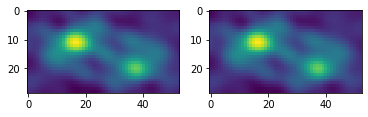

In [25]:
k = 2
plt.subplot(1, 2, 1)
plt.imshow(bdsf_intensity_cutouts[k])
plt.subplot(1, 2, 2)
plt.imshow(img_mP_I.islands[k].image)

In [26]:
from RMutils import util_RM

phis = numpy.linspace(-100, 100, 200)
freqs = numpy.loadtxt('/home/alger/possum/racs/freqs_04.txt')

In [27]:
rmsynths = []
for i, ehh in zip(tqdm(bdsf_polarised_cutouts), img_mP_I.islands):
    rmsynths.append(util_RM.do_rmsynth_planes(i.real, i.imag, (3e8 / freqs) ** 2, phis)[0])

In [28]:
# peak_pi = [r.reshape(200, -1)[abs(r.reshape(200, -1)).argmax(axis=0)].reshape(r.shape) for r in rmsynths]
peak_pi = []
for r in tqdm(rmsynths):
    peak_pos = abs(r).argmax(axis=0).ravel()
    vals = r.reshape(200, -1)
    peak_pi.append(numpy.array([val[k] for k, val in zip(peak_pos, vals.T)]).reshape(r.shape[1:]))

In [29]:
cubes = []
for i, p in zip(bdsf_intensity_cutouts, peak_pi):
    im = numpy.stack([
        i, p.real, p.imag, numpy.random.normal(scale=1e-10, size=p.real.shape)
    ])[None, :, :, :]
    cubes.append(im)

In [30]:
fits_cubes = [fits.PrimaryHDU(c, header=Q[0].header.copy()) for c, w in zip(cubes, cutout_wcss)]
for f, w in zip(fits_cubes, cutout_wcss):
    f.header.update(w.to_header())

In [31]:
for i, f in enumerate(fits_cubes):
    f.writeto('/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_{}.fits'.format(i), overwrite=True)

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_0.fits'
Image size .............................. : (19, 10) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.013 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.00422 Jy/beam
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 Jy/

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 1
Total flux density in model ............. : 0.002 Jy
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 1

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.00117 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 1


Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 1
--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 1


New sources found in PI image ........... : 1 (2 total)


Calculating polarisation properties ....  : [|-] 0/2/Calculating polarisation properties ....  : [=/] 1/2Calculating polarisation properties ....  : [==] 2/2Calculating polarisation properties ....  : [==] 2/2
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


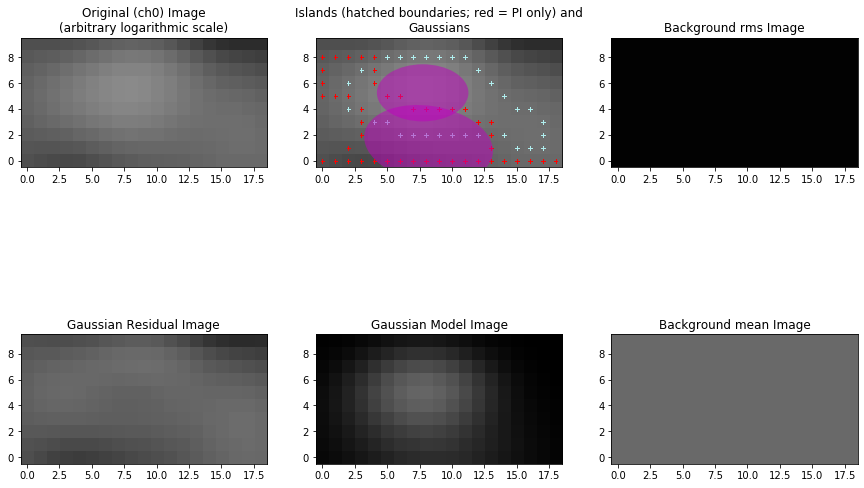

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_1.fits'
Image size .............................. : (28, 14) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.061 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.00749 Jy/beam
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 Jy/

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 1
Total flux density in model ............. : 0.023 Jy
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 1

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.00145 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 1


Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 0
--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 0
New sources found in PI image ........... : 0 (1 total)



Calculating polarisation properties ....  : [|] 0/1Calculating polarisation properties ....  : [=] 1/1Calculating polarisation properties ....  : [=] 1/1
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


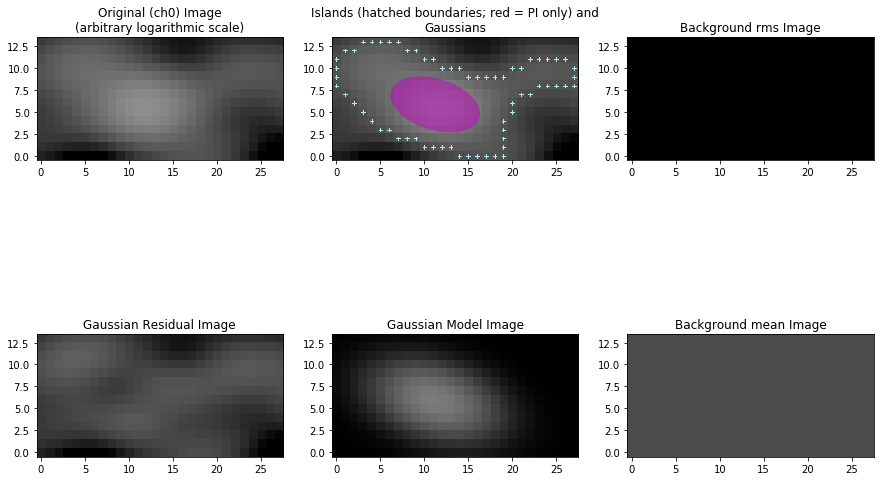

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_2.fits'
Image size .............................. : (53, 29) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.718 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 3) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.01092 Jy/beam
Derived rms_box (box size, step size) ... : (32, 3) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 Jy/

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1


Total number of Gaussians fit to image .. : 6
Total flux density in model ............. : 0.569 Jy
--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 4

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 3) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.002 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 3


Fitting islands with Gaussians .......... : [|--] 0/3/Fitting islands with Gaussians .......... : [=/-] 1/3/Fitting islands with Gaussians .......... : [=/-] 1/3Fitting islands with Gaussians .......... : [===] 3/3Fitting islands with Gaussians .......... : [===] 3/3


Total number of Gaussians fit to image .. : 2
--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 2
New sources found in PI image ........... : 0 (4 total)


Calculating polarisation properties ....  : [|---] 0/4/Calculating polarisation properties ....  : [=/--] 1/4-Calculating polarisation properties ....  : [==--] 2/4\Calculating polarisation properties ....  : [===\] 3/4Calculating polarisation properties ....  : [====] 4/4Calculating polarisation properties ....  : [====] 4/4
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


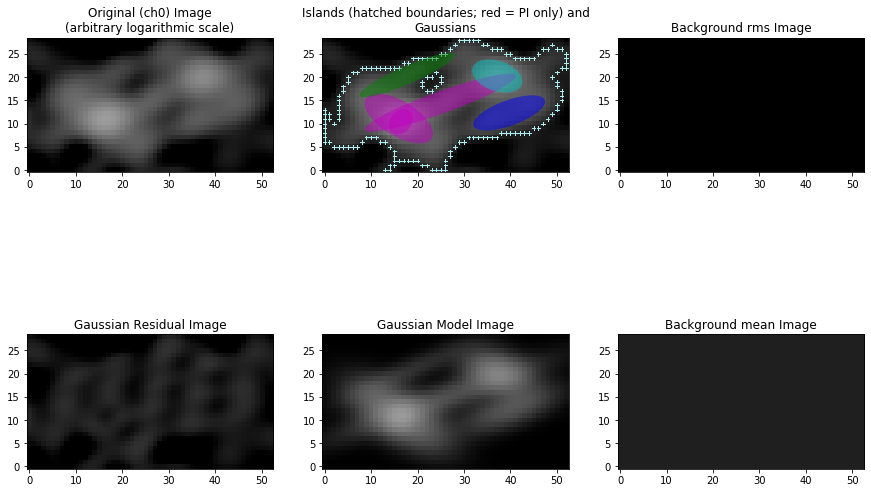

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_3.fits'
Image size .............................. : (16, 12) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.018 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.00545 Jy/beam
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 Jy/

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 1
Total flux density in model ............. : 0.005 Jy
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 1

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.0021 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 1


Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 0
--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 0


New sources found in PI image ........... : 0 (1 total)


Calculating polarisation properties ....  : [|] 0/1Calculating polarisation properties ....  : [=] 1/1Calculating polarisation properties ....  : [=] 1/1
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


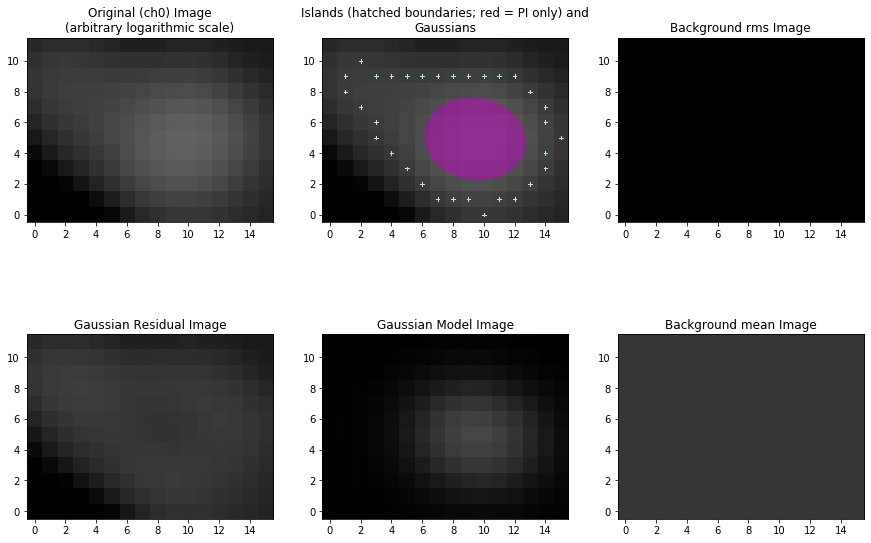

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_4.fits'
Image size .............................. : (16, 15) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.051 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.01172 Jy/beam
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 Jy/

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 1
Total flux density in model ............. : 0.016 Jy
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 1

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.00176 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 2


Fitting islands with Gaussians .......... : [|-] 0/2/Fitting islands with Gaussians .......... : [=/] 1/2Fitting islands with Gaussians .......... : [==] 2/2Fitting islands with Gaussians .......... : [==] 2/2


Total number of Gaussians fit to image .. : 0
--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 0
New sources found in PI image ........... : 0 (1 total)


Calculating polarisation properties ....  : [|] 0/1Calculating polarisation properties ....  : [=] 1/1Calculating polarisation properties ....  : [=] 1/1
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


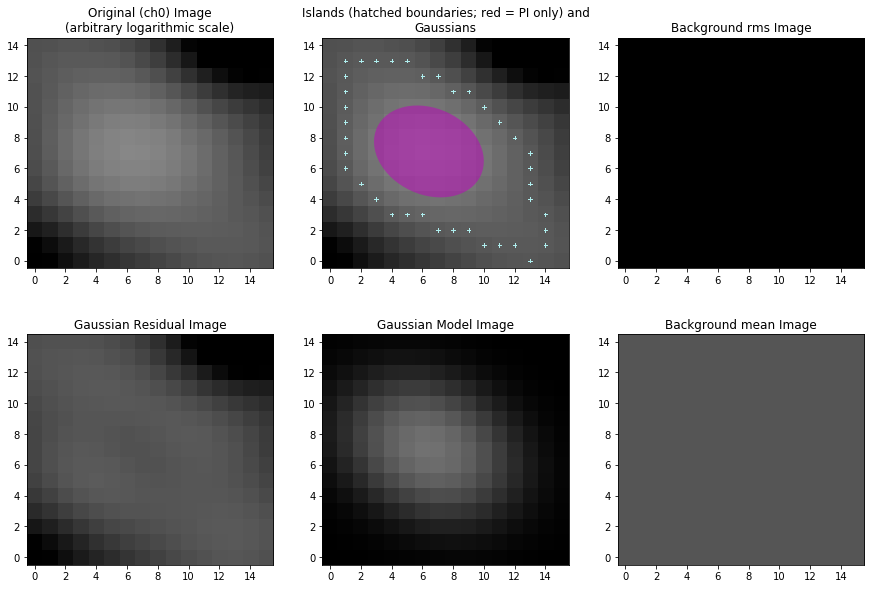

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_5.fits'
Image size .............................. : (37, 21) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.218 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.01059 Jy/beam
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 Jy/

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 1
Total flux density in model ............. : 0.114 Jy


--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 1

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.00181 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 3


Fitting islands with Gaussians .......... : [|--] 0/3/Fitting islands with Gaussians .......... : [=/-] 1/3-Fitting islands with Gaussians .......... : [==-] 2/3Fitting islands with Gaussians .......... : [===] 3/3Fitting islands with Gaussians .......... : [===] 3/3

Total number of Gaussians fit to image .. : 0
--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 0


New sources found in PI image ........... : 0 (1 total)


Calculating polarisation properties ....  : [|] 0/1Calculating polarisation properties ....  : [=] 1/1Calculating polarisation properties ....  : [=] 1/1
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


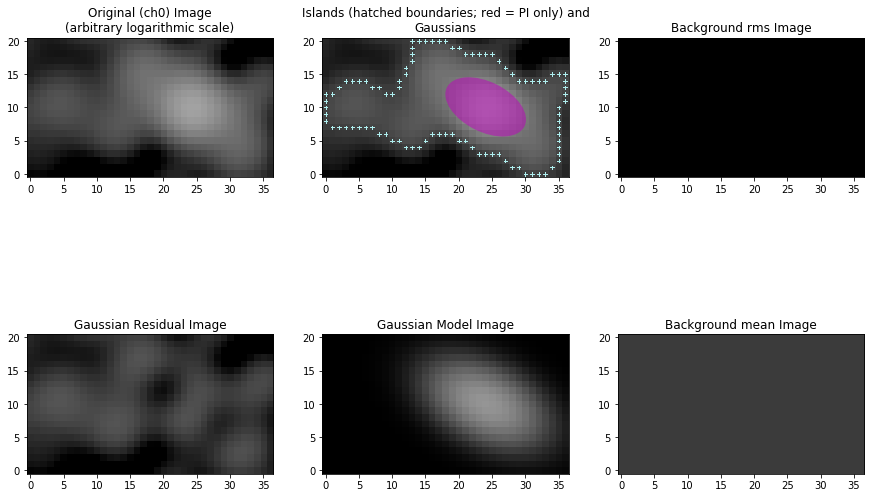

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_6.fits'
Image size .............................. : (26, 23) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.256 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.01328 Jy/beam
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 Jy/

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 3
Total flux density in model ............. : 0.175 Jy


--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 1

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.00237 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 2


Fitting islands with Gaussians .......... : [|-] 0/2/Fitting islands with Gaussians .......... : [=/] 1/2Fitting islands with Gaussians .......... : [==] 2/2Fitting islands with Gaussians .......... : [==] 2/2


Total number of Gaussians fit to image .. : 1
--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 1
New sources found in PI image ........... : 0 (1 total)


Calculating polarisation properties ....  : [|] 0/1Calculating polarisation properties ....  : [=] 1/1Calculating polarisation properties ....  : [=] 1/1
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


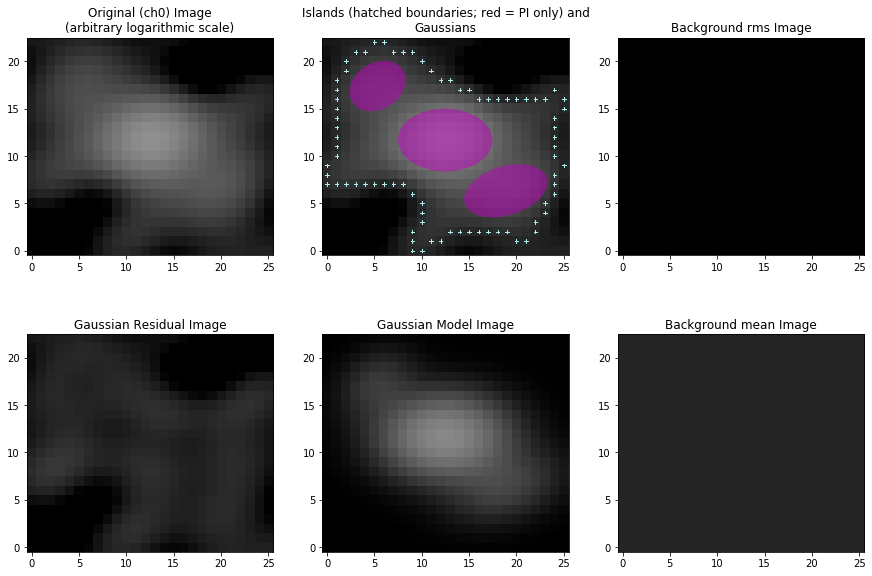

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_7.fits'
Image size .............................. : (46, 16) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.267 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.00922 Jy/beam
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 Jy/

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 2
Total flux density in model ............. : 0.192 Jy
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 2

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.00221 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 1


Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 2
--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 2


New sources found in PI image ........... : 0 (2 total)


Calculating polarisation properties ....  : [|-] 0/2/Calculating polarisation properties ....  : [=/] 1/2Calculating polarisation properties ....  : [==] 2/2Calculating polarisation properties ....  : [==] 2/2
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


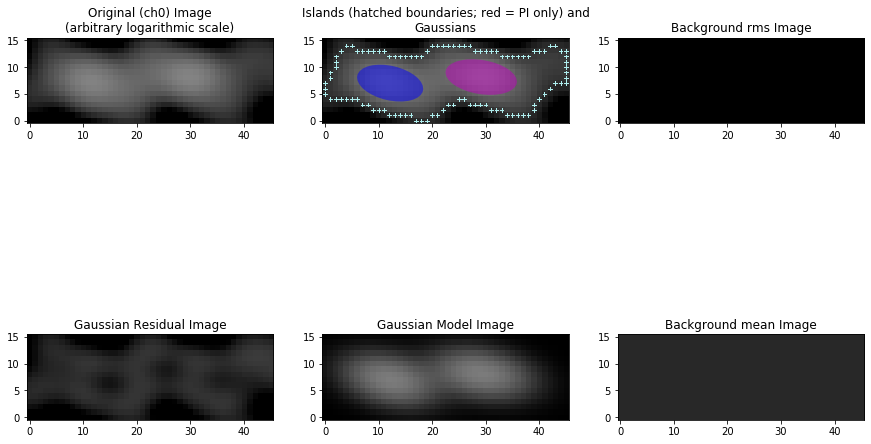

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_8.fits'
Image size .............................. : (26, 19) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.193 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.01191 Jy/beam
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 Jy/

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 2
Total flux density in model ............. : 0.122 Jy
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 1

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.00259 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 2


Fitting islands with Gaussians .......... : [|-] 0/2/Fitting islands with Gaussians .......... : [=/] 1/2Fitting islands with Gaussians .......... : [==] 2/2Fitting islands with Gaussians .......... : [==] 2/2


Total number of Gaussians fit to image .. : 0
--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 0
New sources found in PI image ........... : 0 (1 total)


Calculating polarisation properties ....  : [|] 0/1Calculating polarisation properties ....  : [=] 1/1Calculating polarisation properties ....  : [=] 1/1
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


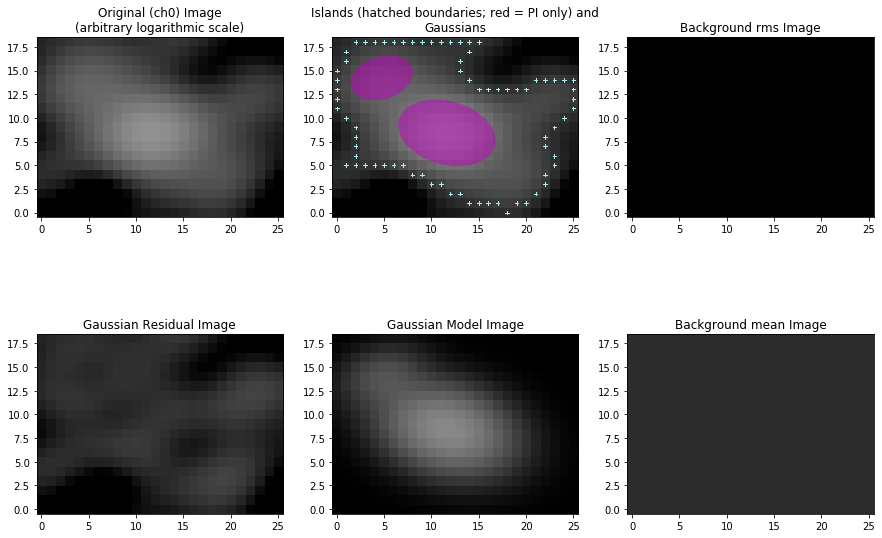

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_9.fits'
Image size .............................. : (11, 10) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.027 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.01301 Jy/beam
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 Jy/

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 1
Total flux density in model ............. : 0.006 Jy
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 1

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.00195 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 1


Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 0
--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 0
New sources found in PI image ........... : 0 (1 total)



Calculating polarisation properties ....  : [|] 0/1Calculating polarisation properties ....  : [=] 1/1Calculating polarisation properties ....  : [=] 1/1
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


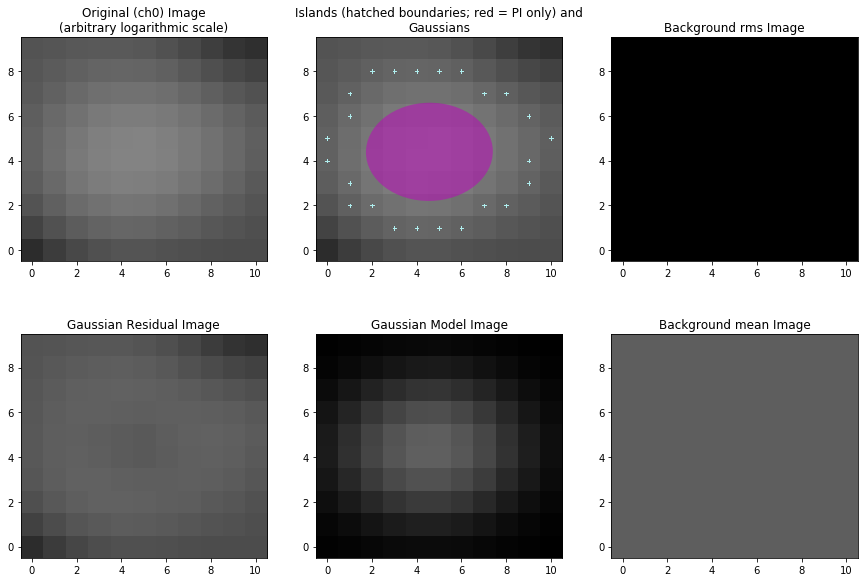

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_10.fits'
Image size .............................. : (20, 17) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.097 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.01163 Jy/beam
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 Jy

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 1
Total flux density in model ............. : 0.046 Jy
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 1

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.00214 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 2


Fitting islands with Gaussians .......... : [|-] 0/2/Fitting islands with Gaussians .......... : [=/] 1/2Fitting islands with Gaussians .......... : [==] 2/2Fitting islands with Gaussians .......... : [==] 2/2

Total number of Gaussians fit to image .. : 0


--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 0
New sources found in PI image ........... : 0 (1 total)


Calculating polarisation properties ....  : [|] 0/1Calculating polarisation properties ....  : [=] 1/1Calculating polarisation properties ....  : [=] 1/1
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


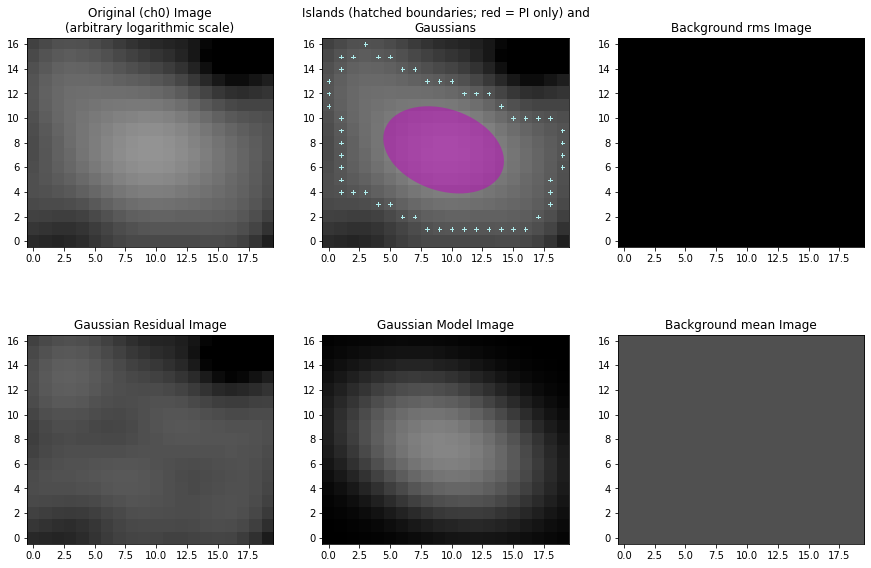

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_11.fits'
Image size .............................. : (19, 15) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.057 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.01109 Jy/beam
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 Jy

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 1
Total flux density in model ............. : 0.020 Jy
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 1

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.00211 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 2


Fitting islands with Gaussians .......... : [|-] 0/2/Fitting islands with Gaussians .......... : [=/] 1/2Fitting islands with Gaussians .......... : [==] 2/2Fitting islands with Gaussians .......... : [==] 2/2

Total number of Gaussians fit to image .. : 0
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 0
New sources found in PI image ........... : 0 (1 total)


Calculating polarisation properties ....  : [|] 0/1Calculating polarisation properties ....  : [=] 1/1Calculating polarisation properties ....  : [=] 1/1
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


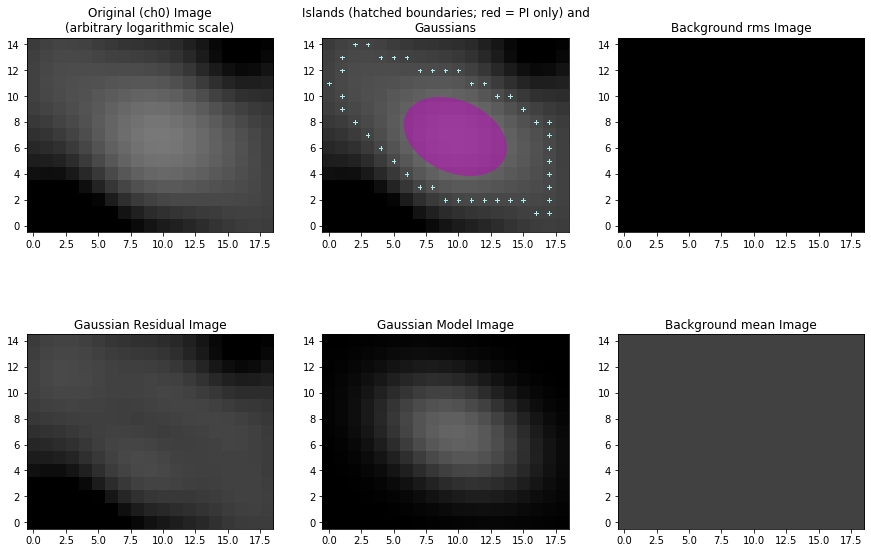

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_12.fits'
Image size .............................. : (44, 20) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.269 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.01204 Jy/beam
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 Jy

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 2
Total flux density in model ............. : 0.145 Jy
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 2

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.00217 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 6


Fitting islands with Gaussians .......... : [|-----] 0/6/Fitting islands with Gaussians .......... : [=/----] 1/6--Fitting islands with Gaussians .......... : [==----] 2/6Fitting islands with Gaussians .......... : [==----] 2/6|Fitting islands with Gaussians .......... : [====|-] 4/6|Fitting islands with Gaussians .......... : [====|-] 4/6Fitting islands with Gaussians .......... : [======] 6/6Fitting islands with Gaussians .......... : [======] 6/6

Total number of Gaussians fit to image .. : 0
--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 0


New sources found in PI image ........... : 0 (2 total)


Calculating polarisation properties ....  : [|-] 0/2/Calculating polarisation properties ....  : [=/] 1/2Calculating polarisation properties ....  : [==] 2/2Calculating polarisation properties ....  : [==] 2/2
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


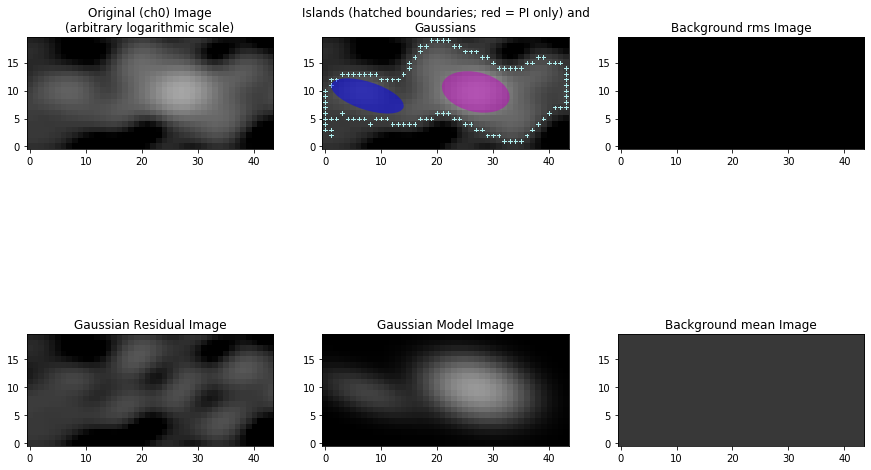

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_13.fits'
Image size .............................. : (20, 12) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.086 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.0198 Jy/beam
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 Jy/

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 1
Total flux density in model ............. : 0.019 Jy
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 1

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.00212 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 2


Fitting islands with Gaussians .......... : [|-] 0/2/Fitting islands with Gaussians .......... : [=/] 1/2Fitting islands with Gaussians .......... : [==] 2/2Fitting islands with Gaussians .......... : [==] 2/2

Total number of Gaussians fit to image .. : 0
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 0
New sources found in PI image ........... : 0 (1 total)


Calculating polarisation properties ....  : [|] 0/1Calculating polarisation properties ....  : [=] 1/1Calculating polarisation properties ....  : [=] 1/1
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


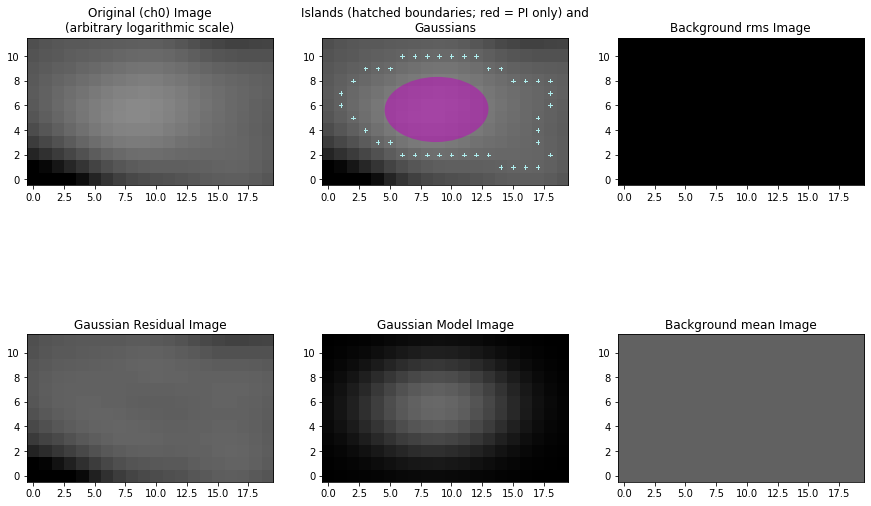

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_14.fits'
Image size .............................. : (13, 10) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.033 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.01462 Jy/beam
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 Jy

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 1
Total flux density in model ............. : 0.009 Jy
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 1

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.00235 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 1


Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 0
--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 0
New sources found in PI image ........... : 0 (1 total)



Calculating polarisation properties ....  : [|] 0/1Calculating polarisation properties ....  : [=] 1/1Calculating polarisation properties ....  : [=] 1/1
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


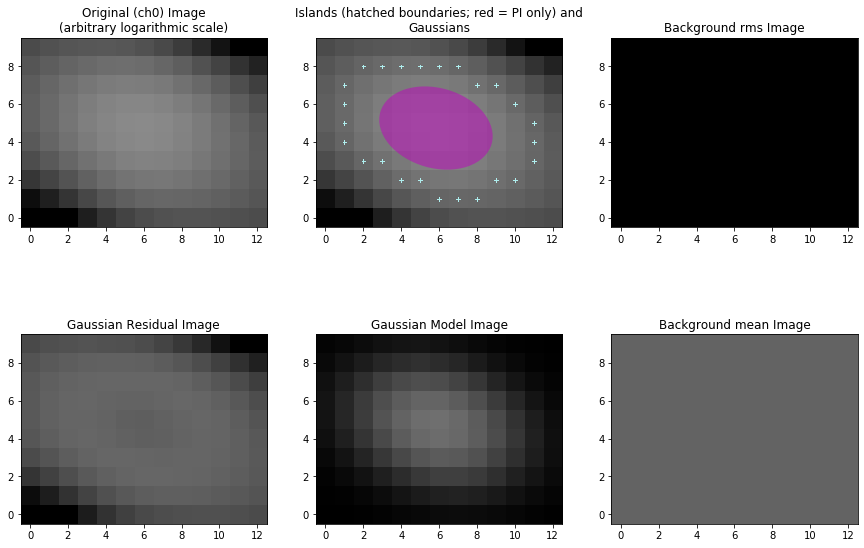

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_15.fits'
Image size .............................. : (18, 12) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.107 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.02347 Jy/beam
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 Jy

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 1
Total flux density in model ............. : 0.034 Jy
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 1

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.00225 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 2


Fitting islands with Gaussians .......... : [|-] 0/2/Fitting islands with Gaussians .......... : [=/] 1/2/Fitting islands with Gaussians .......... : [=/] 1/2Fitting islands with Gaussians .......... : [==] 2/2

Total number of Gaussians fit to image .. : 0


--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 0
New sources found in PI image ........... : 0 (1 total)


Calculating polarisation properties ....  : [|] 0/1Calculating polarisation properties ....  : [=] 1/1Calculating polarisation properties ....  : [=] 1/1
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


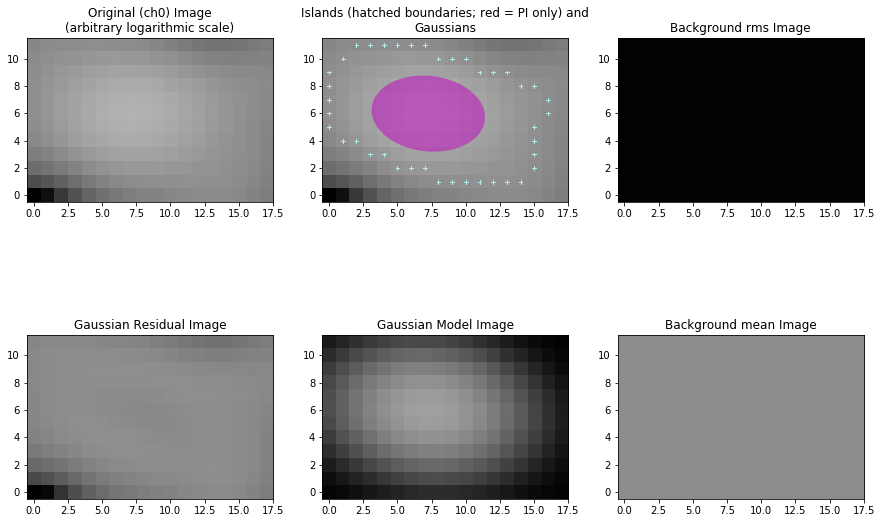

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_16.fits'
Image size .............................. : (12, 8) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.023 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.01316 Jy/beam
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 Jy/

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 1
Total flux density in model ............. : 0.006 Jy
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 1

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.00256 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 0
--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 0
New sources found in PI image ........... : 0 (1 total)


Calculating polarisation properties ....  : [|] 0/1Calculating polarisation properties ....  : [=] 1/1Calculating polarisation properties ....  : [=] 1/1
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


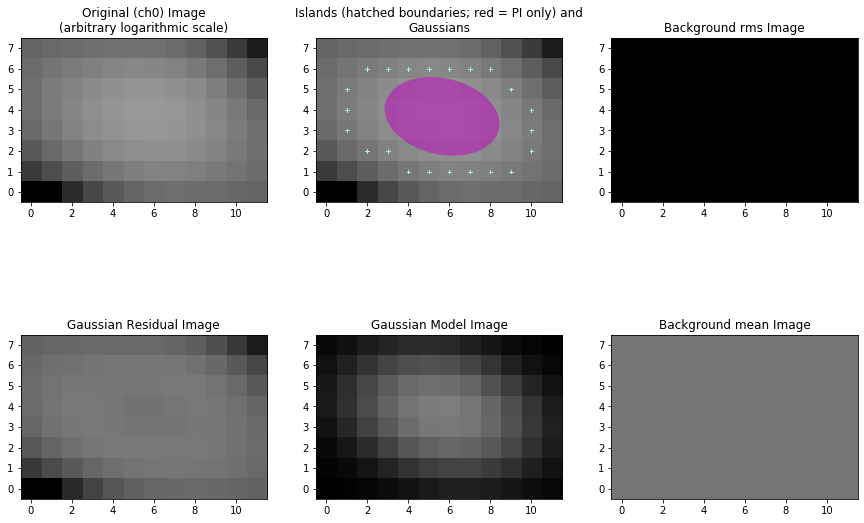

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_17.fits'
Image size .............................. : (29, 19) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.212 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.01466 Jy/beam
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 Jy

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 1
Total flux density in model ............. : 0.101 Jy
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 1

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.0023 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 3


Fitting islands with Gaussians .......... : [|--] 0/3//Fitting islands with Gaussians .......... : [=/-] 1/3Fitting islands with Gaussians .......... : [=/-] 1/3Fitting islands with Gaussians .......... : [===] 3/3Fitting islands with Gaussians .......... : [===] 3/3

Total number of Gaussians fit to image .. : 2
--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 2


New sources found in PI image ........... : 0 (1 total)


Calculating polarisation properties ....  : [|] 0/1Calculating polarisation properties ....  : [=] 1/1Calculating polarisation properties ....  : [=] 1/1
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


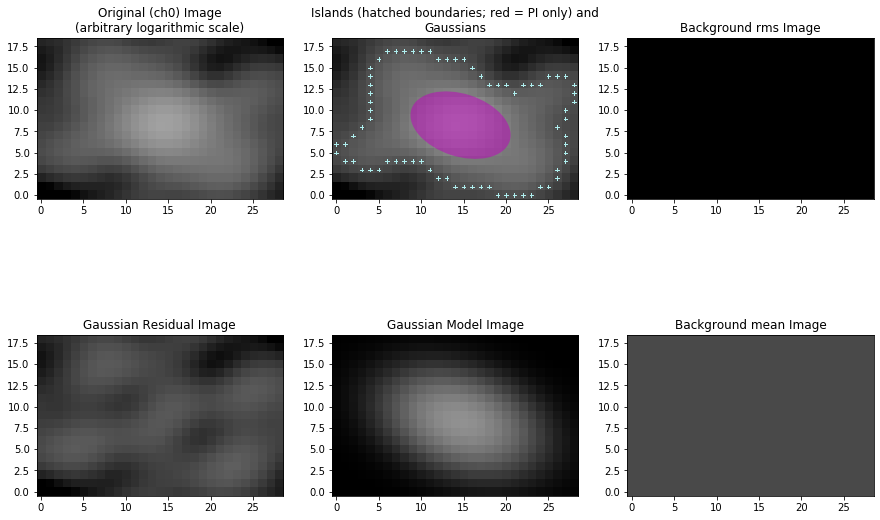

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_18.fits'
Image size .............................. : (42, 23) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.684 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.02227 Jy/beam
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 Jy

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 2
Total flux density in model ............. : 0.415 Jy


--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 1

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.00212 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 3


Fitting islands with Gaussians .......... : [|--] 0/3//Fitting islands with Gaussians .......... : [=/-] 1/3Fitting islands with Gaussians .......... : [=/-] 1/3Fitting islands with Gaussians .......... : [===] 3/3Fitting islands with Gaussians .......... : [===] 3/3


Total number of Gaussians fit to image .. : 2
--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 2
New sources found in PI image ........... : 1 (2 total)


Calculating polarisation properties ....  : [|-] 0/2/Calculating polarisation properties ....  : [=/] 1/2Calculating polarisation properties ....  : [==] 2/2Calculating polarisation properties ....  : [==] 2/2
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


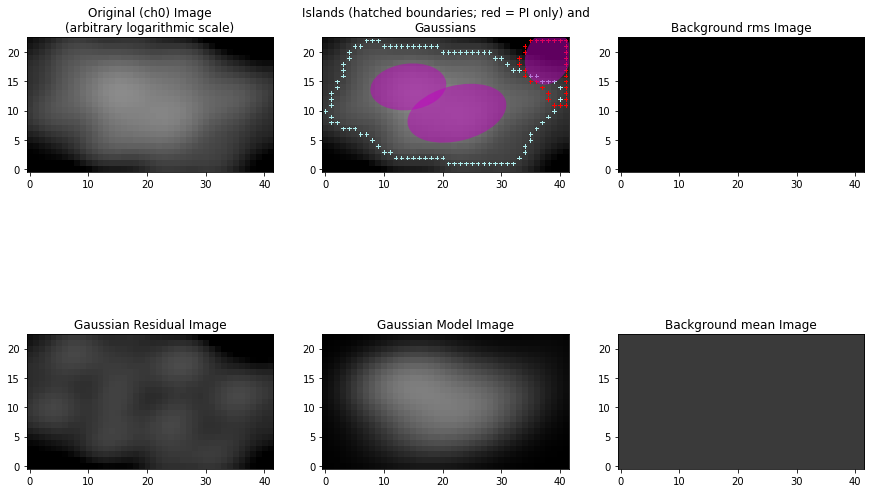

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_19.fits'
Image size .............................. : (21, 15) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.147 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.01725 Jy/beam
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 Jy

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 1
Total flux density in model ............. : 0.073 Jy
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 1

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.00197 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 1


Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 0
--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 0
New sources found in PI image ........... : 0 (1 total)



Calculating polarisation properties ....  : [|] 0/1Calculating polarisation properties ....  : [=] 1/1Calculating polarisation properties ....  : [=] 1/1
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


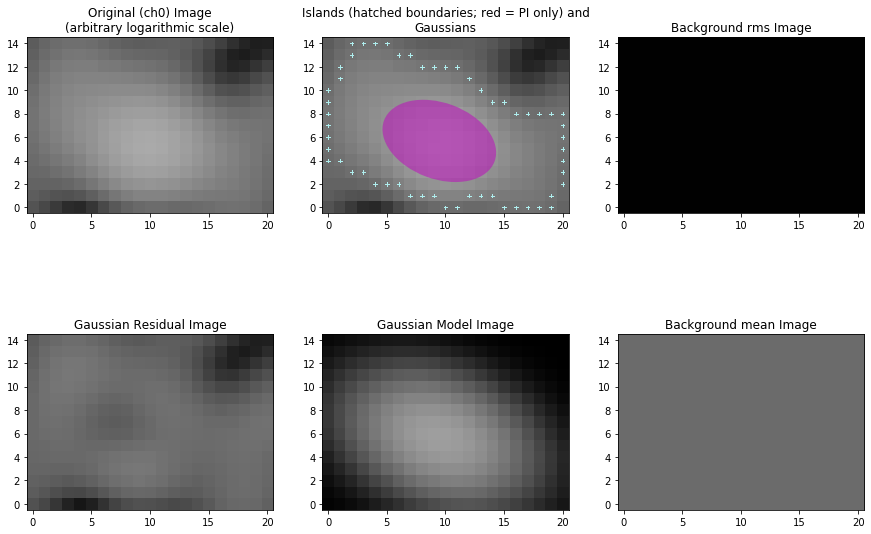

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_20.fits'
Image size .............................. : (17, 12) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.069 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.01782 Jy/beam
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 Jy

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 1
Total flux density in model ............. : 0.020 Jy
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 1

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.00195 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 1


Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 0
--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 0


New sources found in PI image ........... : 0 (1 total)


Calculating polarisation properties ....  : [|] 0/1Calculating polarisation properties ....  : [=] 1/1Calculating polarisation properties ....  : [=] 1/1
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


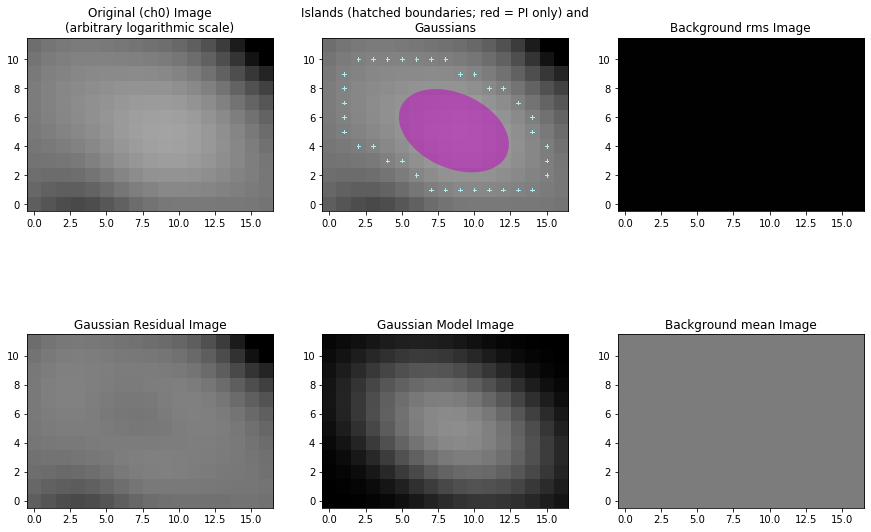

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_21.fits'
Image size .............................. : (21, 16) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.076 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.0101 Jy/beam
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 Jy/

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 1
Total flux density in model ............. : 0.029 Jy
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 1

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.00223 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 1


Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 0
--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 0
New sources found in PI image ........... : 0 (1 total)



Calculating polarisation properties ....  : [|] 0/1Calculating polarisation properties ....  : [=] 1/1Calculating polarisation properties ....  : [=] 1/1
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


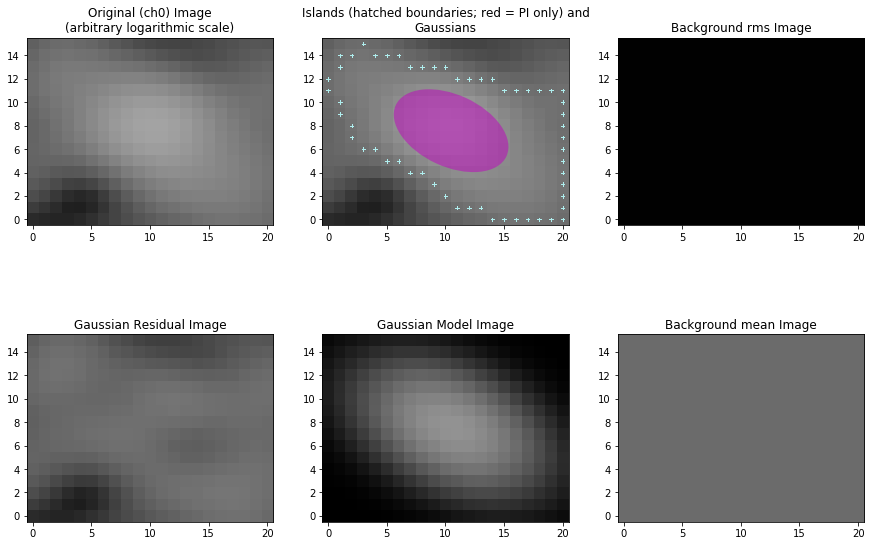

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_22.fits'
Image size .............................. : (28, 18) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.082 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.00706 Jy/beam
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 Jy

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 1
Total flux density in model ............. : 0.040 Jy
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 1

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.00241 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 2


Fitting islands with Gaussians .......... : [|-] 0/2/Fitting islands with Gaussians .......... : [=/] 1/2Fitting islands with Gaussians .......... : [==] 2/2Fitting islands with Gaussians .......... : [==] 2/2


Total number of Gaussians fit to image .. : 0
--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 0
New sources found in PI image ........... : 0 (1 total)


Calculating polarisation properties ....  : [|] 0/1Calculating polarisation properties ....  : [=] 1/1Calculating polarisation properties ....  : [=] 1/1
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


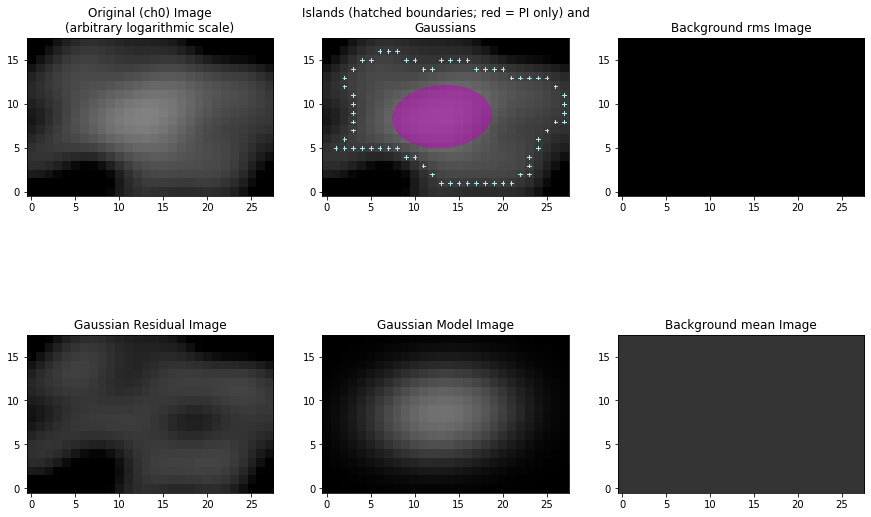

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_23.fits'
Image size .............................. : (16, 15) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.092 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.02141 Jy/beam
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 Jy

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 1
Total flux density in model ............. : 0.017 Jy
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 1

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.0027 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 1


Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 0
--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 0
New sources found in PI image ........... : 0 (1 total)



Calculating polarisation properties ....  : [|] 0/1Calculating polarisation properties ....  : [=] 1/1Calculating polarisation properties ....  : [=] 1/1
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


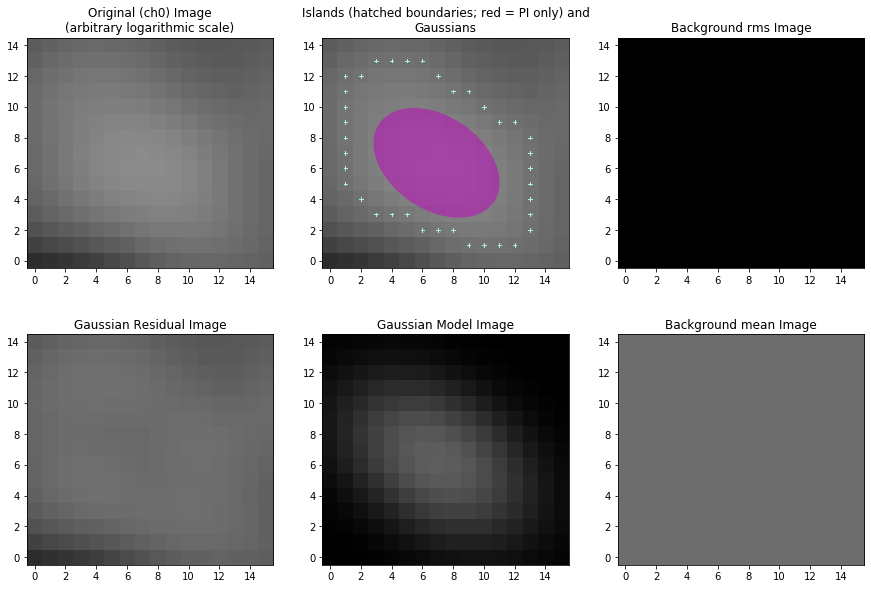

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_24.fits'
Image size .............................. : (48, 21) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.283 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.00778 Jy/beam
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 Jy

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 5
Total flux density in model ............. : 0.194 Jy


--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 2

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.00209 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 3


Fitting islands with Gaussians .......... : [|--] 0/3//Fitting islands with Gaussians .......... : [=/-] 1/3Fitting islands with Gaussians .......... : [=/-] 1/3Fitting islands with Gaussians .......... : [===] 3/3Fitting islands with Gaussians .......... : [===] 3/3

Total number of Gaussians fit to image .. : 0
--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 0


New sources found in PI image ........... : 0 (2 total)


Calculating polarisation properties ....  : [|-] 0/2/Calculating polarisation properties ....  : [=/] 1/2Calculating polarisation properties ....  : [==] 2/2Calculating polarisation properties ....  : [==] 2/2
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


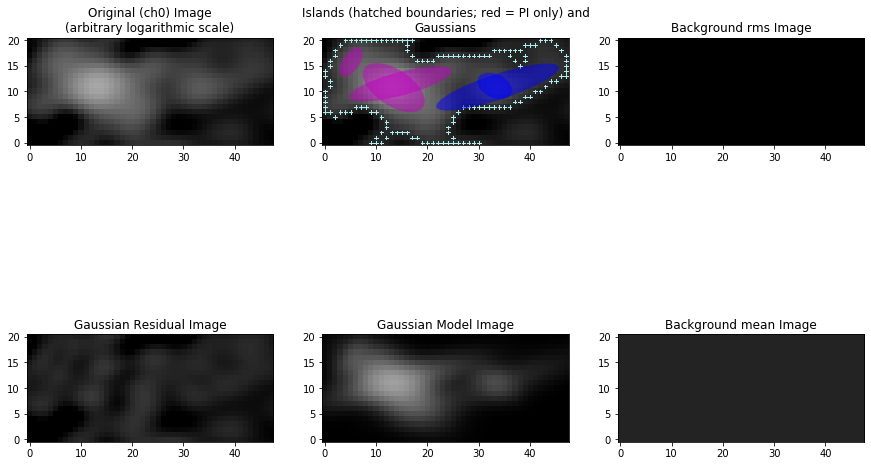

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_25.fits'
Image size .............................. : (39, 16) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.186 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.0145 Jy/beam
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 Jy/

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 1
Total flux density in model ............. : 0.063 Jy
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 1

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.00203 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 2


Fitting islands with Gaussians .......... : [|-] 0/2/Fitting islands with Gaussians .......... : [=/] 1/2Fitting islands with Gaussians .......... : [==] 2/2Fitting islands with Gaussians .......... : [==] 2/2


Total number of Gaussians fit to image .. : 0
--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 0
New sources found in PI image ........... : 0 (1 total)


Calculating polarisation properties ....  : [|] 0/1Calculating polarisation properties ....  : [=] 1/1Calculating polarisation properties ....  : [=] 1/1
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


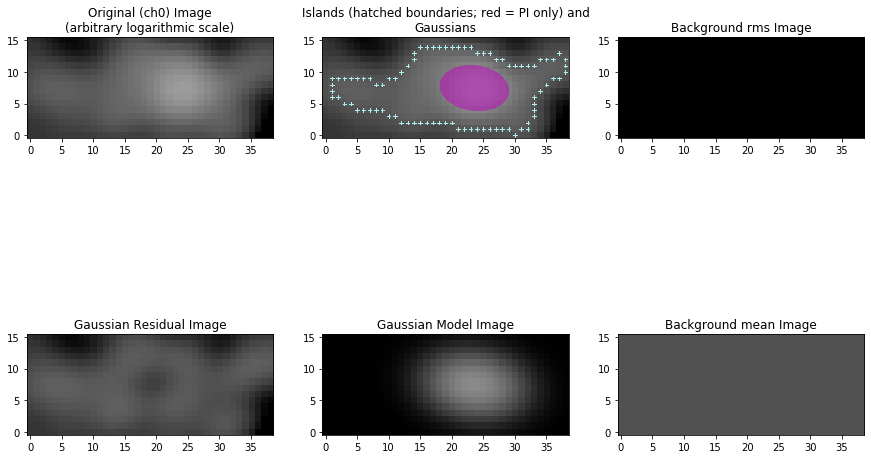

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_26.fits'
Image size .............................. : (19, 15) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.114 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.01892 Jy/beam
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 Jy

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 1
Total flux density in model ............. : 0.035 Jy
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 1

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.00193 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 2


Fitting islands with Gaussians .......... : [|-] 0/2/Fitting islands with Gaussians .......... : [=/] 1/2Fitting islands with Gaussians .......... : [==] 2/2Fitting islands with Gaussians .......... : [==] 2/2


Total number of Gaussians fit to image .. : 0
--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 0
New sources found in PI image ........... : 0 (1 total)


Calculating polarisation properties ....  : [|] 0/1Calculating polarisation properties ....  : [=] 1/1Calculating polarisation properties ....  : [=] 1/1
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


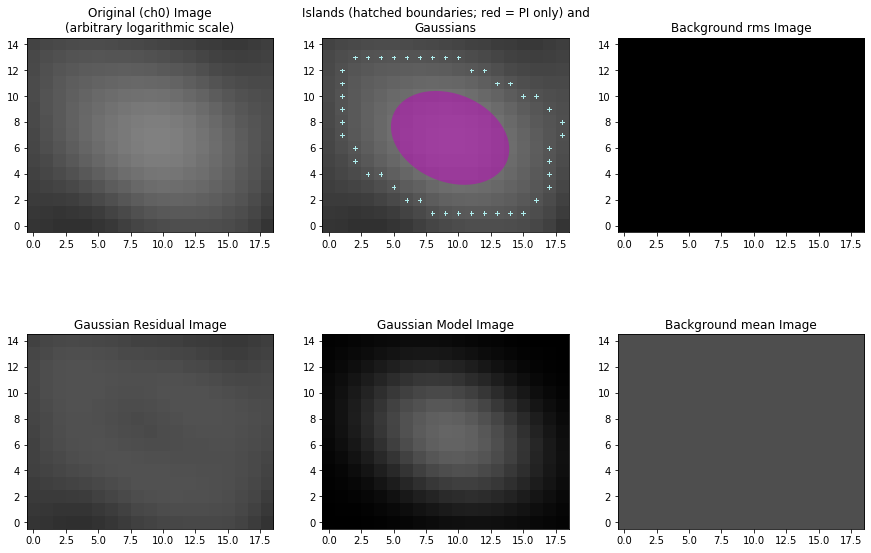

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_27.fits'
Image size .............................. : (16, 16) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.091 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.02134 Jy/beam
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 Jy

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 0
Total flux density in model ............. : 0.000 Jy
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 0
    Island #0 (x=8, y=5)
Please check this island. If it is a valid island and
should be fit, try adjusting the flagging options (use
show_fit with "ch0_flagged=True" to see the flagged Gaussians)
or enabling the wavelet module (with "atrous_do=True").
To include empty islands in output source catalogs, set
incl_empty=True in the write_catalog task.

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.00247 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 1


Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 0
--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 0


--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_28.fits'
Image size .............................. : (45, 26) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 2.036 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (41, 3) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.01434 Jy/beam
Derived rms_box (box size, step size) ... : (41, 3) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 Jy

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1


Total number of Gaussians fit to image .. : 5
Total flux density in model ............. : 1.883 Jy
--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 1

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (61, 3) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.00223 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 3


Fitting islands with Gaussians .......... : [|--] 0/3/Fitting islands with Gaussians .......... : [=/-] 1/3-Fitting islands with Gaussians .......... : [==-] 2/3Fitting islands with Gaussians .......... : [===] 3/3Fitting islands with Gaussians .......... : [===] 3/3

Total number of Gaussians fit to image .. : 3
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 1
New sources found in PI image ........... : 0 (1 total)


Calculating polarisation properties ....  : [|] 0/1Calculating polarisation properties ....  : [=] 1/1Calculating polarisation properties ....  : [=] 1/1
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


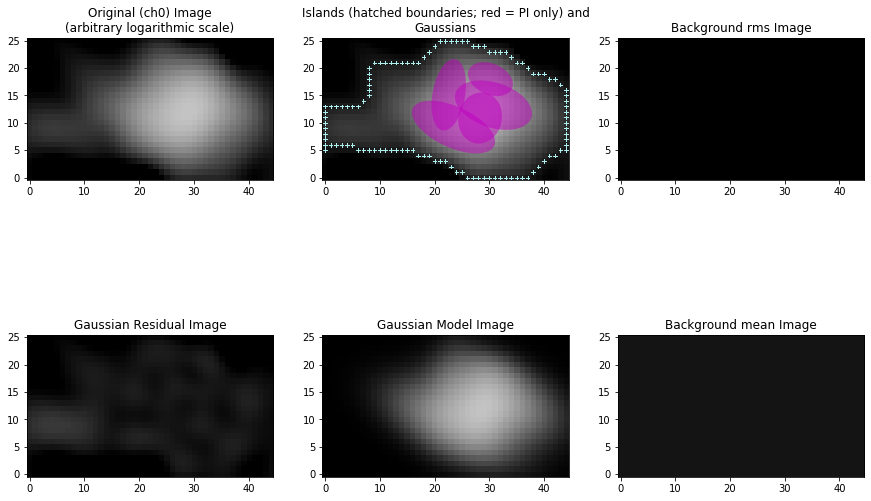

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_29.fits'
Image size .............................. : (16, 12) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.041 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.01299 Jy/beam
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 Jy

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 1
Total flux density in model ............. : 0.010 Jy
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 1

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.00197 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 1


Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 0
--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 0


New sources found in PI image ........... : 0 (1 total)


Calculating polarisation properties ....  : [|] 0/1Calculating polarisation properties ....  : [=] 1/1Calculating polarisation properties ....  : [=] 1/1
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


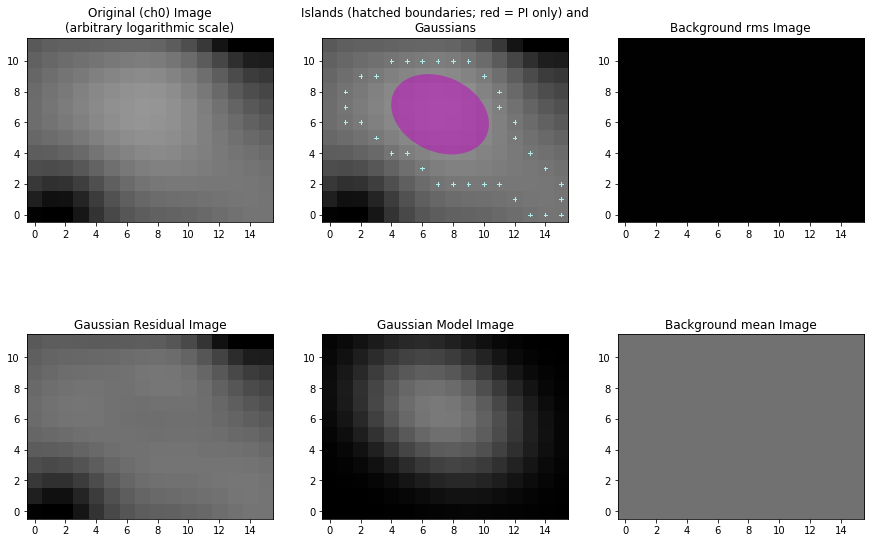

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_30.fits'
Image size .............................. : (23, 29) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.101 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.00843 Jy/beam
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 Jy

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 1
Total flux density in model ............. : 0.031 Jy
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 1

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.00241 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 3


Fitting islands with Gaussians .......... : [|--] 0/3/Fitting islands with Gaussians .......... : [=/-] 1/3-Fitting islands with Gaussians .......... : [==-] 2/3Fitting islands with Gaussians .......... : [===] 3/3Fitting islands with Gaussians .......... : [===] 3/3

Total number of Gaussians fit to image .. : 0
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 0
New sources found in PI image ........... : 0 (1 total)


Calculating polarisation properties ....  : [|] 0/1Calculating polarisation properties ....  : [=] 1/1Calculating polarisation properties ....  : [=] 1/1
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


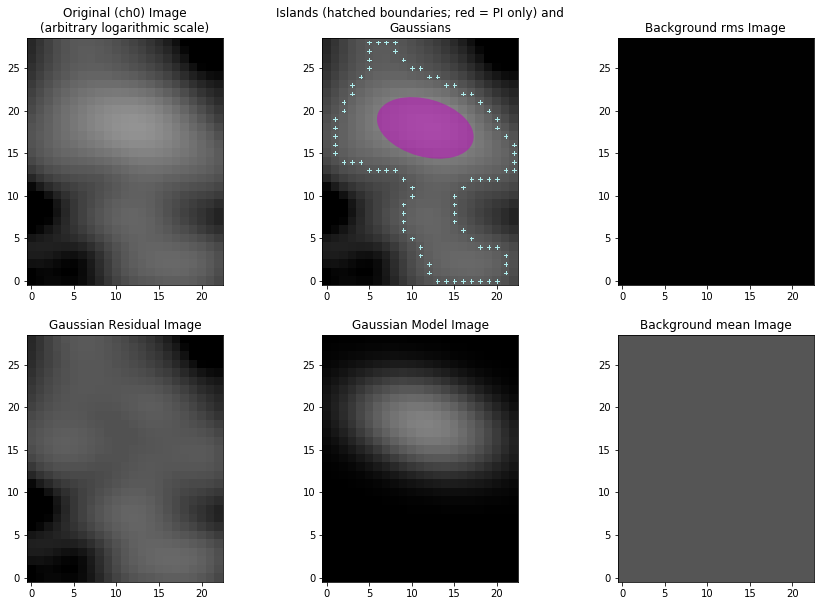

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_31.fits'
Image size .............................. : (28, 26) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.496 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 3) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.01617 Jy/beam
Derived rms_box (box size, step size) ... : (32, 3) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 Jy

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 1
Total flux density in model ............. : 0.355 Jy
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 1

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 3) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.00206 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 2


Fitting islands with Gaussians .......... : [|-] 0/2/Fitting islands with Gaussians .......... : [=/] 1/2Fitting islands with Gaussians .......... : [==] 2/2Fitting islands with Gaussians .......... : [==] 2/2

Total number of Gaussians fit to image .. : 0
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 0
New sources found in PI image ........... : 0 (1 total)


Calculating polarisation properties ....  : [|] 0/1Calculating polarisation properties ....  : [=] 1/1Calculating polarisation properties ....  : [=] 1/1
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


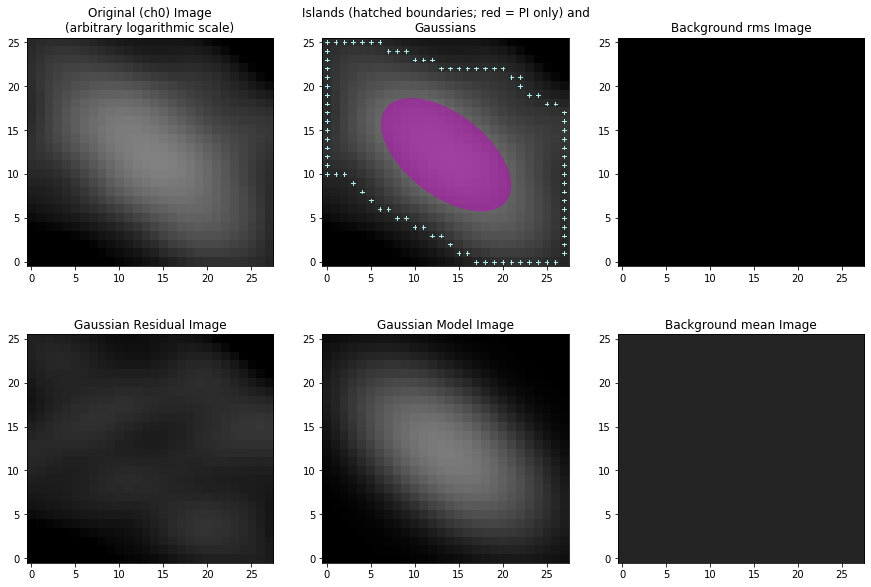

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_32.fits'
Image size .............................. : (21, 15) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.102 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.01499 Jy/beam
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 Jy

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 1
Total flux density in model ............. : 0.038 Jy
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 1

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.00182 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 1


Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 0


--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 0
New sources found in PI image ........... : 0 (1 total)


Calculating polarisation properties ....  : [|] 0/1Calculating polarisation properties ....  : [=] 1/1Calculating polarisation properties ....  : [=] 1/1
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


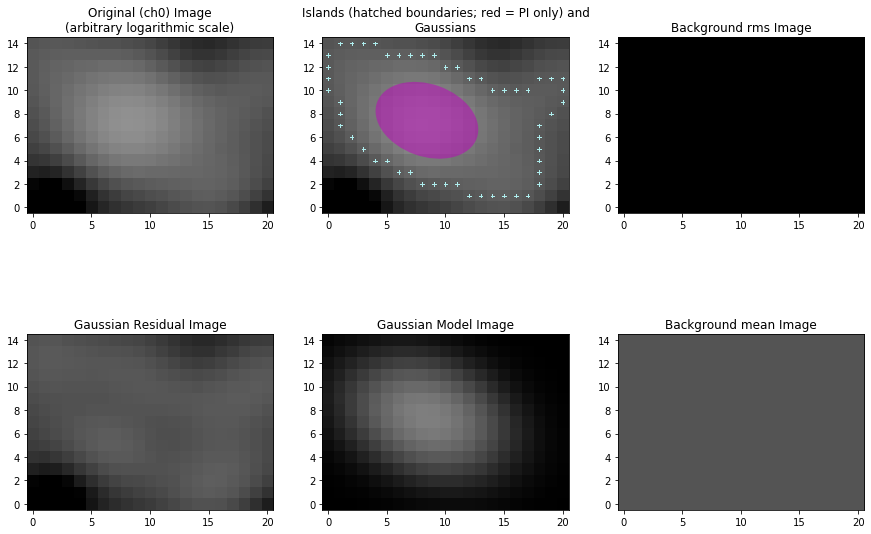

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_33.fits'
Image size .............................. : (15, 9) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.023 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.00942 Jy/beam
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 Jy/

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 1
Total flux density in model ............. : 0.005 Jy
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 1

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.00191 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 1


Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 0
--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 0


New sources found in PI image ........... : 0 (1 total)


Calculating polarisation properties ....  : [|] 0/1Calculating polarisation properties ....  : [=] 1/1Calculating polarisation properties ....  : [=] 1/1
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


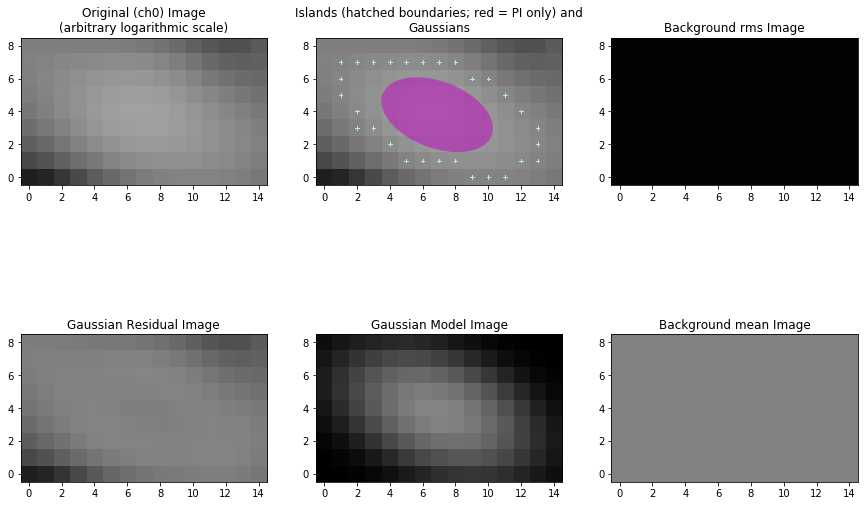

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_34.fits'
Image size .............................. : (42, 17) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.203 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.01196 Jy/beam
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 Jy

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 1
Total flux density in model ............. : 0.114 Jy
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 1

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.00206 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 2


Fitting islands with Gaussians .......... : [|-] 0/2/Fitting islands with Gaussians .......... : [=/] 1/2Fitting islands with Gaussians .......... : [==] 2/2Fitting islands with Gaussians .......... : [==] 2/2

Total number of Gaussians fit to image .. : 0
--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 0


New sources found in PI image ........... : 0 (1 total)


Calculating polarisation properties ....  : [|] 0/1Calculating polarisation properties ....  : [=] 1/1Calculating polarisation properties ....  : [=] 1/1
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


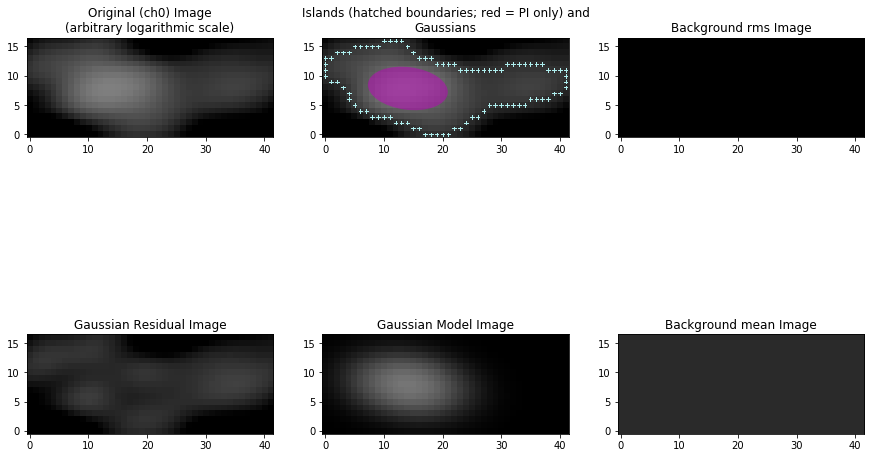

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_35.fits'
Image size .............................. : (24, 20) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.150 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.01177 Jy/beam
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 Jy

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 2
Total flux density in model ............. : 0.082 Jy


--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 2

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.00199 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 2


Fitting islands with Gaussians .......... : [|-] 0/2/Fitting islands with Gaussians .......... : [=/] 1/2Fitting islands with Gaussians .......... : [==] 2/2Fitting islands with Gaussians .......... : [==] 2/2

Total number of Gaussians fit to image .. : 1
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 1
New sources found in PI image ........... : 0 (2 total)


Calculating polarisation properties ....  : [|-] 0/2/Calculating polarisation properties ....  : [=/] 1/2Calculating polarisation properties ....  : [==] 2/2Calculating polarisation properties ....  : [==] 2/2
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


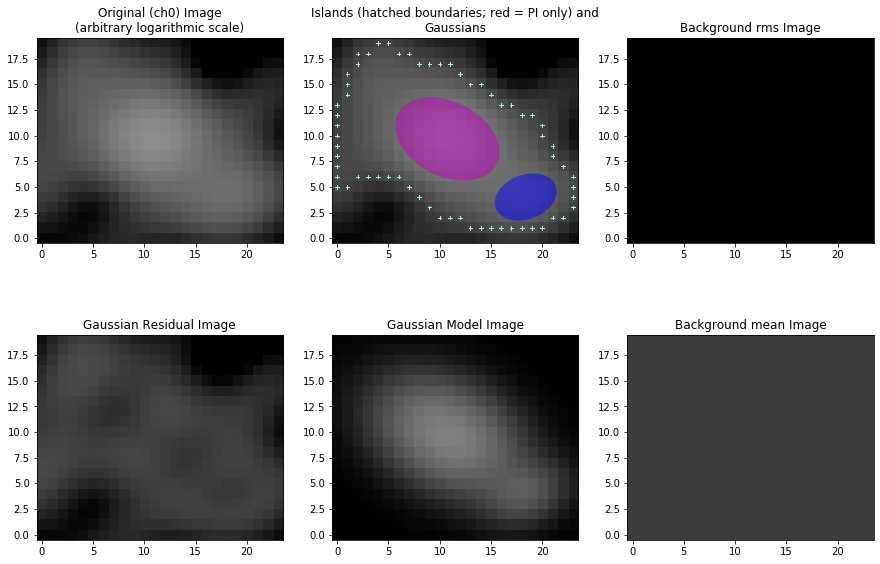

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_36.fits'
Image size .............................. : (21, 17) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.083 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.00816 Jy/beam
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 Jy

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 1
Total flux density in model ............. : 0.046 Jy
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 1

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.00228 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 1


Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 0
--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 0


New sources found in PI image ........... : 0 (1 total)


Calculating polarisation properties ....  : [|] 0/1Calculating polarisation properties ....  : [=] 1/1Calculating polarisation properties ....  : [=] 1/1
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


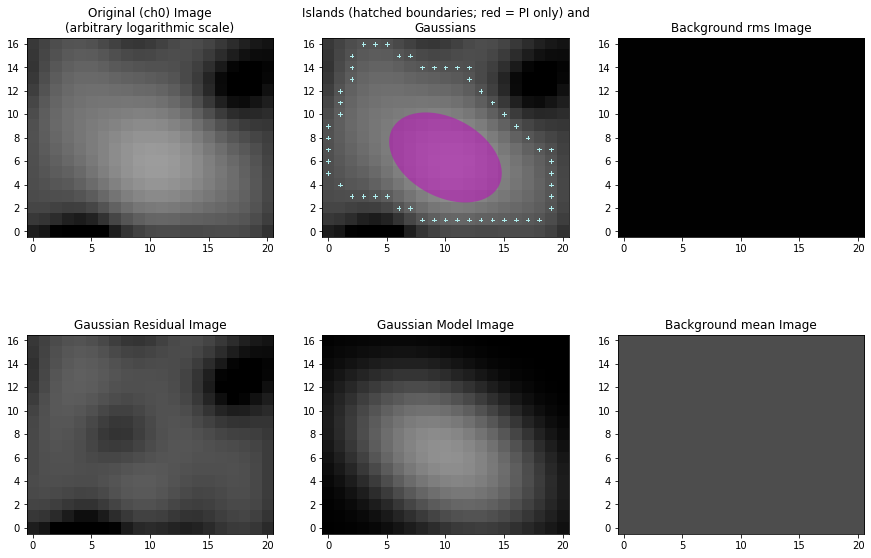

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_37.fits'
Image size .............................. : (13, 10) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.013 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.00582 Jy/beam
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 Jy

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 1
Total flux density in model ............. : 0.002 Jy
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 1

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.00146 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 1


Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 1
--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 1


New sources found in PI image ........... : 0 (1 total)


Calculating polarisation properties ....  : [|] 0/1Calculating polarisation properties ....  : [=] 1/1Calculating polarisation properties ....  : [=] 1/1
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


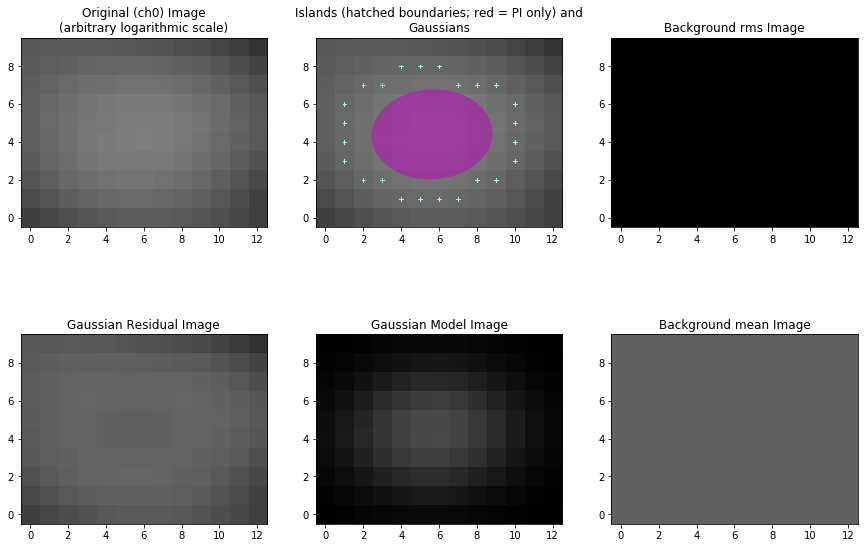

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_38.fits'
Image size .............................. : (25, 19) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.093 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.00541 Jy/beam
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 Jy

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 3
Total flux density in model ............. : 0.068 Jy
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 1

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.00229 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 2


Fitting islands with Gaussians .......... : [|-] 0/2/Fitting islands with Gaussians .......... : [=/] 1/2Fitting islands with Gaussians .......... : [==] 2/2Fitting islands with Gaussians .......... : [==] 2/2

Total number of Gaussians fit to image .. : 0


--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 0
New sources found in PI image ........... : 0 (1 total)


Calculating polarisation properties ....  : [|] 0/1Calculating polarisation properties ....  : [=] 1/1Calculating polarisation properties ....  : [=] 1/1
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


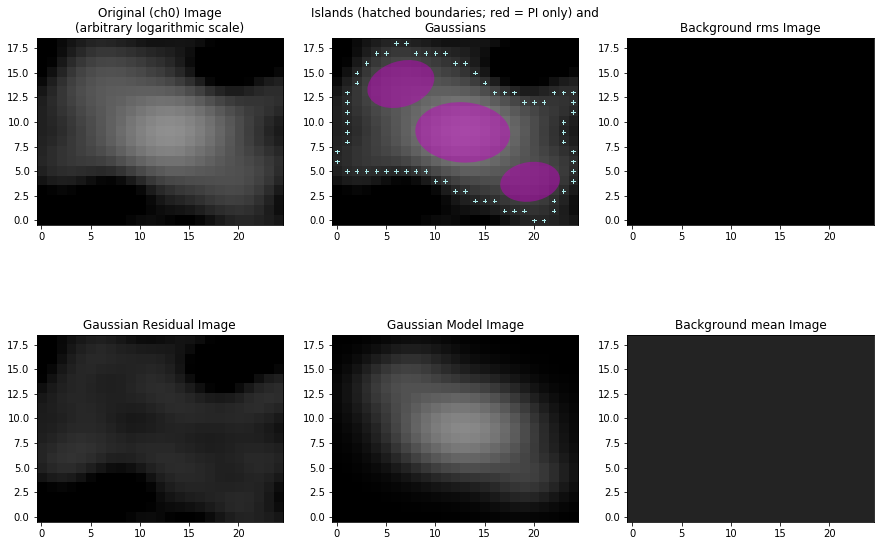

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_39.fits'
Image size .............................. : (30, 20) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.869 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.02668 Jy/beam
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 Jy

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 3
Total flux density in model ............. : 0.720 Jy


--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 1

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.00216 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 1


Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 2


--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 1
New sources found in PI image ........... : 0 (1 total)


Calculating polarisation properties ....  : [|] 0/1Calculating polarisation properties ....  : [=] 1/1Calculating polarisation properties ....  : [=] 1/1
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


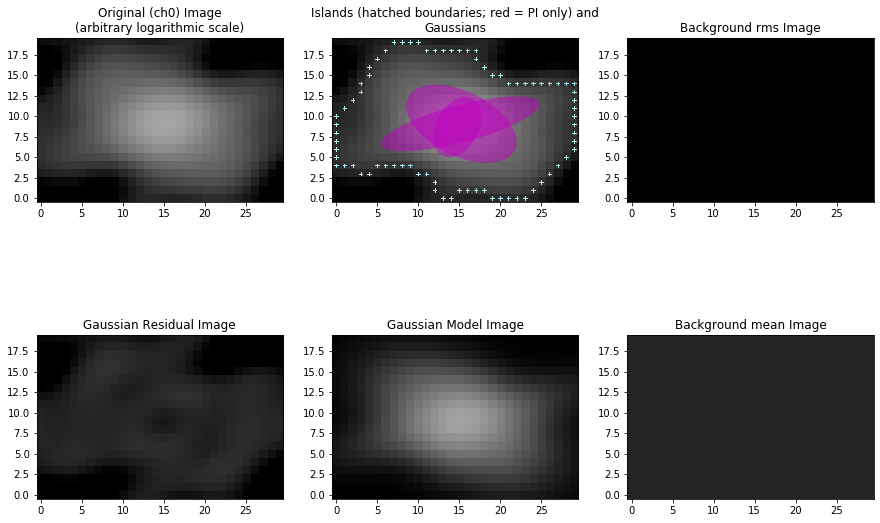

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_40.fits'
Image size .............................. : (27, 26) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.213 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 3) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.01195 Jy/beam
Derived rms_box (box size, step size) ... : (32, 3) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 Jy

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 1
Total flux density in model ............. : 0.143 Jy


--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 1

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 3) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.00216 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 3


Fitting islands with Gaussians .......... : [|--] 0/3//Fitting islands with Gaussians .......... : [=/-] 1/3Fitting islands with Gaussians .......... : [=/-] 1/3Fitting islands with Gaussians .......... : [===] 3/3Fitting islands with Gaussians .......... : [===] 3/3


Total number of Gaussians fit to image .. : 1
--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 1
New sources found in PI image ........... : 0 (1 total)


Calculating polarisation properties ....  : [|] 0/1Calculating polarisation properties ....  : [=] 1/1Calculating polarisation properties ....  : [=] 1/1
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


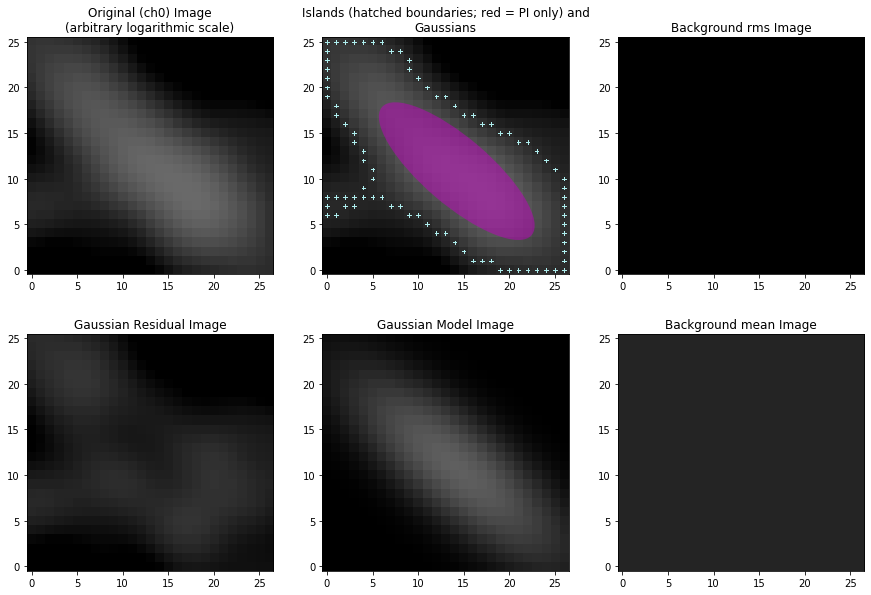

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_41.fits'
Image size .............................. : (21, 15) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.129 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.01561 Jy/beam
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 Jy

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 1
Total flux density in model ............. : 0.065 Jy


--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 1

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.00248 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 2


Fitting islands with Gaussians .......... : [|-] 0/2/Fitting islands with Gaussians .......... : [=/] 1/2Fitting islands with Gaussians .......... : [==] 2/2Fitting islands with Gaussians .......... : [==] 2/2


Total number of Gaussians fit to image .. : 0
--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 0
New sources found in PI image ........... : 0 (1 total)


Calculating polarisation properties ....  : [|] 0/1Calculating polarisation properties ....  : [=] 1/1Calculating polarisation properties ....  : [=] 1/1
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


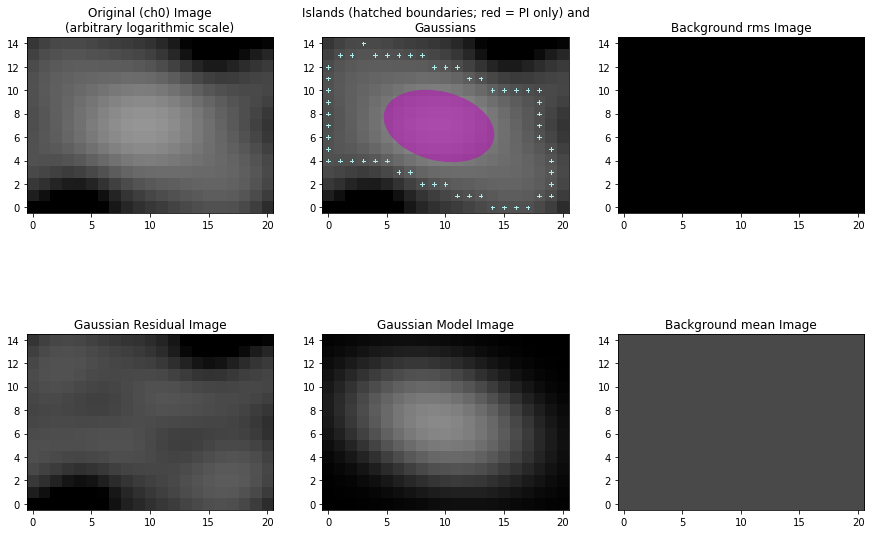

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_42.fits'
Image size .............................. : (32, 19) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 1.096 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.01966 Jy/beam
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 Jy

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 2
Total flux density in model ............. : 0.929 Jy
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 1

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.00226 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 1


Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 1
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 1
New sources found in PI image ........... : 0 (1 total)


Calculating polarisation properties ....  : [|] 0/1Calculating polarisation properties ....  : [=] 1/1Calculating polarisation properties ....  : [=] 1/1
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


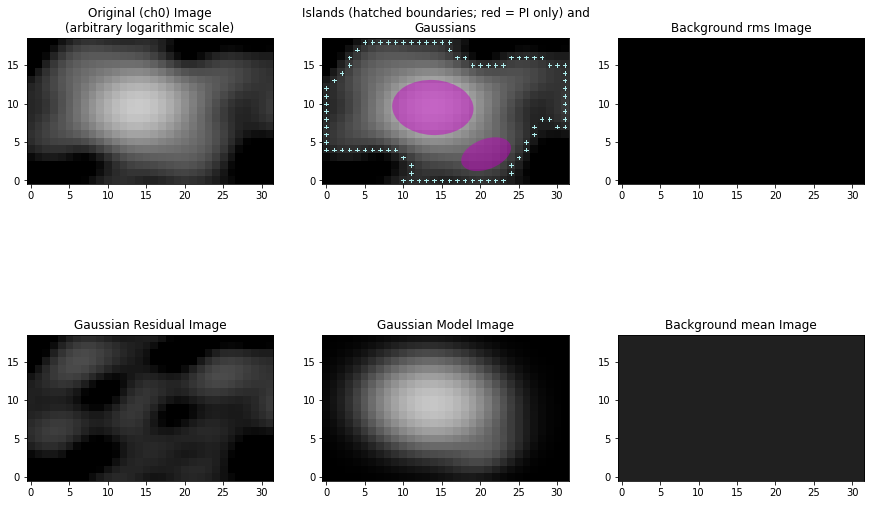

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_43.fits'
Image size .............................. : (28, 20) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.472 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.02263 Jy/beam
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 Jy

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 2
Total flux density in model ............. : 0.337 Jy
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 1

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.00224 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 2


Fitting islands with Gaussians .......... : [|-] 0/2/Fitting islands with Gaussians .......... : [=/] 1/2Fitting islands with Gaussians .......... : [==] 2/2Fitting islands with Gaussians .......... : [==] 2/2


Total number of Gaussians fit to image .. : 1
--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 1
New sources found in PI image ........... : 0 (1 total)


Calculating polarisation properties ....  : [|] 0/1Calculating polarisation properties ....  : [=] 1/1Calculating polarisation properties ....  : [=] 1/1
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


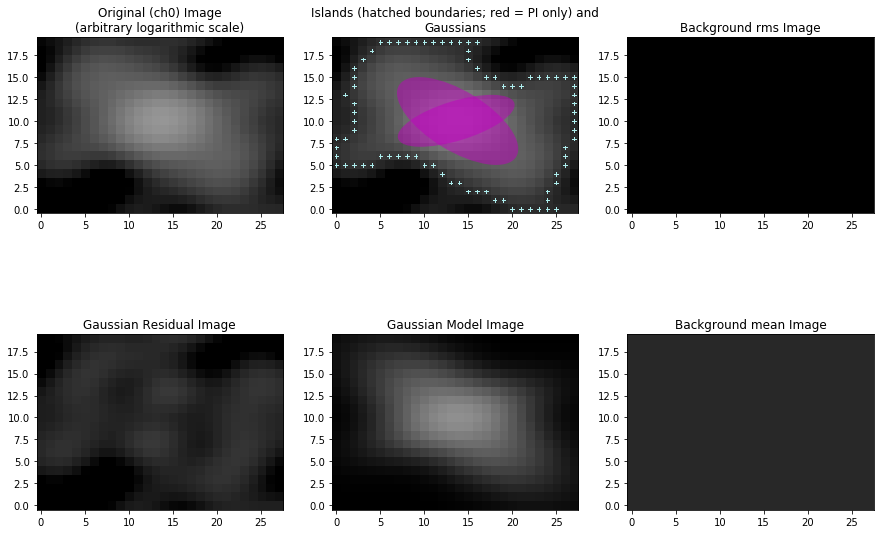

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_44.fits'
Image size .............................. : (40, 24) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 1.165 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (51, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.00836 Jy/beam
Derived rms_box (box size, step size) ... : (51, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 Jy

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1


Total number of Gaussians fit to image .. : 11
Total flux density in model ............. : 1.156 Jy
--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 4

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.00199 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 2


Fitting islands with Gaussians .......... : [|-] 0/2/Fitting islands with Gaussians .......... : [=/] 1/2Fitting islands with Gaussians .......... : [==] 2/2Fitting islands with Gaussians .......... : [==] 2/2


Total number of Gaussians fit to image .. : 1
--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 1
New sources found in PI image ........... : 0 (4 total)


Calculating polarisation properties ....  : [|---] 0/4/Calculating polarisation properties ....  : [=/--] 1/4-Calculating polarisation properties ....  : [==--] 2/4\Calculating polarisation properties ....  : [===\] 3/4Calculating polarisation properties ....  : [====] 4/4Calculating polarisation properties ....  : [====] 4/4
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


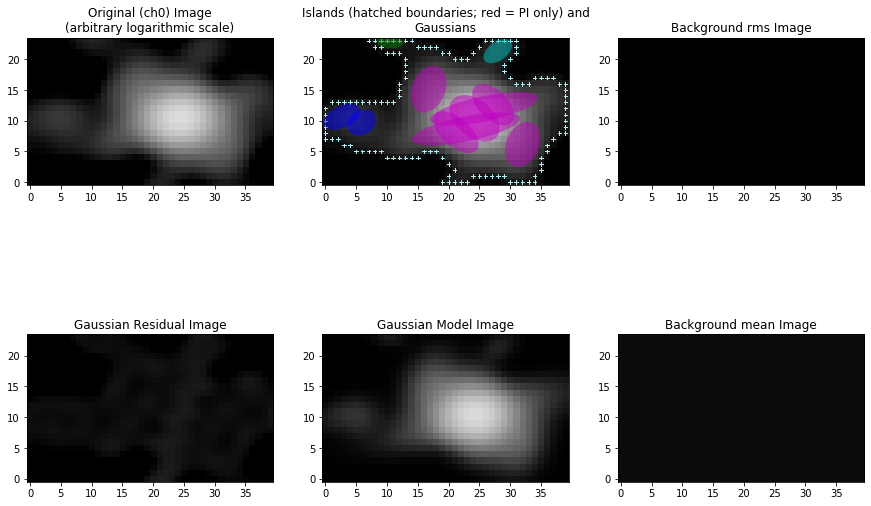

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_45.fits'
Image size .............................. : (21, 15) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.137 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.02157 Jy/beam
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 Jy

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 1
Total flux density in model ............. : 0.057 Jy
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 1

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.00184 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 1


Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 0
--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 0
New sources found in PI image ........... : 0 (1 total)



Calculating polarisation properties ....  : [|] 0/1Calculating polarisation properties ....  : [=] 1/1Calculating polarisation properties ....  : [=] 1/1
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


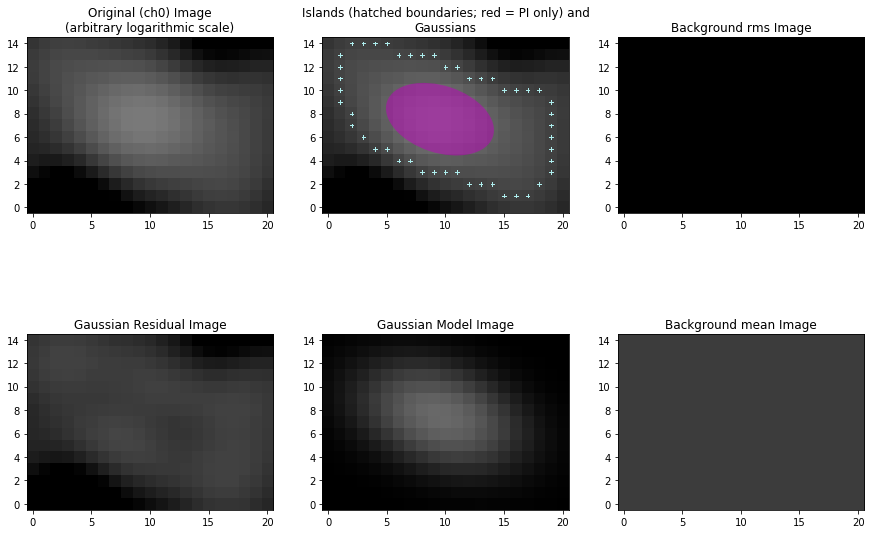

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_46.fits'
Image size .............................. : (42, 21) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.219 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.00851 Jy/beam
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 Jy

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1


Total number of Gaussians fit to image .. : 2
Total flux density in model ............. : 0.134 Jy
--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 1

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.00191 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 1


Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 1
--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 1


New sources found in PI image ........... : 0 (1 total)


Calculating polarisation properties ....  : [|] 0/1Calculating polarisation properties ....  : [=] 1/1Calculating polarisation properties ....  : [=] 1/1
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


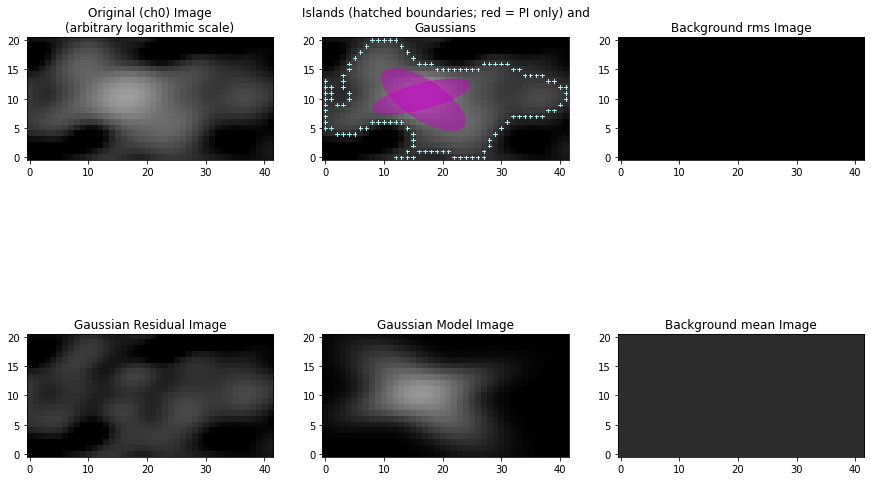

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_47.fits'
Image size .............................. : (25, 20) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.223 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.0151 Jy/beam
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 Jy/

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 1
Total flux density in model ............. : 0.129 Jy
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 1

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.00292 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 2


Fitting islands with Gaussians .......... : [|-] 0/2/Fitting islands with Gaussians .......... : [=/] 1/2Fitting islands with Gaussians .......... : [==] 2/2Fitting islands with Gaussians .......... : [==] 2/2


Total number of Gaussians fit to image .. : 0
--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 0
New sources found in PI image ........... : 0 (1 total)


Calculating polarisation properties ....  : [|] 0/1Calculating polarisation properties ....  : [=] 1/1Calculating polarisation properties ....  : [=] 1/1
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


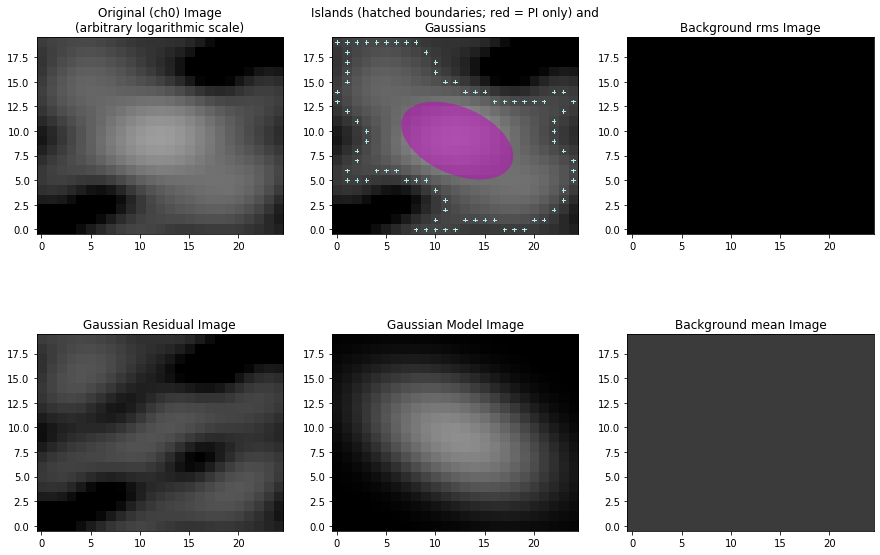

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_48.fits'
Image size .............................. : (41, 26) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 1.457 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (65, 3) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.00352 Jy/beam
Derived rms_box (box size, step size) ... : (65, 3) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 Jy

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1


Total number of Gaussians fit to image .. : 17
Total flux density in model ............. : 1.453 Jy
--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 2

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 3) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.0022 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 3


Fitting islands with Gaussians .......... : [|--] 0/3/Fitting islands with Gaussians .......... : [=/-] 1/3/Fitting islands with Gaussians .......... : [=/-] 1/3Fitting islands with Gaussians .......... : [===] 3/3Fitting islands with Gaussians .......... : [===] 3/3

Total number of Gaussians fit to image .. : 1
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 1
New sources found in PI image ........... : 0 (2 total)


Calculating polarisation properties ....  : [|-] 0/2/Calculating polarisation properties ....  : [=/] 1/2Calculating polarisation properties ....  : [==] 2/2Calculating polarisation properties ....  : [==] 2/2
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


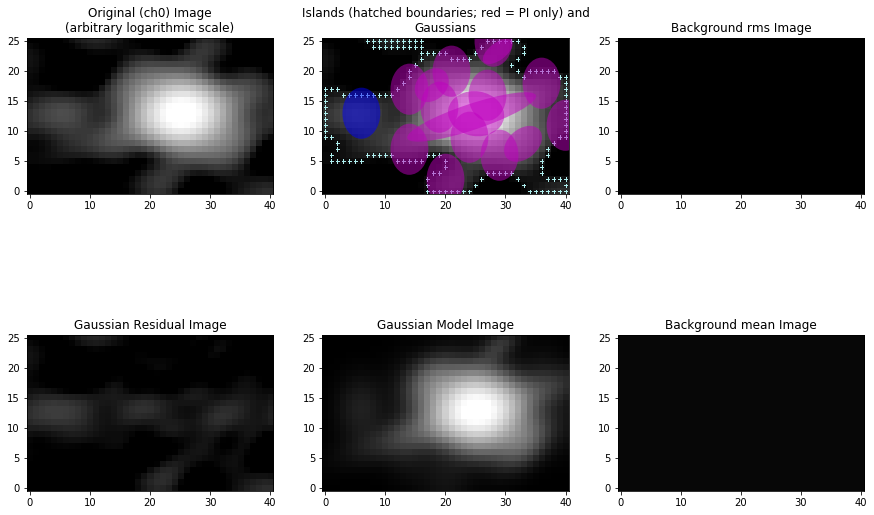

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_49.fits'
Image size .............................. : (18, 13) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.145 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.026 Jy/beam
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 Jy/b

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 1
Total flux density in model ............. : 0.070 Jy


--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 1

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.00286 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 1


Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 1
--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 1


New sources found in PI image ........... : 0 (1 total)


Calculating polarisation properties ....  : [|] 0/1Calculating polarisation properties ....  : [=] 1/1Calculating polarisation properties ....  : [=] 1/1
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


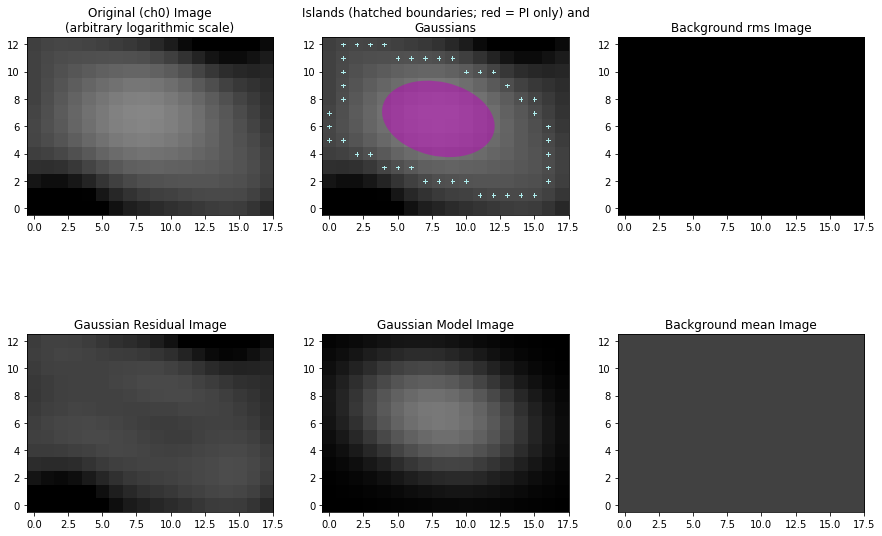

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_50.fits'
Image size .............................. : (25, 18) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.254 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.01893 Jy/beam
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 Jy

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 1
Total flux density in model ............. : 0.153 Jy
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 1

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.00212 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 2


Fitting islands with Gaussians .......... : [|-] 0/2/Fitting islands with Gaussians .......... : [=/] 1/2Fitting islands with Gaussians .......... : [==] 2/2Fitting islands with Gaussians .......... : [==] 2/2


Total number of Gaussians fit to image .. : 0
--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 0
New sources found in PI image ........... : 0 (1 total)


Calculating polarisation properties ....  : [|] 0/1Calculating polarisation properties ....  : [=] 1/1Calculating polarisation properties ....  : [=] 1/1
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


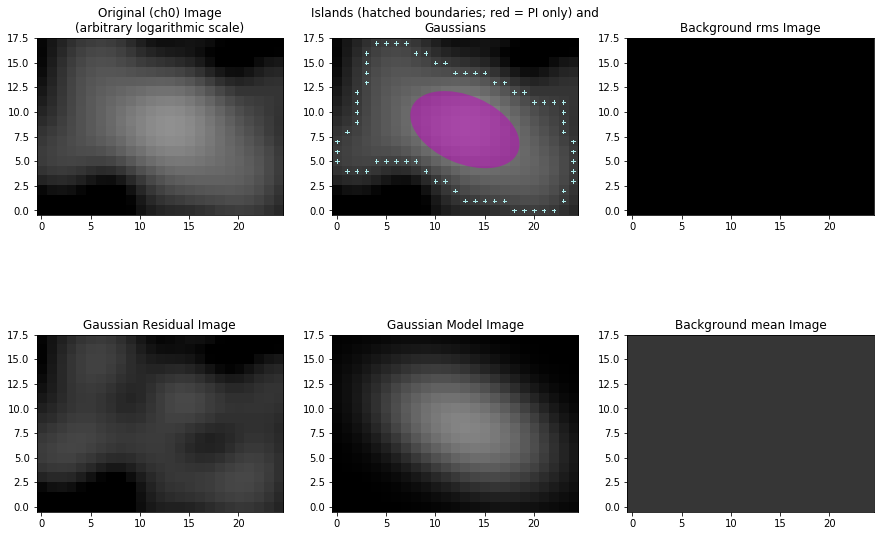

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_51.fits'
Image size .............................. : (11, 8) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.051 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.03202 Jy/beam
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 Jy/

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 1
Total flux density in model ............. : 0.010 Jy
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 1

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.00239 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 1


Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 0
--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 0


New sources found in PI image ........... : 0 (1 total)


Calculating polarisation properties ....  : [|] 0/1Calculating polarisation properties ....  : [=] 1/1Calculating polarisation properties ....  : [=] 1/1
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


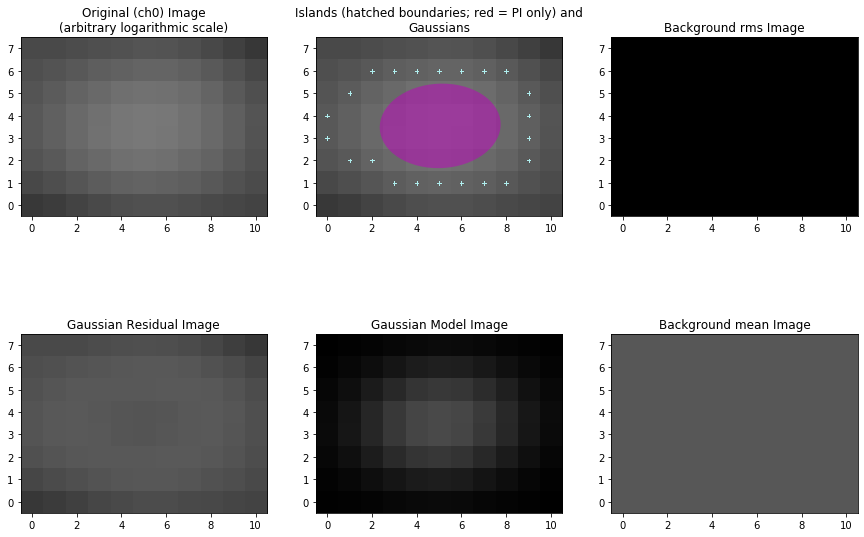

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_52.fits'
Image size .............................. : (24, 15) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.141 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.01934 Jy/beam
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 Jy

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 1
Total flux density in model ............. : 0.045 Jy


--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 1

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.00219 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 3


Fitting islands with Gaussians .......... : [|--] 0/3//Fitting islands with Gaussians .......... : [=/-] 1/3Fitting islands with Gaussians .......... : [=/-] 1/3Fitting islands with Gaussians .......... : [===] 3/3Fitting islands with Gaussians .......... : [===] 3/3

Total number of Gaussians fit to image .. : 0
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 0
New sources found in PI image ........... : 0 (1 total)


Calculating polarisation properties ....  : [|] 0/1Calculating polarisation properties ....  : [=] 1/1Calculating polarisation properties ....  : [=] 1/1
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


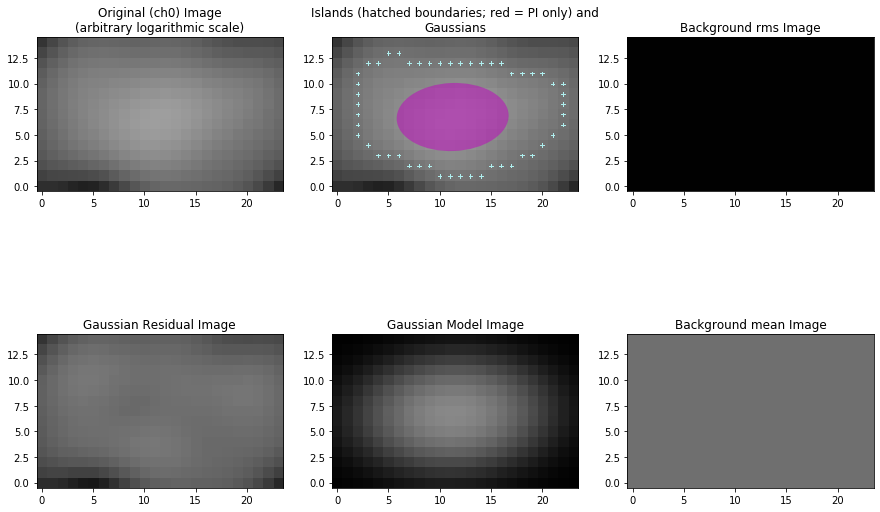

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_53.fits'
Image size .............................. : (20, 12) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.125 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.02538 Jy/beam
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 Jy

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 1
Total flux density in model ............. : 0.042 Jy
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 1

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.00206 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 2


Fitting islands with Gaussians .......... : [|-] 0/2/Fitting islands with Gaussians .......... : [=/] 1/2Fitting islands with Gaussians .......... : [==] 2/2Fitting islands with Gaussians .......... : [==] 2/2


Total number of Gaussians fit to image .. : 0
--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 0
New sources found in PI image ........... : 0 (1 total)


Calculating polarisation properties ....  : [|] 0/1Calculating polarisation properties ....  : [=] 1/1Calculating polarisation properties ....  : [=] 1/1
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


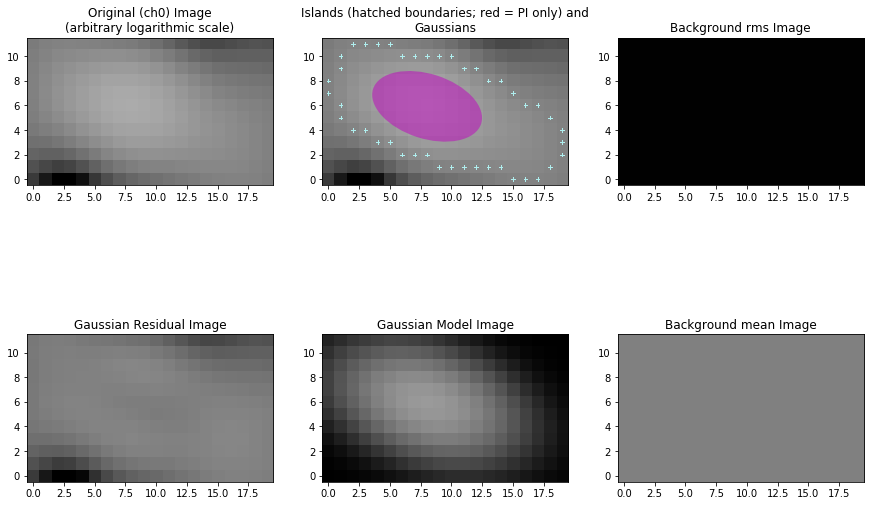

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_54.fits'
Image size .............................. : (23, 18) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.163 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.01427 Jy/beam
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 Jy

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 1
Total flux density in model ............. : 0.101 Jy
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 1

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.00183 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 1


Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 1
--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 1


New sources found in PI image ........... : 0 (1 total)


Calculating polarisation properties ....  : [|] 0/1Calculating polarisation properties ....  : [=] 1/1Calculating polarisation properties ....  : [=] 1/1
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


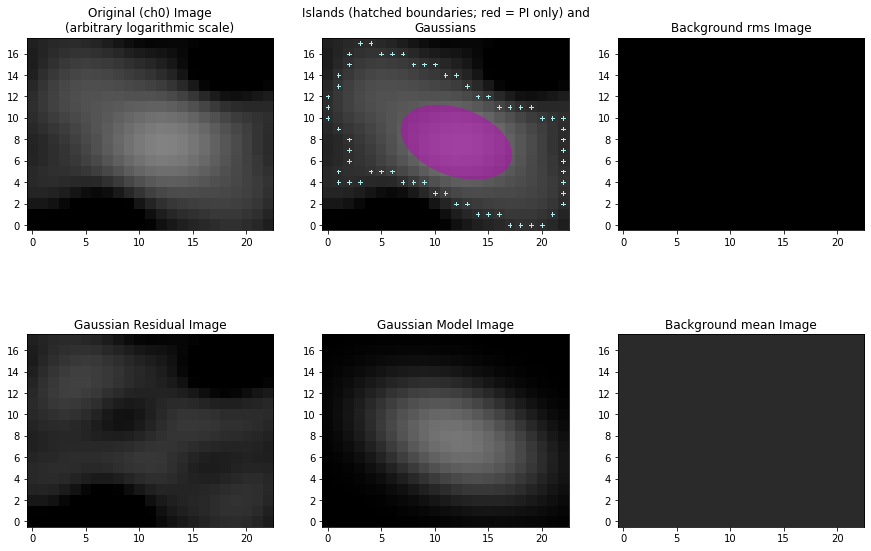

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_55.fits'
Image size .............................. : (28, 22) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.320 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.01007 Jy/beam
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 Jy

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 2
Total flux density in model ............. : 0.264 Jy
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 1

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.0019 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 3


Fitting islands with Gaussians .......... : [|--] 0/3/Fitting islands with Gaussians .......... : [=/-] 1/3-Fitting islands with Gaussians .......... : [==-] 2/3Fitting islands with Gaussians .......... : [===] 3/3Fitting islands with Gaussians .......... : [===] 3/3

Total number of Gaussians fit to image .. : 1


--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 1
New sources found in PI image ........... : 1 (2 total)


Calculating polarisation properties ....  : [|-] 0/2/Calculating polarisation properties ....  : [=/] 1/2Calculating polarisation properties ....  : [==] 2/2Calculating polarisation properties ....  : [==] 2/2
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


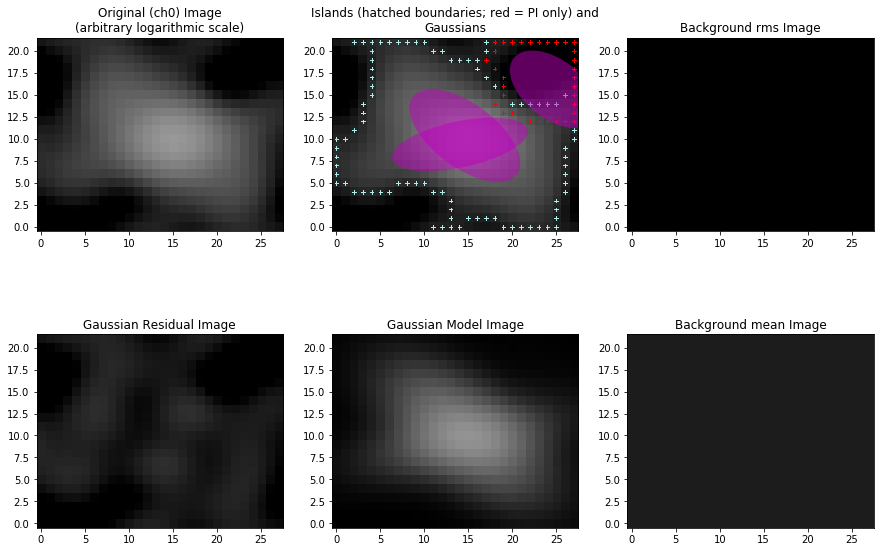

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_56.fits'
Image size .............................. : (11, 8) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.027 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.01614 Jy/beam
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 Jy/

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 1
Total flux density in model ............. : 0.007 Jy
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 1

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.00223 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 0
--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 0
New sources found in PI image ........... : 0 (1 total)


Calculating polarisation properties ....  : [|] 0/1Calculating polarisation properties ....  : [=] 1/1Calculating polarisation properties ....  : [=] 1/1
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


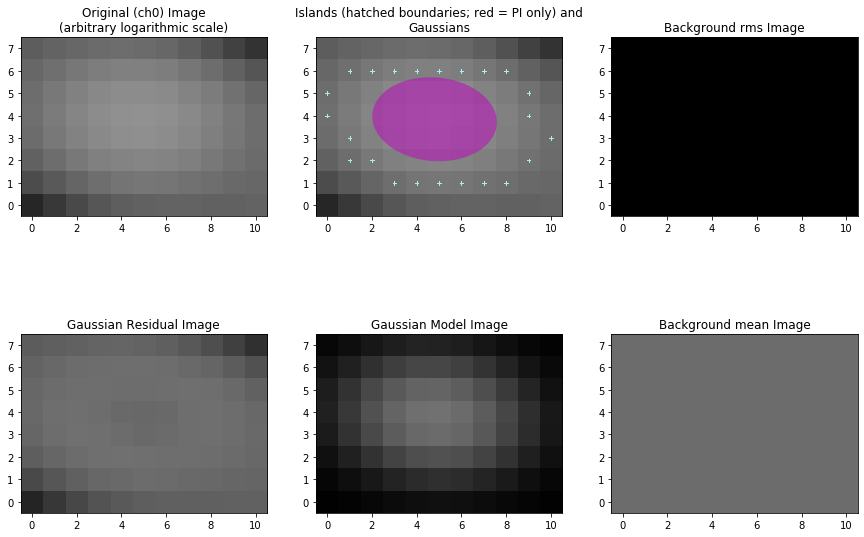

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_57.fits'
Image size .............................. : (41, 20) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.600 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.01943 Jy/beam
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 Jy

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 5
Total flux density in model ............. : 0.423 Jy


--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 2

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.0023 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 2


Fitting islands with Gaussians .......... : [|-] 0/2/Fitting islands with Gaussians .......... : [=/] 1/2Fitting islands with Gaussians .......... : [==] 2/2Fitting islands with Gaussians .......... : [==] 2/2


Total number of Gaussians fit to image .. : 0
--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 0
New sources found in PI image ........... : 0 (2 total)


Calculating polarisation properties ....  : [|-] 0/2/Calculating polarisation properties ....  : [=/] 1/2Calculating polarisation properties ....  : [==] 2/2Calculating polarisation properties ....  : [==] 2/2
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


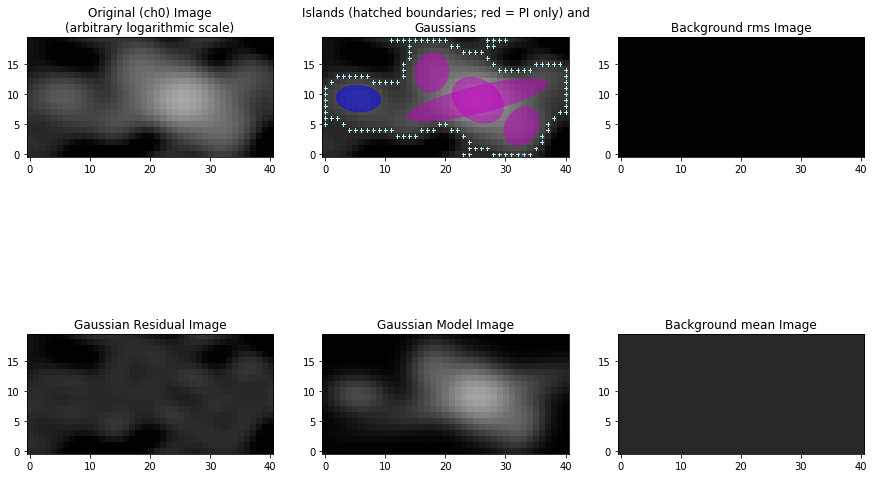

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_58.fits'
Image size .............................. : (29, 22) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.399 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.01339 Jy/beam
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 Jy

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 1
Total flux density in model ............. : 0.286 Jy


--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 1

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.00251 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 1


Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 0
--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 0


New sources found in PI image ........... : 0 (1 total)


Calculating polarisation properties ....  : [|] 0/1Calculating polarisation properties ....  : [=] 1/1Calculating polarisation properties ....  : [=] 1/1
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


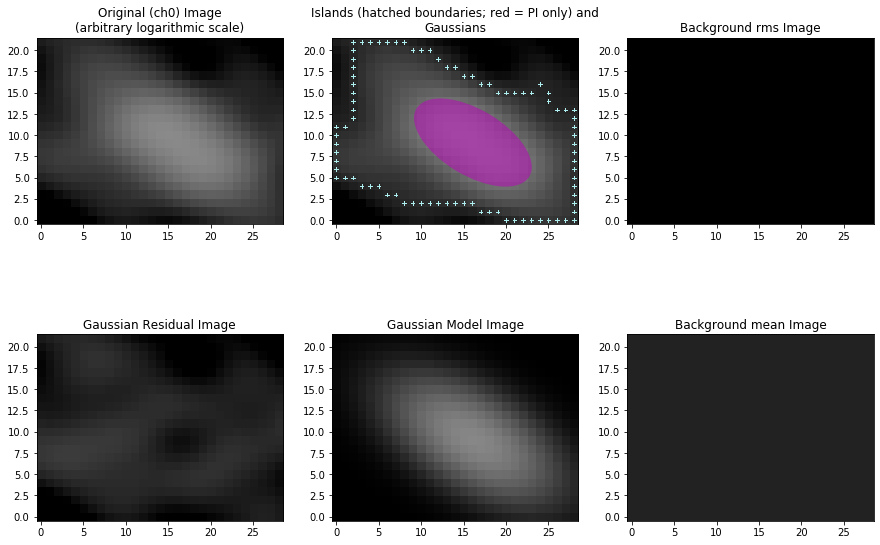

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_59.fits'
Image size .............................. : (42, 20) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.969 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.02254 Jy/beam
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 Jy

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1


Total number of Gaussians fit to image .. : 5
Total flux density in model ............. : 0.788 Jy
--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 2

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.00232 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 3


Fitting islands with Gaussians .......... : [|--] 0/3/Fitting islands with Gaussians .......... : [=/-] 1/3-Fitting islands with Gaussians .......... : [==-] 2/3Fitting islands with Gaussians .......... : [===] 3/3Fitting islands with Gaussians .......... : [===] 3/3

Total number of Gaussians fit to image .. : 0
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 0
New sources found in PI image ........... : 0 (2 total)


Calculating polarisation properties ....  : [|-] 0/2/Calculating polarisation properties ....  : [=/] 1/2Calculating polarisation properties ....  : [==] 2/2Calculating polarisation properties ....  : [==] 2/2
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


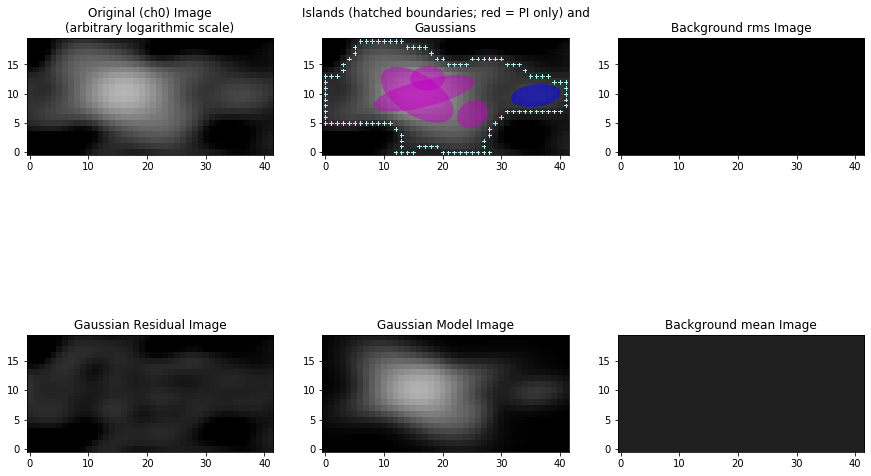

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_60.fits'
Image size .............................. : (15, 11) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.080 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.02456 Jy/beam
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 Jy

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 1
Total flux density in model ............. : 0.029 Jy
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 1

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.00231 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 1


Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 0
--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 0


New sources found in PI image ........... : 0 (1 total)


Calculating polarisation properties ....  : [|] 0/1Calculating polarisation properties ....  : [=] 1/1Calculating polarisation properties ....  : [=] 1/1
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


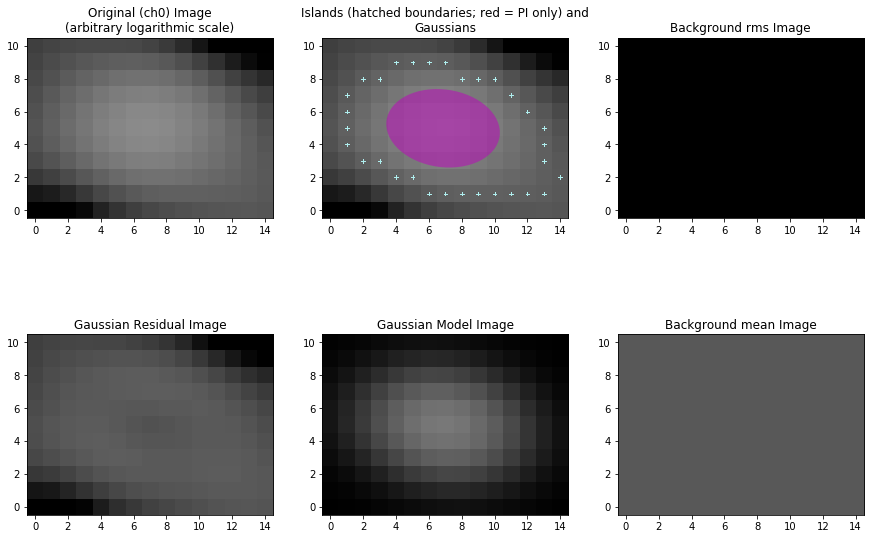

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_61.fits'
Image size .............................. : (20, 17) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.248 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.02746 Jy/beam
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 Jy

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 1
Total flux density in model ............. : 0.126 Jy
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 1

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.00202 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 1


Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 0
--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 0
New sources found in PI image ........... : 0 (1 total)



Calculating polarisation properties ....  : [|] 0/1Calculating polarisation properties ....  : [=] 1/1Calculating polarisation properties ....  : [=] 1/1
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


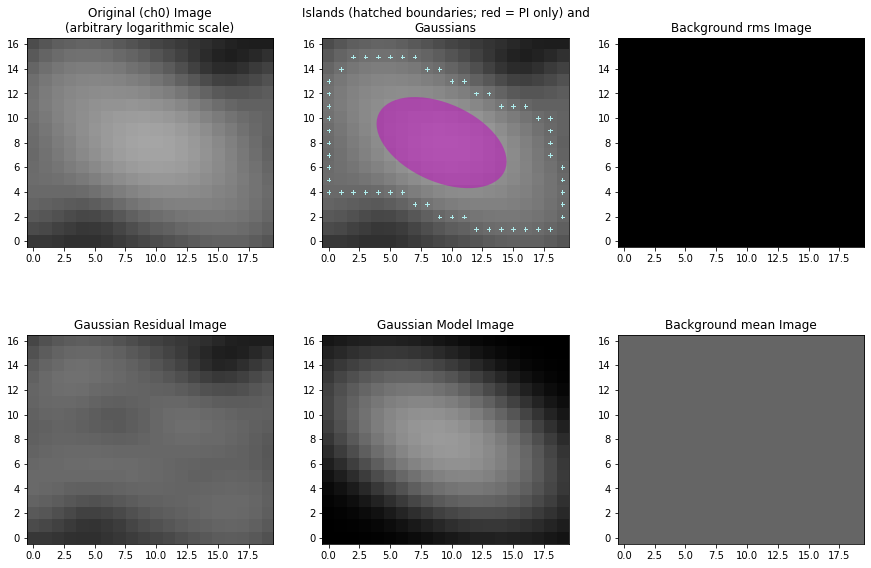

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_62.fits'
Image size .............................. : (30, 20) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.713 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.01712 Jy/beam
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 Jy

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1


Total number of Gaussians fit to image .. : 5
Total flux density in model ............. : 0.635 Jy
--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 1

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.00213 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 1


Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 1
--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 1


New sources found in PI image ........... : 0 (1 total)


Calculating polarisation properties ....  : [|] 0/1Calculating polarisation properties ....  : [=] 1/1Calculating polarisation properties ....  : [=] 1/1
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


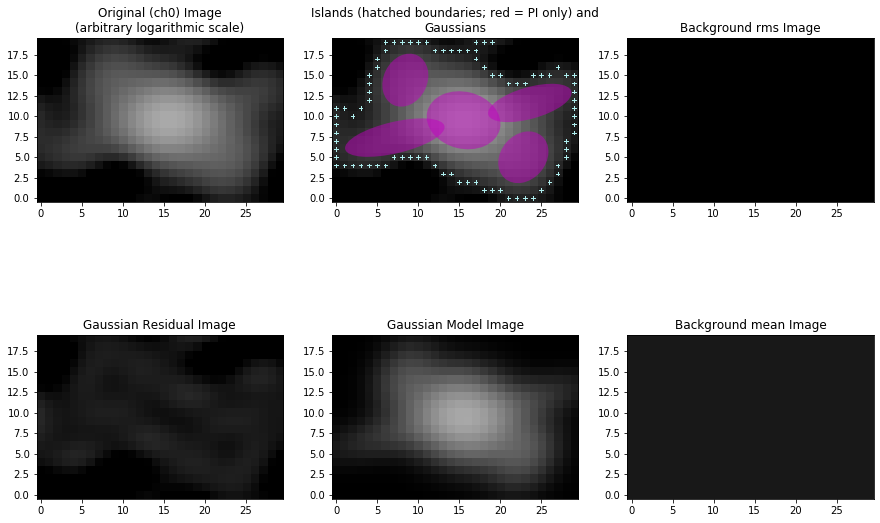

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_63.fits'
Image size .............................. : (14, 10) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.030 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.01181 Jy/beam
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 Jy

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 1
Total flux density in model ............. : 0.006 Jy
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 1

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.00248 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 1


Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 0
--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 0
New sources found in PI image ........... : 0 (1 total)



Calculating polarisation properties ....  : [|] 0/1Calculating polarisation properties ....  : [=] 1/1Calculating polarisation properties ....  : [=] 1/1
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


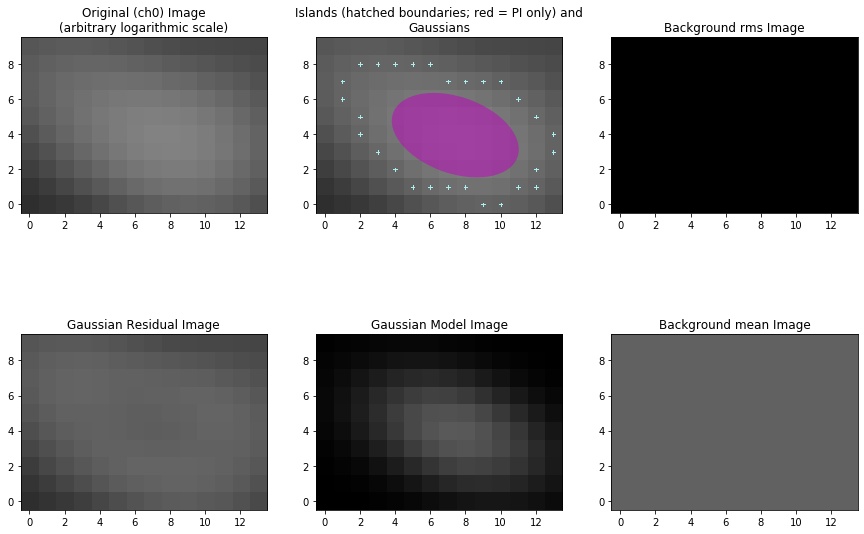

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_64.fits'
Image size .............................. : (20, 16) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.185 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.02448 Jy/beam
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 Jy

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 1
Total flux density in model ............. : 0.093 Jy


--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 1

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.0019 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 1


Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 0
--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 0


New sources found in PI image ........... : 0 (1 total)


Calculating polarisation properties ....  : [|] 0/1Calculating polarisation properties ....  : [=] 1/1Calculating polarisation properties ....  : [=] 1/1
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


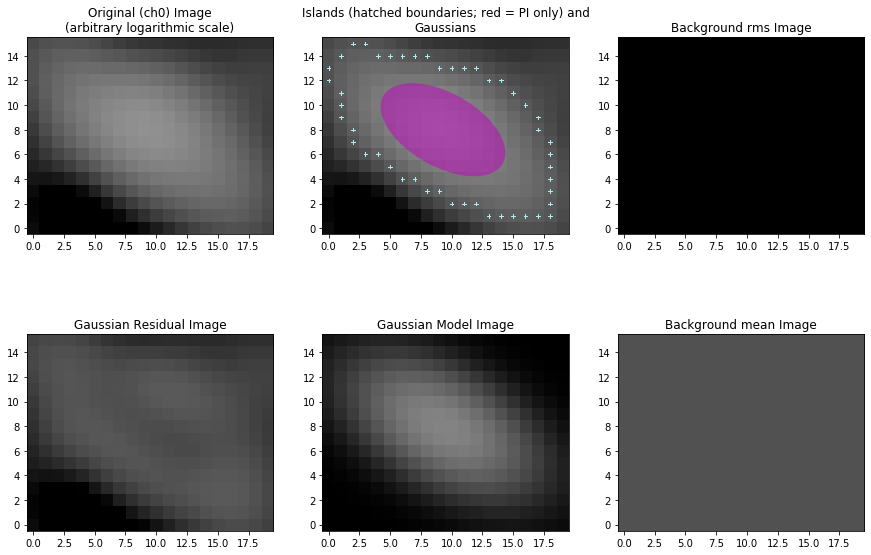

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_65.fits'
Image size .............................. : (46, 20) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.526 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.01587 Jy/beam
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 Jy

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1


Total number of Gaussians fit to image .. : 5
Total flux density in model ............. : 0.361 Jy
--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 2

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.00202 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 5


Fitting islands with Gaussians .......... : [|----] 0/5/Fitting islands with Gaussians .......... : [=/---] 1/5-Fitting islands with Gaussians .......... : [==---] 2/5-Fitting islands with Gaussians .......... : [==---] 2/5|Fitting islands with Gaussians .......... : [====|] 4/5Fitting islands with Gaussians .......... : [=====] 5/5Fitting islands with Gaussians .......... : [=====] 5/5

Total number of Gaussians fit to image .. : 0
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 0
New sources found in PI image ........... : 0 (2 total)


Calculating polarisation properties ....  : [|-] 0/2/Calculating polarisation properties ....  : [=/] 1/2Calculating polarisation properties ....  : [==] 2/2Calculating polarisation properties ....  : [==] 2/2
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


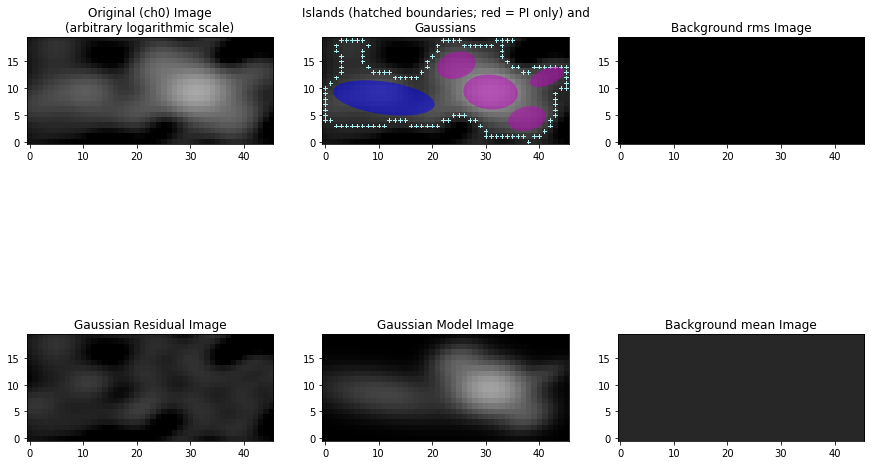

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_66.fits'
Image size .............................. : (36, 17) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.211 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.01338 Jy/beam
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 Jy

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 1
Total flux density in model ............. : 0.111 Jy
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 1

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.00243 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 2


Fitting islands with Gaussians .......... : [|-] 0/2/Fitting islands with Gaussians .......... : [=/] 1/2Fitting islands with Gaussians .......... : [==] 2/2Fitting islands with Gaussians .......... : [==] 2/2


Total number of Gaussians fit to image .. : 1
--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 1
New sources found in PI image ........... : 1 (2 total)


Calculating polarisation properties ....  : [|-] 0/2/Calculating polarisation properties ....  : [=/] 1/2Calculating polarisation properties ....  : [==] 2/2Calculating polarisation properties ....  : [==] 2/2
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


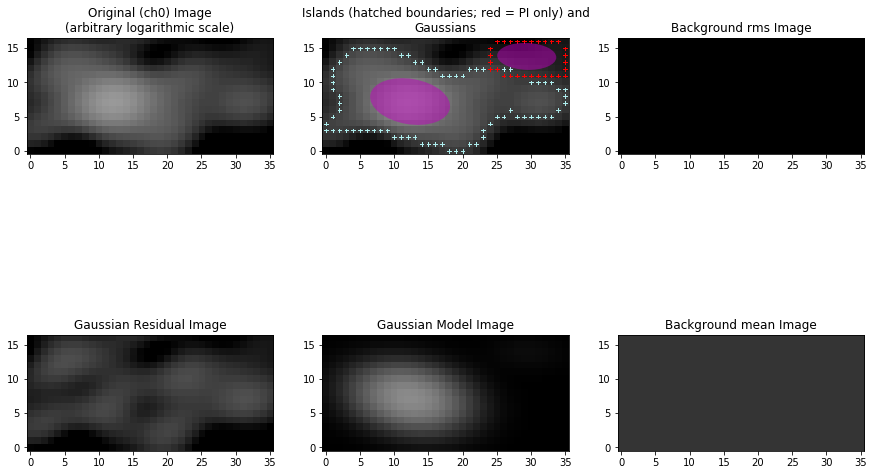

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_67.fits'
Image size .............................. : (22, 17) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.069 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.00757 Jy/beam
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 Jy

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 1
Total flux density in model ............. : 0.035 Jy
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 1

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.00221 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 2


Fitting islands with Gaussians .......... : [|-] 0/2/Fitting islands with Gaussians .......... : [=/] 1/2Fitting islands with Gaussians .......... : [==] 2/2Fitting islands with Gaussians .......... : [==] 2/2


Total number of Gaussians fit to image .. : 0
--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 0
New sources found in PI image ........... : 0 (1 total)


Calculating polarisation properties ....  : [|] 0/1Calculating polarisation properties ....  : [=] 1/1Calculating polarisation properties ....  : [=] 1/1
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


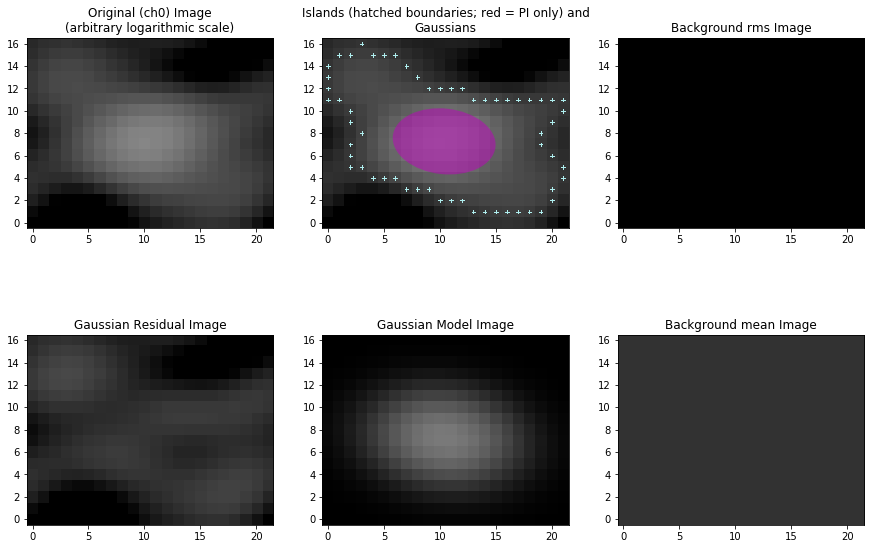

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_68.fits'
Image size .............................. : (16, 11) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.059 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.01814 Jy/beam
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 Jy

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 1
Total flux density in model ............. : 0.014 Jy
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 1

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.00225 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 1


Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 0
--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 0
New sources found in PI image ........... : 0 (1 total)



Calculating polarisation properties ....  : [|] 0/1Calculating polarisation properties ....  : [=] 1/1Calculating polarisation properties ....  : [=] 1/1
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


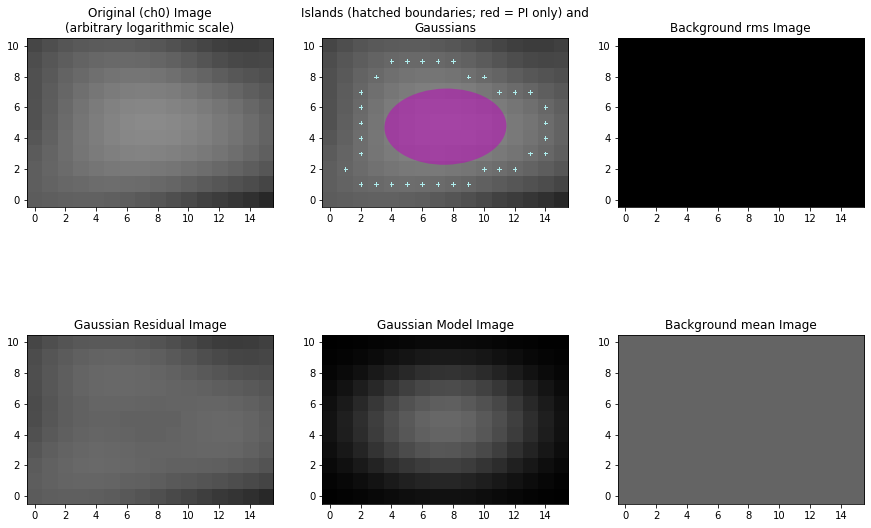

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_69.fits'
Image size .............................. : (24, 16) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.158 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.01942 Jy/beam
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 Jy

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 2
Total flux density in model ............. : 0.061 Jy
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 2

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.00188 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 2


Fitting islands with Gaussians .......... : [|-] 0/2/Fitting islands with Gaussians .......... : [=/] 1/2Fitting islands with Gaussians .......... : [==] 2/2Fitting islands with Gaussians .......... : [==] 2/2


Total number of Gaussians fit to image .. : 0
--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 0
New sources found in PI image ........... : 0 (2 total)


Calculating polarisation properties ....  : [|-] 0/2/Calculating polarisation properties ....  : [=/] 1/2Calculating polarisation properties ....  : [==] 2/2Calculating polarisation properties ....  : [==] 2/2
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


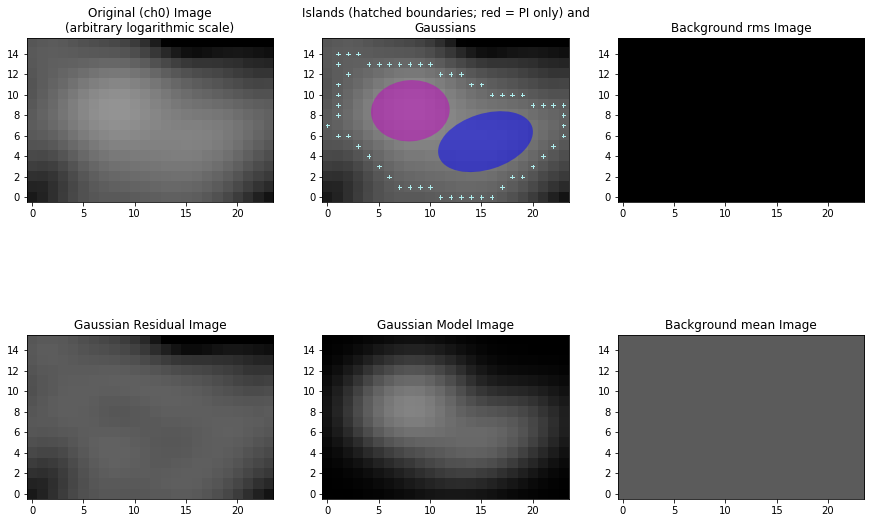

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_70.fits'
Image size .............................. : (29, 17) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.253 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.02112 Jy/beam
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 Jy

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 1
Total flux density in model ............. : 0.124 Jy


--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 1

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.00185 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 2


Fitting islands with Gaussians .......... : [|-] 0/2//Fitting islands with Gaussians .......... : [=/] 1/2Fitting islands with Gaussians .......... : [=/] 1/2Fitting islands with Gaussians .......... : [==] 2/2


Total number of Gaussians fit to image .. : 0
--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 0
New sources found in PI image ........... : 0 (1 total)


Calculating polarisation properties ....  : [|] 0/1Calculating polarisation properties ....  : [=] 1/1Calculating polarisation properties ....  : [=] 1/1
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


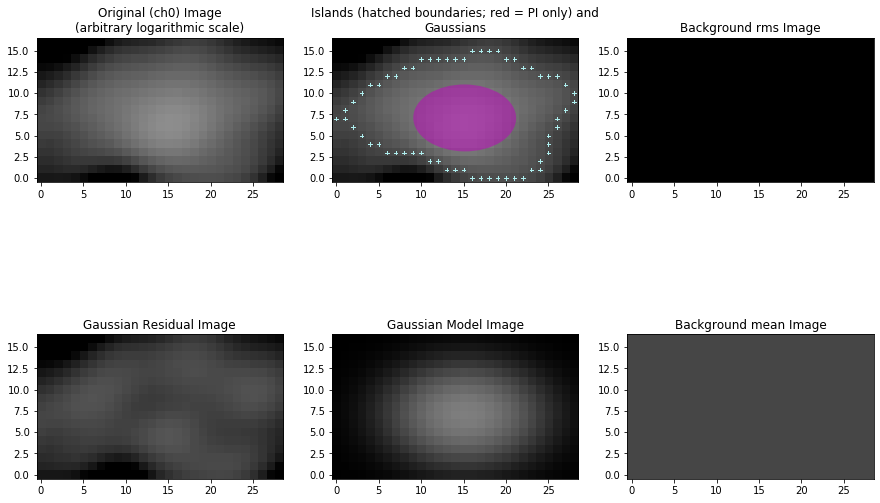

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_71.fits'
Image size .............................. : (21, 15) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.086 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.01202 Jy/beam
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 Jy

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 1
Total flux density in model ............. : 0.038 Jy


--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 1

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.00255 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 1


Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 1
--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 1


New sources found in PI image ........... : 0 (1 total)


Calculating polarisation properties ....  : [|] 0/1Calculating polarisation properties ....  : [=] 1/1Calculating polarisation properties ....  : [=] 1/1
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


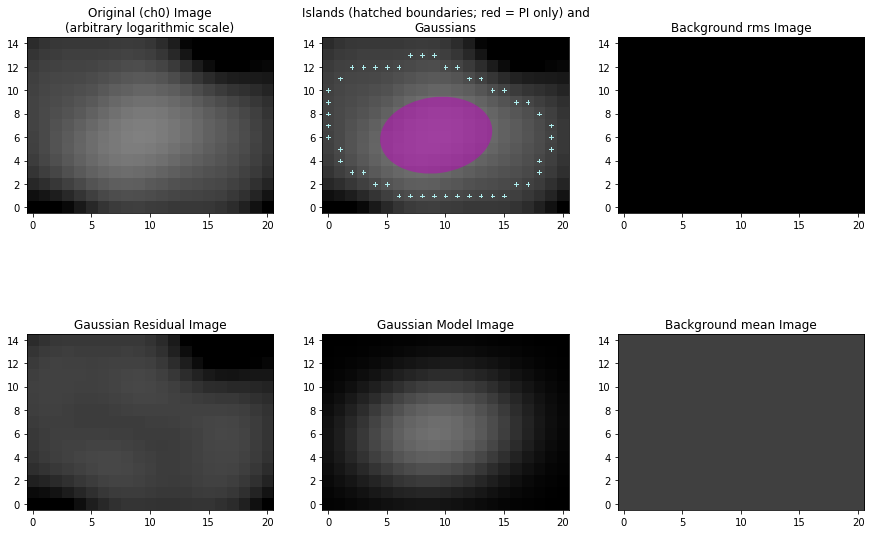

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_72.fits'
Image size .............................. : (44, 20) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.950 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.03345 Jy/beam
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 Jy

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1


Total number of Gaussians fit to image .. : 3
Total flux density in model ............. : 0.514 Jy
--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 1

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.00234 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 1


Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 2
--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 2


New sources found in PI image ........... : 0 (1 total)


Calculating polarisation properties ....  : [|] 0/1Calculating polarisation properties ....  : [=] 1/1Calculating polarisation properties ....  : [=] 1/1
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


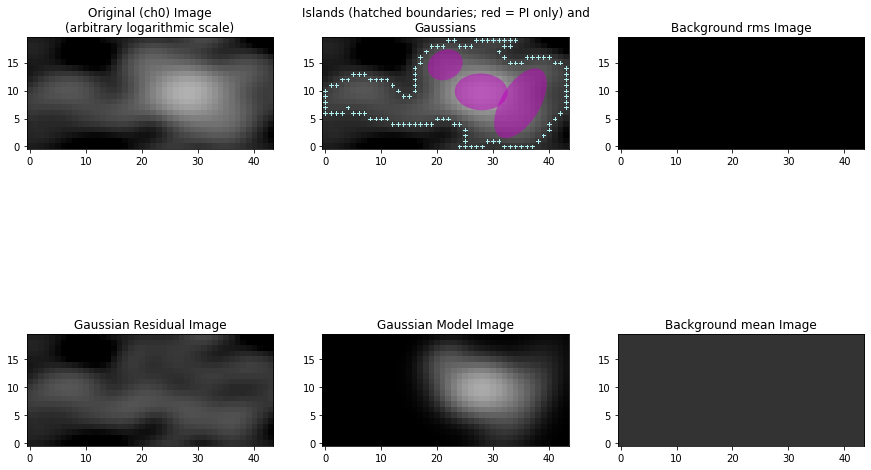

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_73.fits'
Image size .............................. : (18, 15) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.129 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.02206 Jy/beam
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 Jy

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 1
Total flux density in model ............. : 0.045 Jy
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 1

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.00232 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 3


Fitting islands with Gaussians .......... : [|--] 0/3/Fitting islands with Gaussians .......... : [=/-] 1/3-Fitting islands with Gaussians .......... : [==-] 2/3Fitting islands with Gaussians .......... : [===] 3/3Fitting islands with Gaussians .......... : [===] 3/3

Total number of Gaussians fit to image .. : 0


--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 0
New sources found in PI image ........... : 0 (1 total)


Calculating polarisation properties ....  : [|] 0/1Calculating polarisation properties ....  : [=] 1/1Calculating polarisation properties ....  : [=] 1/1
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


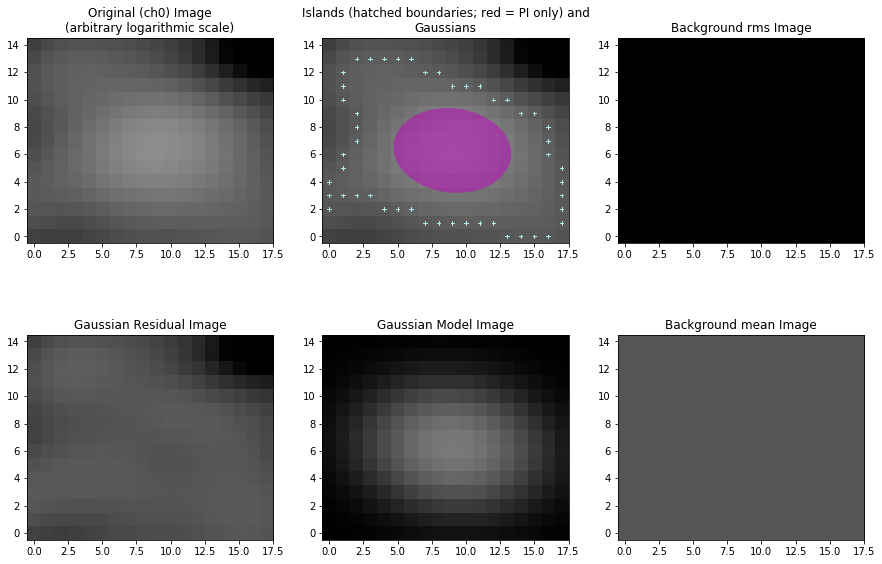

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_74.fits'
Image size .............................. : (25, 17) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.429 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.03558 Jy/beam
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 Jy

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 1
Total flux density in model ............. : 0.235 Jy


--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 1

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.00226 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 2


Fitting islands with Gaussians .......... : [|-] 0/2/Fitting islands with Gaussians .......... : [=/] 1/2Fitting islands with Gaussians .......... : [==] 2/2Fitting islands with Gaussians .......... : [==] 2/2


Total number of Gaussians fit to image .. : 1
--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 1
New sources found in PI image ........... : 0 (1 total)


Calculating polarisation properties ....  : [|] 0/1Calculating polarisation properties ....  : [=] 1/1Calculating polarisation properties ....  : [=] 1/1
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


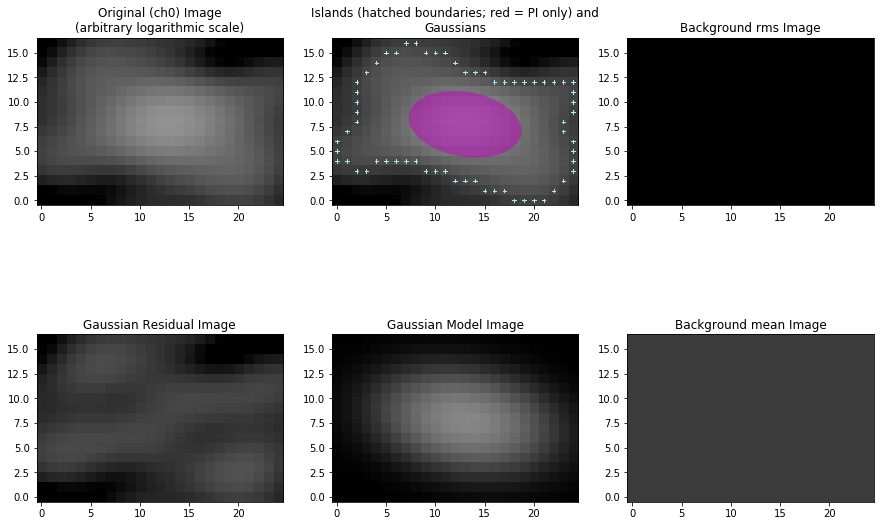

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_75.fits'
Image size .............................. : (24, 16) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.174 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.01726 Jy/beam
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 Jy

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 1
Total flux density in model ............. : 0.086 Jy
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 1

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.00193 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 2


Fitting islands with Gaussians .......... : [|-] 0/2/Fitting islands with Gaussians .......... : [=/] 1/2Fitting islands with Gaussians .......... : [==] 2/2Fitting islands with Gaussians .......... : [==] 2/2


Total number of Gaussians fit to image .. : 0
--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 0
New sources found in PI image ........... : 0 (1 total)


Calculating polarisation properties ....  : [|] 0/1Calculating polarisation properties ....  : [=] 1/1Calculating polarisation properties ....  : [=] 1/1
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


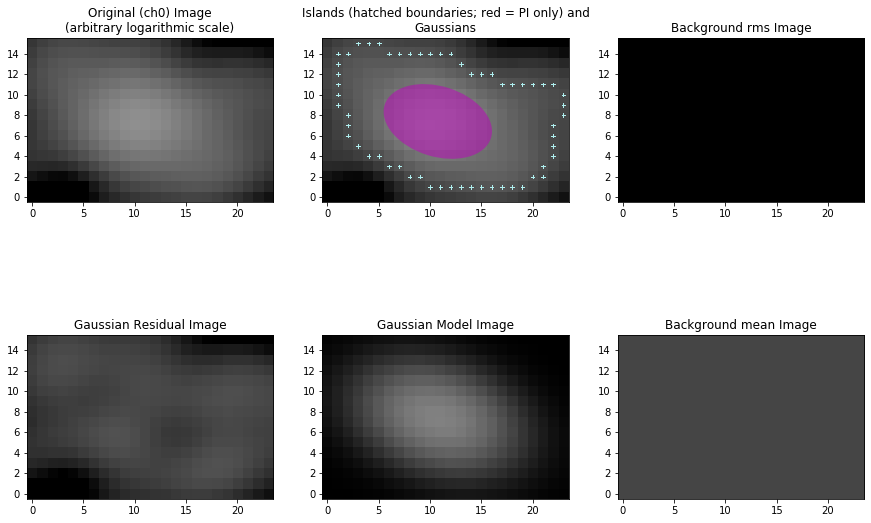

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_76.fits'
Image size .............................. : (16, 12) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.086 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.0143 Jy/beam
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 Jy/

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 1
Total flux density in model ............. : 0.057 Jy
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 1

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.0023 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 2


Fitting islands with Gaussians .......... : [|-] 0/2/Fitting islands with Gaussians .......... : [=/] 1/2Fitting islands with Gaussians .......... : [==] 2/2Fitting islands with Gaussians .......... : [==] 2/2


Total number of Gaussians fit to image .. : 0
--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 0
New sources found in PI image ........... : 0 (1 total)


Calculating polarisation properties ....  : [|] 0/1Calculating polarisation properties ....  : [=] 1/1Calculating polarisation properties ....  : [=] 1/1
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


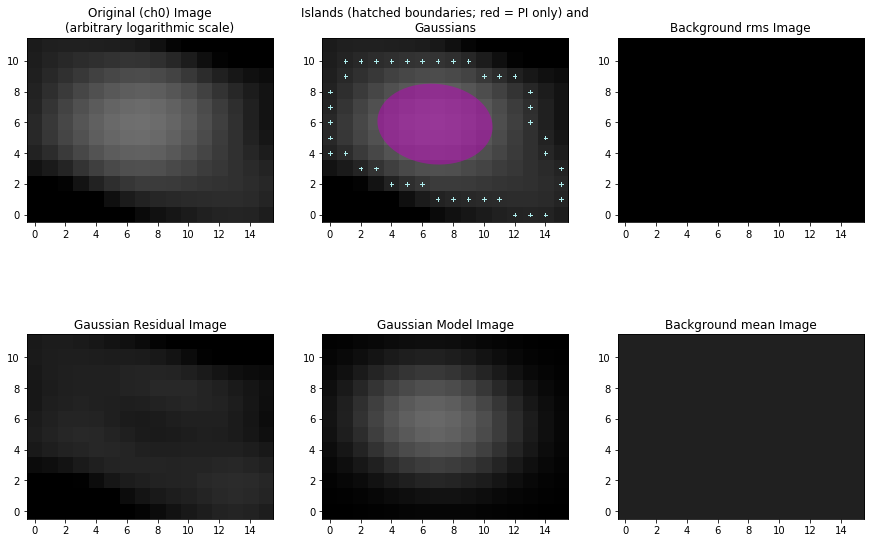

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_77.fits'
Image size .............................. : (19, 16) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.139 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.02887 Jy/beam
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 Jy

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 1
Total flux density in model ............. : 0.031 Jy
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 1

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.00213 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 1


Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 0
--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 0


New sources found in PI image ........... : 0 (1 total)


Calculating polarisation properties ....  : [|] 0/1Calculating polarisation properties ....  : [=] 1/1Calculating polarisation properties ....  : [=] 1/1
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


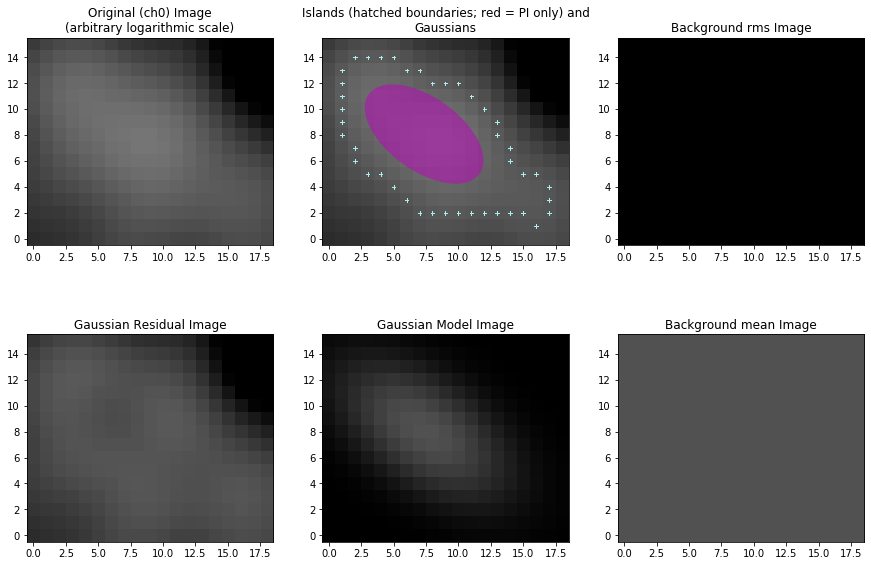

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_78.fits'
Image size .............................. : (37, 23) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.514 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.0086 Jy/beam
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 Jy/

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1


Total number of Gaussians fit to image .. : 6
Total flux density in model ............. : 0.476 Jy
--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 1

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.00227 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 1


Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 1
--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 1


New sources found in PI image ........... : 0 (1 total)


Calculating polarisation properties ....  : [|] 0/1Calculating polarisation properties ....  : [=] 1/1Calculating polarisation properties ....  : [=] 1/1
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


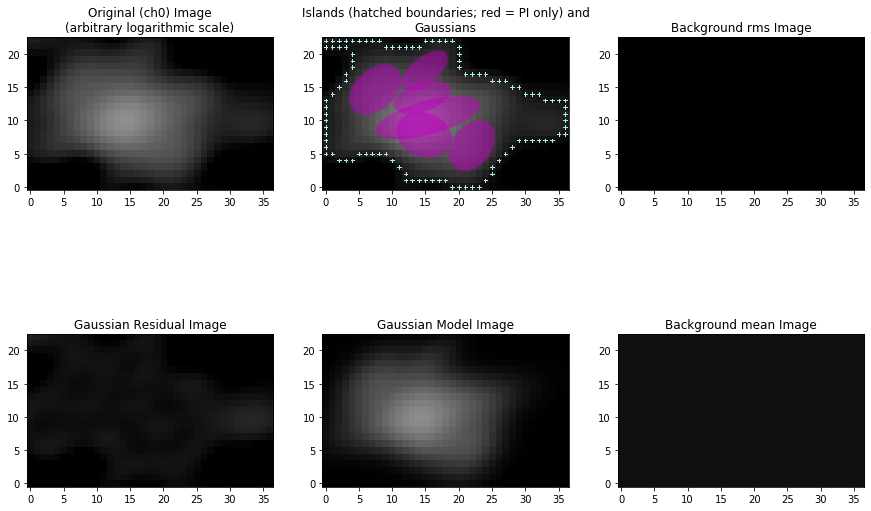

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_79.fits'
Image size .............................. : (27, 18) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.385 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.03325 Jy/beam
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 Jy

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 1
Total flux density in model ............. : 0.169 Jy
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 1

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.00238 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 2


Fitting islands with Gaussians .......... : [|-] 0/2/Fitting islands with Gaussians .......... : [=/] 1/2Fitting islands with Gaussians .......... : [==] 2/2Fitting islands with Gaussians .......... : [==] 2/2


Total number of Gaussians fit to image .. : 0
--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 0
New sources found in PI image ........... : 0 (1 total)


Calculating polarisation properties ....  : [|] 0/1Calculating polarisation properties ....  : [=] 1/1Calculating polarisation properties ....  : [=] 1/1
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


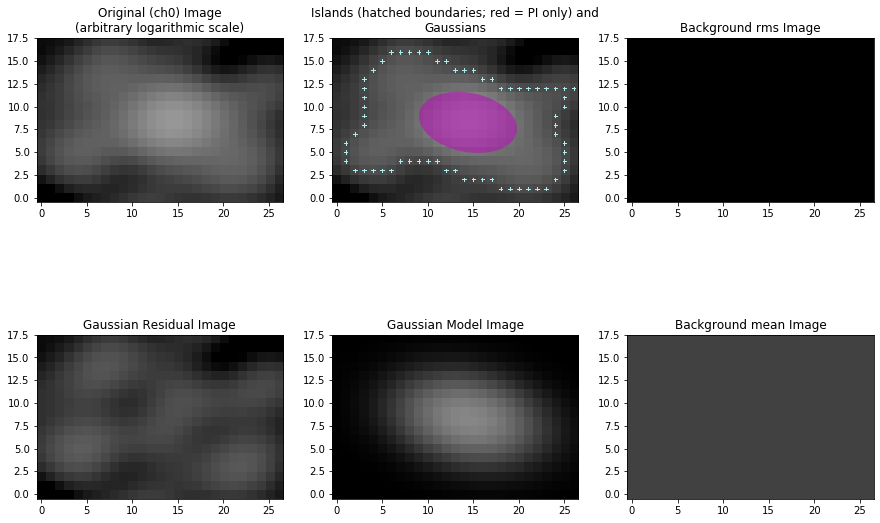

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_80.fits'
Image size .............................. : (41, 23) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.809 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.03457 Jy/beam
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 Jy

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 3
Total flux density in model ............. : 0.426 Jy
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 2

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.00204 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 5


Fitting islands with Gaussians .......... : [|----] 0/5/Fitting islands with Gaussians .......... : [=/---] 1/5-Fitting islands with Gaussians .......... : [==---] 2/5\Fitting islands with Gaussians .......... : [===\-] 3/5|Fitting islands with Gaussians .......... : [====|] 4/5Fitting islands with Gaussians .......... : [=====] 5/5Fitting islands with Gaussians .......... : [=====] 5/5

Total number of Gaussians fit to image .. : 2
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 2
New sources found in PI image ........... : 1 (3 total)


Calculating polarisation properties ....  : [|--] 0/3/Calculating polarisation properties ....  : [=/-] 1/3-Calculating polarisation properties ....  : [==-] 2/3Calculating polarisation properties ....  : [===] 3/3Calculating polarisation properties ....  : [===] 3/3
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


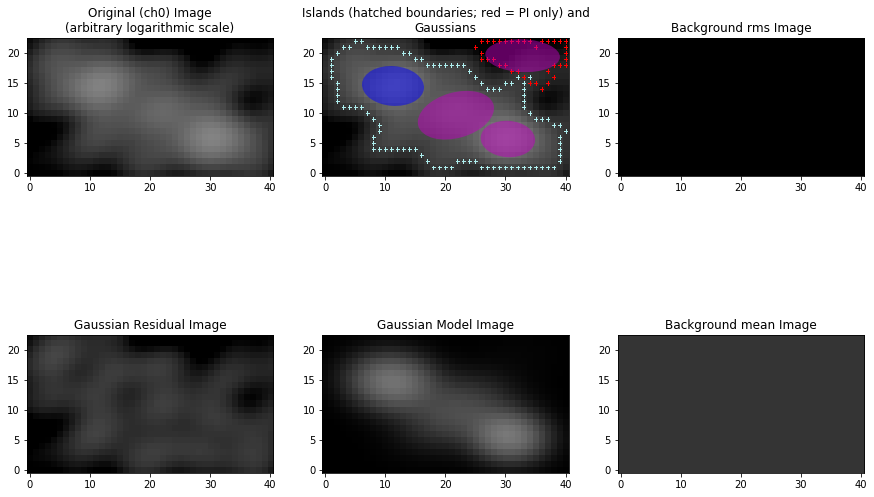

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_81.fits'
Image size .............................. : (30, 19) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.573 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.02701 Jy/beam
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 Jy

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 3
Total flux density in model ............. : 0.402 Jy
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 1

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.00228 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 2


Fitting islands with Gaussians .......... : [|-] 0/2/Fitting islands with Gaussians .......... : [=/] 1/2Fitting islands with Gaussians .......... : [==] 2/2Fitting islands with Gaussians .......... : [==] 2/2


Total number of Gaussians fit to image .. : 1
--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 1
New sources found in PI image ........... : 0 (1 total)


Calculating polarisation properties ....  : [|] 0/1Calculating polarisation properties ....  : [=] 1/1Calculating polarisation properties ....  : [=] 1/1
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


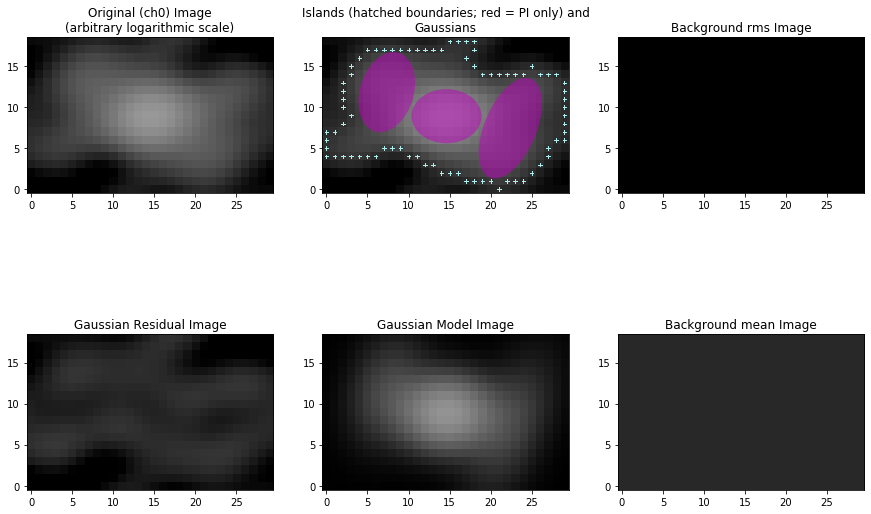

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_82.fits'
Image size .............................. : (38, 18) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.114 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.00628 Jy/beam
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 Jy

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1


Total number of Gaussians fit to image .. : 4
Total flux density in model ............. : 0.075 Jy
--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 2

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.00167 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 2


Fitting islands with Gaussians .......... : [|-] 0/2/Fitting islands with Gaussians .......... : [=/] 1/2Fitting islands with Gaussians .......... : [==] 2/2Fitting islands with Gaussians .......... : [==] 2/2


Total number of Gaussians fit to image .. : 0
--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 0
New sources found in PI image ........... : 0 (2 total)


Calculating polarisation properties ....  : [|-] 0/2/Calculating polarisation properties ....  : [=/] 1/2Calculating polarisation properties ....  : [==] 2/2Calculating polarisation properties ....  : [==] 2/2
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


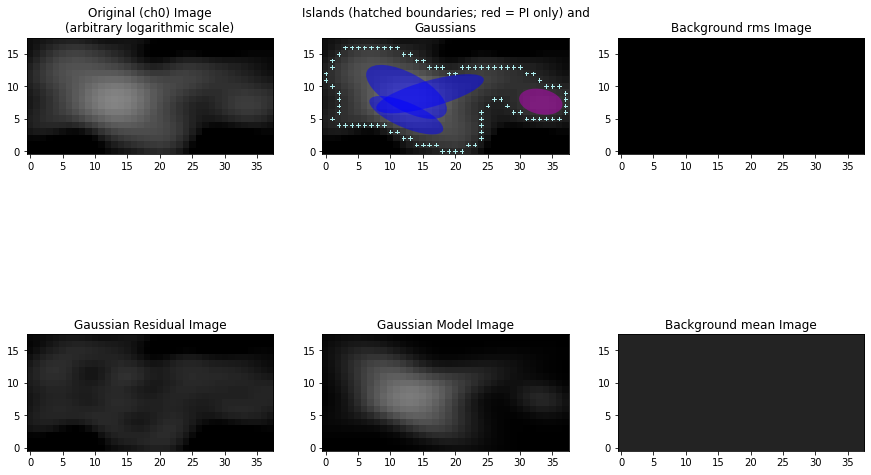

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_83.fits'
Image size .............................. : (64, 25) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 2.960 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (81, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.00292 Jy/beam
Derived rms_box (box size, step size) ... : (81, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 Jy

Fitting islands with Gaussians .......... : [|--] 0/3/Fitting islands with Gaussians .......... : [=/-] 1/3-Fitting islands with Gaussians .......... : [==-] 2/3Fitting islands with Gaussians .......... : [===] 3/3Fitting islands with Gaussians .......... : [===] 3/3

Total number of Gaussians fit to image .. : 24
Total flux density in model ............. : 3.144 Jy
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 2
    Island #2 (x=52, y=0)
Please check this island. If it is a valid island and
should be fit, try adjusting the flagging options (use
show_fit with "ch0_flagged=True" to see the flagged Gaussians)
or enabling the wavelet module (with "atrous_do=True").
To include empty islands in output source catalogs, set
incl_empty=True in the write_catalog task.

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (105, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.00234 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 2


Fitting islands with Gaussians .......... : [|-] 0/2/Fitting islands with Gaussians .......... : [=/] 1/2Fitting islands with Gaussians .......... : [==] 2/2Fitting islands with Gaussians .......... : [==] 2/2

Total number of Gaussians fit to image .. : 8
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 4
New sources found in PI image ........... : 1 (3 total)


Calculating polarisation properties ....  : [|--] 0/3/Calculating polarisation properties ....  : [=/-] 1/3-Calculating polarisation properties ....  : [==-] 2/3Calculating polarisation properties ....  : [===] 3/3Calculating polarisation properties ....  : [===] 3/3
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


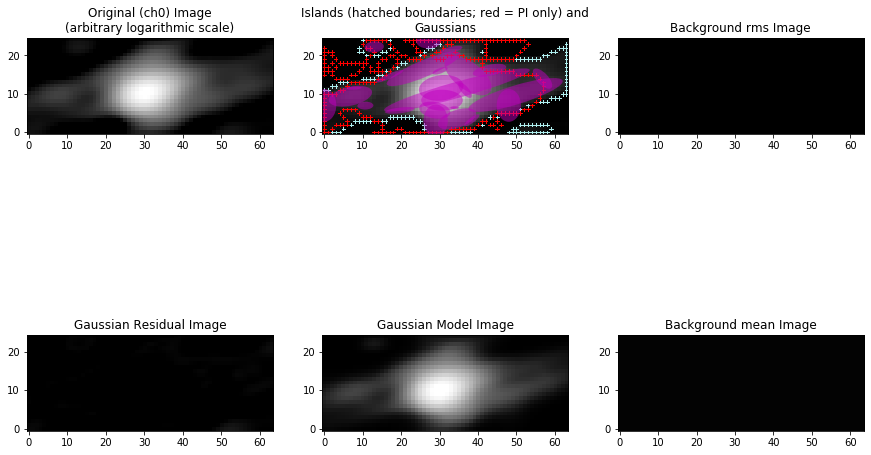

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_84.fits'
Image size .............................. : (18, 13) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.095 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.01939 Jy/beam
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 Jy

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 1
Total flux density in model ............. : 0.034 Jy
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 1

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.00249 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 1


Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 0
--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 0


New sources found in PI image ........... : 0 (1 total)


Calculating polarisation properties ....  : [|] 0/1Calculating polarisation properties ....  : [=] 1/1Calculating polarisation properties ....  : [=] 1/1
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


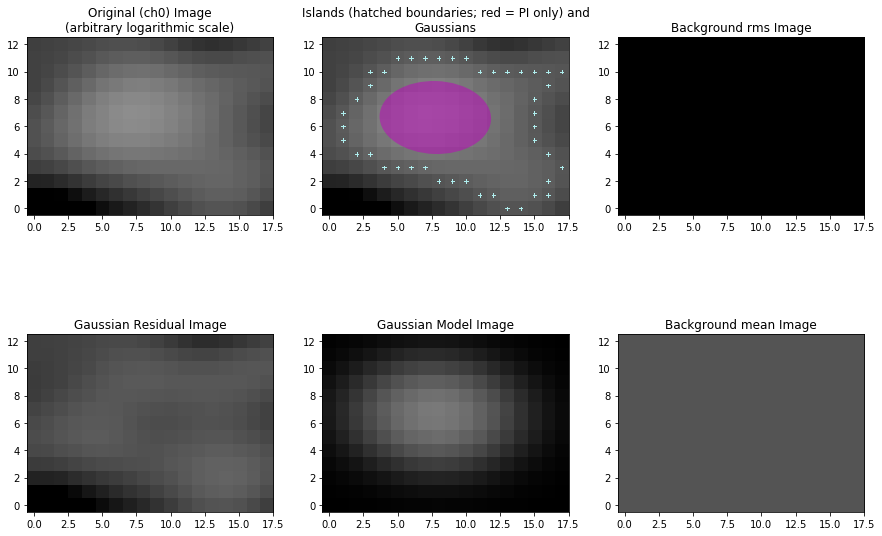

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_85.fits'
Image size .............................. : (22, 17) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.212 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.02128 Jy/beam
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 Jy

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 1
Total flux density in model ............. : 0.116 Jy
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 1

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.00212 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 2


Fitting islands with Gaussians .......... : [|-] 0/2/Fitting islands with Gaussians .......... : [=/] 1/2Fitting islands with Gaussians .......... : [==] 2/2Fitting islands with Gaussians .......... : [==] 2/2


Total number of Gaussians fit to image .. : 0
--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 0
New sources found in PI image ........... : 0 (1 total)


Calculating polarisation properties ....  : [|] 0/1Calculating polarisation properties ....  : [=] 1/1Calculating polarisation properties ....  : [=] 1/1
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


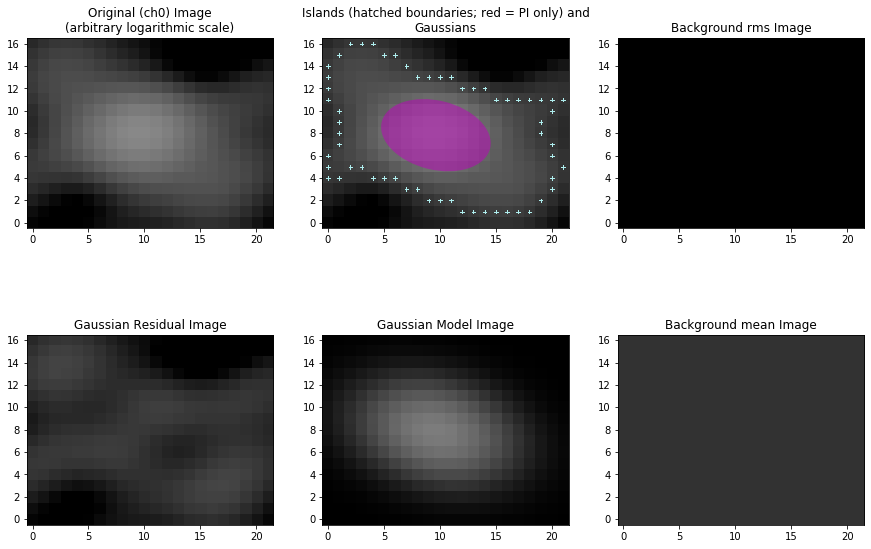

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_86.fits'
Image size .............................. : (28, 18) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.420 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.02738 Jy/beam
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 Jy

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 1
Total flux density in model ............. : 0.247 Jy
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 1

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.00214 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 2


Fitting islands with Gaussians .......... : [|-] 0/2/Fitting islands with Gaussians .......... : [=/] 1/2Fitting islands with Gaussians .......... : [==] 2/2Fitting islands with Gaussians .......... : [==] 2/2


Total number of Gaussians fit to image .. : 1
--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 1
New sources found in PI image ........... : 0 (1 total)


Calculating polarisation properties ....  : [|] 0/1Calculating polarisation properties ....  : [=] 1/1Calculating polarisation properties ....  : [=] 1/1
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


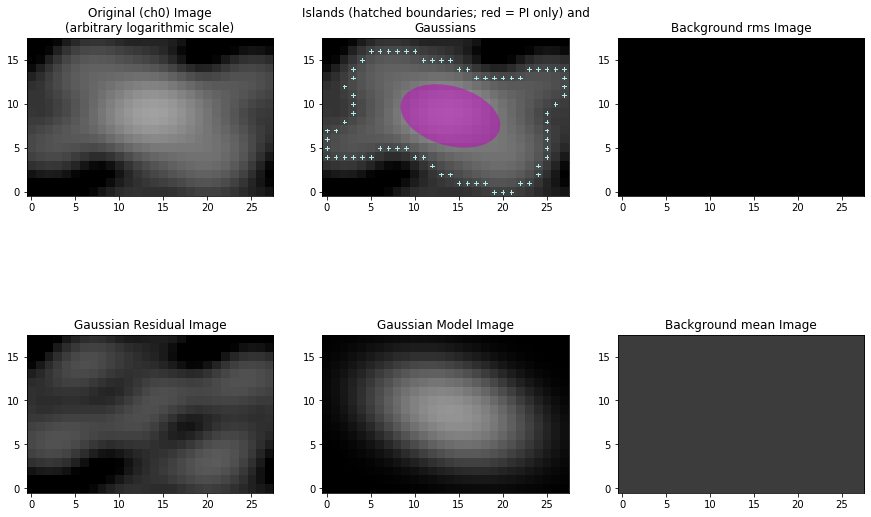

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_87.fits'
Image size .............................. : (20, 17) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.055 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.00848 Jy/beam
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 Jy

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 1
Total flux density in model ............. : 0.015 Jy
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 1

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.00164 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 2


Fitting islands with Gaussians .......... : [|-] 0/2/Fitting islands with Gaussians .......... : [=/] 1/2Fitting islands with Gaussians .......... : [==] 2/2Fitting islands with Gaussians .......... : [==] 2/2


Total number of Gaussians fit to image .. : 0
--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 0
New sources found in PI image ........... : 0 (1 total)


Calculating polarisation properties ....  : [|] 0/1Calculating polarisation properties ....  : [=] 1/1Calculating polarisation properties ....  : [=] 1/1
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


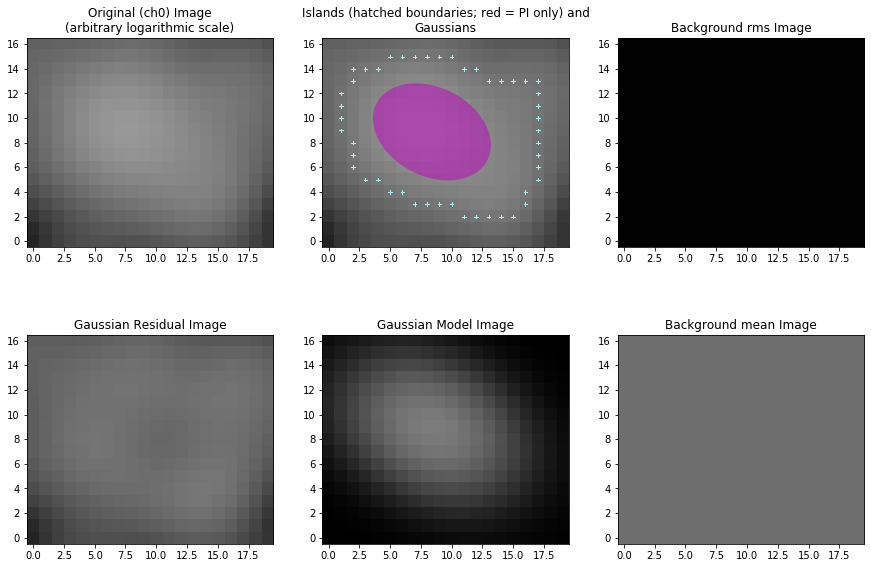

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_88.fits'
Image size .............................. : (40, 14) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.096 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.00991 Jy/beam
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 Jy

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 1
Total flux density in model ............. : 0.019 Jy
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 1

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.00193 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 3


Fitting islands with Gaussians .......... : [|--] 0/3/Fitting islands with Gaussians .......... : [=/-] 1/3-Fitting islands with Gaussians .......... : [==-] 2/3Fitting islands with Gaussians .......... : [===] 3/3Fitting islands with Gaussians .......... : [===] 3/3

Total number of Gaussians fit to image .. : 0
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 0
New sources found in PI image ........... : 0 (1 total)


Calculating polarisation properties ....  : [|] 0/1Calculating polarisation properties ....  : [=] 1/1Calculating polarisation properties ....  : [=] 1/1
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


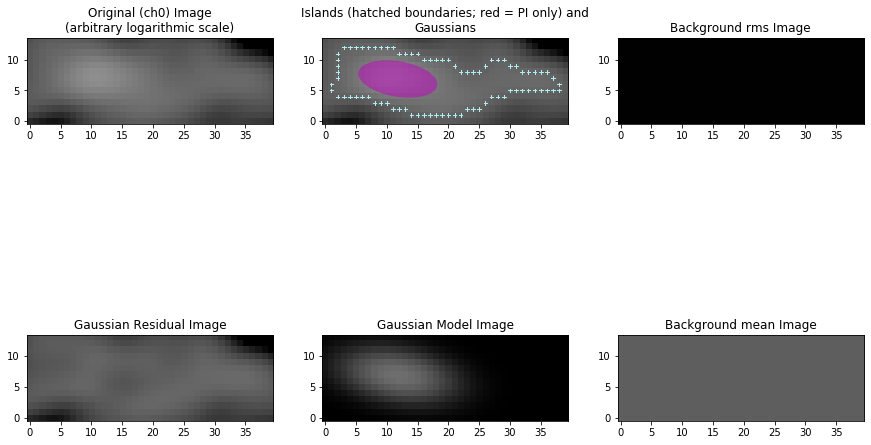

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_89.fits'
Image size .............................. : (52, 20) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 2.543 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (75, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.01392 Jy/beam
Derived rms_box (box size, step size) ... : (75, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 Jy

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1


Total number of Gaussians fit to image .. : 8
Total flux density in model ............. : 2.439 Jy
--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 2

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (65, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.00253 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 2


Fitting islands with Gaussians .......... : [|-] 0/2/Fitting islands with Gaussians .......... : [=/] 1/2Fitting islands with Gaussians .......... : [==] 2/2Fitting islands with Gaussians .......... : [==] 2/2

Total number of Gaussians fit to image .. : 2
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 1
New sources found in PI image ........... : 0 (2 total)


Calculating polarisation properties ....  : [|-] 0/2/Calculating polarisation properties ....  : [=/] 1/2Calculating polarisation properties ....  : [==] 2/2Calculating polarisation properties ....  : [==] 2/2
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


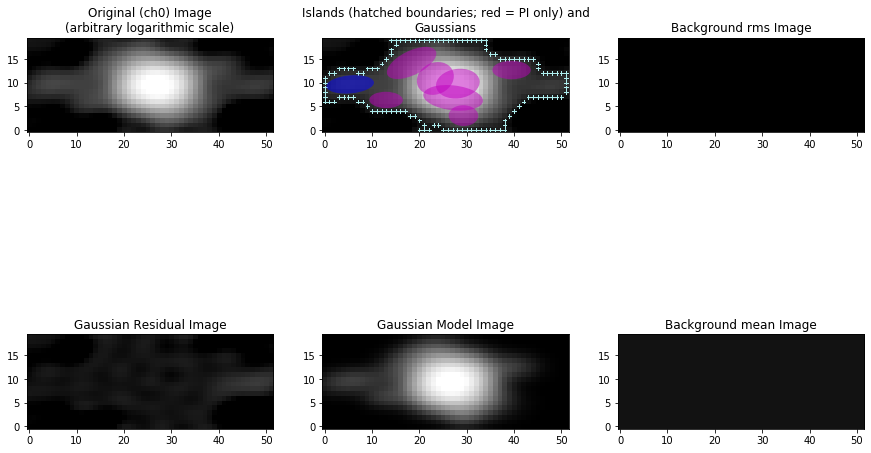

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_90.fits'
Image size .............................. : (23, 22) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.129 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.01497 Jy/beam
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 Jy

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 0
Total flux density in model ............. : 0.000 Jy
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 0
    Island #0 (x=7, y=8)
Please check this island. If it is a valid island and
should be fit, try adjusting the flagging options (use
show_fit with "ch0_flagged=True" to see the flagged Gaussians)
or enabling the wavelet module (with "atrous_do=True").
To include empty islands in output source catalogs, set
incl_empty=True in the write_catalog task.

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.00214 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 1


Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 0
--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 0


--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_91.fits'
Image size .............................. : (17, 11) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.064 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.01492 Jy/beam
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 Jy

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 1
Total flux density in model ............. : 0.027 Jy
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 1

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.00224 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 1


Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 0
--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 0


New sources found in PI image ........... : 0 (1 total)


Calculating polarisation properties ....  : [|] 0/1Calculating polarisation properties ....  : [=] 1/1Calculating polarisation properties ....  : [=] 1/1
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


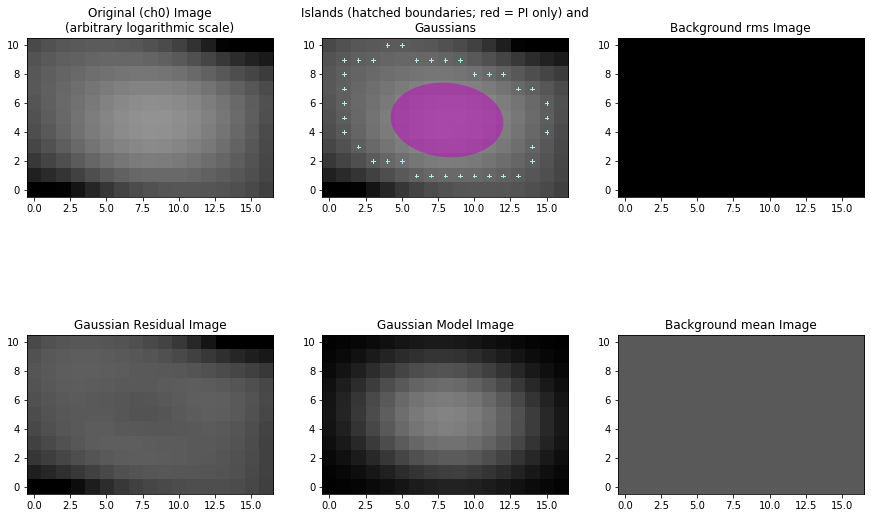

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_92.fits'
Image size .............................. : (20, 15) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.111 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.01423 Jy/beam
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 Jy

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 1
Total flux density in model ............. : 0.101 Jy
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 1

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.00335 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 1


Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 0
--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 0


New sources found in PI image ........... : 0 (1 total)


Calculating polarisation properties ....  : [|] 0/1Calculating polarisation properties ....  : [=] 1/1Calculating polarisation properties ....  : [=] 1/1
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


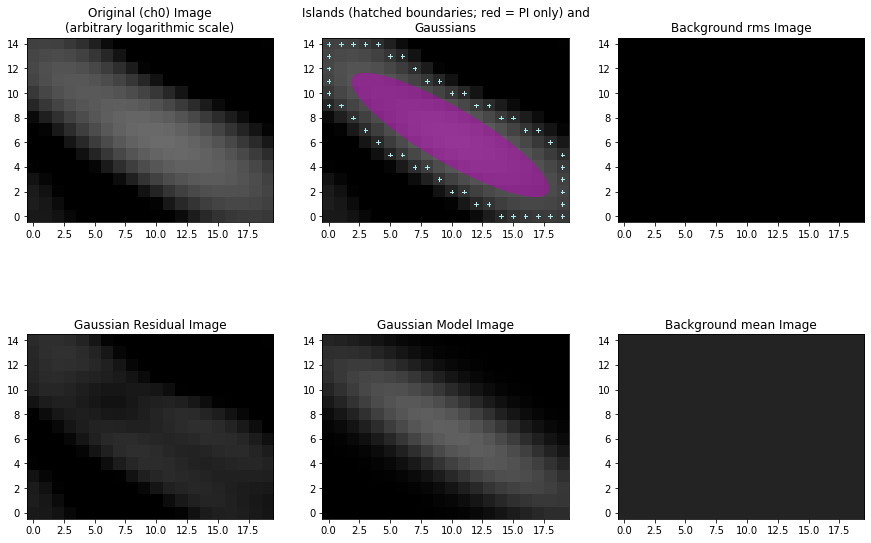

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_93.fits'
Image size .............................. : (11, 7) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.024 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.01632 Jy/beam
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 Jy/

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 1
Total flux density in model ............. : 0.006 Jy
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 1

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.00242 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 0
--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 0
New sources found in PI image ........... : 0 (1 total)


Calculating polarisation properties ....  : [|] 0/1Calculating polarisation properties ....  : [=] 1/1Calculating polarisation properties ....  : [=] 1/1
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


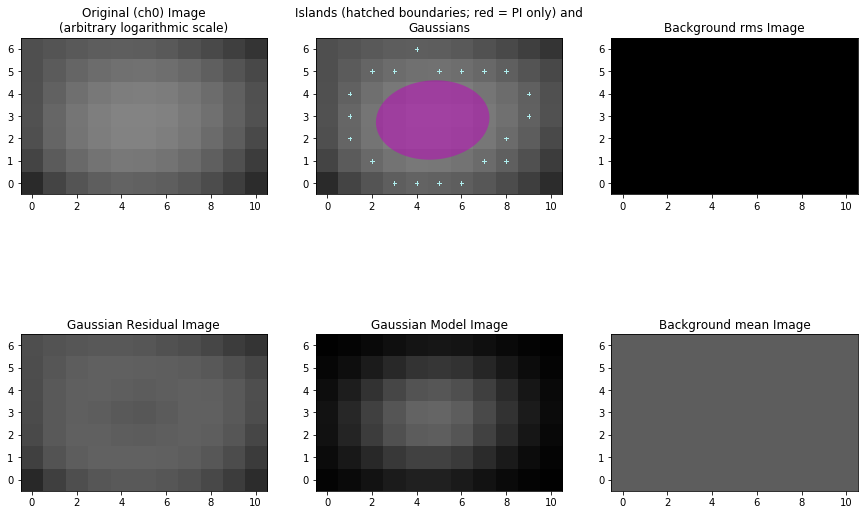

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_94.fits'
Image size .............................. : (40, 23) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 1.023 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.0203 Jy/beam
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 Jy/

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1


Total number of Gaussians fit to image .. : 5
Total flux density in model ............. : 0.844 Jy
--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 2

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (65, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.00244 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 1


Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 2
--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 2


New sources found in PI image ........... : 0 (2 total)


Calculating polarisation properties ....  : [|-] 0/2/Calculating polarisation properties ....  : [=/] 1/2Calculating polarisation properties ....  : [==] 2/2Calculating polarisation properties ....  : [==] 2/2
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


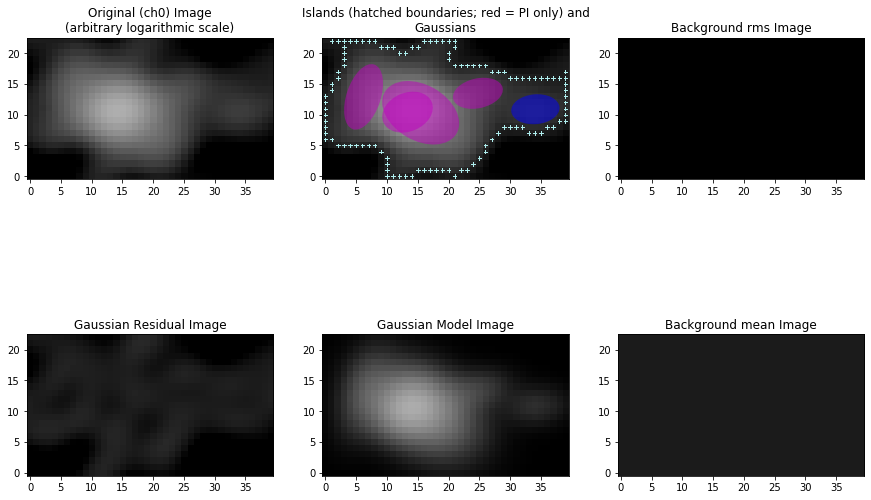

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_95.fits'
Image size .............................. : (36, 26) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 10.956 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (95, 3) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.02198 Jy/beam
Derived rms_box (box size, step size) ... : (95, 3) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 J

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1


Total number of Gaussians fit to image .. : 3
Total flux density in model ............. : 10.785 Jy
--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 1

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (85, 3) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.0042 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 3


Fitting islands with Gaussians .......... : [|--] 0/3/Fitting islands with Gaussians .......... : [=/-] 1/3-Fitting islands with Gaussians .......... : [==-] 2/3Fitting islands with Gaussians .......... : [===] 3/3Fitting islands with Gaussians .......... : [===] 3/3

Total number of Gaussians fit to image .. : 4


--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 2
New sources found in PI image ........... : 1 (2 total)


Calculating polarisation properties ....  : [|-] 0/2/Calculating polarisation properties ....  : [=/] 1/2Calculating polarisation properties ....  : [==] 2/2Calculating polarisation properties ....  : [==] 2/2
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


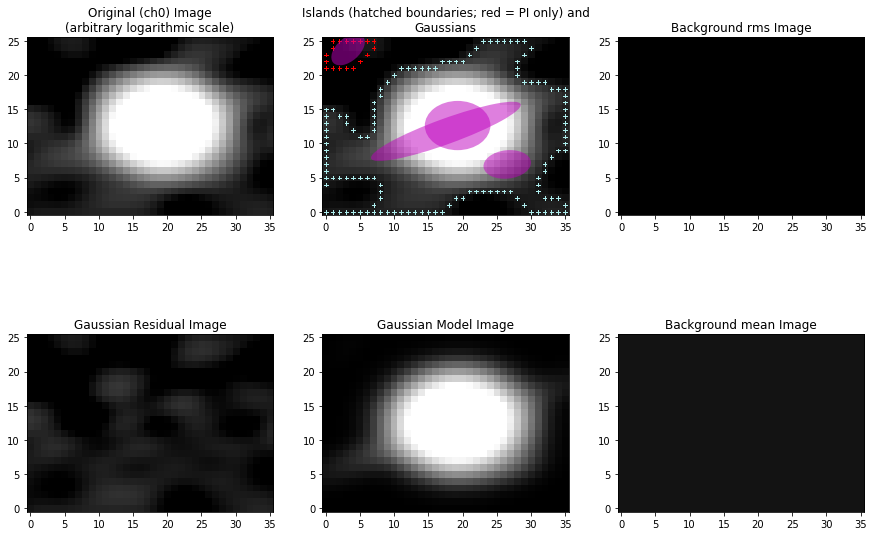

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_96.fits'
Image size .............................. : (12, 6) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.064 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.04841 Jy/beam
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 Jy/

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 1
Total flux density in model ............. : 0.016 Jy
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 1

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.0033 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 1


Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 0
--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 0
New sources found in PI image ........... : 0 (1 total)



Calculating polarisation properties ....  : [|] 0/1Calculating polarisation properties ....  : [=] 1/1Calculating polarisation properties ....  : [=] 1/1
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


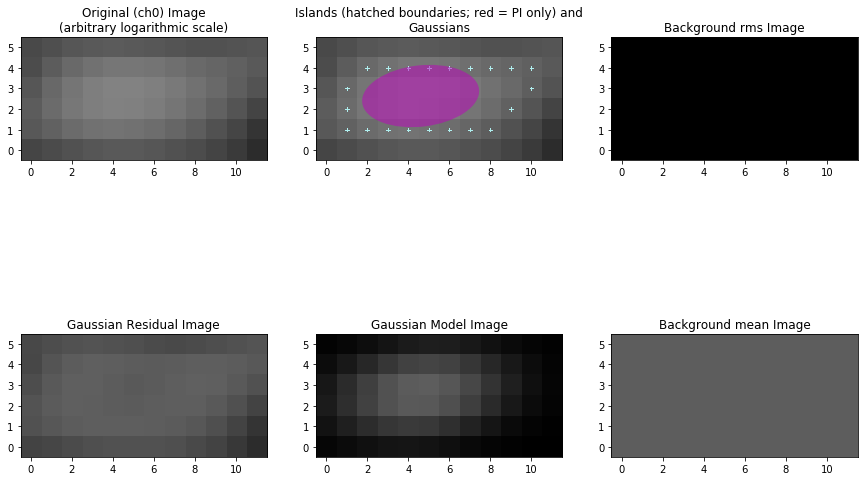

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_97.fits'
Image size .............................. : (22, 37) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.147 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.01567 Jy/beam
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 Jy

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 0
Total flux density in model ............. : 0.000 Jy


--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 0
    Island #0 (x=11, y=10)
Please check this island. If it is a valid island and
should be fit, try adjusting the flagging options (use
show_fit with "ch0_flagged=True" to see the flagged Gaussians)
or enabling the wavelet module (with "atrous_do=True").
To include empty islands in output source catalogs, set
incl_empty=True in the write_catalog task.

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.00212 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 3


Fitting islands with Gaussians .......... : [|--] 0/3/Fitting islands with Gaussians .......... : [=/-] 1/3/Fitting islands with Gaussians .......... : [=/-] 1/3Fitting islands with Gaussians .......... : [===] 3/3Fitting islands with Gaussians .......... : [===] 3/3


Total number of Gaussians fit to image .. : 1
--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 1
--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_98.fits'
Image size .............................. : (20, 15) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.199 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.02809 Jy/beam
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box 

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 1
Total flux density in model ............. : 0.095 Jy
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 1

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.00211 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 2


Fitting islands with Gaussians .......... : [|-] 0/2/Fitting islands with Gaussians .......... : [=/] 1/2Fitting islands with Gaussians .......... : [==] 2/2Fitting islands with Gaussians .......... : [==] 2/2


Total number of Gaussians fit to image .. : 1
--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 1
New sources found in PI image ........... : 0 (1 total)


Calculating polarisation properties ....  : [|] 0/1Calculating polarisation properties ....  : [=] 1/1Calculating polarisation properties ....  : [=] 1/1
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


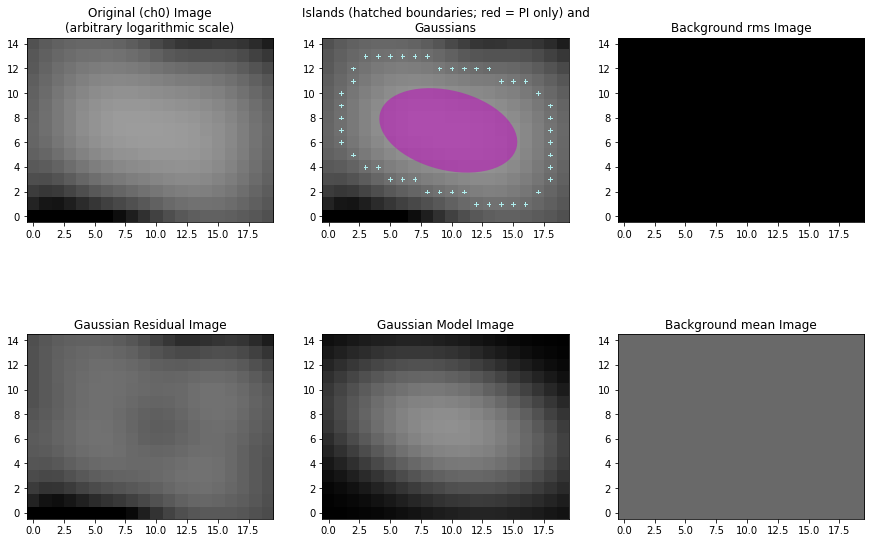

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_99.fits'
Image size .............................. : (26, 21) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.869 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.02917 Jy/beam
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 Jy

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 4
Total flux density in model ............. : 0.709 Jy


--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 1

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.00279 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 3


Fitting islands with Gaussians .......... : [|--] 0/3/Fitting islands with Gaussians .......... : [=/-] 1/3/Fitting islands with Gaussians .......... : [=/-] 1/3Fitting islands with Gaussians .......... : [===] 3/3Fitting islands with Gaussians .......... : [===] 3/3

Total number of Gaussians fit to image .. : 2
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 2
New sources found in PI image ........... : 0 (1 total)


Calculating polarisation properties ....  : [|] 0/1Calculating polarisation properties ....  : [=] 1/1Calculating polarisation properties ....  : [=] 1/1
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


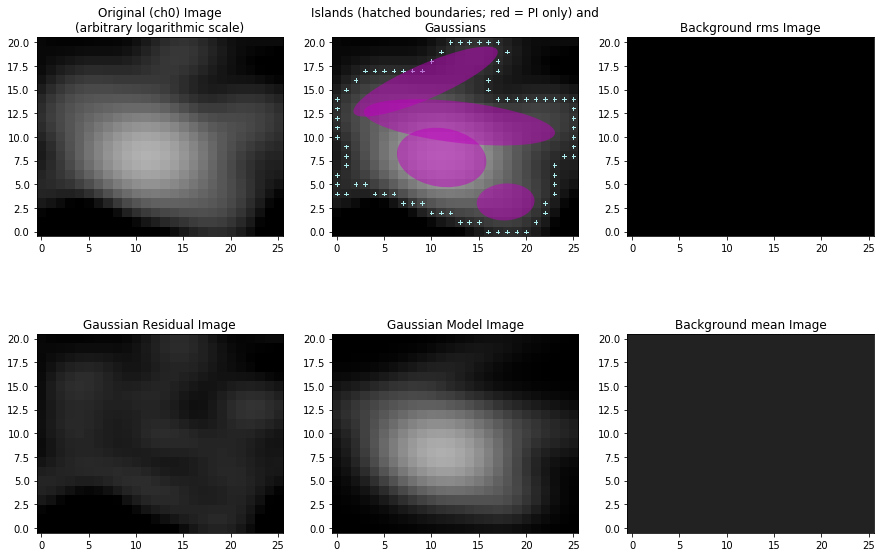

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_100.fits'
Image size .............................. : (17, 12) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.082 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.02129 Jy/beam
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 J

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 1
Total flux density in model ............. : 0.024 Jy
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 1

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.00193 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 1


Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 1
--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 1


New sources found in PI image ........... : 0 (1 total)


Calculating polarisation properties ....  : [|] 0/1Calculating polarisation properties ....  : [=] 1/1Calculating polarisation properties ....  : [=] 1/1
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


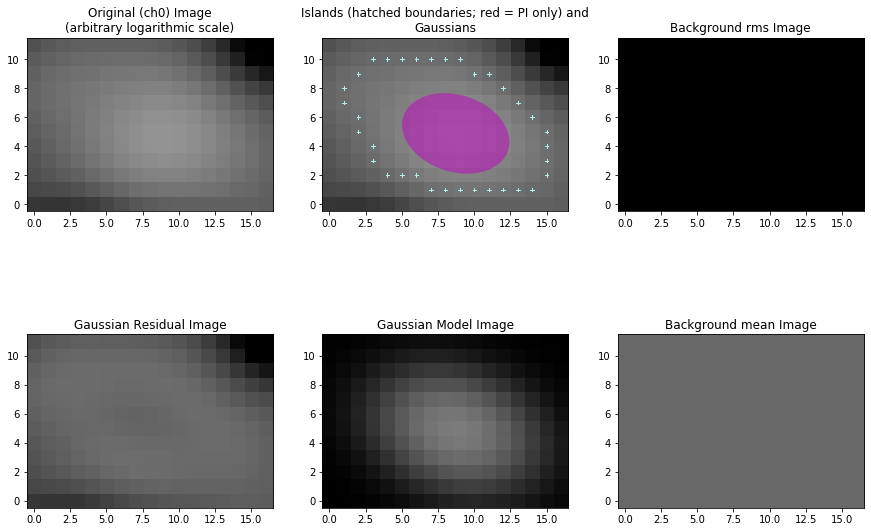

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_101.fits'
Image size .............................. : (41, 21) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 1.174 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (41, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.02355 Jy/beam
Derived rms_box (box size, step size) ... : (41, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 J

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1


Total number of Gaussians fit to image .. : 3
Total flux density in model ............. : 0.905 Jy
--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 1

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.00196 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 2


Fitting islands with Gaussians .......... : [|-] 0/2/Fitting islands with Gaussians .......... : [=/] 1/2Fitting islands with Gaussians .......... : [==] 2/2Fitting islands with Gaussians .......... : [==] 2/2


Total number of Gaussians fit to image .. : 1
--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 1
New sources found in PI image ........... : 0 (1 total)


Calculating polarisation properties ....  : [|] 0/1Calculating polarisation properties ....  : [=] 1/1Calculating polarisation properties ....  : [=] 1/1
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


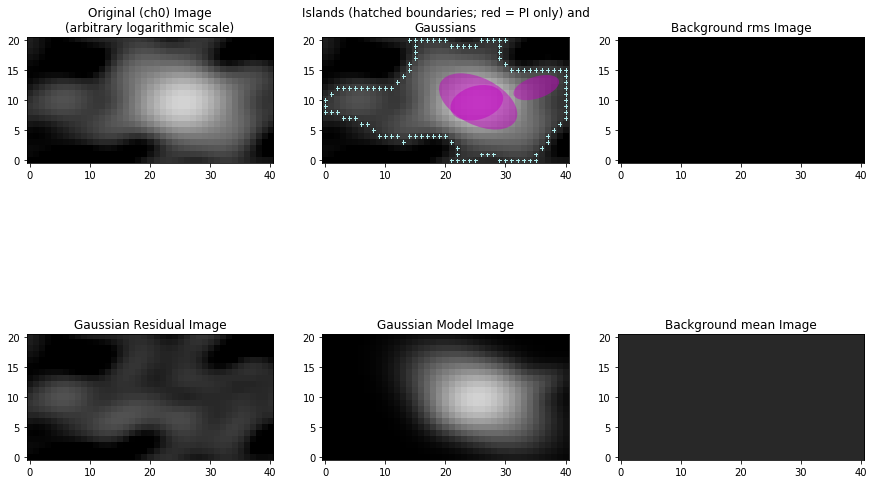

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_102.fits'
Image size .............................. : (17, 15) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.163 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.03777 Jy/beam
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 J

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 1
Total flux density in model ............. : 0.042 Jy


--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 1

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.00273 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 1


Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 0
--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 0


New sources found in PI image ........... : 0 (1 total)


Calculating polarisation properties ....  : [|] 0/1Calculating polarisation properties ....  : [=] 1/1Calculating polarisation properties ....  : [=] 1/1
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


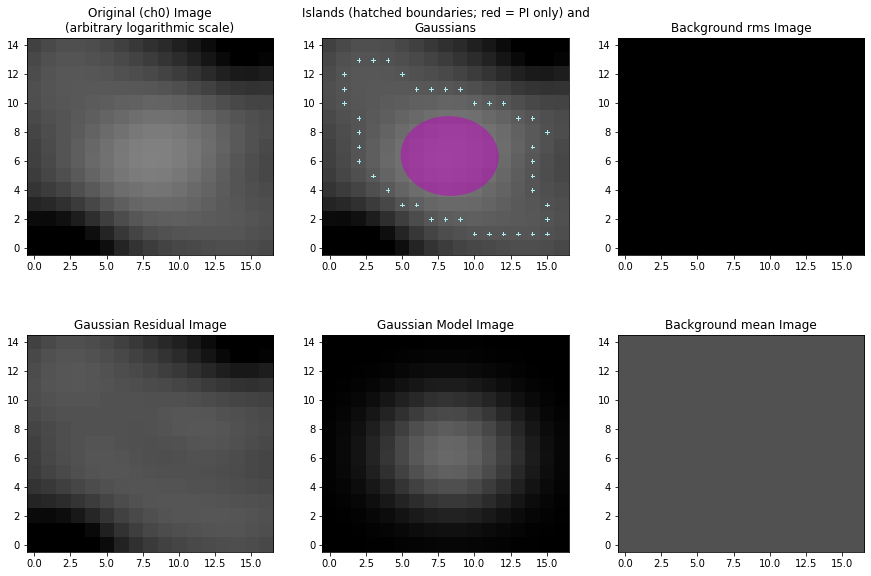

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_103.fits'
Image size .............................. : (14, 11) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.065 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.02927 Jy/beam
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 J

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 1
Total flux density in model ............. : 0.011 Jy
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 1

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.00218 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 1


Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 0
--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 0


New sources found in PI image ........... : 0 (1 total)


Calculating polarisation properties ....  : [|] 0/1Calculating polarisation properties ....  : [=] 1/1Calculating polarisation properties ....  : [=] 1/1
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


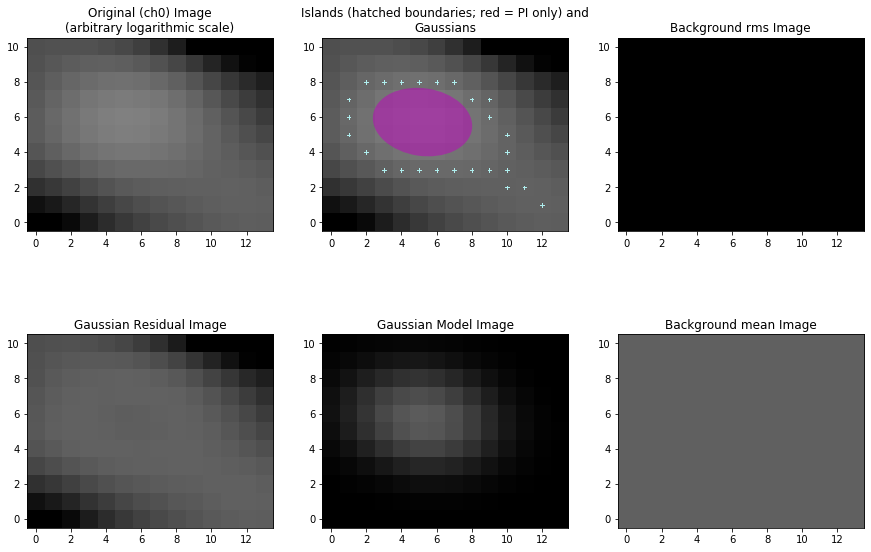

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_104.fits'
Image size .............................. : (50, 26) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 1.055 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 3) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.02139 Jy/beam
Derived rms_box (box size, step size) ... : (32, 3) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 J

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1


Total number of Gaussians fit to image .. : 2
Total flux density in model ............. : 0.702 Jy
--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 2

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 3) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.0023 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 2


Fitting islands with Gaussians .......... : [|-] 0/2/Fitting islands with Gaussians .......... : [=/] 1/2Fitting islands with Gaussians .......... : [==] 2/2Fitting islands with Gaussians .......... : [==] 2/2


Total number of Gaussians fit to image .. : 1
--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 1
New sources found in PI image ........... : 0 (2 total)


Calculating polarisation properties ....  : [|-] 0/2/Calculating polarisation properties ....  : [=/] 1/2Calculating polarisation properties ....  : [==] 2/2Calculating polarisation properties ....  : [==] 2/2
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


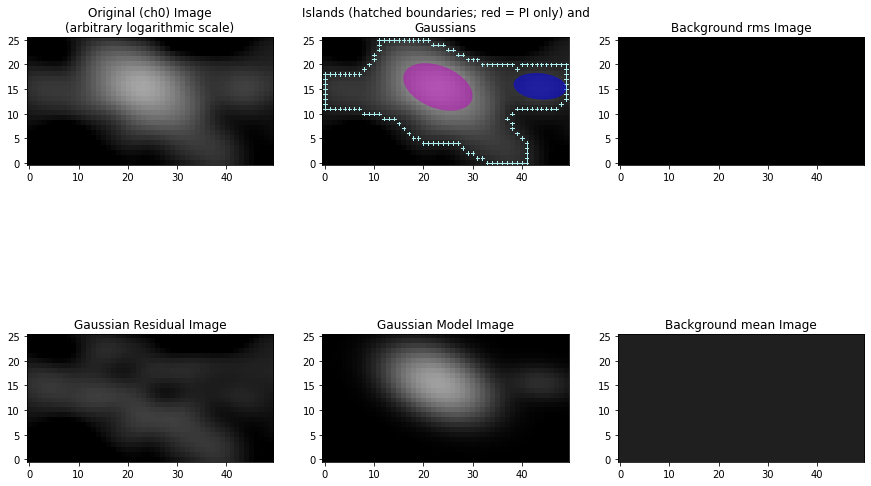

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_105.fits'
Image size .............................. : (19, 19) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.087 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.01392 Jy/beam
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 J

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 1
Total flux density in model ............. : 0.017 Jy


--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 1

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.00257 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 2


Fitting islands with Gaussians .......... : [|-] 0/2/Fitting islands with Gaussians .......... : [=/] 1/2Fitting islands with Gaussians .......... : [==] 2/2Fitting islands with Gaussians .......... : [==] 2/2


Total number of Gaussians fit to image .. : 0
--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 0
New sources found in PI image ........... : 0 (1 total)


Calculating polarisation properties ....  : [|] 0/1Calculating polarisation properties ....  : [=] 1/1Calculating polarisation properties ....  : [=] 1/1
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


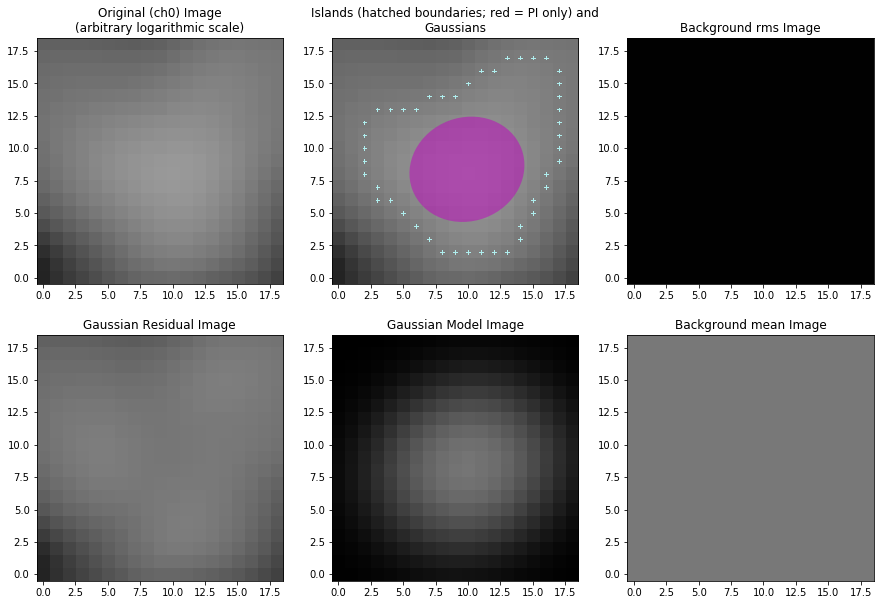

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_106.fits'
Image size .............................. : (20, 17) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.262 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.03173 Jy/beam
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 J

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 1
Total flux density in model ............. : 0.121 Jy
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 1

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.00292 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 2


Fitting islands with Gaussians .......... : [|-] 0/2/Fitting islands with Gaussians .......... : [=/] 1/2Fitting islands with Gaussians .......... : [==] 2/2Fitting islands with Gaussians .......... : [==] 2/2


Total number of Gaussians fit to image .. : 0
--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 0
New sources found in PI image ........... : 0 (1 total)


Calculating polarisation properties ....  : [|] 0/1Calculating polarisation properties ....  : [=] 1/1Calculating polarisation properties ....  : [=] 1/1
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


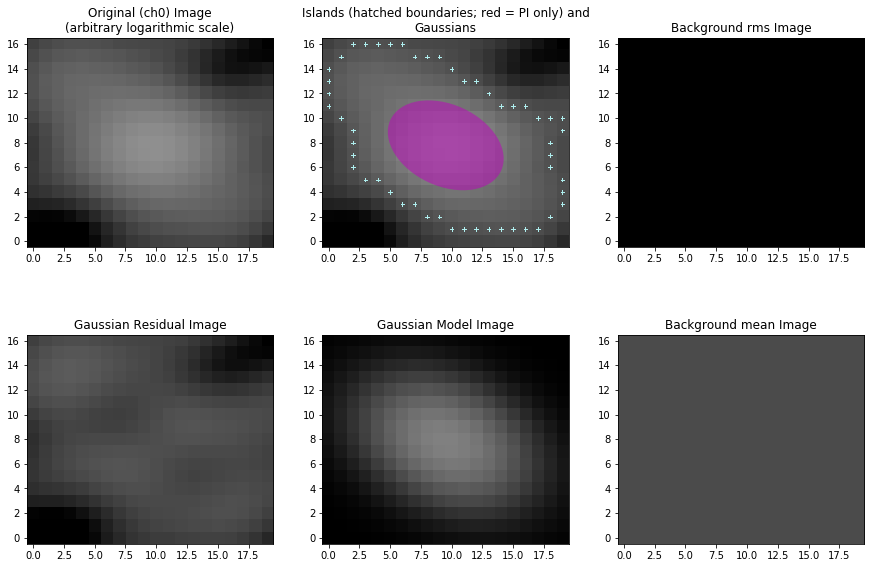

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_107.fits'
Image size .............................. : (18, 13) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.048 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.00921 Jy/beam
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 J

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 1
Total flux density in model ............. : 0.019 Jy


--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 1

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.00206 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 2


Fitting islands with Gaussians .......... : [|-] 0/2/Fitting islands with Gaussians .......... : [=/] 1/2Fitting islands with Gaussians .......... : [==] 2/2Fitting islands with Gaussians .......... : [==] 2/2


Total number of Gaussians fit to image .. : 0
--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 0
New sources found in PI image ........... : 0 (1 total)


Calculating polarisation properties ....  : [|] 0/1Calculating polarisation properties ....  : [=] 1/1Calculating polarisation properties ....  : [=] 1/1
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


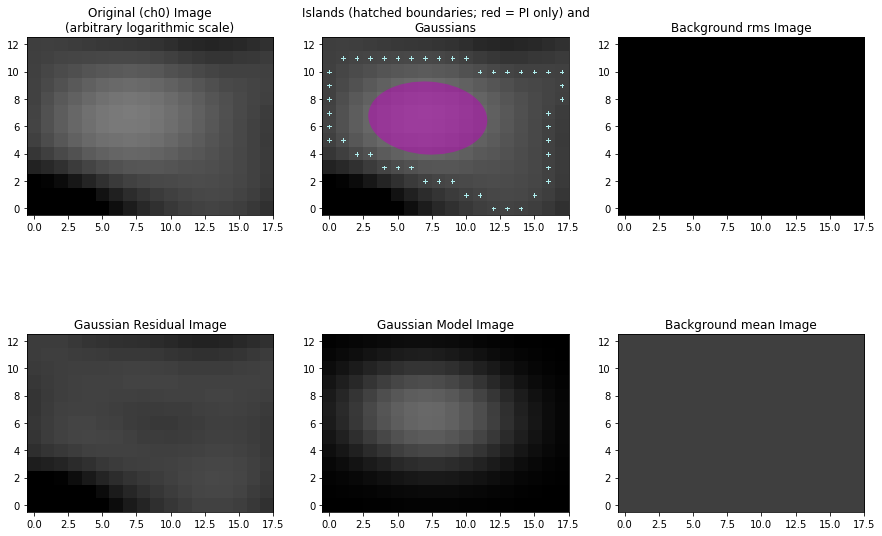

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_108.fits'
Image size .............................. : (29, 20) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.359 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.02108 Jy/beam
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 J

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 1
Total flux density in model ............. : 0.198 Jy
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 1

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.00258 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 1


Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 1
--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 1


New sources found in PI image ........... : 0 (1 total)


Calculating polarisation properties ....  : [|] 0/1Calculating polarisation properties ....  : [=] 1/1Calculating polarisation properties ....  : [=] 1/1
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


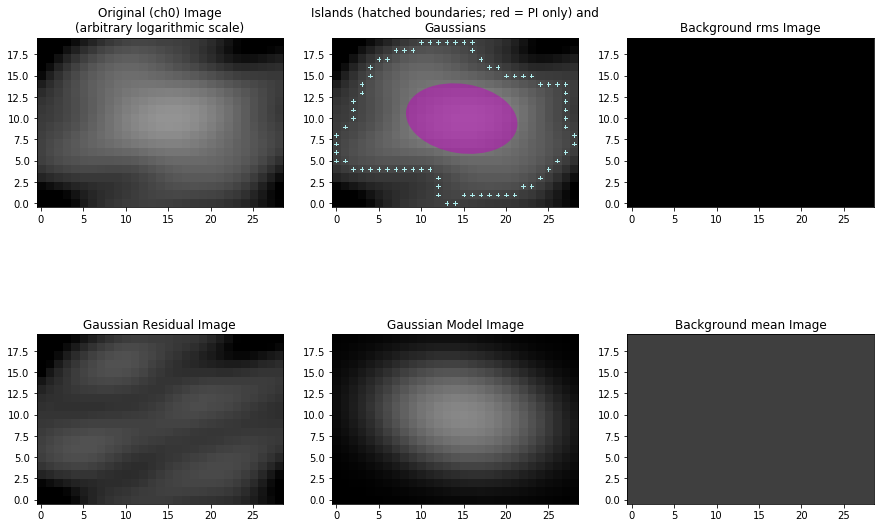

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_109.fits'
Image size .............................. : (17, 12) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.118 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.02699 Jy/beam
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 J

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 1
Total flux density in model ............. : 0.043 Jy
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 1

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.00225 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 1


Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 1
--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 1


New sources found in PI image ........... : 0 (1 total)


Calculating polarisation properties ....  : [|] 0/1Calculating polarisation properties ....  : [=] 1/1Calculating polarisation properties ....  : [=] 1/1
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


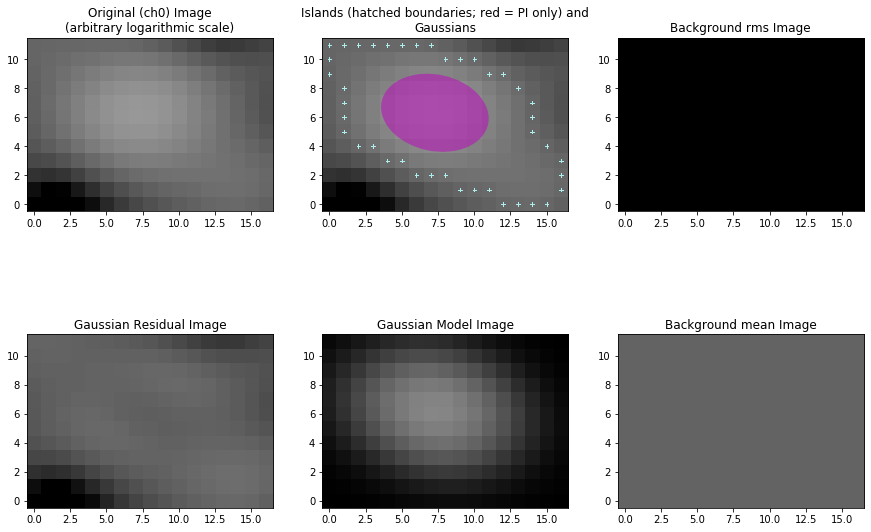

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_110.fits'
Image size .............................. : (17, 13) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.099 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.02285 Jy/beam
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 J

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 1
Total flux density in model ............. : 0.031 Jy


--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 1

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.00183 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 1


Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 0


--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 0
New sources found in PI image ........... : 0 (1 total)


Calculating polarisation properties ....  : [|] 0/1Calculating polarisation properties ....  : [=] 1/1Calculating polarisation properties ....  : [=] 1/1
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


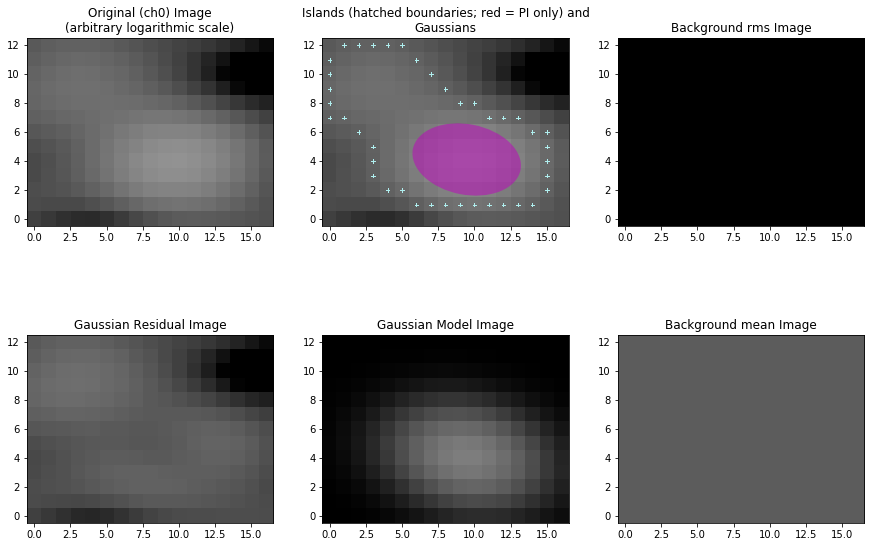

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_111.fits'
Image size .............................. : (40, 21) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.537 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.0102 Jy/beam
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 Jy

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1


Total number of Gaussians fit to image .. : 5
Total flux density in model ............. : 0.494 Jy
--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 2

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.00234 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 3


Fitting islands with Gaussians .......... : [|--] 0/3/Fitting islands with Gaussians .......... : [=/-] 1/3--Fitting islands with Gaussians .......... : [==-] 2/3Fitting islands with Gaussians .......... : [==-] 2/3Fitting islands with Gaussians .......... : [===] 3/3

Total number of Gaussians fit to image .. : 0
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 0
New sources found in PI image ........... : 0 (2 total)


Calculating polarisation properties ....  : [|-] 0/2/Calculating polarisation properties ....  : [=/] 1/2Calculating polarisation properties ....  : [==] 2/2Calculating polarisation properties ....  : [==] 2/2
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


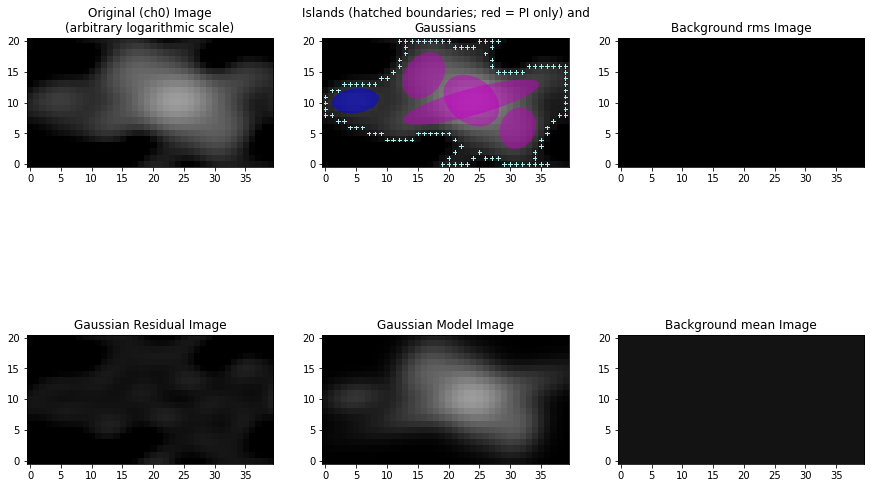

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_112.fits'
Image size .............................. : (30, 22) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 1.634 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (51, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.01321 Jy/beam
Derived rms_box (box size, step size) ... : (51, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 J

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1


Total number of Gaussians fit to image .. : 6
Total flux density in model ............. : 1.575 Jy
--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 2

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (45, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.0024 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 1


Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1


Total number of Gaussians fit to image .. : 3
--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 1
New sources found in PI image ........... : 0 (2 total)


Calculating polarisation properties ....  : [|-] 0/2/Calculating polarisation properties ....  : [=/] 1/2Calculating polarisation properties ....  : [==] 2/2Calculating polarisation properties ....  : [==] 2/2
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


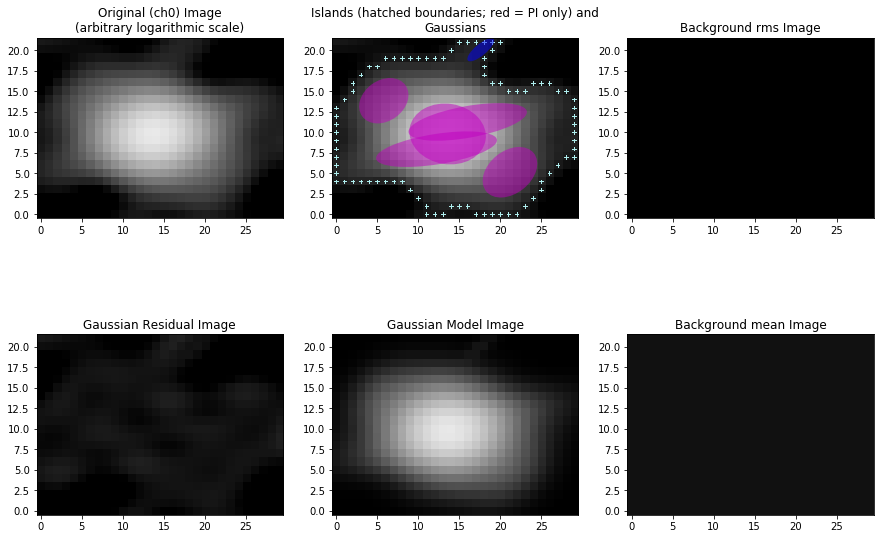

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_113.fits'
Image size .............................. : (14, 9) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.073 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.0332 Jy/beam
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 Jy/

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 1
Total flux density in model ............. : 0.013 Jy
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 1

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.00357 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 1


Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 0
--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 0


New sources found in PI image ........... : 0 (1 total)


Calculating polarisation properties ....  : [|] 0/1Calculating polarisation properties ....  : [=] 1/1Calculating polarisation properties ....  : [=] 1/1
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


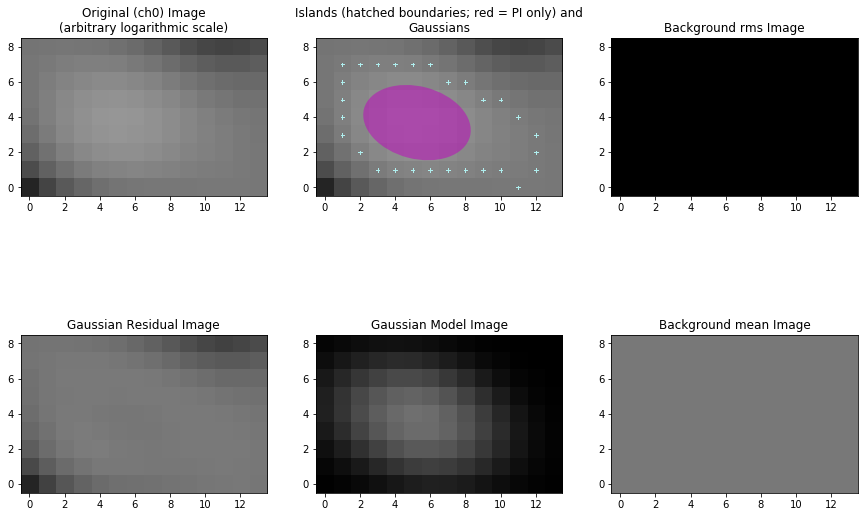

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_114.fits'
Image size .............................. : (16, 11) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.026 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.00918 Jy/beam
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 J

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 1
Total flux density in model ............. : 0.007 Jy


--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 1

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.00214 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 1


Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 0
--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 0
New sources found in PI image ........... : 0 (1 total)



Calculating polarisation properties ....  : [|] 0/1Calculating polarisation properties ....  : [=] 1/1Calculating polarisation properties ....  : [=] 1/1
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


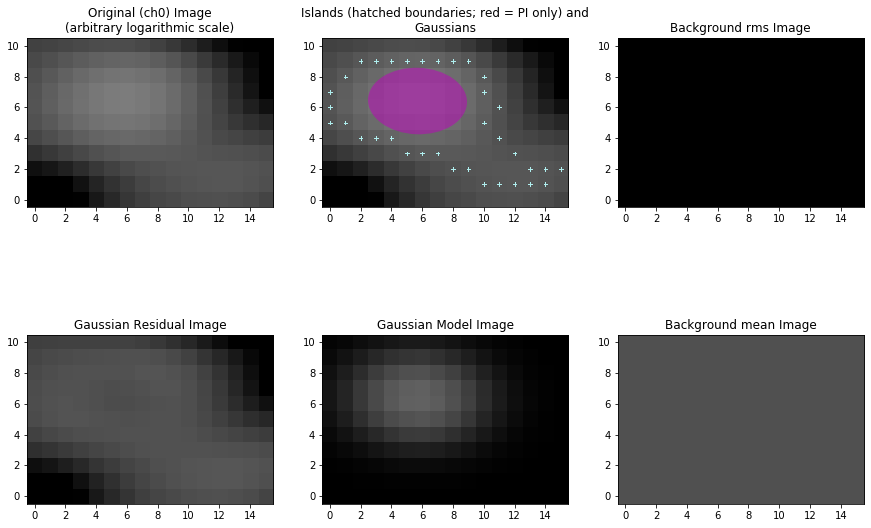

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_115.fits'
Image size .............................. : (26, 15) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.175 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.01843 Jy/beam
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 J

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 1
Total flux density in model ............. : 0.080 Jy
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 1

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.00179 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 2


Fitting islands with Gaussians .......... : [|-] 0/2/Fitting islands with Gaussians .......... : [=/] 1/2Fitting islands with Gaussians .......... : [==] 2/2Fitting islands with Gaussians .......... : [==] 2/2


Total number of Gaussians fit to image .. : 0
--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 0
New sources found in PI image ........... : 0 (1 total)


Calculating polarisation properties ....  : [|] 0/1Calculating polarisation properties ....  : [=] 1/1Calculating polarisation properties ....  : [=] 1/1
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


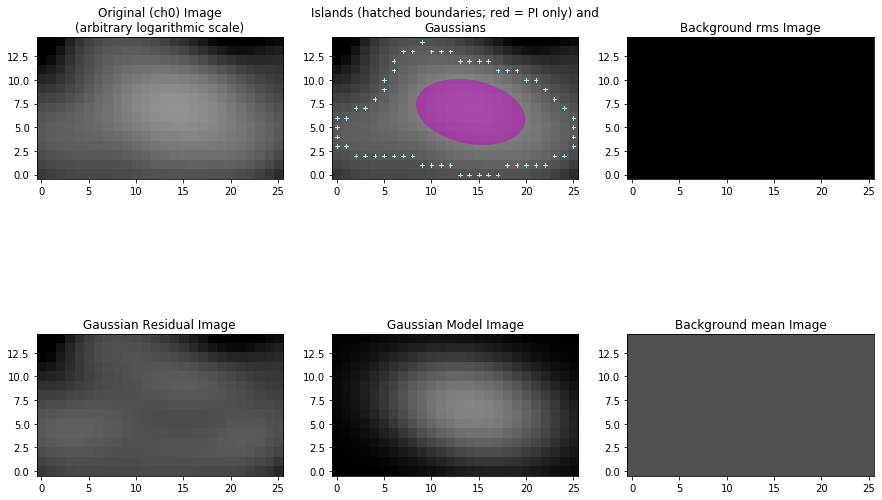

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_116.fits'
Image size .............................. : (43, 24) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 1.164 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (51, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.02007 Jy/beam
Derived rms_box (box size, step size) ... : (51, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 J

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1


Total number of Gaussians fit to image .. : 6
Total flux density in model ............. : 0.936 Jy
--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 2

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.00248 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 2


Fitting islands with Gaussians .......... : [|-] 0/2/Fitting islands with Gaussians .......... : [=/] 1/2Fitting islands with Gaussians .......... : [==] 2/2Fitting islands with Gaussians .......... : [==] 2/2


Total number of Gaussians fit to image .. : 1
--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 1
New sources found in PI image ........... : 0 (2 total)


Calculating polarisation properties ....  : [|-] 0/2/Calculating polarisation properties ....  : [=/] 1/2Calculating polarisation properties ....  : [==] 2/2Calculating polarisation properties ....  : [==] 2/2
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


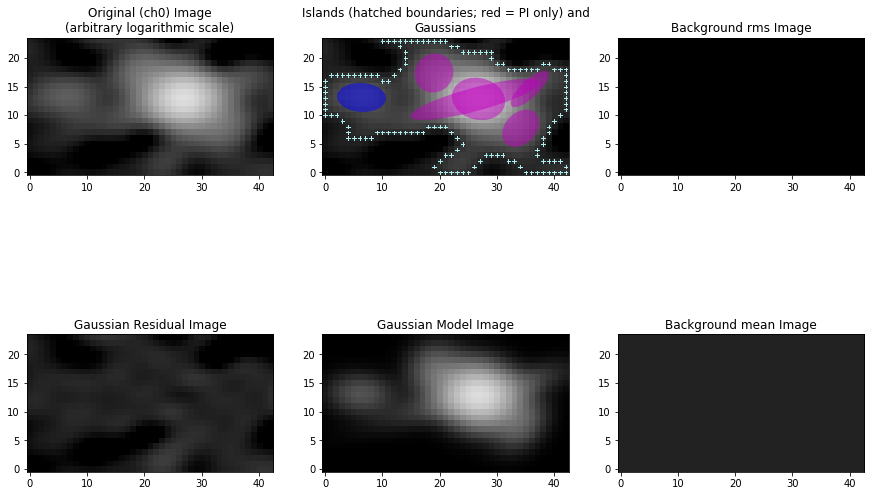

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_117.fits'
Image size .............................. : (29, 21) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.652 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.0189 Jy/beam
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 Jy

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1


Total number of Gaussians fit to image .. : 4
Total flux density in model ............. : 0.545 Jy
--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 1

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (35, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.00211 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 2


Fitting islands with Gaussians .......... : [|-] 0/2/Fitting islands with Gaussians .......... : [=/] 1/2Fitting islands with Gaussians .......... : [==] 2/2Fitting islands with Gaussians .......... : [==] 2/2


Total number of Gaussians fit to image .. : 1
--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 1
New sources found in PI image ........... : 0 (1 total)


Calculating polarisation properties ....  : [|] 0/1Calculating polarisation properties ....  : [=] 1/1Calculating polarisation properties ....  : [=] 1/1
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


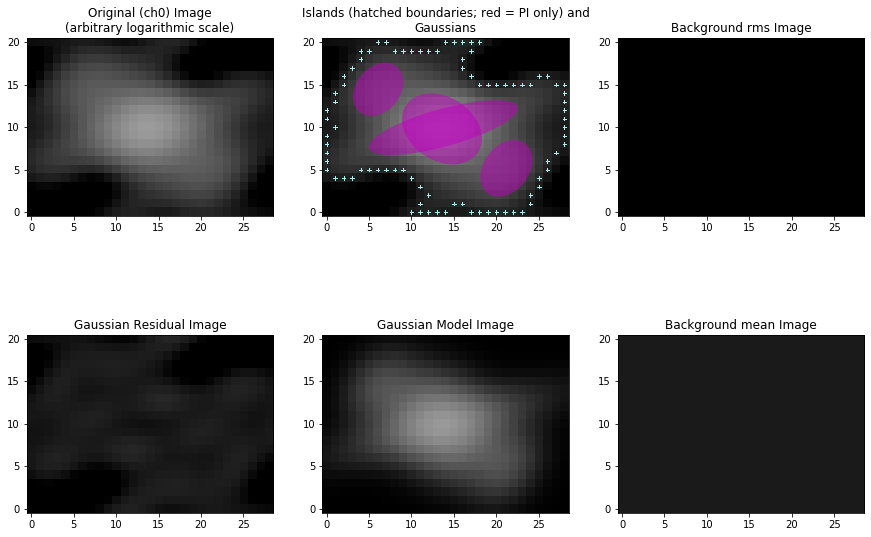

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_118.fits'
Image size .............................. : (43, 25) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 2.725 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (81, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.00977 Jy/beam
Derived rms_box (box size, step size) ... : (81, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 J

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1


Total number of Gaussians fit to image .. : 8
Total flux density in model ............. : 2.611 Jy
--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 2

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (61, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.00282 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 3


Fitting islands with Gaussians .......... : [|--] 0/3/Fitting islands with Gaussians .......... : [=/-] 1/3-Fitting islands with Gaussians .......... : [==-] 2/3Fitting islands with Gaussians .......... : [===] 3/3Fitting islands with Gaussians .......... : [===] 3/3

Total number of Gaussians fit to image .. : 2
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 1
New sources found in PI image ........... : 0 (2 total)


Calculating polarisation properties ....  : [|-] 0/2/Calculating polarisation properties ....  : [=/] 1/2Calculating polarisation properties ....  : [==] 2/2Calculating polarisation properties ....  : [==] 2/2
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


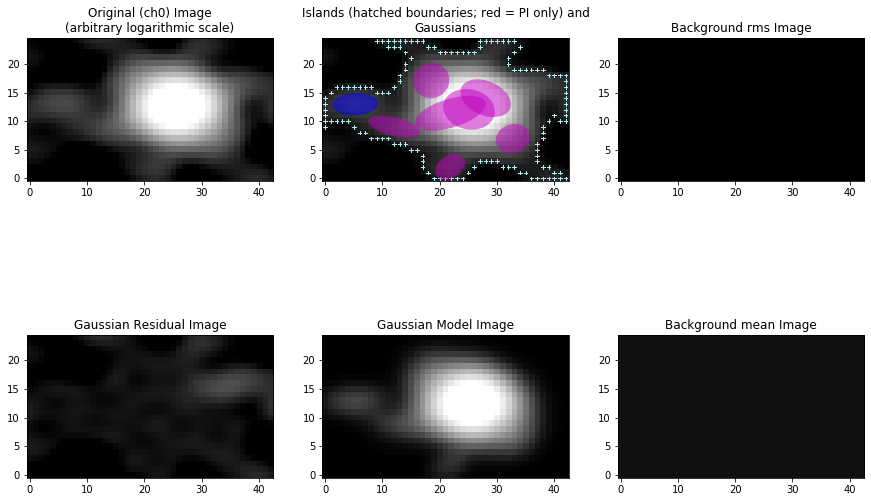

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_119.fits'
Image size .............................. : (20, 16) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.132 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.02429 Jy/beam
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 J

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 1
Total flux density in model ............. : 0.038 Jy
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 1

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.00263 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 1


Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 0
--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 0


New sources found in PI image ........... : 0 (1 total)


Calculating polarisation properties ....  : [|] 0/1Calculating polarisation properties ....  : [=] 1/1Calculating polarisation properties ....  : [=] 1/1
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


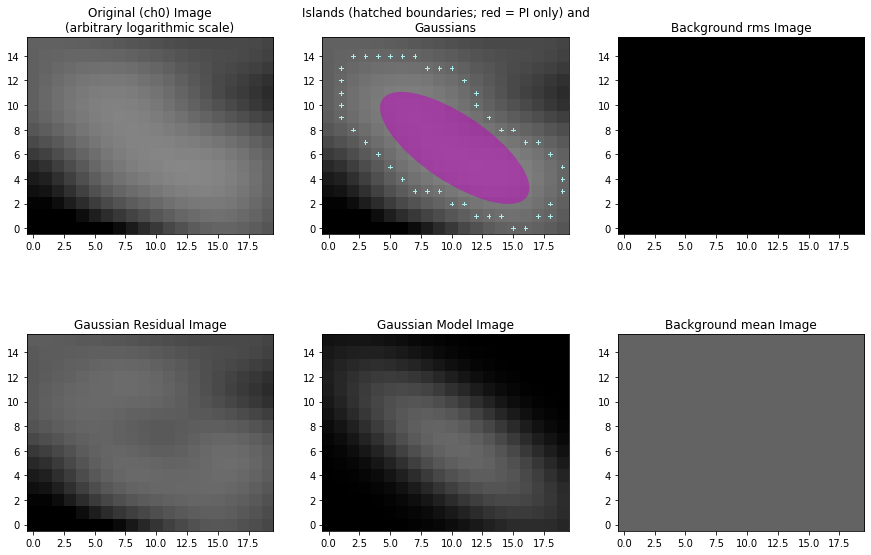

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_120.fits'
Image size .............................. : (48, 19) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.353 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.01561 Jy/beam
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 J

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 3
Total flux density in model ............. : 0.190 Jy


--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 2

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.00219 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 2


Fitting islands with Gaussians .......... : [|-] 0/2/Fitting islands with Gaussians .......... : [=/] 1/2Fitting islands with Gaussians .......... : [==] 2/2Fitting islands with Gaussians .......... : [==] 2/2


Total number of Gaussians fit to image .. : 0
--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 0
New sources found in PI image ........... : 0 (2 total)


Calculating polarisation properties ....  : [|-] 0/2/Calculating polarisation properties ....  : [=/] 1/2Calculating polarisation properties ....  : [==] 2/2Calculating polarisation properties ....  : [==] 2/2
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


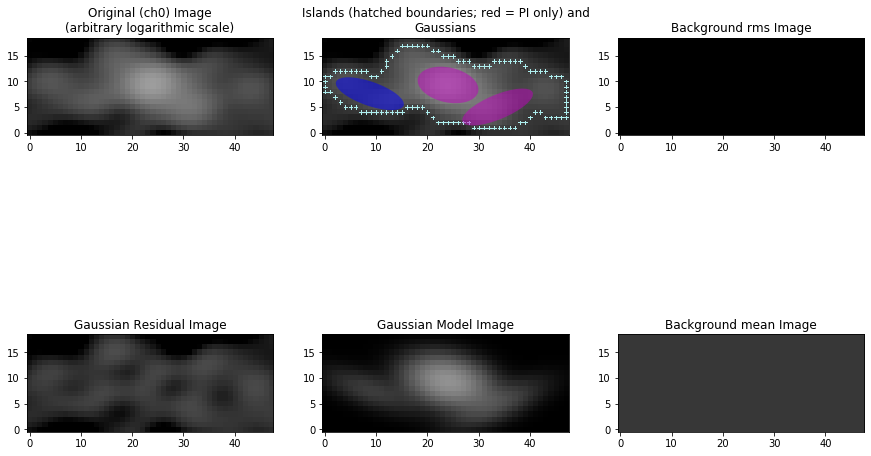

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_121.fits'
Image size .............................. : (30, 20) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.413 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.01532 Jy/beam
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 J

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 5
Total flux density in model ............. : 0.326 Jy
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 1

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.00192 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 3


Fitting islands with Gaussians .......... : [|--] 0/3/Fitting islands with Gaussians .......... : [=/-] 1/3-Fitting islands with Gaussians .......... : [==-] 2/3Fitting islands with Gaussians .......... : [===] 3/3Fitting islands with Gaussians .......... : [===] 3/3

Total number of Gaussians fit to image .. : 1
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 1
New sources found in PI image ........... : 0 (1 total)


Calculating polarisation properties ....  : [|] 0/1Calculating polarisation properties ....  : [=] 1/1Calculating polarisation properties ....  : [=] 1/1
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


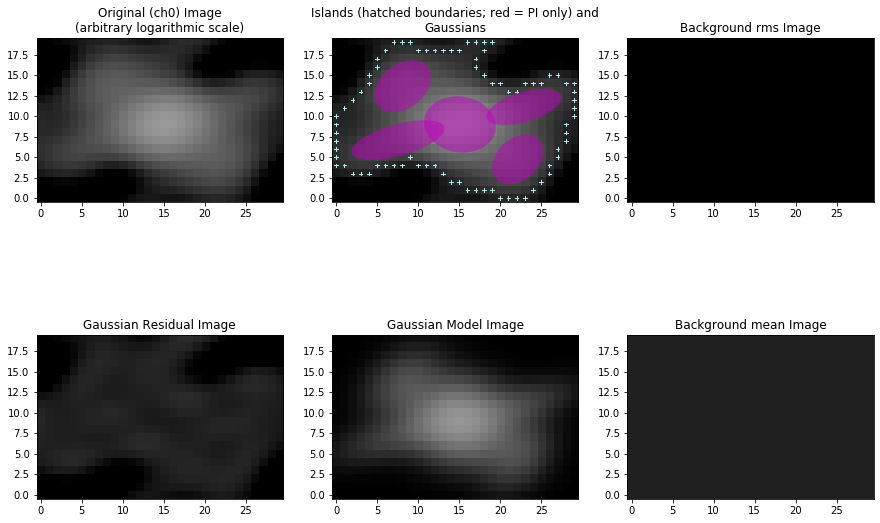

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_122.fits'
Image size .............................. : (25, 18) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.181 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.01908 Jy/beam
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 J

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 1
Total flux density in model ............. : 0.062 Jy
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 1

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.00225 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 2


Fitting islands with Gaussians .......... : [|-] 0/2/Fitting islands with Gaussians .......... : [=/] 1/2Fitting islands with Gaussians .......... : [==] 2/2Fitting islands with Gaussians .......... : [==] 2/2


Total number of Gaussians fit to image .. : 0
--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 0
New sources found in PI image ........... : 0 (1 total)


Calculating polarisation properties ....  : [|] 0/1Calculating polarisation properties ....  : [=] 1/1Calculating polarisation properties ....  : [=] 1/1
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


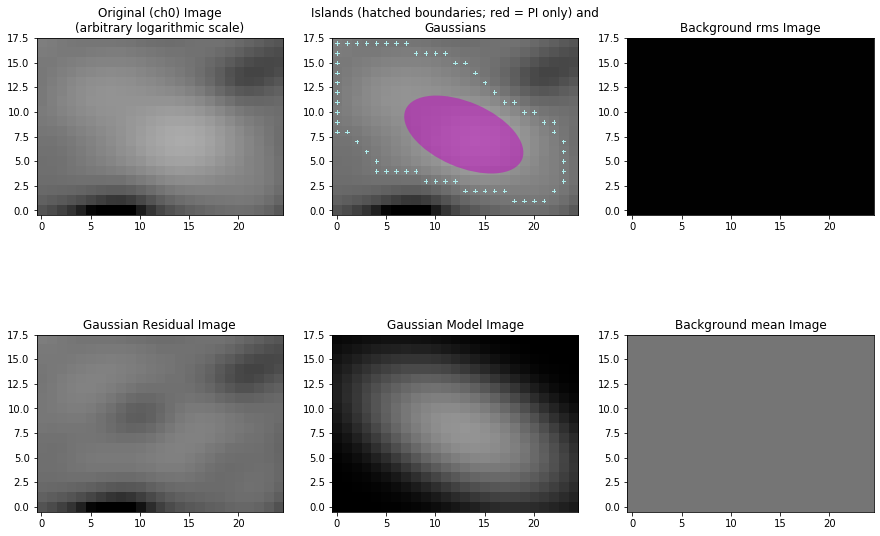

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_123.fits'
Image size .............................. : (44, 26) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.734 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 3) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.01894 Jy/beam
Derived rms_box (box size, step size) ... : (32, 3) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 J

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1


Total number of Gaussians fit to image .. : 2
Total flux density in model ............. : 0.505 Jy
--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 1

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 3) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.00226 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 3


Fitting islands with Gaussians .......... : [|--] 0/3/Fitting islands with Gaussians .......... : [=/-] 1/3-Fitting islands with Gaussians .......... : [==-] 2/3Fitting islands with Gaussians .......... : [===] 3/3Fitting islands with Gaussians .......... : [===] 3/3

Total number of Gaussians fit to image .. : 0
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 0
New sources found in PI image ........... : 0 (1 total)


Calculating polarisation properties ....  : [|] 0/1Calculating polarisation properties ....  : [=] 1/1Calculating polarisation properties ....  : [=] 1/1
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


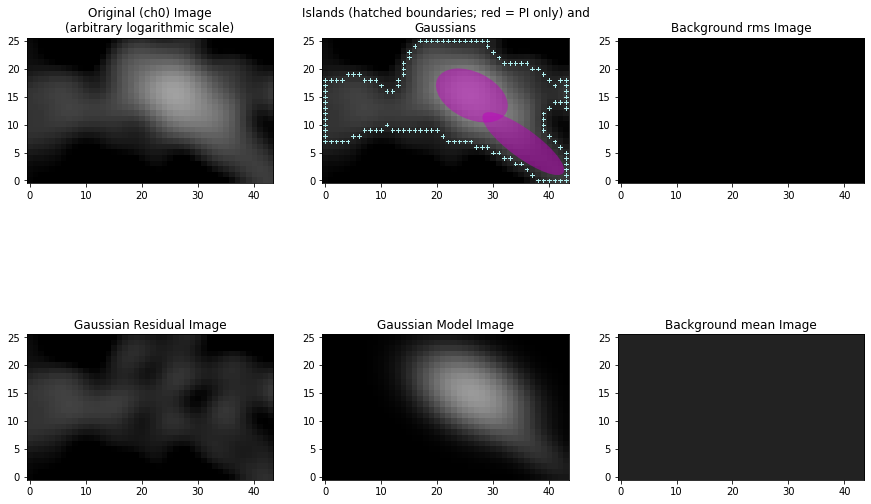

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_124.fits'
Image size .............................. : (21, 21) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.146 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.0137 Jy/beam
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 Jy

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 1
Total flux density in model ............. : 0.060 Jy
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 1

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.00196 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 1


Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 0
--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 0


New sources found in PI image ........... : 0 (1 total)


Calculating polarisation properties ....  : [|] 0/1Calculating polarisation properties ....  : [=] 1/1Calculating polarisation properties ....  : [=] 1/1
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


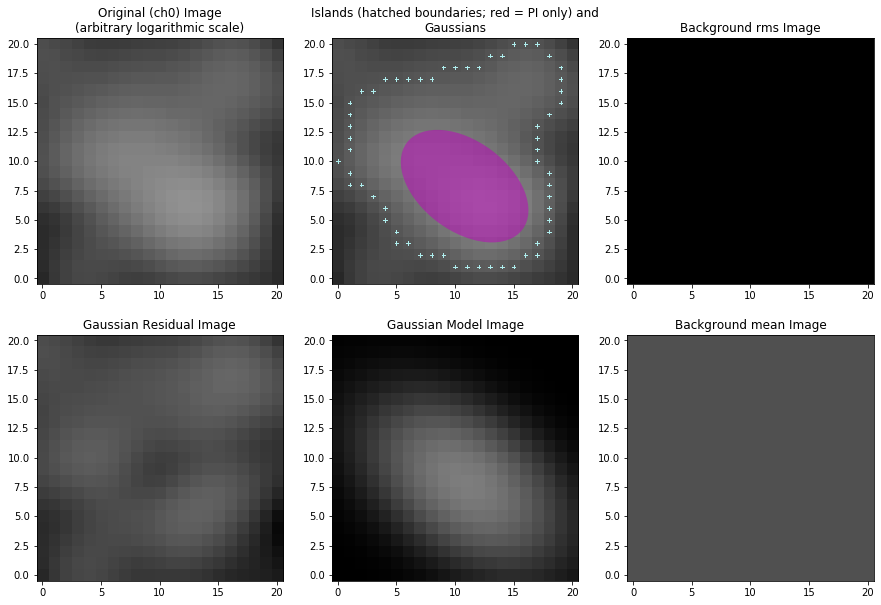

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_125.fits'
Image size .............................. : (33, 16) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.210 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.02459 Jy/beam
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 J

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 0
Total flux density in model ............. : 0.000 Jy
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 0
    Island #0 (x=13, y=4)
Please check this island. If it is a valid island and
should be fit, try adjusting the flagging options (use
show_fit with "ch0_flagged=True" to see the flagged Gaussians)
or enabling the wavelet module (with "atrous_do=True").
To include empty islands in output source catalogs, set
incl_empty=True in the write_catalog task.

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.00205 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 3


Fitting islands with Gaussians .......... : [|--] 0/3//Fitting islands with Gaussians .......... : [=/-] 1/3Fitting islands with Gaussians .......... : [=/-] 1/3-Fitting islands with Gaussians .......... : [==-] 2/3Fitting islands with Gaussians .......... : [===] 3/3

Total number of Gaussians fit to image .. : 0
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 0
--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_126.fits'
Image size .............................. : (22, 22) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.172 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.01799 Jy/beam
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 1
Total flux density in model ............. : 0.060 Jy
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 1

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.00218 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 4


Fitting islands with Gaussians .......... : [|---] 0/4/Fitting islands with Gaussians .......... : [=/--] 1/4-Fitting islands with Gaussians .......... : [==--] 2/4\Fitting islands with Gaussians .......... : [===\] 3/4Fitting islands with Gaussians .......... : [====] 4/4Fitting islands with Gaussians .......... : [====] 4/4

Total number of Gaussians fit to image .. : 0
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 0
New sources found in PI image ........... : 0 (1 total)


Calculating polarisation properties ....  : [|] 0/1Calculating polarisation properties ....  : [=] 1/1Calculating polarisation properties ....  : [=] 1/1
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


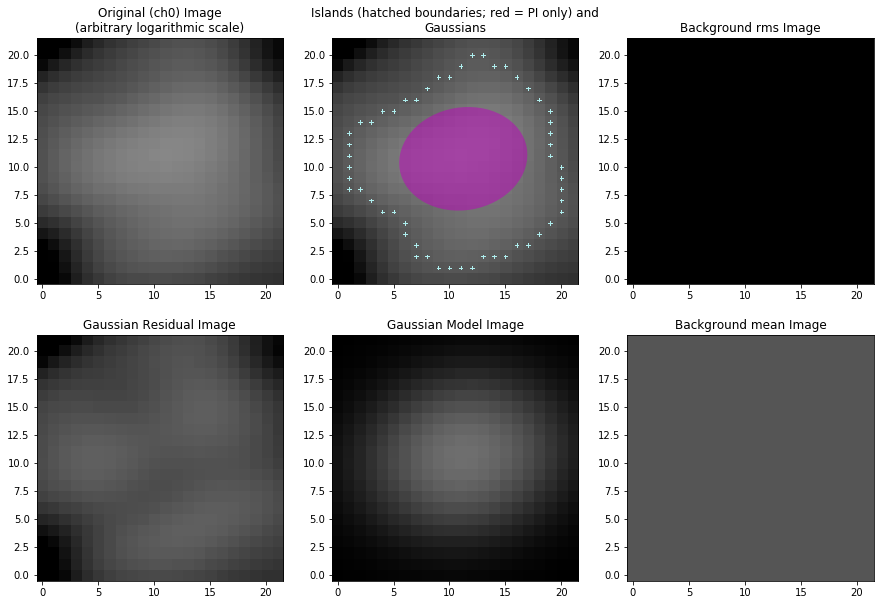

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_127.fits'
Image size .............................. : (13, 9) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.028 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.01215 Jy/beam
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 Jy

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 1
Total flux density in model ............. : 0.008 Jy
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 1

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.0019 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 1


Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 0
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 0
New sources found in PI image ........... : 0 (1 total)


Calculating polarisation properties ....  : [|] 0/1Calculating polarisation properties ....  : [=] 1/1Calculating polarisation properties ....  : [=] 1/1
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


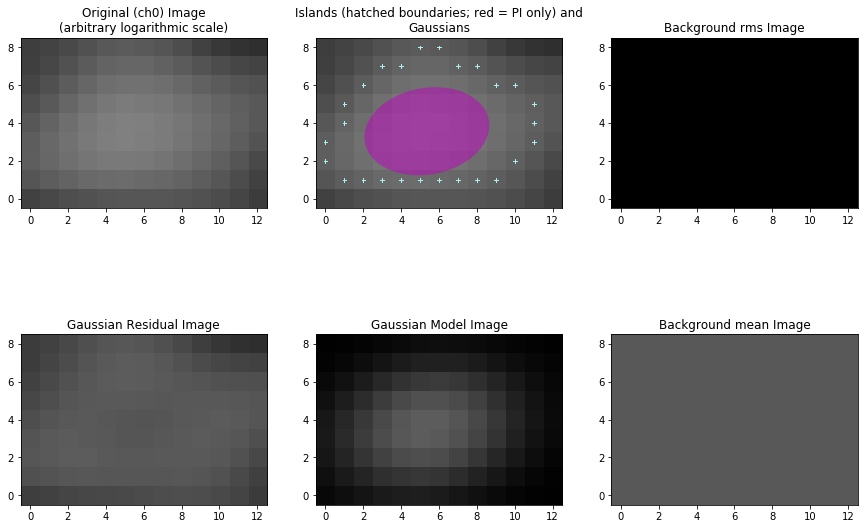

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_128.fits'
Image size .............................. : (21, 18) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.188 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.0227 Jy/beam
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 Jy

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 1
Total flux density in model ............. : 0.084 Jy
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 1

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.00216 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 1


Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 0
--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 0


New sources found in PI image ........... : 0 (1 total)


Calculating polarisation properties ....  : [|] 0/1Calculating polarisation properties ....  : [=] 1/1Calculating polarisation properties ....  : [=] 1/1
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


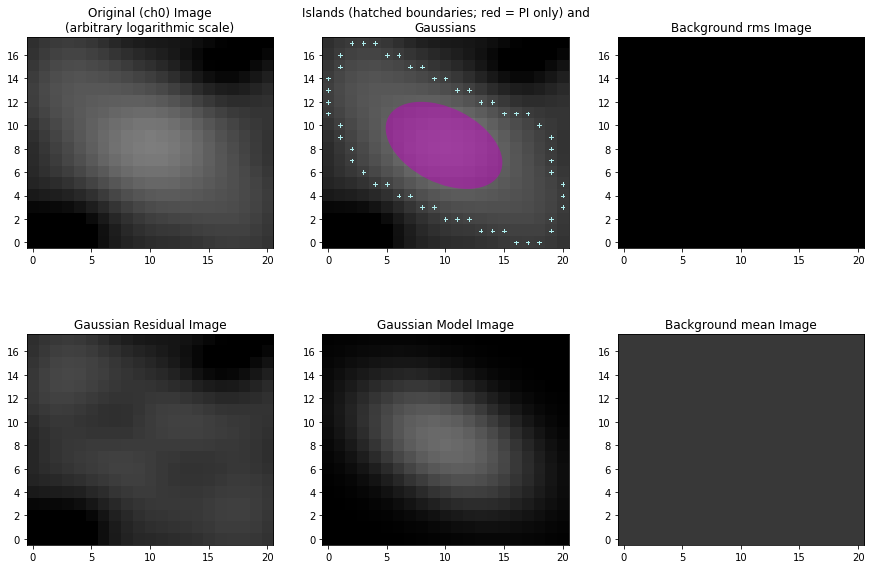

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_129.fits'
Image size .............................. : (24, 16) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.255 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.02346 Jy/beam
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 J

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 1
Total flux density in model ............. : 0.126 Jy
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 1

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.00265 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 2


Fitting islands with Gaussians .......... : [|-] 0/2/Fitting islands with Gaussians .......... : [=/] 1/2Fitting islands with Gaussians .......... : [==] 2/2Fitting islands with Gaussians .......... : [==] 2/2


Total number of Gaussians fit to image .. : 1
--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 1
New sources found in PI image ........... : 0 (1 total)


Calculating polarisation properties ....  : [|] 0/1Calculating polarisation properties ....  : [=] 1/1Calculating polarisation properties ....  : [=] 1/1
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


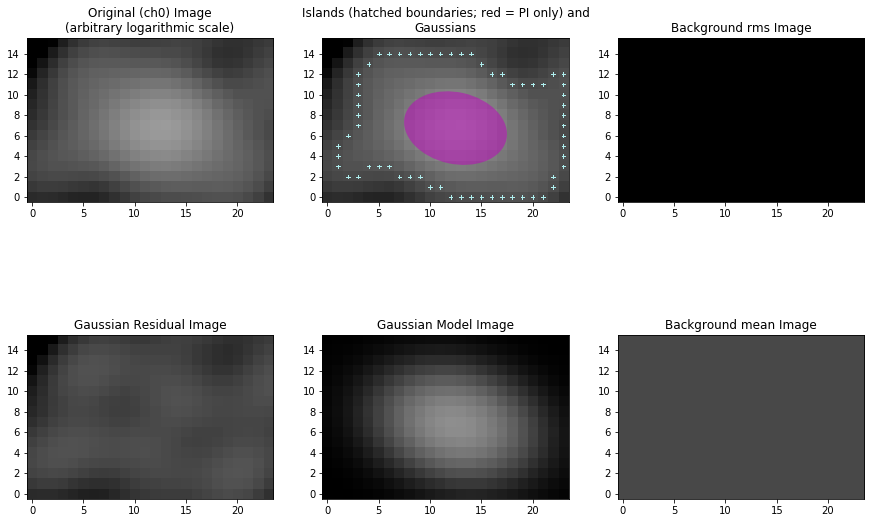

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_130.fits'
Image size .............................. : (16, 13) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.079 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.01853 Jy/beam
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 J

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 1
Total flux density in model ............. : 0.025 Jy


--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 1

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.00223 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 2


Fitting islands with Gaussians .......... : [|-] 0/2/Fitting islands with Gaussians .......... : [=/] 1/2Fitting islands with Gaussians .......... : [==] 2/2Fitting islands with Gaussians .......... : [==] 2/2


Total number of Gaussians fit to image .. : 0
--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 0
New sources found in PI image ........... : 0 (1 total)


Calculating polarisation properties ....  : [|] 0/1Calculating polarisation properties ....  : [=] 1/1Calculating polarisation properties ....  : [=] 1/1
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


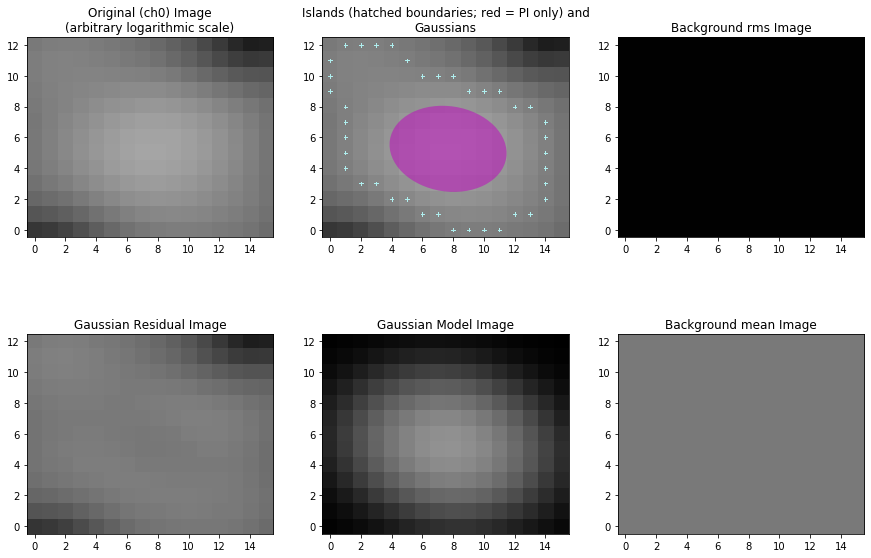

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_131.fits'
Image size .............................. : (20, 15) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.096 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.01828 Jy/beam
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 J

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 1
Total flux density in model ............. : 0.023 Jy
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 1

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.00197 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 3


Fitting islands with Gaussians .......... : [|--] 0/3/Fitting islands with Gaussians .......... : [=/-] 1/3-Fitting islands with Gaussians .......... : [==-] 2/3Fitting islands with Gaussians .......... : [===] 3/3Fitting islands with Gaussians .......... : [===] 3/3

Total number of Gaussians fit to image .. : 0
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 0
New sources found in PI image ........... : 0 (1 total)


Calculating polarisation properties ....  : [|] 0/1Calculating polarisation properties ....  : [=] 1/1Calculating polarisation properties ....  : [=] 1/1
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


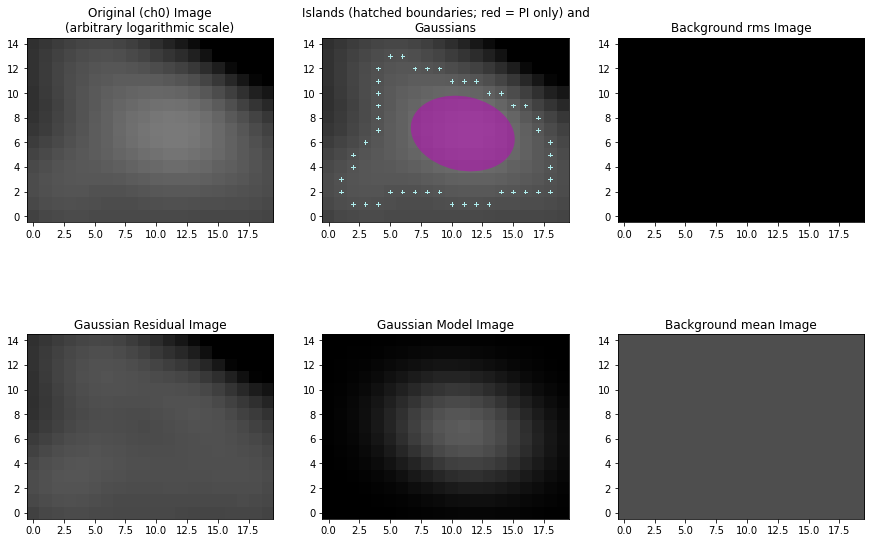

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_132.fits'
Image size .............................. : (12, 9) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.035 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.01864 Jy/beam
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 Jy

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 1
Total flux density in model ............. : 0.008 Jy


--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 1

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.00155 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 1


Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 0


--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 0
New sources found in PI image ........... : 0 (1 total)


Calculating polarisation properties ....  : [|] 0/1Calculating polarisation properties ....  : [=] 1/1Calculating polarisation properties ....  : [=] 1/1
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


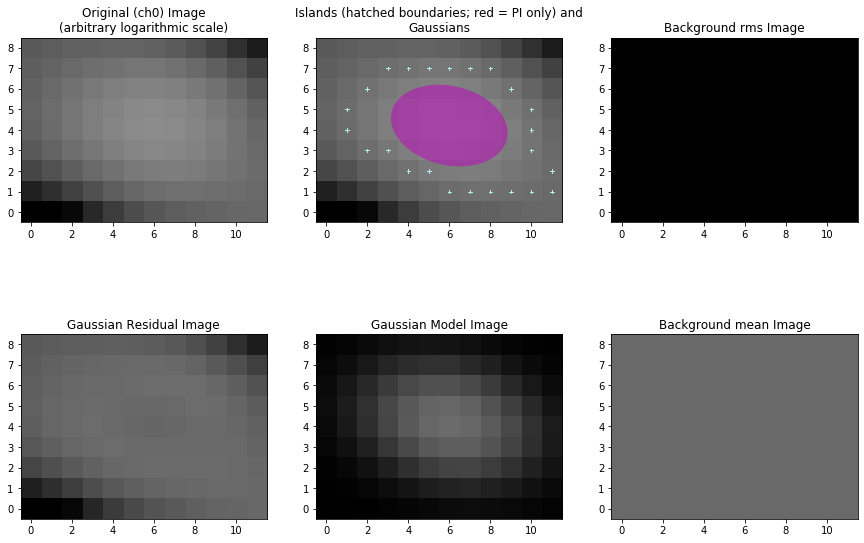

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_133.fits'
Image size .............................. : (39, 21) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.118 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.00596 Jy/beam
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 J

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 2
Total flux density in model ............. : 0.054 Jy
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 1

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.0018 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 4


Fitting islands with Gaussians .......... : [|---] 0/4/Fitting islands with Gaussians .......... : [=/--] 1/4-Fitting islands with Gaussians .......... : [==--] 2/4\Fitting islands with Gaussians .......... : [===\] 3/4Fitting islands with Gaussians .......... : [====] 4/4Fitting islands with Gaussians .......... : [====] 4/4

Total number of Gaussians fit to image .. : 1
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 1
New sources found in PI image ........... : 1 (2 total)


Calculating polarisation properties ....  : [|-] 0/2/Calculating polarisation properties ....  : [=/] 1/2Calculating polarisation properties ....  : [==] 2/2Calculating polarisation properties ....  : [==] 2/2
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


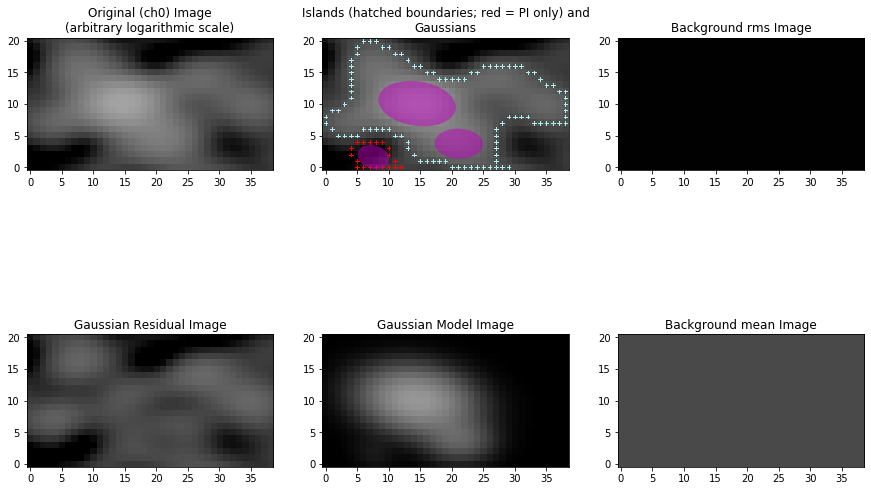

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_134.fits'
Image size .............................. : (39, 20) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.215 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.00984 Jy/beam
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 J

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 1
Total flux density in model ............. : 0.123 Jy
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 1

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.0019 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 2


Fitting islands with Gaussians .......... : [|-] 0/2/Fitting islands with Gaussians .......... : [=/] 1/2Fitting islands with Gaussians .......... : [==] 2/2Fitting islands with Gaussians .......... : [==] 2/2


Total number of Gaussians fit to image .. : 0
--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 0
New sources found in PI image ........... : 0 (1 total)


Calculating polarisation properties ....  : [|] 0/1Calculating polarisation properties ....  : [=] 1/1Calculating polarisation properties ....  : [=] 1/1
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


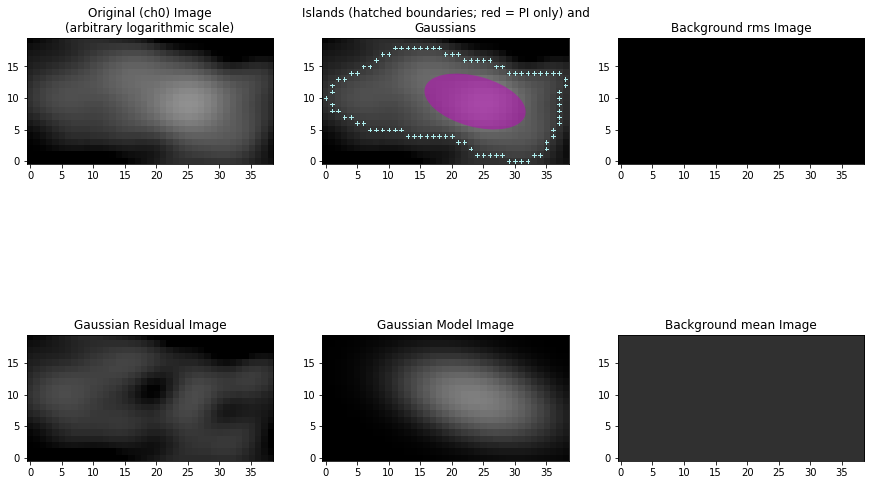

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_135.fits'
Image size .............................. : (21, 14) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.097 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.01752 Jy/beam
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 J

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 1
Total flux density in model ............. : 0.032 Jy
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 1

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.00211 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 1


Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 0
--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 0
New sources found in PI image ........... : 0 (1 total)



Calculating polarisation properties ....  : [|] 0/1Calculating polarisation properties ....  : [=] 1/1Calculating polarisation properties ....  : [=] 1/1
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


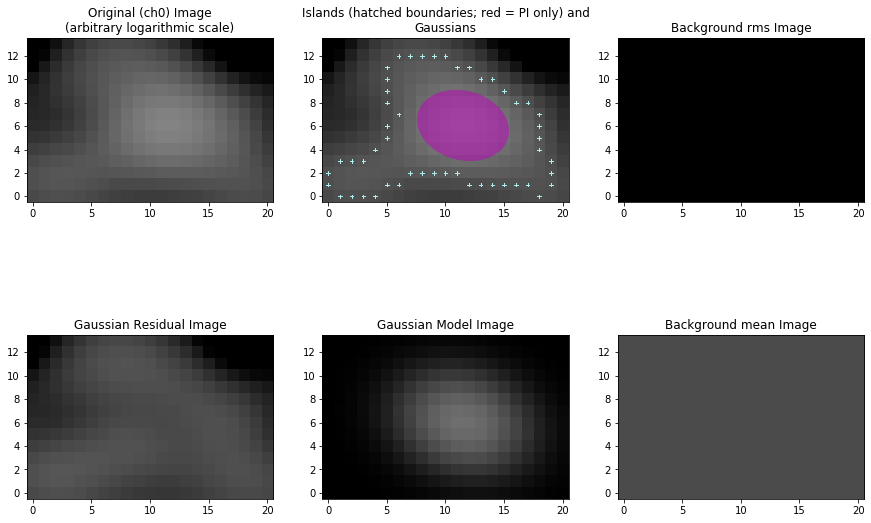

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_136.fits'
Image size .............................. : (26, 18) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.186 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.01944 Jy/beam
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 J

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 1
Total flux density in model ............. : 0.059 Jy


--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 1

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.00199 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 2


Fitting islands with Gaussians .......... : [|-] 0/2/Fitting islands with Gaussians .......... : [=/] 1/2Fitting islands with Gaussians .......... : [==] 2/2Fitting islands with Gaussians .......... : [==] 2/2


Total number of Gaussians fit to image .. : 0
--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 0
New sources found in PI image ........... : 0 (1 total)


Calculating polarisation properties ....  : [|] 0/1Calculating polarisation properties ....  : [=] 1/1Calculating polarisation properties ....  : [=] 1/1
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


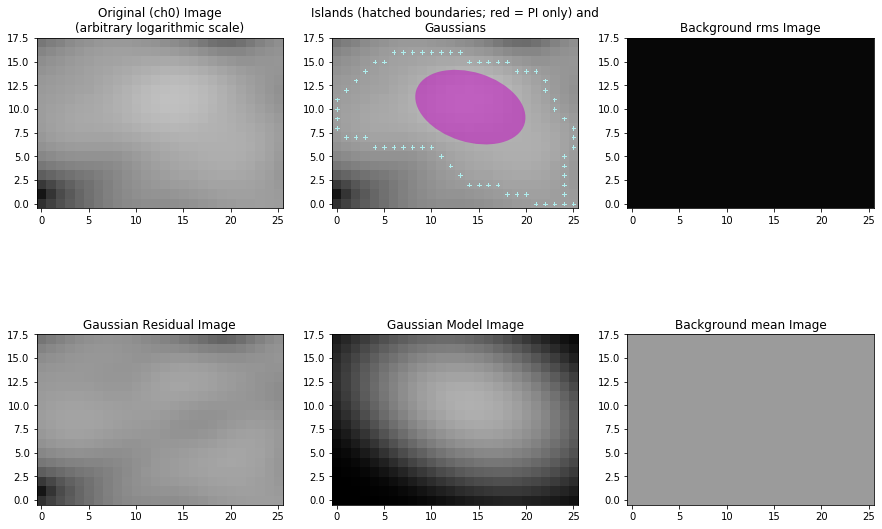

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_137.fits'
Image size .............................. : (26, 17) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.186 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.01775 Jy/beam
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 J

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 1
Total flux density in model ............. : 0.083 Jy
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 1

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.00195 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 1


Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 0
--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 0
New sources found in PI image ........... : 0 (1 total)



Calculating polarisation properties ....  : [|] 0/1Calculating polarisation properties ....  : [=] 1/1Calculating polarisation properties ....  : [=] 1/1
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


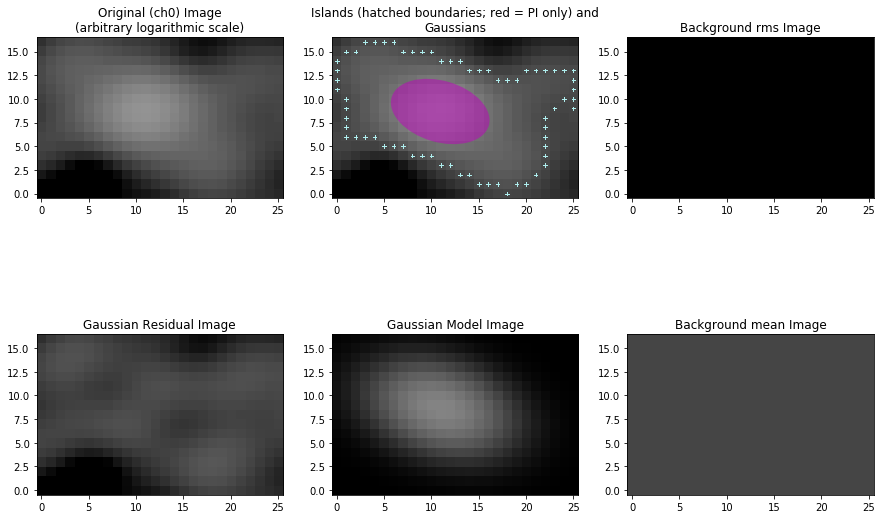

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_138.fits'
Image size .............................. : (41, 18) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.501 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.01691 Jy/beam
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 J

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 2
Total flux density in model ............. : 0.377 Jy
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 2

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.00223 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 3


Fitting islands with Gaussians .......... : [|--] 0/3/Fitting islands with Gaussians .......... : [=/-] 1/3-Fitting islands with Gaussians .......... : [==-] 2/3Fitting islands with Gaussians .......... : [===] 3/3Fitting islands with Gaussians .......... : [===] 3/3

Total number of Gaussians fit to image .. : 0
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 0
New sources found in PI image ........... : 0 (2 total)


Calculating polarisation properties ....  : [|-] 0/2/Calculating polarisation properties ....  : [=/] 1/2Calculating polarisation properties ....  : [==] 2/2Calculating polarisation properties ....  : [==] 2/2
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


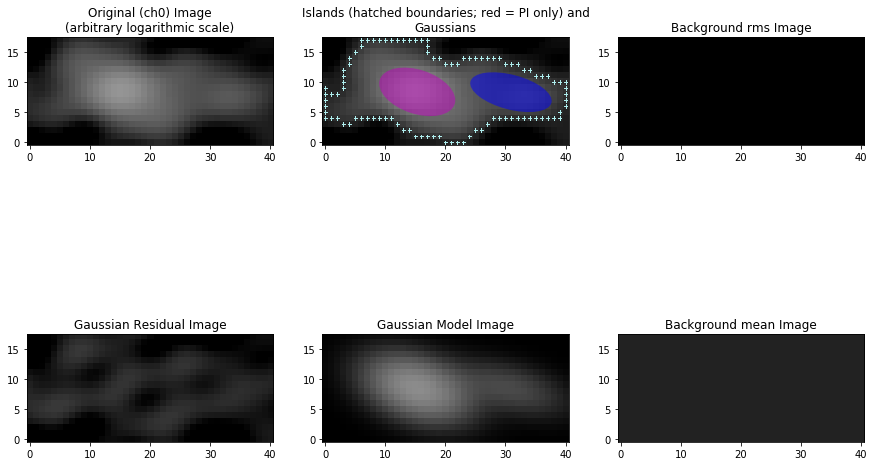

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_139.fits'
Image size .............................. : (31, 21) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.598 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.01755 Jy/beam
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 J

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 5
Total flux density in model ............. : 0.506 Jy
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 1

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.00198 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 3


Fitting islands with Gaussians .......... : [|--] 0/3/Fitting islands with Gaussians .......... : [=/-] 1/3/Fitting islands with Gaussians .......... : [=/-] 1/3Fitting islands with Gaussians .......... : [===] 3/3Fitting islands with Gaussians .......... : [===] 3/3


Total number of Gaussians fit to image .. : 1
--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 1
New sources found in PI image ........... : 0 (1 total)


Calculating polarisation properties ....  : [|] 0/1Calculating polarisation properties ....  : [=] 1/1Calculating polarisation properties ....  : [=] 1/1
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


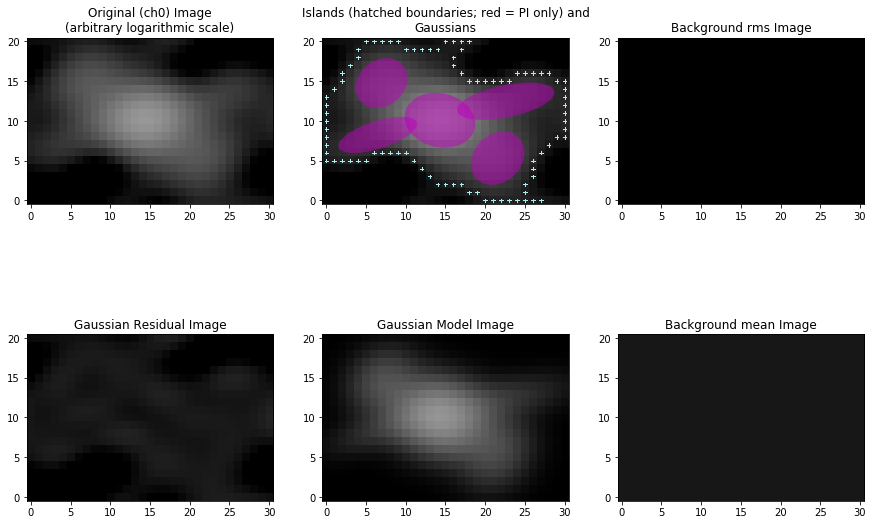

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_140.fits'
Image size .............................. : (42, 21) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.783 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.01336 Jy/beam
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 J

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1


Total number of Gaussians fit to image .. : 8
Total flux density in model ............. : 0.689 Jy
--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 2

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (35, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.00238 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 2


Fitting islands with Gaussians .......... : [|-] 0/2/Fitting islands with Gaussians .......... : [=/] 1/2Fitting islands with Gaussians .......... : [==] 2/2Fitting islands with Gaussians .......... : [==] 2/2


Total number of Gaussians fit to image .. : 2
--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 2
New sources found in PI image ........... : 1 (3 total)


Calculating polarisation properties ....  : [|--] 0/3/Calculating polarisation properties ....  : [=/-] 1/3-Calculating polarisation properties ....  : [==-] 2/3Calculating polarisation properties ....  : [===] 3/3Calculating polarisation properties ....  : [===] 3/3
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


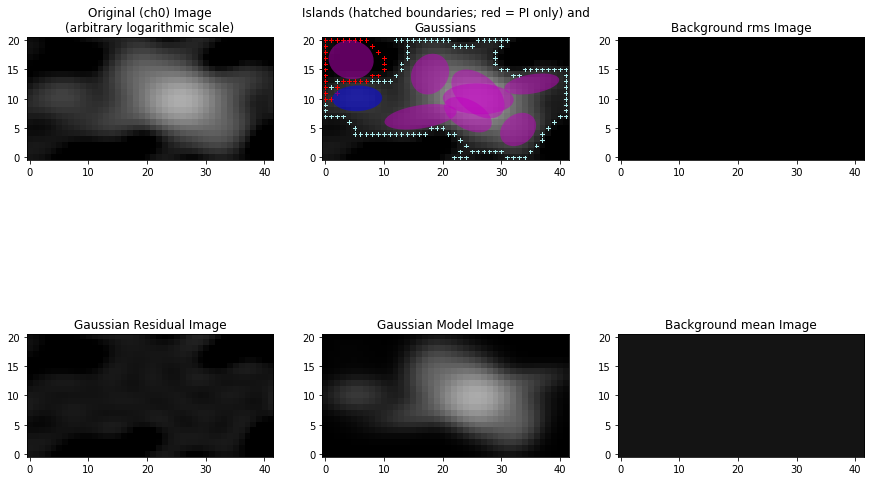

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_141.fits'
Image size .............................. : (27, 19) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.076 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.00837 Jy/beam
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 J

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 1
Total flux density in model ............. : 0.019 Jy
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 1

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.00189 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 1


Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 1
--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 1


New sources found in PI image ........... : 0 (1 total)


Calculating polarisation properties ....  : [|] 0/1Calculating polarisation properties ....  : [=] 1/1Calculating polarisation properties ....  : [=] 1/1
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


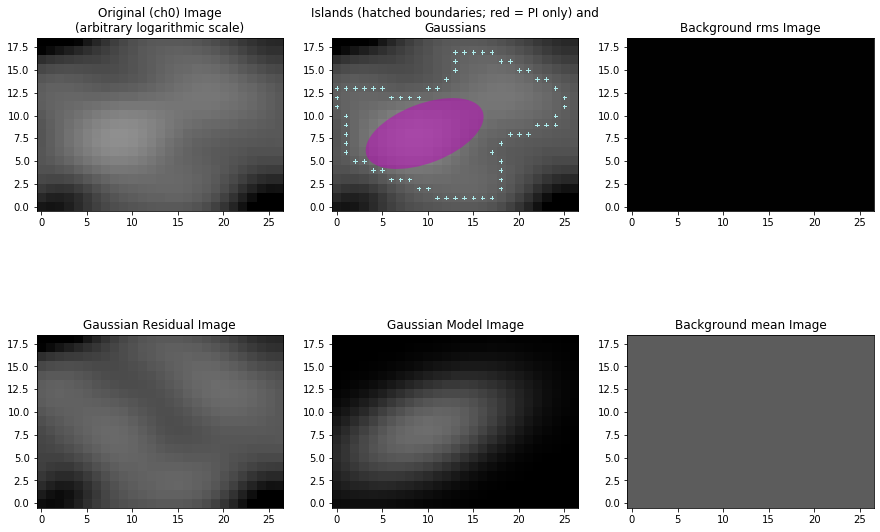

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_142.fits'
Image size .............................. : (17, 11) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.041 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.01251 Jy/beam
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 J

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 1
Total flux density in model ............. : 0.008 Jy
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 1

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.00183 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 1


Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 0
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 0
New sources found in PI image ........... : 0 (1 total)


Calculating polarisation properties ....  : [|] 0/1Calculating polarisation properties ....  : [=] 1/1Calculating polarisation properties ....  : [=] 1/1
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


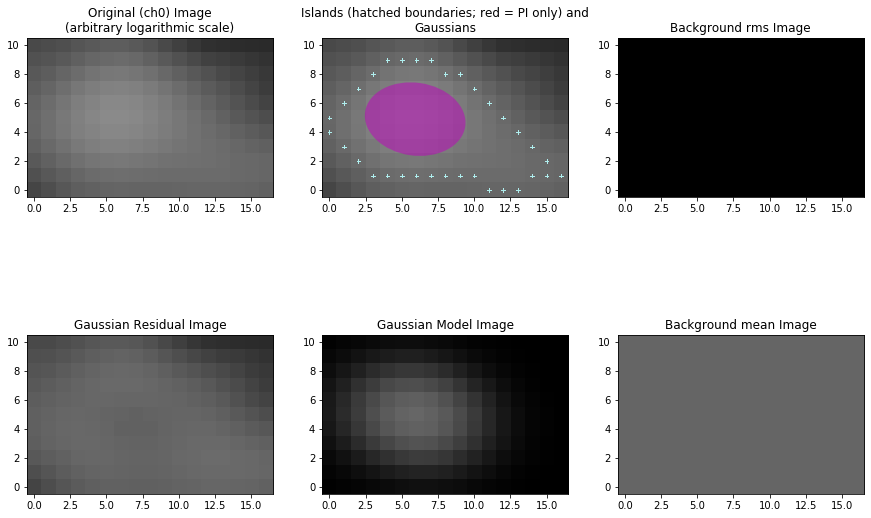

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_143.fits'
Image size .............................. : (32, 27) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.532 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 3) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.01481 Jy/beam
Derived rms_box (box size, step size) ... : (32, 3) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 J

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 4
Total flux density in model ............. : 0.388 Jy


--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 1

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 3) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.0021 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 3


Fitting islands with Gaussians .......... : [|--] 0/3//Fitting islands with Gaussians .......... : [=/-] 1/3Fitting islands with Gaussians .......... : [=/-] 1/3\Fitting islands with Gaussians .......... : [==\] 2/3Fitting islands with Gaussians .......... : [===] 3/3

Total number of Gaussians fit to image .. : 1
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 1
New sources found in PI image ........... : 0 (1 total)


Calculating polarisation properties ....  : [|] 0/1Calculating polarisation properties ....  : [=] 1/1Calculating polarisation properties ....  : [=] 1/1
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


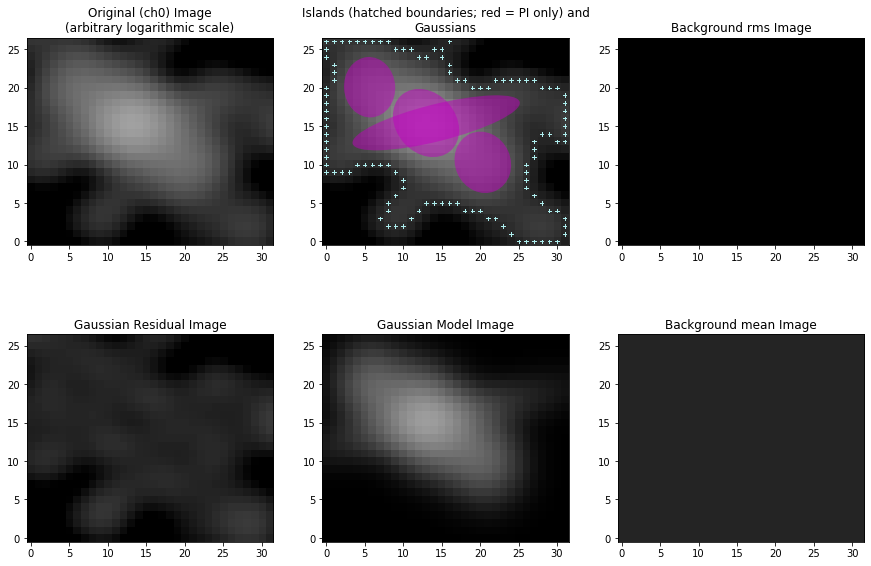

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_144.fits'
Image size .............................. : (28, 22) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.437 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.02227 Jy/beam
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 J

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 1
Total flux density in model ............. : 0.285 Jy
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 1

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.00221 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 3


Fitting islands with Gaussians .......... : [|--] 0/3/Fitting islands with Gaussians .......... : [=/-] 1/3/Fitting islands with Gaussians .......... : [=/-] 1/3Fitting islands with Gaussians .......... : [===] 3/3Fitting islands with Gaussians .......... : [===] 3/3

Total number of Gaussians fit to image .. : 0
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 0
New sources found in PI image ........... : 0 (1 total)


Calculating polarisation properties ....  : [|] 0/1Calculating polarisation properties ....  : [=] 1/1Calculating polarisation properties ....  : [=] 1/1
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


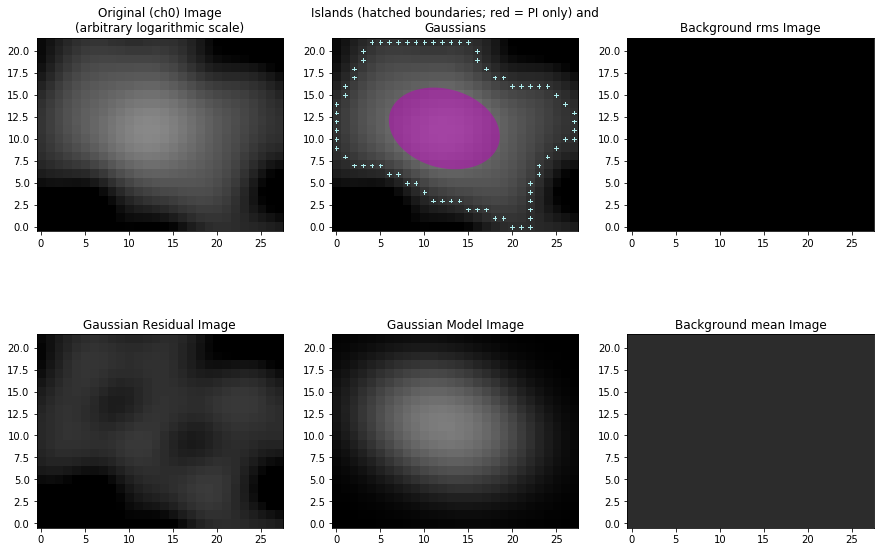

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_145.fits'
Image size .............................. : (24, 21) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.170 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.01576 Jy/beam
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 J

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 2
Total flux density in model ............. : 0.073 Jy
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 2

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.00173 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 2


Fitting islands with Gaussians .......... : [|-] 0/2/Fitting islands with Gaussians .......... : [=/] 1/2Fitting islands with Gaussians .......... : [==] 2/2Fitting islands with Gaussians .......... : [==] 2/2

Total number of Gaussians fit to image .. : 1


--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 1
New sources found in PI image ........... : 1 (3 total)


Calculating polarisation properties ....  : [|--] 0/3/Calculating polarisation properties ....  : [=/-] 1/3-Calculating polarisation properties ....  : [==-] 2/3Calculating polarisation properties ....  : [===] 3/3Calculating polarisation properties ....  : [===] 3/3
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


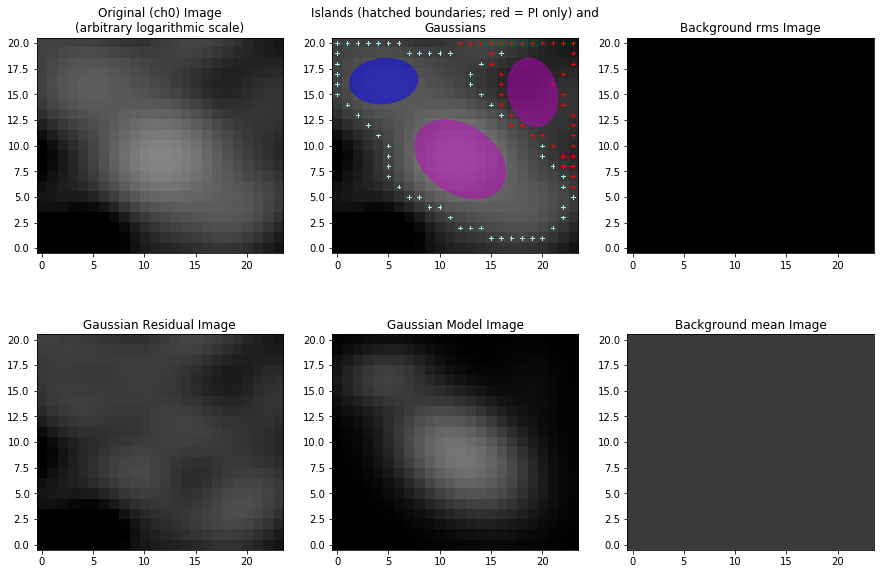

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_146.fits'
Image size .............................. : (28, 26) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.398 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 3) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.01037 Jy/beam
Derived rms_box (box size, step size) ... : (32, 3) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 J

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 1
Total flux density in model ............. : 0.327 Jy


--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 1

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 3) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.00226 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 3


Fitting islands with Gaussians .......... : [|--] 0/3/Fitting islands with Gaussians .......... : [=/-] 1/3-Fitting islands with Gaussians .......... : [==-] 2/3Fitting islands with Gaussians .......... : [===] 3/3Fitting islands with Gaussians .......... : [===] 3/3

Total number of Gaussians fit to image .. : 0


--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 0
New sources found in PI image ........... : 0 (1 total)


Calculating polarisation properties ....  : [|] 0/1Calculating polarisation properties ....  : [=] 1/1Calculating polarisation properties ....  : [=] 1/1
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


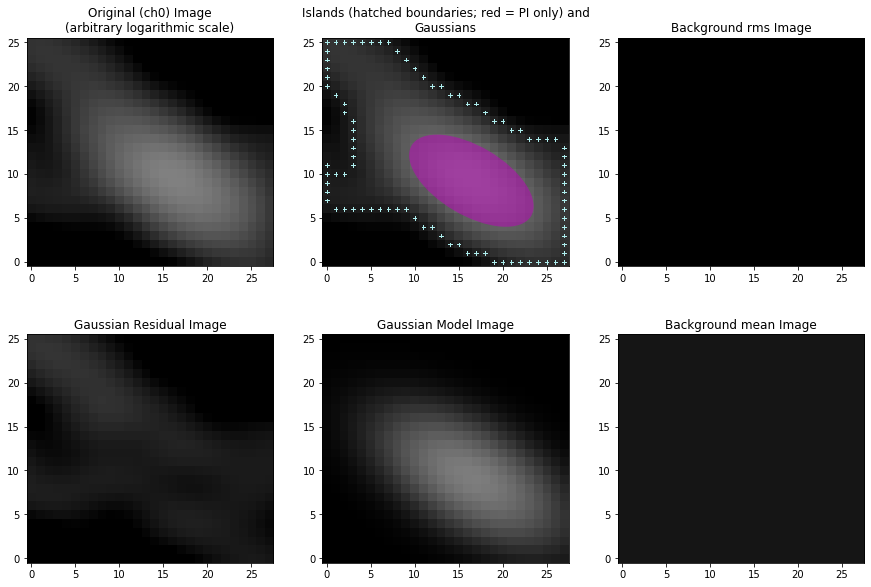

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_147.fits'
Image size .............................. : (25, 17) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.194 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.02498 Jy/beam
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 J

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 1
Total flux density in model ............. : 0.052 Jy
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 1

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.00219 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 2


Fitting islands with Gaussians .......... : [|-] 0/2/Fitting islands with Gaussians .......... : [=/] 1/2Fitting islands with Gaussians .......... : [==] 2/2Fitting islands with Gaussians .......... : [==] 2/2

Total number of Gaussians fit to image .. : 0
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 0
New sources found in PI image ........... : 0 (1 total)


Calculating polarisation properties ....  : [|] 0/1Calculating polarisation properties ....  : [=] 1/1Calculating polarisation properties ....  : [=] 1/1
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


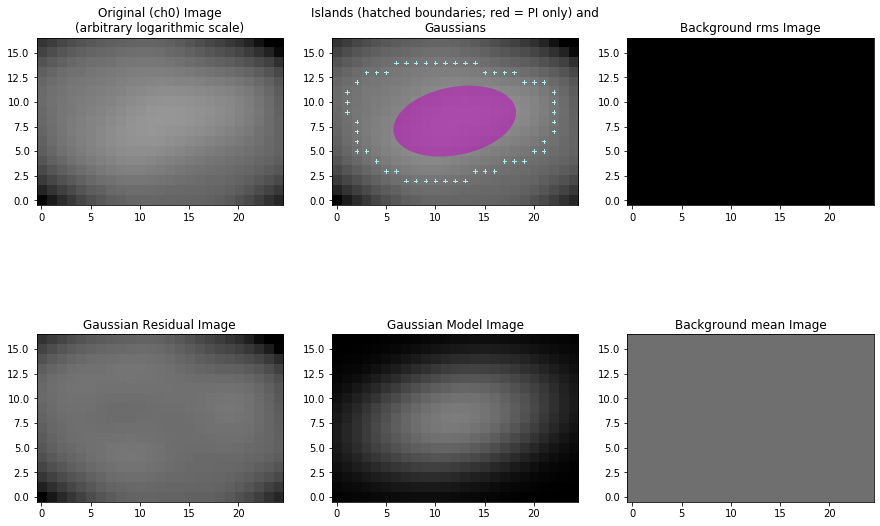

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_148.fits'
Image size .............................. : (15, 11) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.055 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.01384 Jy/beam
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 J

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 1
Total flux density in model ............. : 0.024 Jy
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 1

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.00185 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 1


Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 0
--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 0
New sources found in PI image ........... : 0 (1 total)



Calculating polarisation properties ....  : [|] 0/1Calculating polarisation properties ....  : [=] 1/1Calculating polarisation properties ....  : [=] 1/1
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


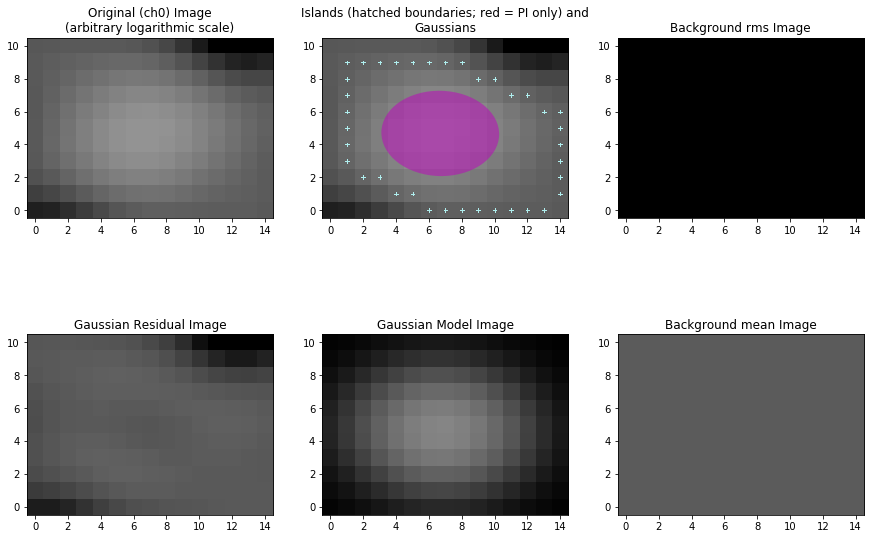

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_149.fits'
Image size .............................. : (43, 21) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.339 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.01918 Jy/beam
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 J

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 1
Total flux density in model ............. : 0.118 Jy


--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 1

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.00208 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 4


Fitting islands with Gaussians .......... : [|---] 0/4/Fitting islands with Gaussians .......... : [=/--] 1/4--Fitting islands with Gaussians .......... : [==--] 2/4Fitting islands with Gaussians .......... : [==--] 2/4Fitting islands with Gaussians .......... : [====] 4/4Fitting islands with Gaussians .......... : [====] 4/4

Total number of Gaussians fit to image .. : 0
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 0
New sources found in PI image ........... : 0 (1 total)


Calculating polarisation properties ....  : [|] 0/1Calculating polarisation properties ....  : [=] 1/1Calculating polarisation properties ....  : [=] 1/1
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


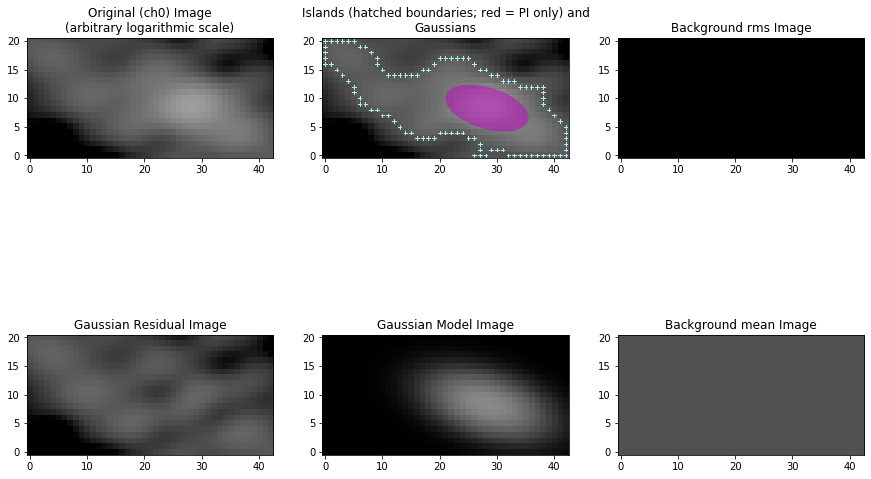

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_150.fits'
Image size .............................. : (15, 13) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.081 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.02356 Jy/beam
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 J

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 1
Total flux density in model ............. : 0.021 Jy


--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 1

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.00253 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 1


Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 0
--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 0


New sources found in PI image ........... : 0 (1 total)


Calculating polarisation properties ....  : [|] 0/1Calculating polarisation properties ....  : [=] 1/1Calculating polarisation properties ....  : [=] 1/1
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


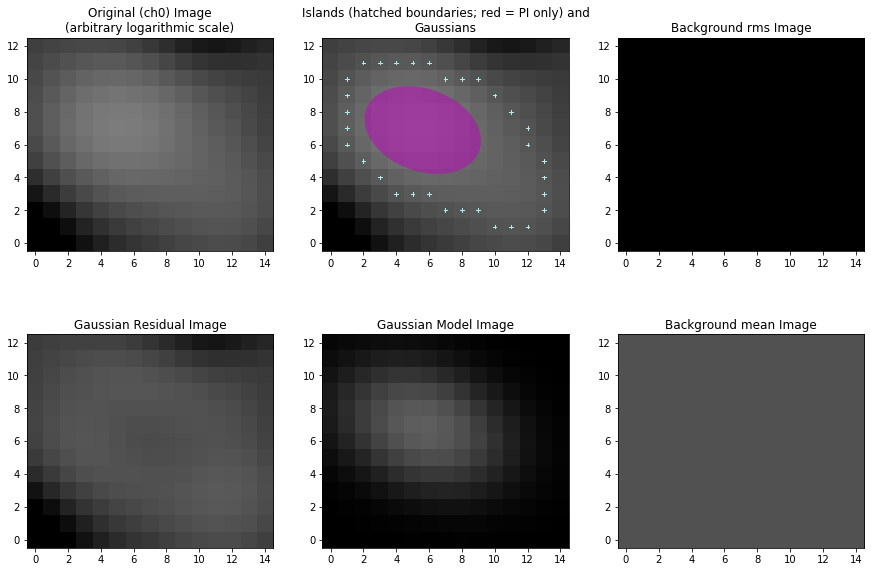

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_151.fits'
Image size .............................. : (27, 19) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.200 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.01195 Jy/beam
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 J

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 1
Total flux density in model ............. : 0.128 Jy


--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 1

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.00237 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 4


Fitting islands with Gaussians .......... : [|---] 0/4/Fitting islands with Gaussians .......... : [=/--] 1/4-Fitting islands with Gaussians .......... : [==--] 2/4\Fitting islands with Gaussians .......... : [===\] 3/4Fitting islands with Gaussians .......... : [====] 4/4Fitting islands with Gaussians .......... : [====] 4/4

Total number of Gaussians fit to image .. : 1
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 1
New sources found in PI image ........... : 0 (1 total)


Calculating polarisation properties ....  : [|] 0/1Calculating polarisation properties ....  : [=] 1/1Calculating polarisation properties ....  : [=] 1/1
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


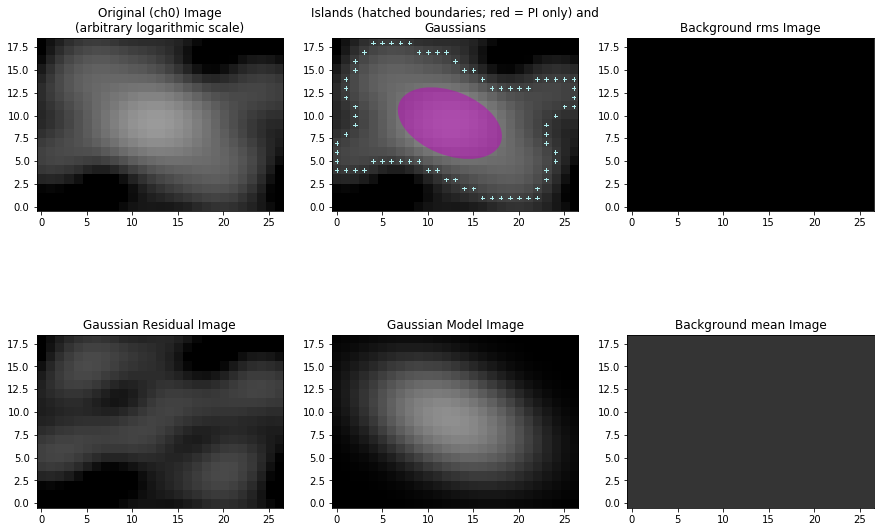

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_152.fits'
Image size .............................. : (17, 17) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.085 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.01393 Jy/beam
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 J

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 1
Total flux density in model ............. : 0.029 Jy
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 1

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.00221 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 3


Fitting islands with Gaussians .......... : [|--] 0/3/Fitting islands with Gaussians .......... : [=/-] 1/3-Fitting islands with Gaussians .......... : [==-] 2/3Fitting islands with Gaussians .......... : [===] 3/3Fitting islands with Gaussians .......... : [===] 3/3

Total number of Gaussians fit to image .. : 0
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 0
New sources found in PI image ........... : 0 (1 total)


Calculating polarisation properties ....  : [|] 0/1Calculating polarisation properties ....  : [=] 1/1Calculating polarisation properties ....  : [=] 1/1
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


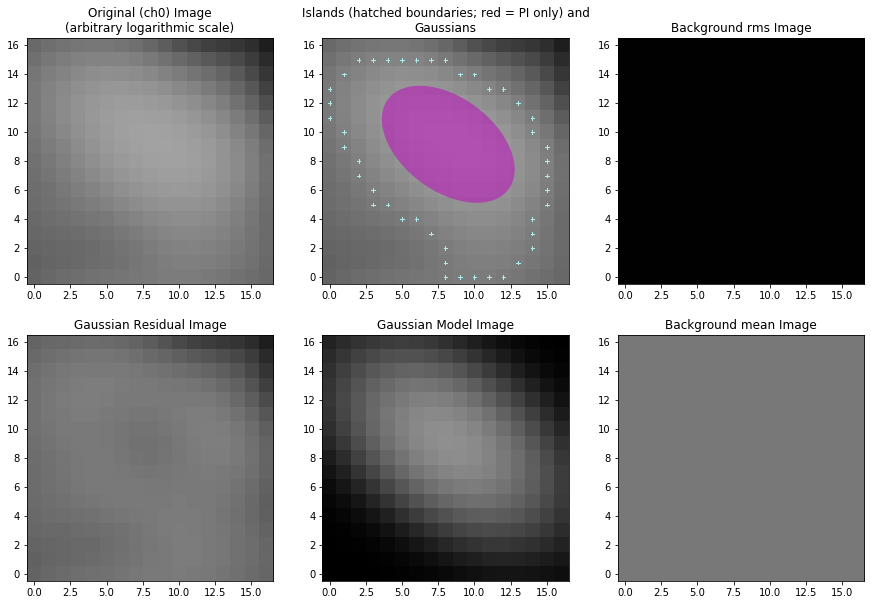

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_153.fits'
Image size .............................. : (25, 14) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.123 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.01892 Jy/beam
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 J

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 1
Total flux density in model ............. : 0.036 Jy
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 1

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.00223 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 2


Fitting islands with Gaussians .......... : [|-] 0/2/Fitting islands with Gaussians .......... : [=/] 1/2Fitting islands with Gaussians .......... : [==] 2/2Fitting islands with Gaussians .......... : [==] 2/2

Total number of Gaussians fit to image .. : 1


--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 1
New sources found in PI image ........... : 1 (2 total)


Calculating polarisation properties ....  : [|-] 0/2/Calculating polarisation properties ....  : [=/] 1/2Calculating polarisation properties ....  : [==] 2/2Calculating polarisation properties ....  : [==] 2/2
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


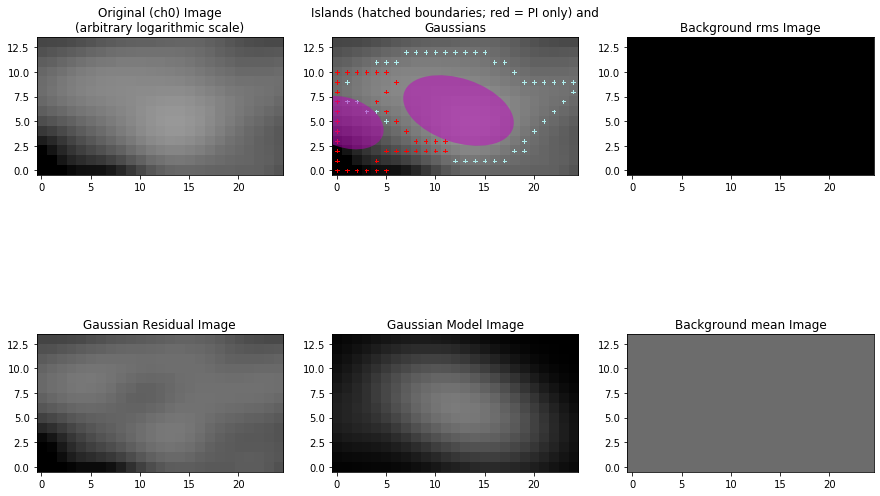

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_154.fits'
Image size .............................. : (17, 12) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.039 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.00993 Jy/beam
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 J

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 1
Total flux density in model ............. : 0.013 Jy
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 1

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.00201 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 1


Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 0
--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 0


New sources found in PI image ........... : 0 (1 total)


Calculating polarisation properties ....  : [|] 0/1Calculating polarisation properties ....  : [=] 1/1Calculating polarisation properties ....  : [=] 1/1
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


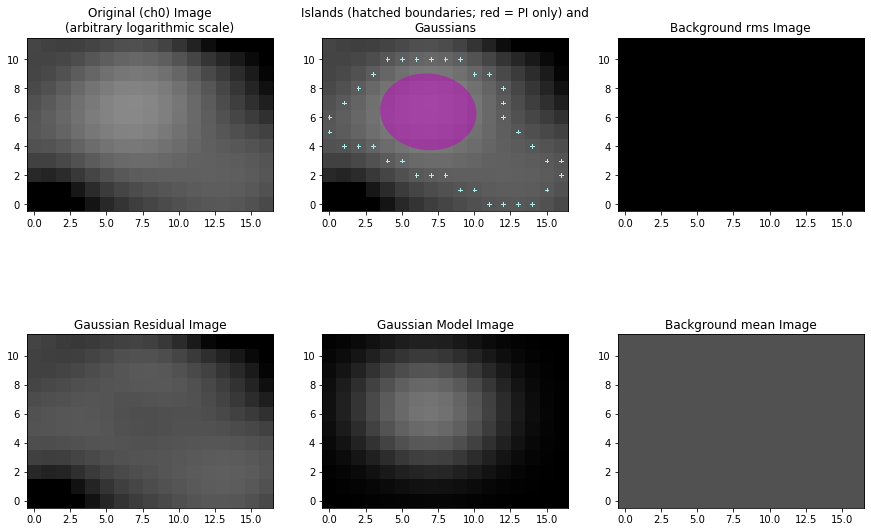

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_155.fits'
Image size .............................. : (49, 33) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 2.117 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (75, 3) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : -0.00354 Jy/beam
Derived rms_box (box size, step size) ... : (75, 3) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1


Total number of Gaussians fit to image .. : 8
Total flux density in model ............. : 2.134 Jy
--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 3

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (81, 3) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.00225 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 1


Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1


Total number of Gaussians fit to image .. : 5
--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 4
New sources found in PI image ........... : 1 (4 total)


Calculating polarisation properties ....  : [|---] 0/4/Calculating polarisation properties ....  : [=/--] 1/4-Calculating polarisation properties ....  : [==--] 2/4\Calculating polarisation properties ....  : [===\] 3/4Calculating polarisation properties ....  : [====] 4/4Calculating polarisation properties ....  : [====] 4/4
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


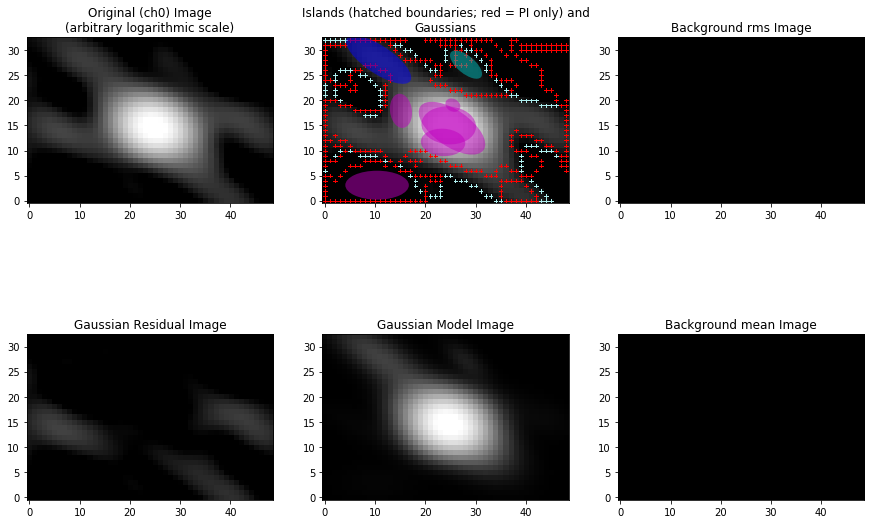

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_156.fits'
Image size .............................. : (27, 19) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.312 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.02448 Jy/beam
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 J

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 1
Total flux density in model ............. : 0.152 Jy
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 1

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.00276 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 2


Fitting islands with Gaussians .......... : [|-] 0/2/Fitting islands with Gaussians .......... : [=/] 1/2Fitting islands with Gaussians .......... : [==] 2/2Fitting islands with Gaussians .......... : [==] 2/2


Total number of Gaussians fit to image .. : 0
--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 0
New sources found in PI image ........... : 0 (1 total)


Calculating polarisation properties ....  : [|] 0/1Calculating polarisation properties ....  : [=] 1/1Calculating polarisation properties ....  : [=] 1/1
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


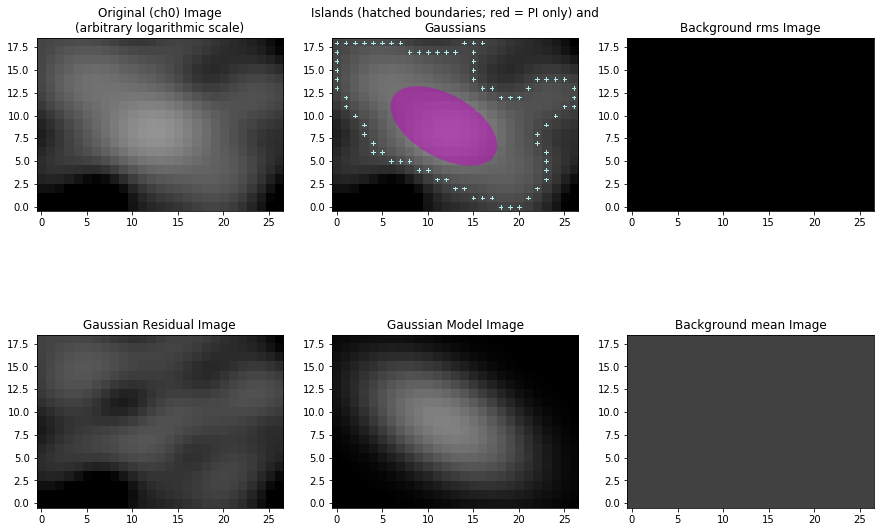

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_157.fits'
Image size .............................. : (23, 19) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.130 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.01411 Jy/beam
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 J

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 1
Total flux density in model ............. : 0.067 Jy
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 1

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.00217 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 3


Fitting islands with Gaussians .......... : [|--] 0/3/Fitting islands with Gaussians .......... : [=/-] 1/3-Fitting islands with Gaussians .......... : [==-] 2/3-Fitting islands with Gaussians .......... : [==-] 2/3Fitting islands with Gaussians .......... : [===] 3/3

Total number of Gaussians fit to image .. : 0
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 0
New sources found in PI image ........... : 0 (1 total)


Calculating polarisation properties ....  : [|] 0/1Calculating polarisation properties ....  : [=] 1/1Calculating polarisation properties ....  : [=] 1/1
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


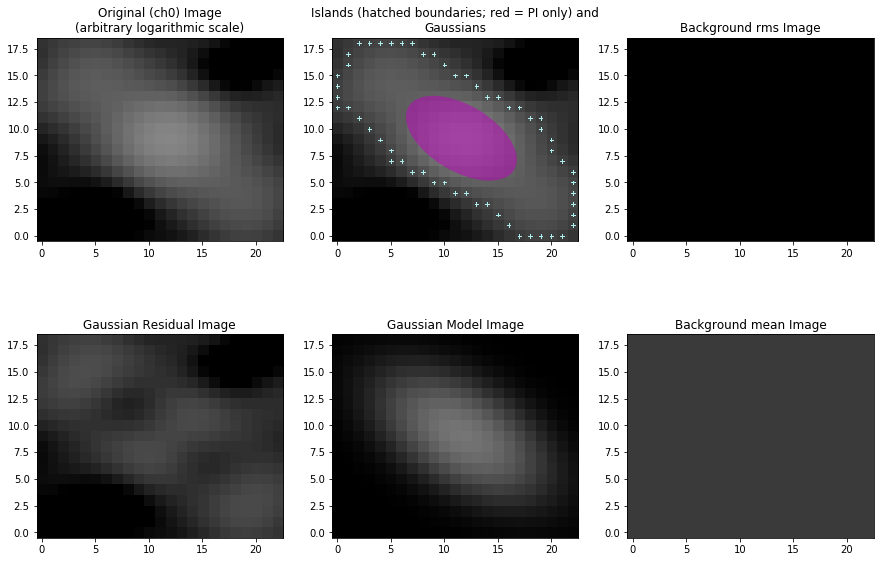

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_158.fits'
Image size .............................. : (15, 13) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.043 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.01151 Jy/beam
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 J

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 1
Total flux density in model ............. : 0.013 Jy
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 1

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.00242 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 2


Fitting islands with Gaussians .......... : [|-] 0/2/Fitting islands with Gaussians .......... : [=/] 1/2Fitting islands with Gaussians .......... : [==] 2/2Fitting islands with Gaussians .......... : [==] 2/2

Total number of Gaussians fit to image .. : 0
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 0
New sources found in PI image ........... : 0 (1 total)


Calculating polarisation properties ....  : [|] 0/1Calculating polarisation properties ....  : [=] 1/1Calculating polarisation properties ....  : [=] 1/1
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


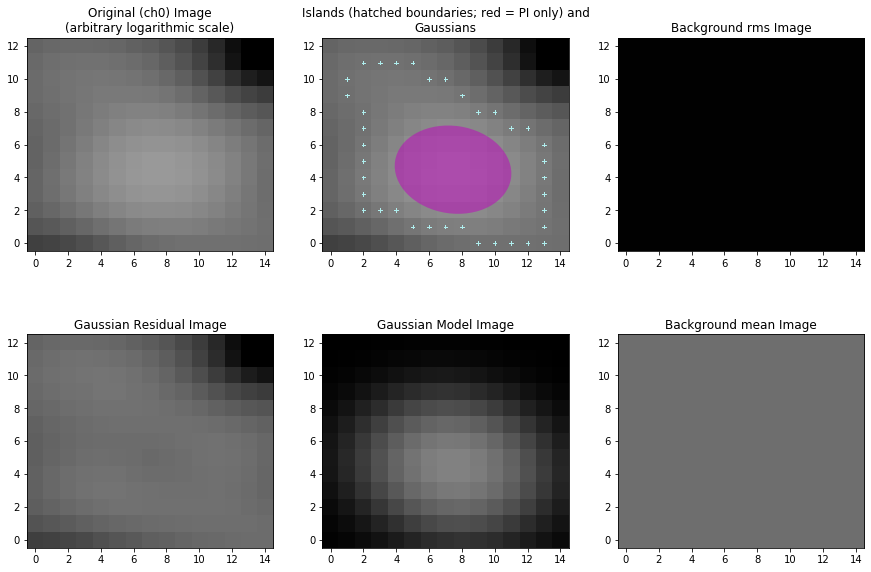

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_159.fits'
Image size .............................. : (22, 20) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.092 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.01078 Jy/beam
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 J

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 1
Total flux density in model ............. : 0.028 Jy
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 1

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.00182 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 3


Fitting islands with Gaussians .......... : [|--] 0/3/Fitting islands with Gaussians .......... : [=/-] 1/3-Fitting islands with Gaussians .......... : [==-] 2/3Fitting islands with Gaussians .......... : [===] 3/3Fitting islands with Gaussians .......... : [===] 3/3


Total number of Gaussians fit to image .. : 1
--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 1
New sources found in PI image ........... : 0 (1 total)


Calculating polarisation properties ....  : [|] 0/1Calculating polarisation properties ....  : [=] 1/1Calculating polarisation properties ....  : [=] 1/1
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


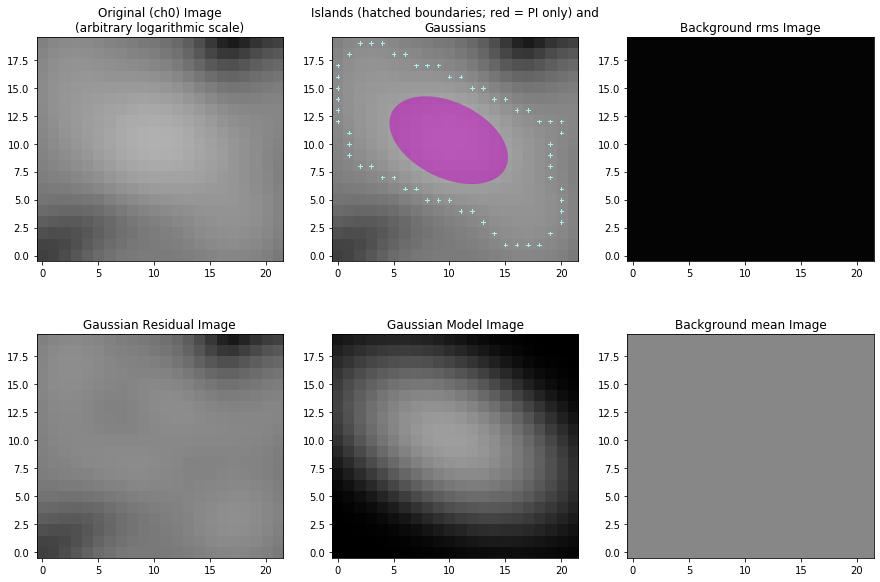

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_160.fits'
Image size .............................. : (16, 17) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.081 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.01542 Jy/beam
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 J

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 1
Total flux density in model ............. : 0.021 Jy
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 1

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.00286 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 1


Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 0


--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 0
New sources found in PI image ........... : 0 (1 total)


Calculating polarisation properties ....  : [|] 0/1Calculating polarisation properties ....  : [=] 1/1Calculating polarisation properties ....  : [=] 1/1
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


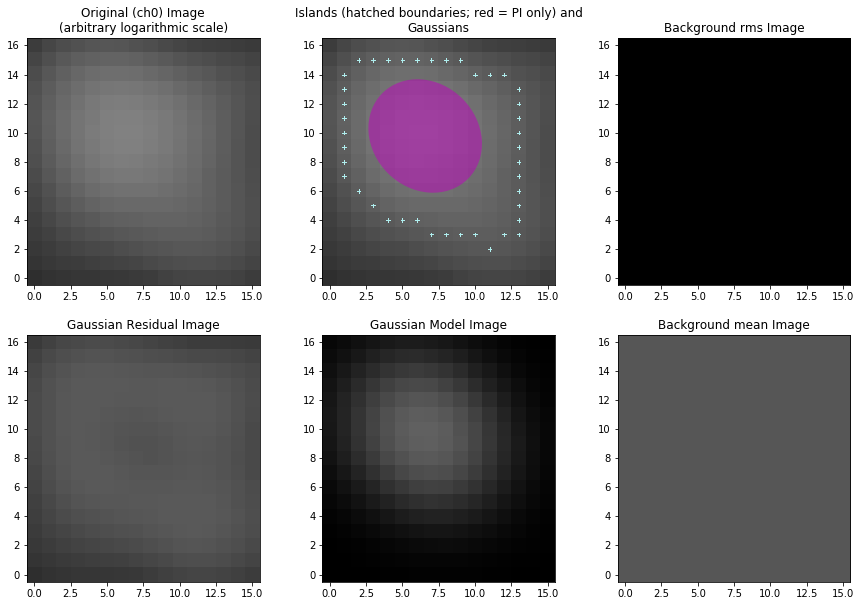

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_161.fits'
Image size .............................. : (15, 10) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.022 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.00724 Jy/beam
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 J

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 1
Total flux density in model ............. : 0.007 Jy
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 1

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.00173 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 1


Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 0
--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 0
New sources found in PI image ........... : 0 (1 total)



Calculating polarisation properties ....  : [|] 0/1Calculating polarisation properties ....  : [=] 1/1Calculating polarisation properties ....  : [=] 1/1
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


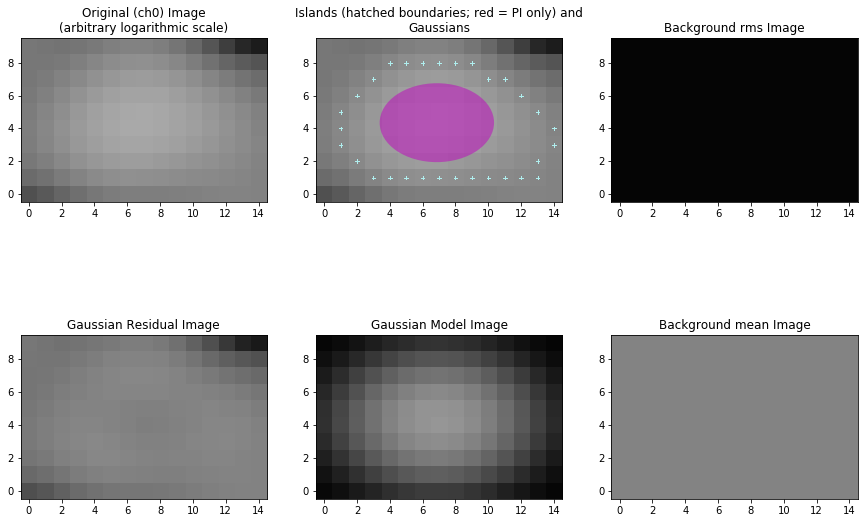

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_162.fits'
Image size .............................. : (23, 16) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.122 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.01076 Jy/beam
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 J

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 1
Total flux density in model ............. : 0.074 Jy
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 1

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.00187 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 2


Fitting islands with Gaussians .......... : [|-] 0/2/Fitting islands with Gaussians .......... : [=/] 1/2Fitting islands with Gaussians .......... : [==] 2/2Fitting islands with Gaussians .......... : [==] 2/2


Total number of Gaussians fit to image .. : 1
--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 1
New sources found in PI image ........... : 1 (2 total)


Calculating polarisation properties ....  : [|-] 0/2/Calculating polarisation properties ....  : [=/] 1/2Calculating polarisation properties ....  : [==] 2/2Calculating polarisation properties ....  : [==] 2/2
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


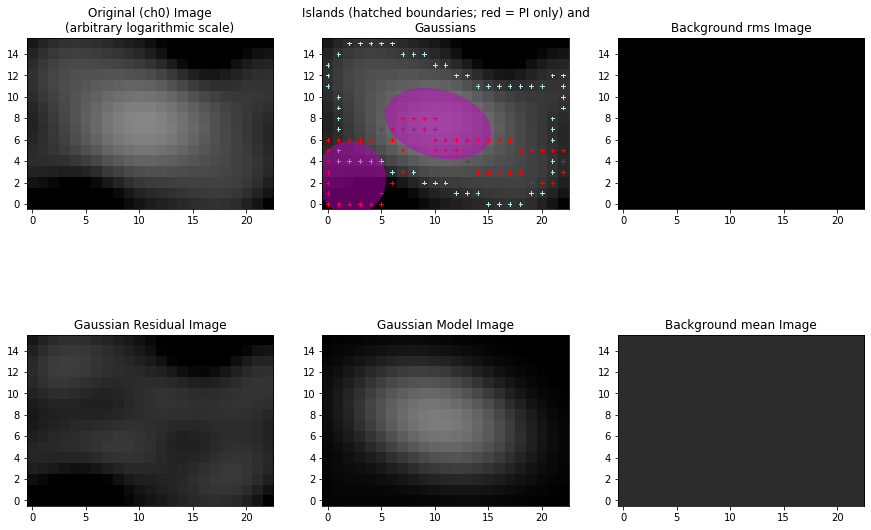

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_163.fits'
Image size .............................. : (21, 22) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.132 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.01012 Jy/beam
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 J

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 1
Total flux density in model ............. : 0.075 Jy
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 1

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.0023 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 1


Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 0
--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 0


New sources found in PI image ........... : 0 (1 total)


Calculating polarisation properties ....  : [|] 0/1Calculating polarisation properties ....  : [=] 1/1Calculating polarisation properties ....  : [=] 1/1
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


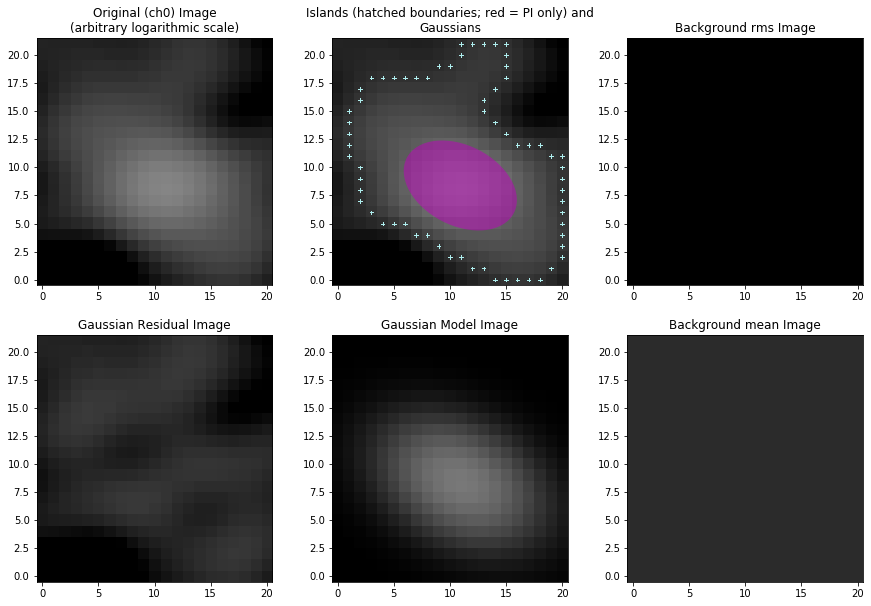

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_164.fits'
Image size .............................. : (23, 20) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.166 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.01637 Jy/beam
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 J

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 1
Total flux density in model ............. : 0.069 Jy
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 1

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.00232 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 2


Fitting islands with Gaussians .......... : [|-] 0/2/Fitting islands with Gaussians .......... : [=/] 1/2Fitting islands with Gaussians .......... : [==] 2/2Fitting islands with Gaussians .......... : [==] 2/2


Total number of Gaussians fit to image .. : 1
--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 1
New sources found in PI image ........... : 1 (2 total)


Calculating polarisation properties ....  : [|-] 0/2/Calculating polarisation properties ....  : [=/] 1/2Calculating polarisation properties ....  : [==] 2/2Calculating polarisation properties ....  : [==] 2/2
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


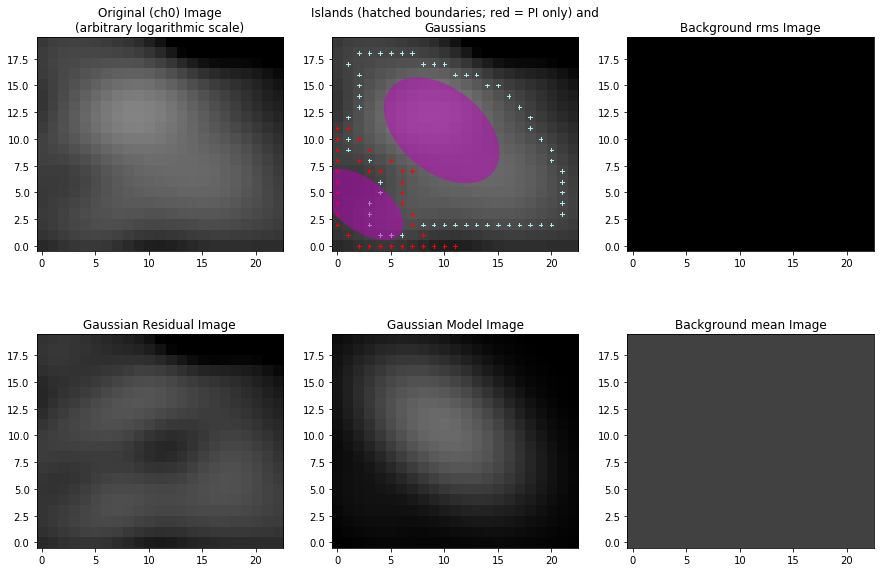

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_165.fits'
Image size .............................. : (33, 28) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.857 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 3) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.01726 Jy/beam
Derived rms_box (box size, step size) ... : (32, 3) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 J

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1


Total number of Gaussians fit to image .. : 6
Total flux density in model ............. : 0.732 Jy
--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 2

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 3) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.00194 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 1


Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 1
--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 1


New sources found in PI image ........... : 0 (2 total)


Calculating polarisation properties ....  : [|-] 0/2/Calculating polarisation properties ....  : [=/] 1/2Calculating polarisation properties ....  : [==] 2/2Calculating polarisation properties ....  : [==] 2/2
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


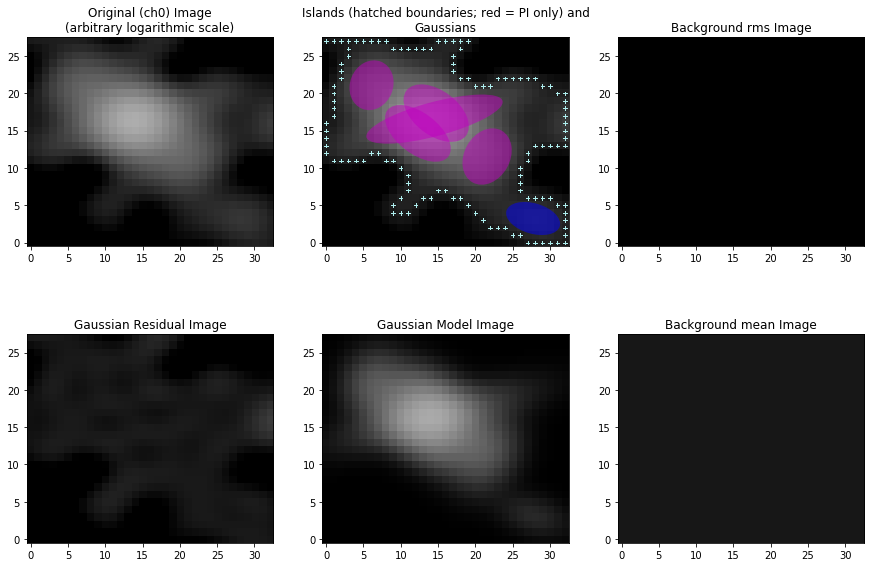

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_166.fits'
Image size .............................. : (22, 19) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.109 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.01654 Jy/beam
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 J

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 0
Total flux density in model ............. : 0.000 Jy
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 0
    Island #0 (x=5, y=15)
Please check this island. If it is a valid island and
should be fit, try adjusting the flagging options (use
show_fit with "ch0_flagged=True" to see the flagged Gaussians)
or enabling the wavelet module (with "atrous_do=True").
To include empty islands in output source catalogs, set
incl_empty=True in the write_catalog task.

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.00212 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 1


Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 0
--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 0


--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_167.fits'
Image size .............................. : (12, 8) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.054 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.0289 Jy/beam
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 Jy/

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 1
Total flux density in model ............. : 0.015 Jy
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 1

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.00247 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 1


Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 0
--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 0


New sources found in PI image ........... : 0 (1 total)


Calculating polarisation properties ....  : [|] 0/1Calculating polarisation properties ....  : [=] 1/1Calculating polarisation properties ....  : [=] 1/1
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


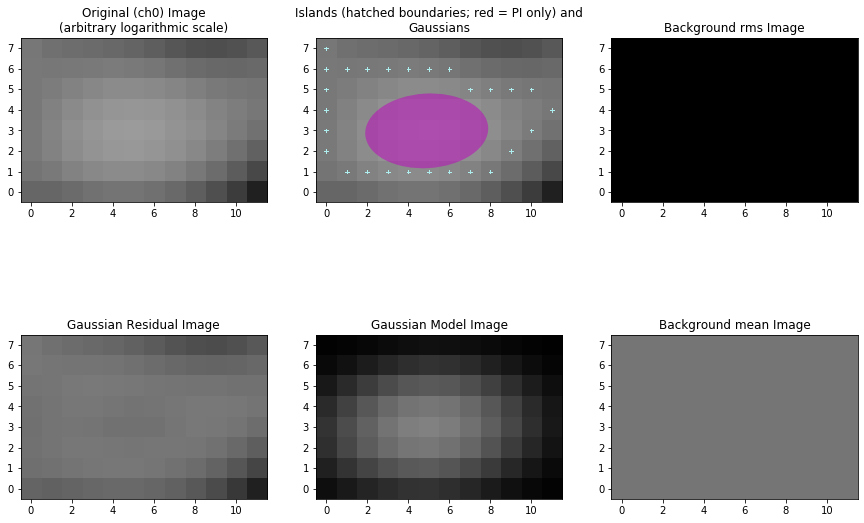

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_168.fits'
Image size .............................. : (44, 31) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.434 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 3) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.00997 Jy/beam
Derived rms_box (box size, step size) ... : (32, 3) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 J

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 3
Total flux density in model ............. : 0.279 Jy


--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 2

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 3) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.00182 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 3


Fitting islands with Gaussians .......... : [|--] 0/3//Fitting islands with Gaussians .......... : [=/-] 1/3Fitting islands with Gaussians .......... : [=/-] 1/3Fitting islands with Gaussians .......... : [===] 3/3Fitting islands with Gaussians .......... : [===] 3/3

Total number of Gaussians fit to image .. : 1
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 1
New sources found in PI image ........... : 0 (2 total)


Calculating polarisation properties ....  : [|-] 0/2/Calculating polarisation properties ....  : [=/] 1/2Calculating polarisation properties ....  : [==] 2/2Calculating polarisation properties ....  : [==] 2/2
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


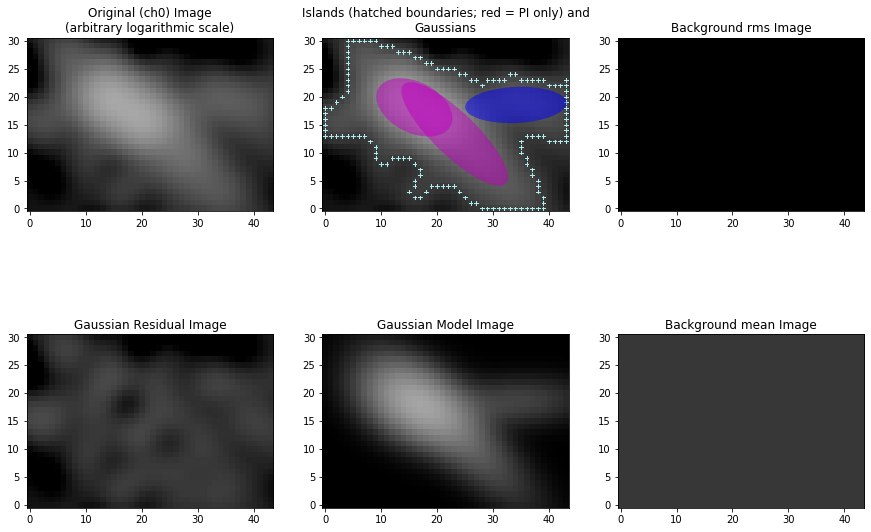

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_169.fits'
Image size .............................. : (18, 10) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.072 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.02227 Jy/beam
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 J

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 1
Total flux density in model ............. : 0.015 Jy
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 1

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.00234 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 1


Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 0
--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 0


New sources found in PI image ........... : 0 (1 total)


Calculating polarisation properties ....  : [|] 0/1Calculating polarisation properties ....  : [=] 1/1Calculating polarisation properties ....  : [=] 1/1
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


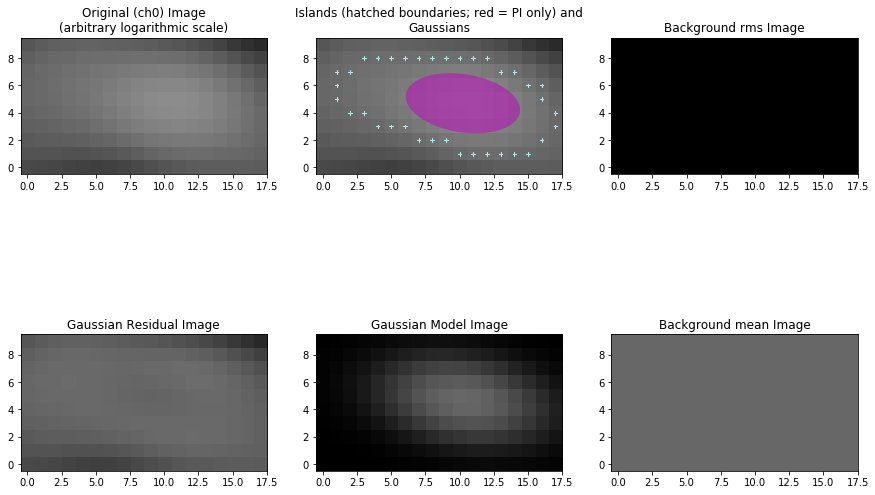

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_170.fits'
Image size .............................. : (23, 18) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.176 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.01696 Jy/beam
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 J

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 1
Total flux density in model ............. : 0.096 Jy
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 1

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.00175 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 1


Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1


Total number of Gaussians fit to image .. : 0
--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 0
New sources found in PI image ........... : 0 (1 total)


Calculating polarisation properties ....  : [|] 0/1Calculating polarisation properties ....  : [=] 1/1Calculating polarisation properties ....  : [=] 1/1
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


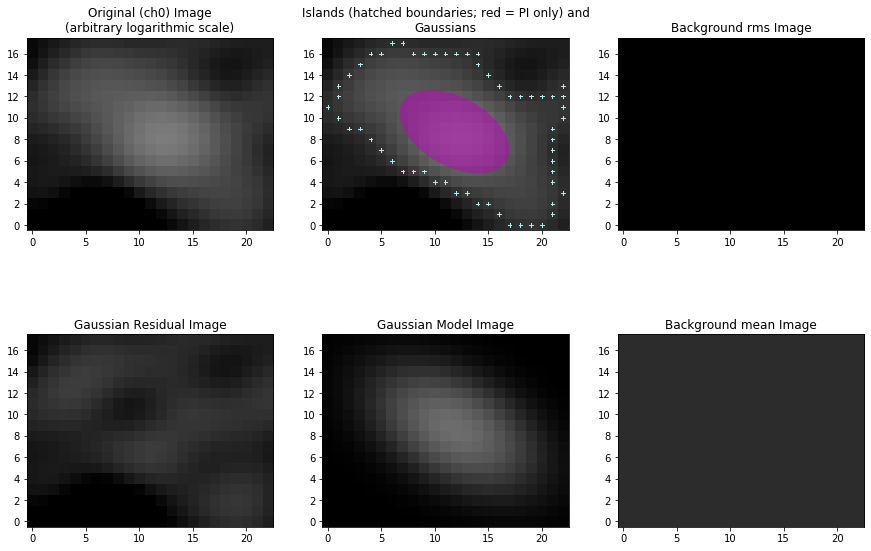

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_171.fits'
Image size .............................. : (37, 19) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.100 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.0087 Jy/beam
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 Jy

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 1
Total flux density in model ............. : 0.023 Jy


--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 1

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.00221 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 3


Fitting islands with Gaussians .......... : [|--] 0/3/Fitting islands with Gaussians .......... : [=/-] 1/3-Fitting islands with Gaussians .......... : [==-] 2/3Fitting islands with Gaussians .......... : [===] 3/3Fitting islands with Gaussians .......... : [===] 3/3

Total number of Gaussians fit to image .. : 0
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 0
New sources found in PI image ........... : 0 (1 total)


Calculating polarisation properties ....  : [|] 0/1Calculating polarisation properties ....  : [=] 1/1Calculating polarisation properties ....  : [=] 1/1
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


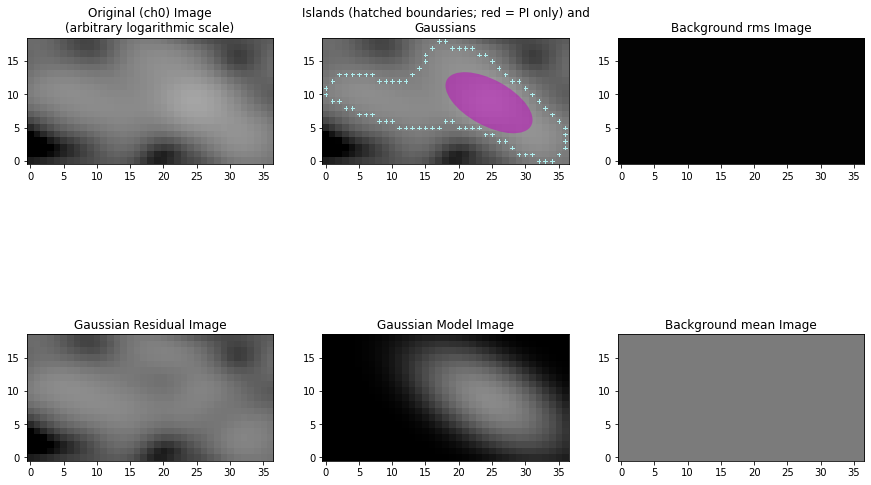

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_172.fits'
Image size .............................. : (15, 11) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.040 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.01353 Jy/beam
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 J

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 1
Total flux density in model ............. : 0.010 Jy
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 1

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.00199 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 1


Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 0
--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 0
New sources found in PI image ........... : 0 (1 total)



Calculating polarisation properties ....  : [|] 0/1Calculating polarisation properties ....  : [=] 1/1Calculating polarisation properties ....  : [=] 1/1
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


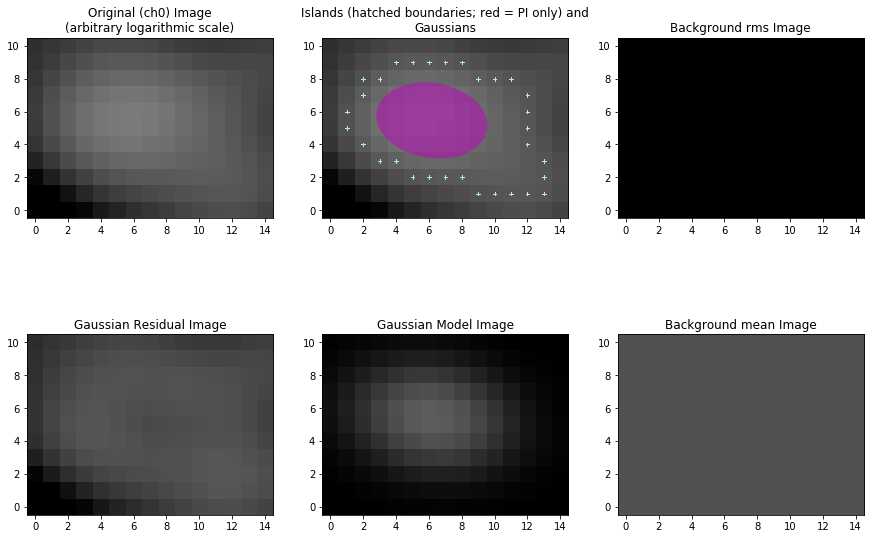

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_173.fits'
Image size .............................. : (32, 25) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.184 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.01684 Jy/beam
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 J

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 1
Total flux density in model ............. : 0.016 Jy
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 1

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.00192 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 5


Fitting islands with Gaussians .......... : [|----] 0/5/Fitting islands with Gaussians .......... : [=/---] 1/5-Fitting islands with Gaussians .......... : [==---] 2/5\Fitting islands with Gaussians .......... : [===\-] 3/5|Fitting islands with Gaussians .......... : [====|] 4/5Fitting islands with Gaussians .......... : [=====] 5/5Fitting islands with Gaussians .......... : [=====] 5/5

Total number of Gaussians fit to image .. : 0
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 0
New sources found in PI image ........... : 0 (1 total)


Calculating polarisation properties ....  : [|] 0/1Calculating polarisation properties ....  : [=] 1/1Calculating polarisation properties ....  : [=] 1/1
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


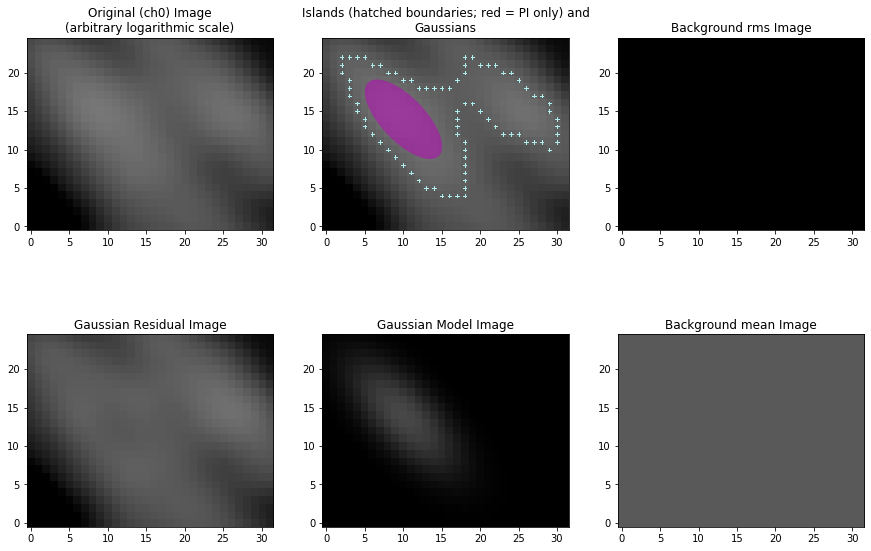

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_174.fits'
Image size .............................. : (20, 17) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.082 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.0093 Jy/beam
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 Jy

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 1
Total flux density in model ............. : 0.044 Jy


--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 1

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.00232 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 1


Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 1
--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 1


New sources found in PI image ........... : 0 (1 total)


Calculating polarisation properties ....  : [|] 0/1Calculating polarisation properties ....  : [=] 1/1Calculating polarisation properties ....  : [=] 1/1
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


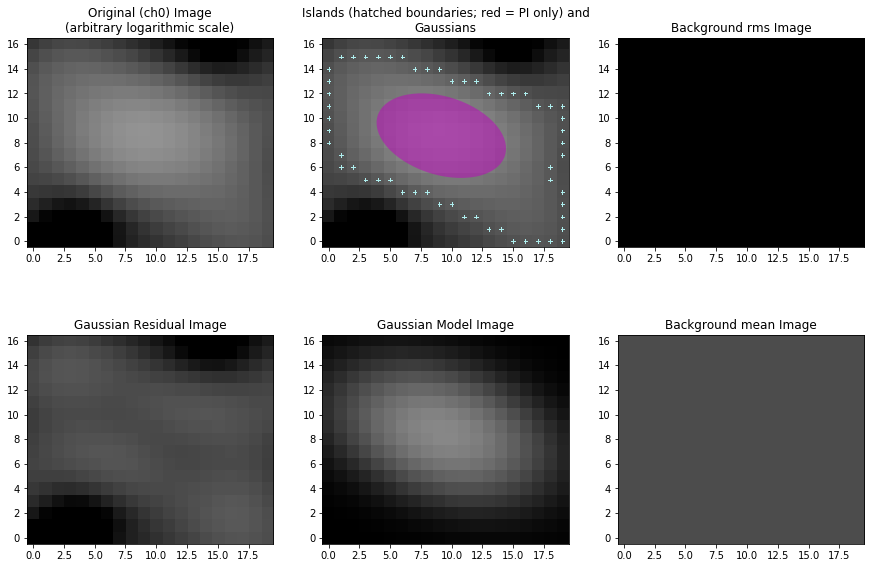

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_175.fits'
Image size .............................. : (21, 13) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.069 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.01404 Jy/beam
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 J

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 1
Total flux density in model ............. : 0.016 Jy
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 1

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.00241 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 2


Fitting islands with Gaussians .......... : [|-] 0/2/Fitting islands with Gaussians .......... : [=/] 1/2Fitting islands with Gaussians .......... : [==] 2/2Fitting islands with Gaussians .......... : [==] 2/2

Total number of Gaussians fit to image .. : 0
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 0
New sources found in PI image ........... : 0 (1 total)


Calculating polarisation properties ....  : [|] 0/1Calculating polarisation properties ....  : [=] 1/1Calculating polarisation properties ....  : [=] 1/1
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


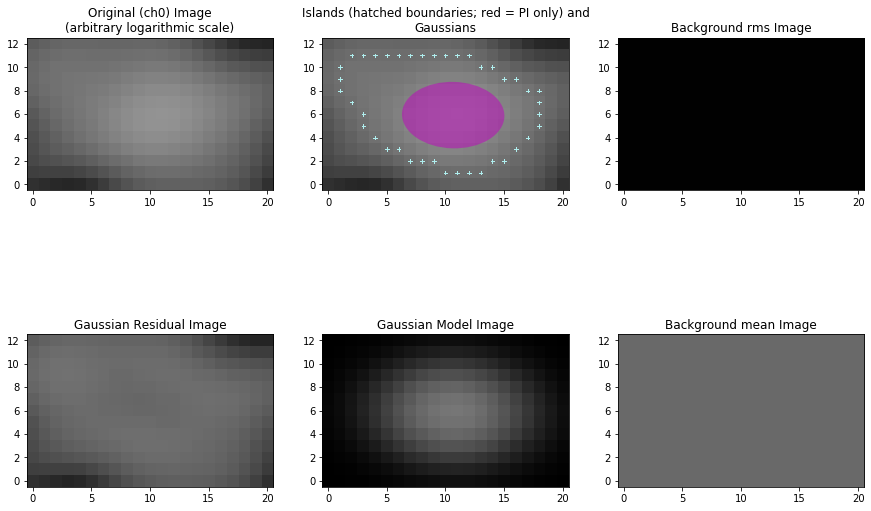

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_176.fits'
Image size .............................. : (24, 19) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.123 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.01177 Jy/beam
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 J

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 1
Total flux density in model ............. : 0.048 Jy
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 1

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.00148 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 2


Fitting islands with Gaussians .......... : [|-] 0/2/Fitting islands with Gaussians .......... : [=/] 1/2Fitting islands with Gaussians .......... : [==] 2/2Fitting islands with Gaussians .......... : [==] 2/2


Total number of Gaussians fit to image .. : 1
--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 1
New sources found in PI image ........... : 0 (1 total)


Calculating polarisation properties ....  : [|] 0/1Calculating polarisation properties ....  : [=] 1/1Calculating polarisation properties ....  : [=] 1/1
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


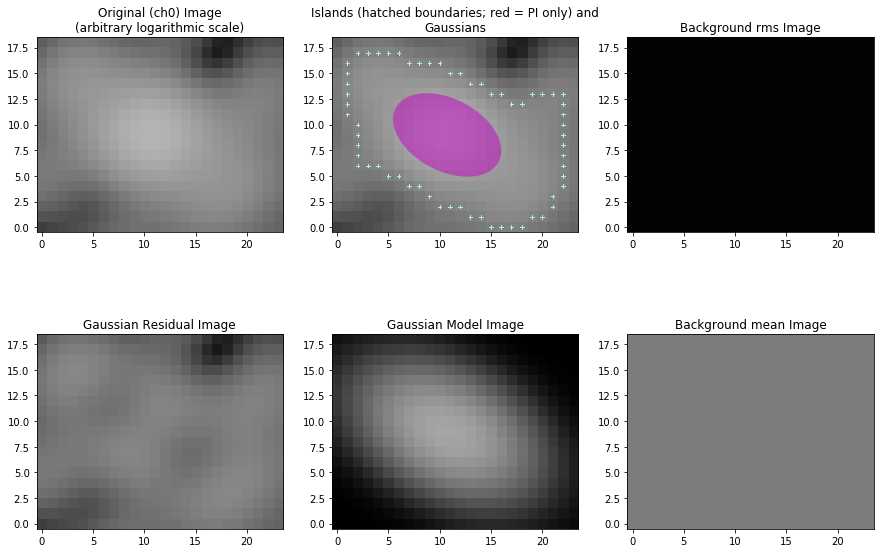

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_177.fits'
Image size .............................. : (12, 10) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.013 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.00563 Jy/beam
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 J

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 1
Total flux density in model ............. : 0.005 Jy
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 1

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.00242 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 1


Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 0


--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 0
New sources found in PI image ........... : 0 (1 total)


Calculating polarisation properties ....  : [|] 0/1Calculating polarisation properties ....  : [=] 1/1Calculating polarisation properties ....  : [=] 1/1
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


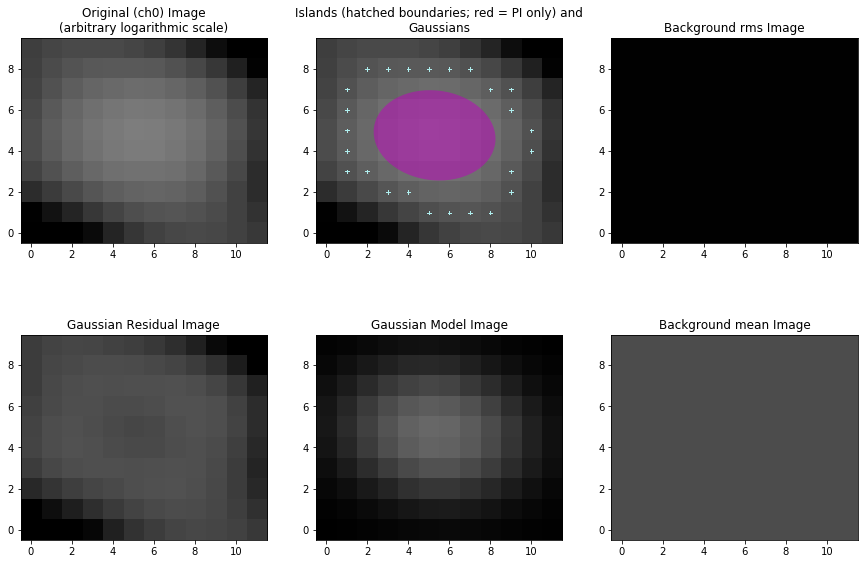

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_178.fits'
Image size .............................. : (50, 28) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.535 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 3) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.01082 Jy/beam
Derived rms_box (box size, step size) ... : (32, 3) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 J

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1


Total number of Gaussians fit to image .. : 1
Total flux density in model ............. : 0.329 Jy
--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 1

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 3) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.00185 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 4


Fitting islands with Gaussians .......... : [|---] 0/4/Fitting islands with Gaussians .......... : [=/--] 1/4-Fitting islands with Gaussians .......... : [==--] 2/4\Fitting islands with Gaussians .......... : [===\] 3/4Fitting islands with Gaussians .......... : [====] 4/4Fitting islands with Gaussians .......... : [====] 4/4

Total number of Gaussians fit to image .. : 1
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 1
New sources found in PI image ........... : 0 (1 total)


Calculating polarisation properties ....  : [|] 0/1Calculating polarisation properties ....  : [=] 1/1Calculating polarisation properties ....  : [=] 1/1
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


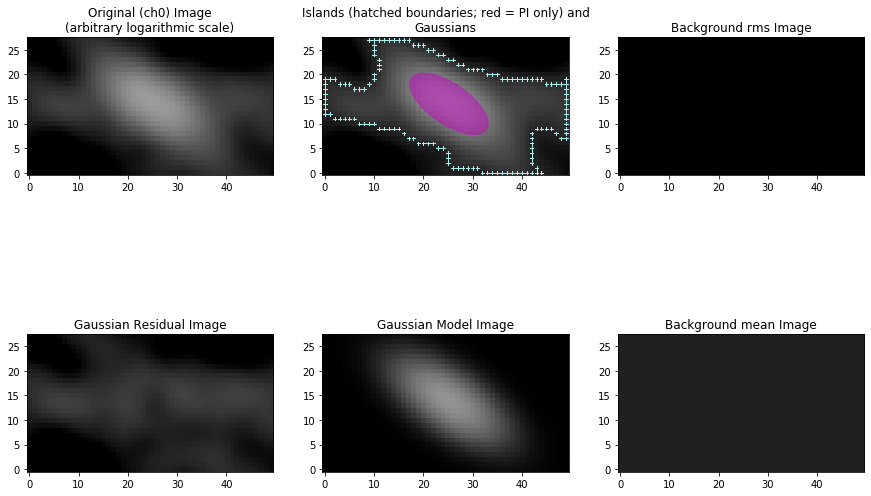

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_179.fits'
Image size .............................. : (23, 28) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.137 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.01201 Jy/beam
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 J

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 1
Total flux density in model ............. : 0.036 Jy
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 1

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.00256 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 2


Fitting islands with Gaussians .......... : [|-] 0/2/Fitting islands with Gaussians .......... : [=/] 1/2Fitting islands with Gaussians .......... : [==] 2/2Fitting islands with Gaussians .......... : [==] 2/2


Total number of Gaussians fit to image .. : 0
--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 0
New sources found in PI image ........... : 0 (1 total)


Calculating polarisation properties ....  : [|] 0/1Calculating polarisation properties ....  : [=] 1/1Calculating polarisation properties ....  : [=] 1/1
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


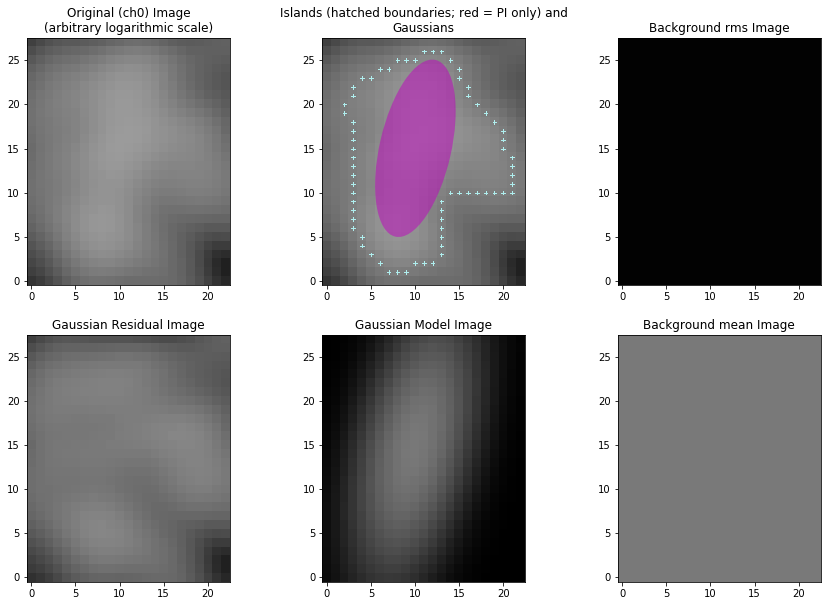

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_180.fits'
Image size .............................. : (25, 21) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.157 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.01053 Jy/beam
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 J

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 1
Total flux density in model ............. : 0.100 Jy
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 1

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.00209 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 3


Fitting islands with Gaussians .......... : [|--] 0/3//Fitting islands with Gaussians .......... : [=/-] 1/3Fitting islands with Gaussians .......... : [=/-] 1/3Fitting islands with Gaussians .......... : [===] 3/3Fitting islands with Gaussians .......... : [===] 3/3


Total number of Gaussians fit to image .. : 1
--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 1
New sources found in PI image ........... : 1 (2 total)


Calculating polarisation properties ....  : [|-] 0/2/Calculating polarisation properties ....  : [=/] 1/2Calculating polarisation properties ....  : [==] 2/2Calculating polarisation properties ....  : [==] 2/2
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


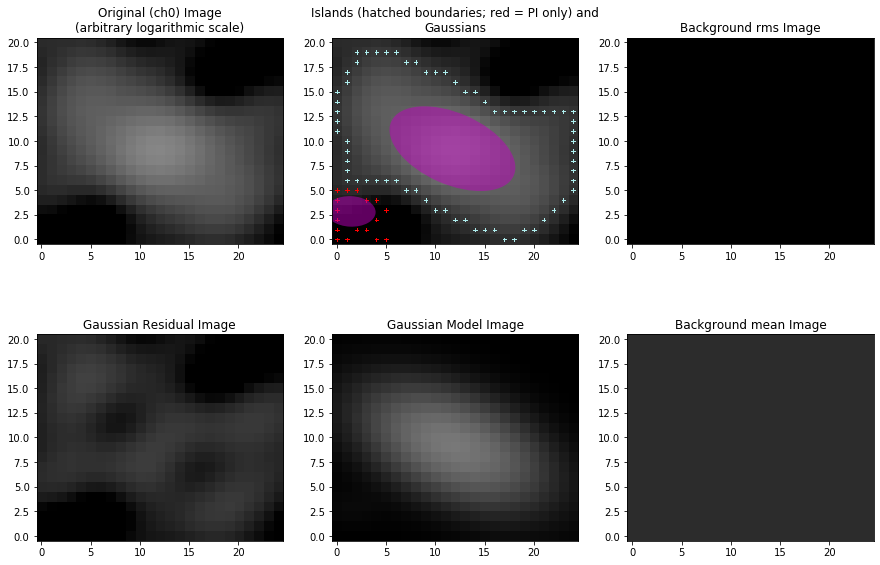

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_181.fits'
Image size .............................. : (16, 10) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.020 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.00925 Jy/beam
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 J

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 1
Total flux density in model ............. : 0.005 Jy
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 1

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.0023 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 1


Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 0
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 0
New sources found in PI image ........... : 0 (1 total)


Calculating polarisation properties ....  : [|] 0/1Calculating polarisation properties ....  : [=] 1/1Calculating polarisation properties ....  : [=] 1/1
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


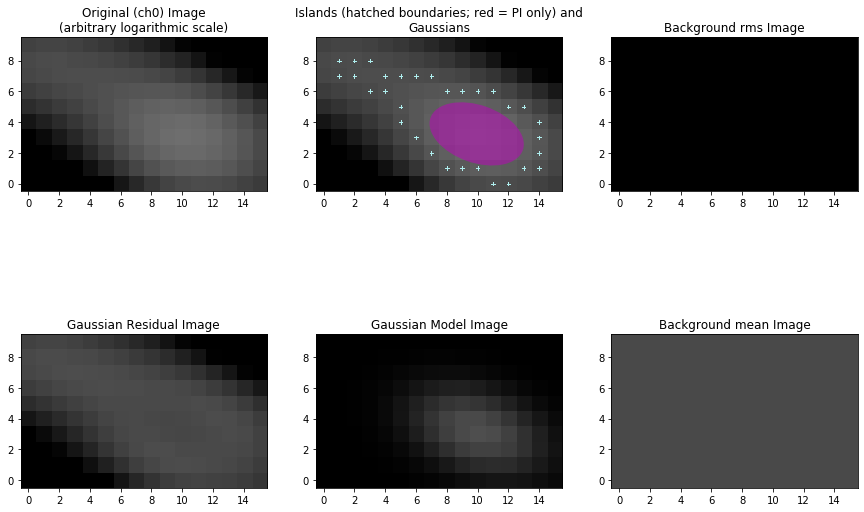

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_182.fits'
Image size .............................. : (16, 10) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.051 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.01732 Jy/beam
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 J

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 1
Total flux density in model ............. : 0.012 Jy
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 1

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.00198 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 1


Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 0


--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 0
New sources found in PI image ........... : 0 (1 total)


Calculating polarisation properties ....  : [|] 0/1Calculating polarisation properties ....  : [=] 1/1Calculating polarisation properties ....  : [=] 1/1
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


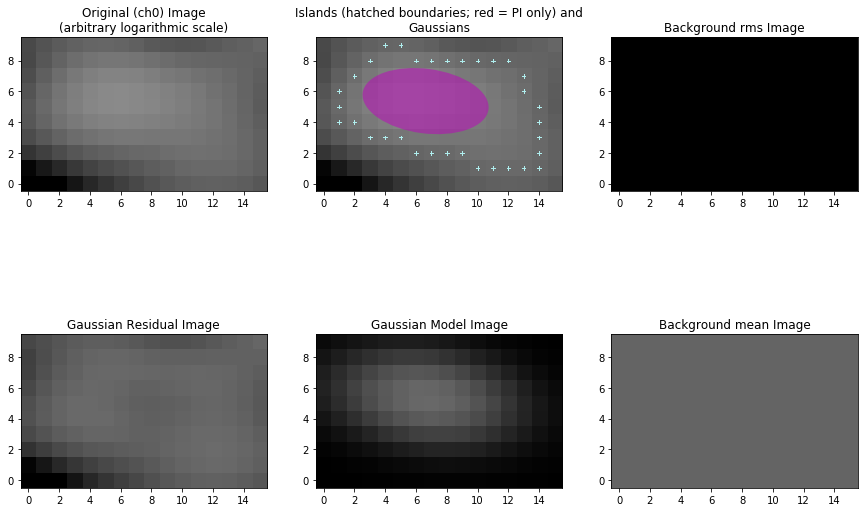

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_183.fits'
Image size .............................. : (26, 29) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.300 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 3) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.01684 Jy/beam
Derived rms_box (box size, step size) ... : (32, 3) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 J

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 2
Total flux density in model ............. : 0.121 Jy


--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 2

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 3) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.0021 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 2


Fitting islands with Gaussians .......... : [|-] 0/2/Fitting islands with Gaussians .......... : [=/] 1/2Fitting islands with Gaussians .......... : [==] 2/2Fitting islands with Gaussians .......... : [==] 2/2


Total number of Gaussians fit to image .. : 0
--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 0
New sources found in PI image ........... : 0 (2 total)


Calculating polarisation properties ....  : [|-] 0/2/Calculating polarisation properties ....  : [=/] 1/2Calculating polarisation properties ....  : [==] 2/2Calculating polarisation properties ....  : [==] 2/2
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


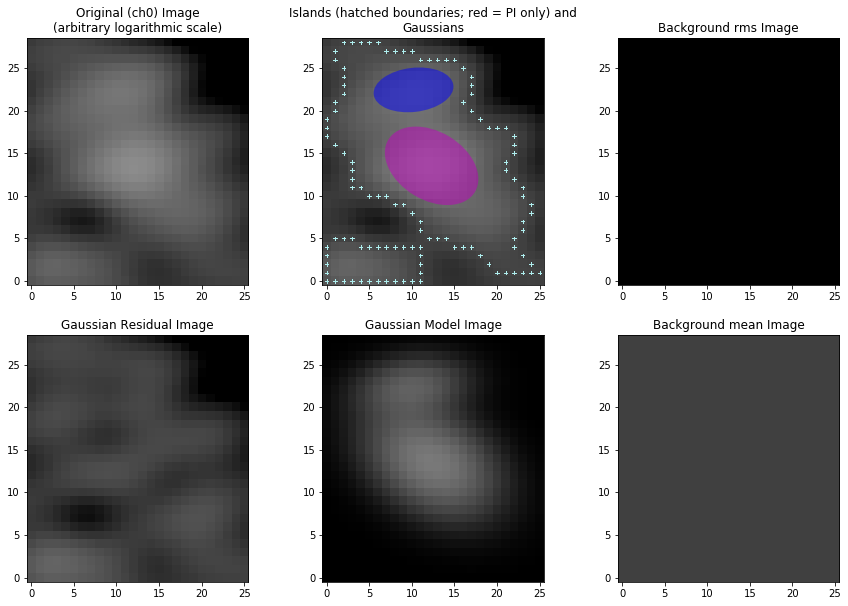

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_184.fits'
Image size .............................. : (31, 23) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.111 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.007 Jy/beam
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 Jy/

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 2
Total flux density in model ............. : 0.043 Jy
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 1

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.00248 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 2


Fitting islands with Gaussians .......... : [|-] 0/2/Fitting islands with Gaussians .......... : [=/] 1/2Fitting islands with Gaussians .......... : [==] 2/2Fitting islands with Gaussians .......... : [==] 2/2


Total number of Gaussians fit to image .. : 1
--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 1
New sources found in PI image ........... : 0 (1 total)


Calculating polarisation properties ....  : [|] 0/1Calculating polarisation properties ....  : [=] 1/1Calculating polarisation properties ....  : [=] 1/1
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


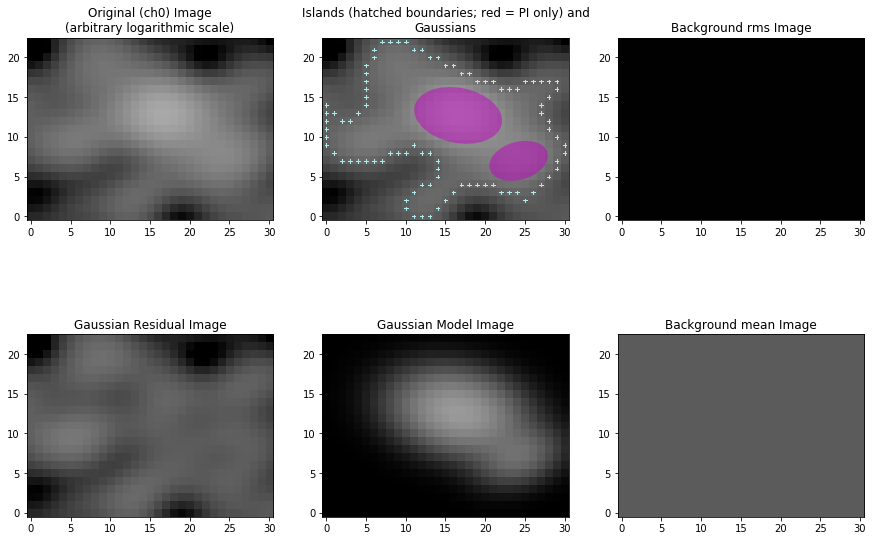

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_185.fits'
Image size .............................. : (14, 9) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.033 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.01198 Jy/beam
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 Jy

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 1
Total flux density in model ............. : 0.013 Jy


--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 1

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.00174 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 1


Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 0
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 0
New sources found in PI image ........... : 0 (1 total)


Calculating polarisation properties ....  : [|] 0/1Calculating polarisation properties ....  : [=] 1/1Calculating polarisation properties ....  : [=] 1/1
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


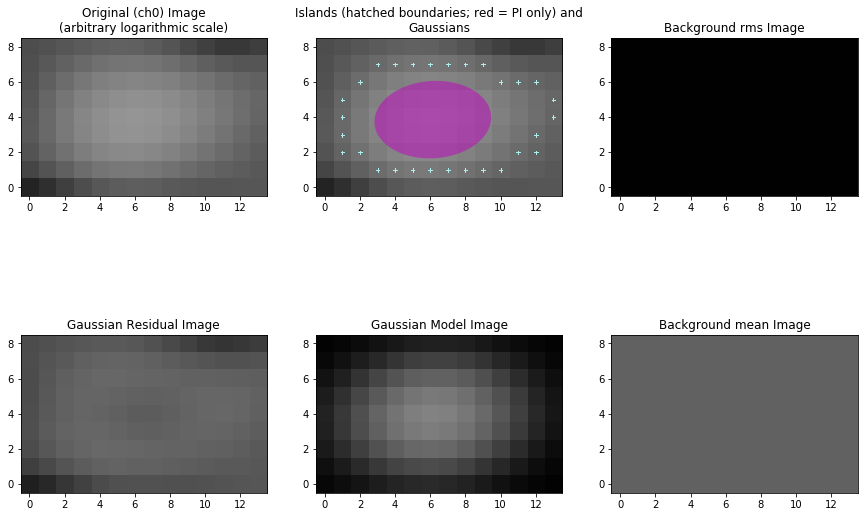

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_186.fits'
Image size .............................. : (30, 20) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.124 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.00923 Jy/beam
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 J

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 2
Total flux density in model ............. : 0.065 Jy
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 2

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.00176 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 2


Fitting islands with Gaussians .......... : [|-] 0/2/Fitting islands with Gaussians .......... : [=/] 1/2Fitting islands with Gaussians .......... : [==] 2/2Fitting islands with Gaussians .......... : [==] 2/2


Total number of Gaussians fit to image .. : 0
--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 0
New sources found in PI image ........... : 0 (2 total)


Calculating polarisation properties ....  : [|-] 0/2/Calculating polarisation properties ....  : [=/] 1/2Calculating polarisation properties ....  : [==] 2/2Calculating polarisation properties ....  : [==] 2/2
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


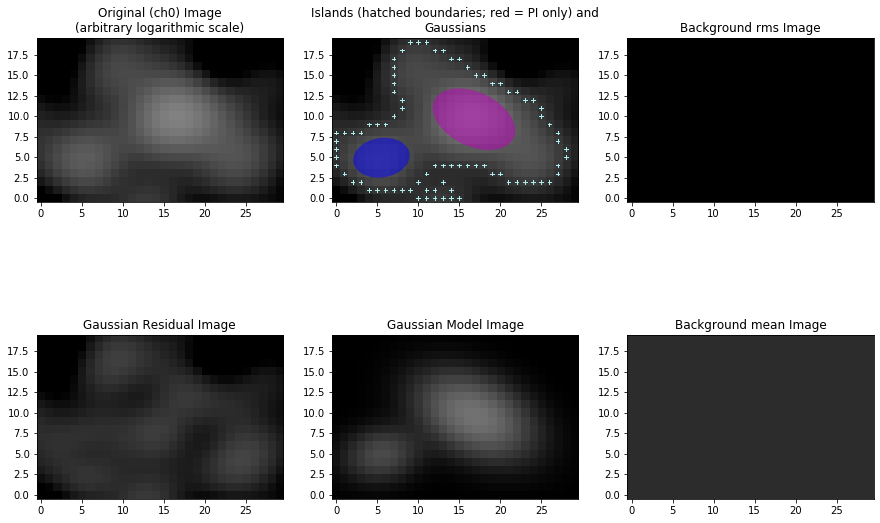

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_187.fits'
Image size .............................. : (22, 14) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.034 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.00522 Jy/beam
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 J

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 1
Total flux density in model ............. : 0.013 Jy
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 1

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.00142 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 1


Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 0


--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 0
New sources found in PI image ........... : 0 (1 total)


Calculating polarisation properties ....  : [|] 0/1Calculating polarisation properties ....  : [=] 1/1Calculating polarisation properties ....  : [=] 1/1
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


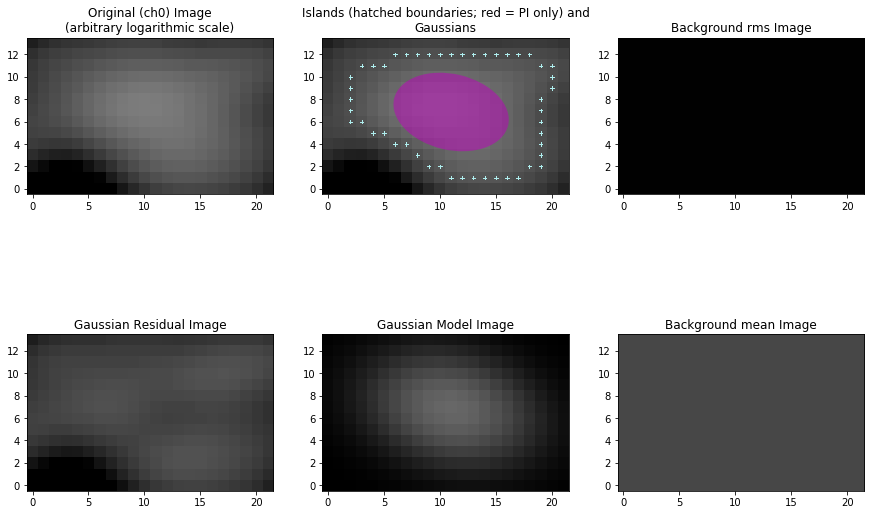

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_188.fits'
Image size .............................. : (27, 23) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 4
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.166 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (I) ............. : 5.00e-05 Jy/beam
Value of background mean (I) ............ : 0.01442 Jy/beam
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms (Q) ............. : 5.00e-05 J

Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 1
Total flux density in model ............. : 0.043 Jy
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 1

--> Checking PI image for new sources
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 5.00e-05 Jy/beam
Value of background mean ................ : 0.00177 Jy/beam
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 2


Fitting islands with Gaussians .......... : [|-] 0/2/Fitting islands with Gaussians .......... : [=/] 1/2Fitting islands with Gaussians .......... : [==] 2/2Fitting islands with Gaussians .......... : [==] 2/2

Total number of Gaussians fit to image .. : 0


--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 0
New sources found in PI image ........... : 0 (1 total)


Calculating polarisation properties ....  : [|] 0/1Calculating polarisation properties ....  : [=] 1/1Calculating polarisation properties ....  : [=] 1/1
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


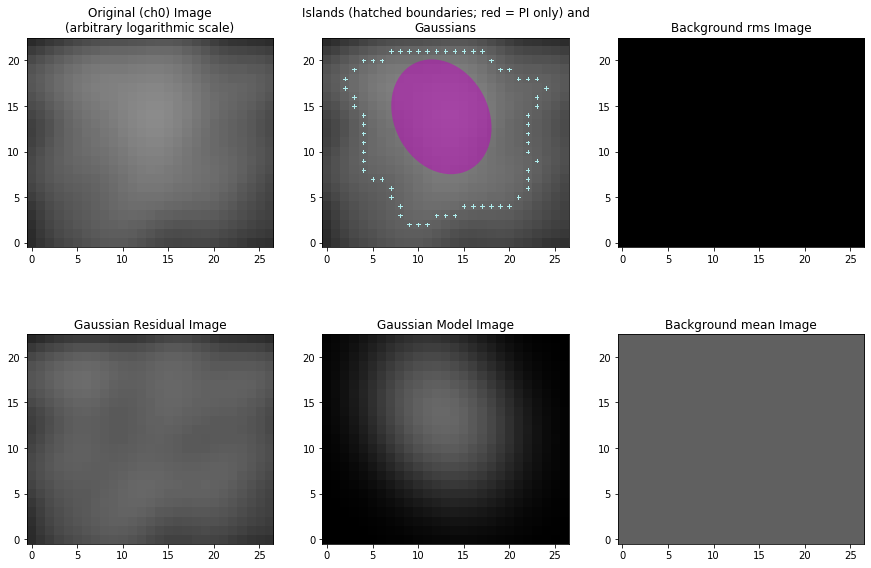

In [36]:
imgs = []
for i in tqdm(range(len(fits_cubes))):
    try:
        img = bdsf.process_image('/home/alger/possum/alger/hamburg/racs_04_rmsynthcube_{}.fits'.format(i),
                           polarisation_do=True, rms_value=5e-5)
        img.show_fit()
        time.sleep(1)
    except IndexError:
        imgs.append(None)
        continue
    imgs.append(img)

From these PyBDSF results we can extract polarisation parameters — fractional polarisation and polarisation angle. What if we instead do source-finding on the peak PI for each cutout?

In [38]:
fits_cubes_pi = [fits.PrimaryHDU(abs(c), header=Q[0].header.copy()) for c in peak_pi]
for f, w in zip(fits_cubes_pi, cutout_wcss):
    f.header.update(w.to_header())

In [39]:
for i, f in enumerate(fits_cubes_pi):
    f.writeto('/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_{}.fits'.format(i), overwrite=True)

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_0.fits'
Image size .............................. : (19, 10) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.004 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.00117 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 0
--> Grou

0
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


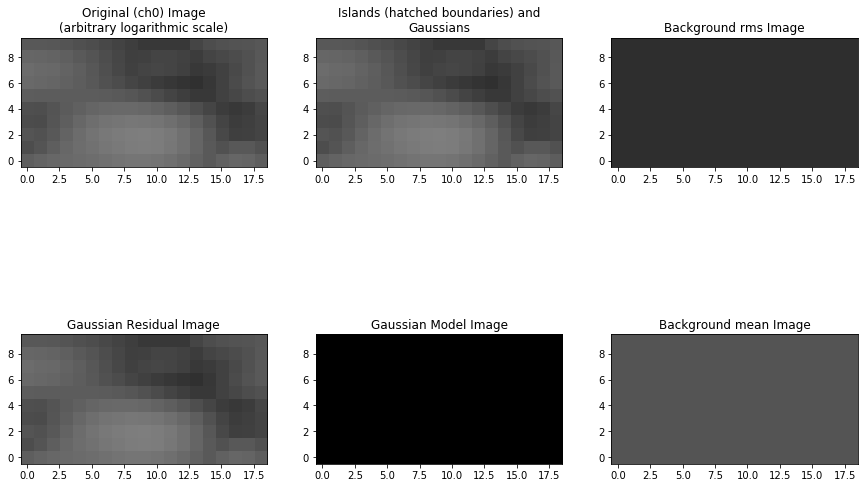

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_1.fits'
Image size .............................. : (28, 14) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.010 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.00145 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 0
--> Grou

1
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


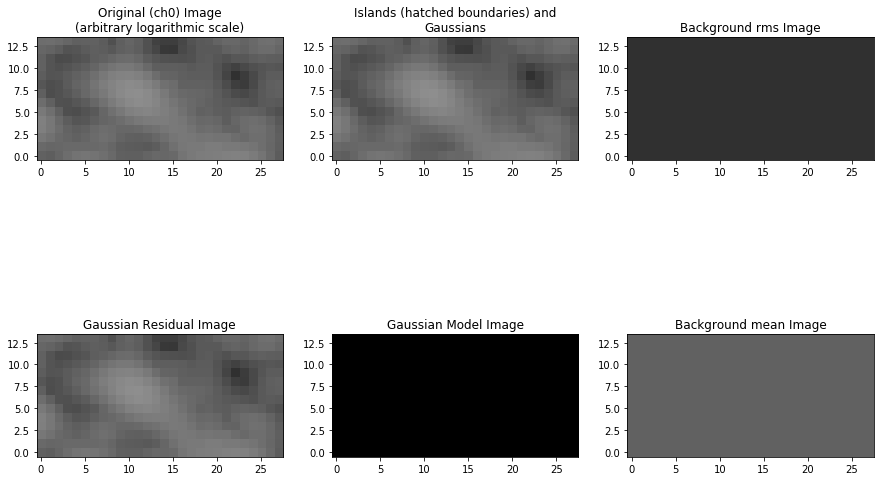

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_2.fits'
Image size .............................. : (53, 29) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.063 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 3) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.002 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 2


Fitting islands with Gaussians .......... : [|-] 0/2/Fitting islands with Gaussians .......... : [=/] 1/2Fitting islands with Gaussians .......... : [==] 2/2Fitting islands with Gaussians .......... : [==] 2/2

Total number of Gaussians fit to image .. : 2
Total flux density in model ............. : 0.014 Jy
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 2


2
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


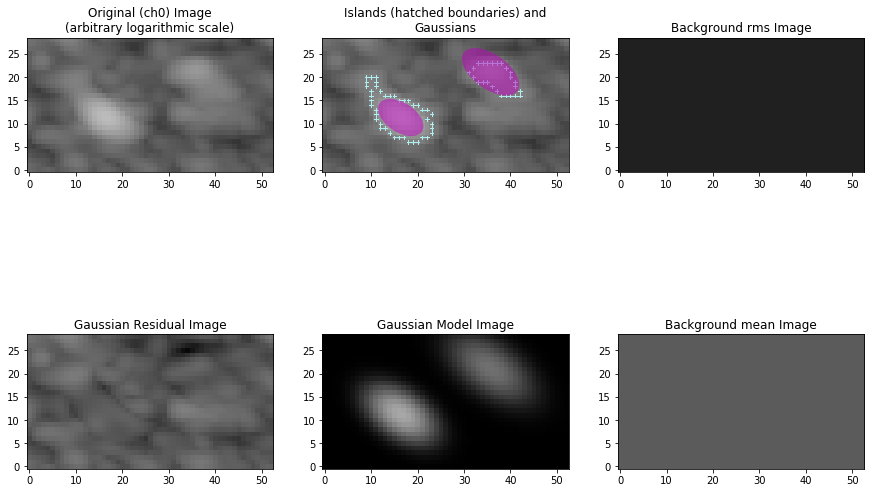

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_3.fits'
Image size .............................. : (16, 12) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.007 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.0021 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 0
--> Group

3
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


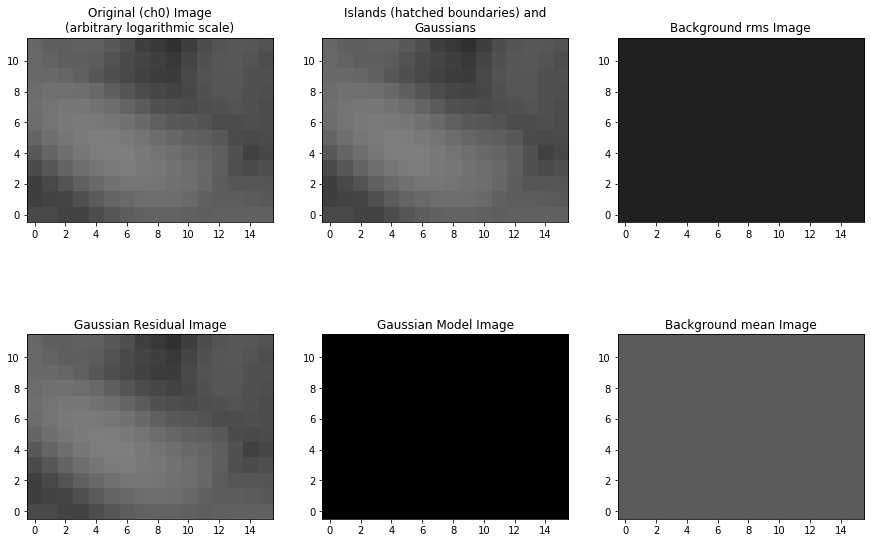

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_4.fits'
Image size .............................. : (16, 15) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.008 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.00176 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 0
--> Grou

4
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


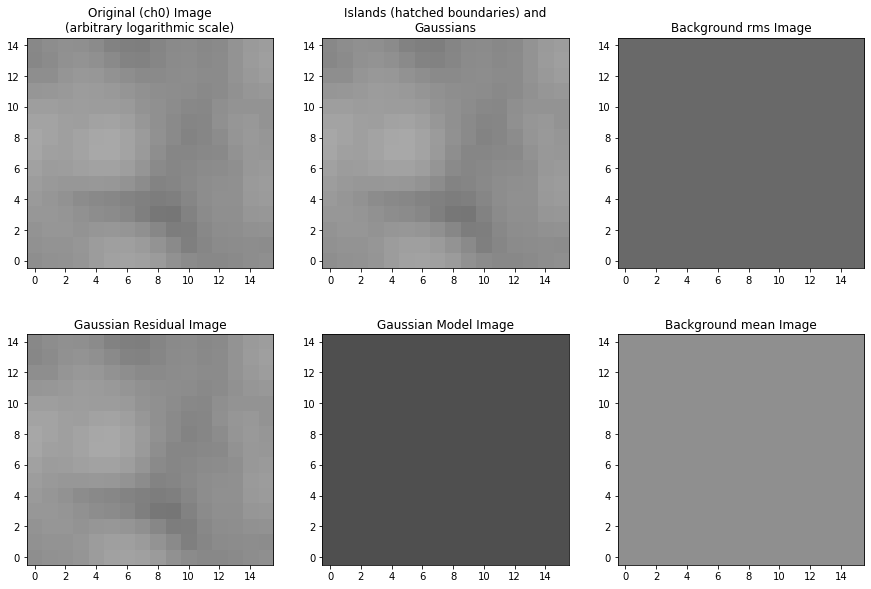

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_5.fits'
Image size .............................. : (37, 21) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.025 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.00181 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 0
--> Grou

5
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


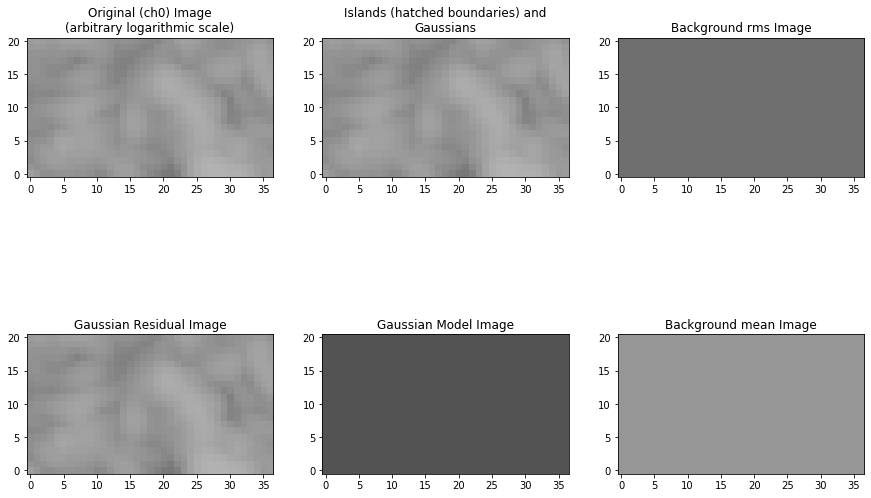

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_6.fits'
Image size .............................. : (26, 23) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.025 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.00237 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 1


Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 1
Total flux density in model ............. : 0.004 Jy


--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 1


6
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


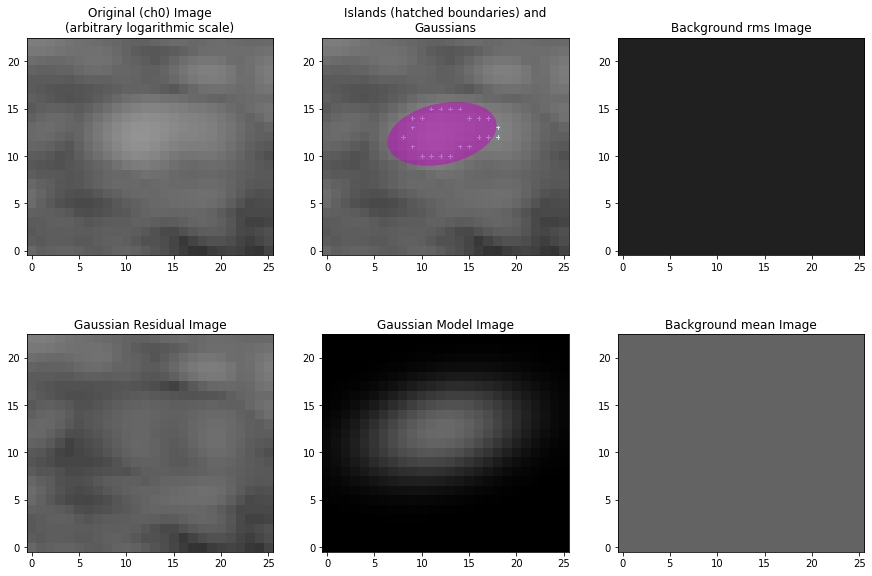

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_7.fits'
Image size .............................. : (46, 16) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.033 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.00221 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 2


Fitting islands with Gaussians .......... : [|-] 0/2/Fitting islands with Gaussians .......... : [=/] 1/2Fitting islands with Gaussians .......... : [==] 2/2Fitting islands with Gaussians .......... : [==] 2/2

Total number of Gaussians fit to image .. : 1
Total flux density in model ............. : 0.005 Jy
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 1
    Island #1 (x=29, y=8)
Please check this island. If it is a valid island and
should be fit, try adjusting the flagging options (use
show_fit with "ch0_flagged=True" to see the flagged Gaussians)
or enabling the wavelet module (with "atrous_do=True").
To include empty islands in output source catalogs, set
incl_empty=True in the write_catalog task.


7
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


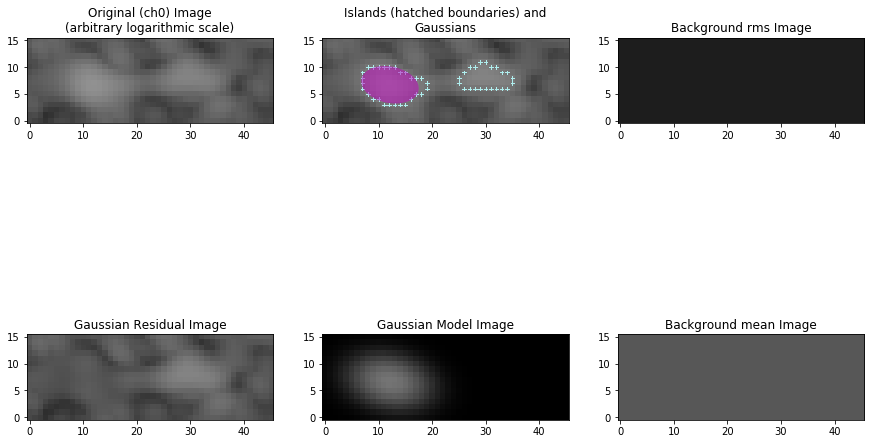

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_8.fits'
Image size .............................. : (26, 19) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.023 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.00259 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 0
--> Grou

8
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


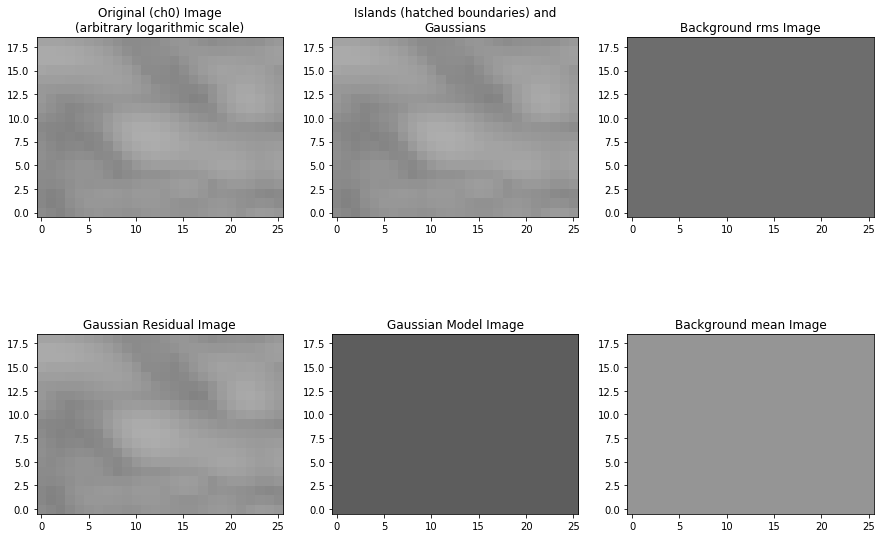

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_9.fits'
Image size .............................. : (11, 10) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.004 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.00195 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 0
--> Grou

9
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


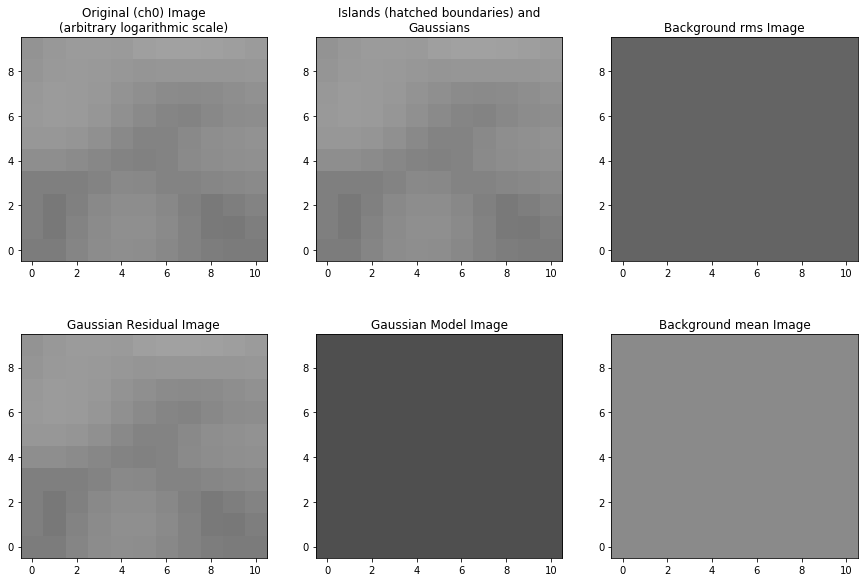

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_10.fits'
Image size .............................. : (20, 17) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.013 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.00214 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 0
--> Gro

10
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


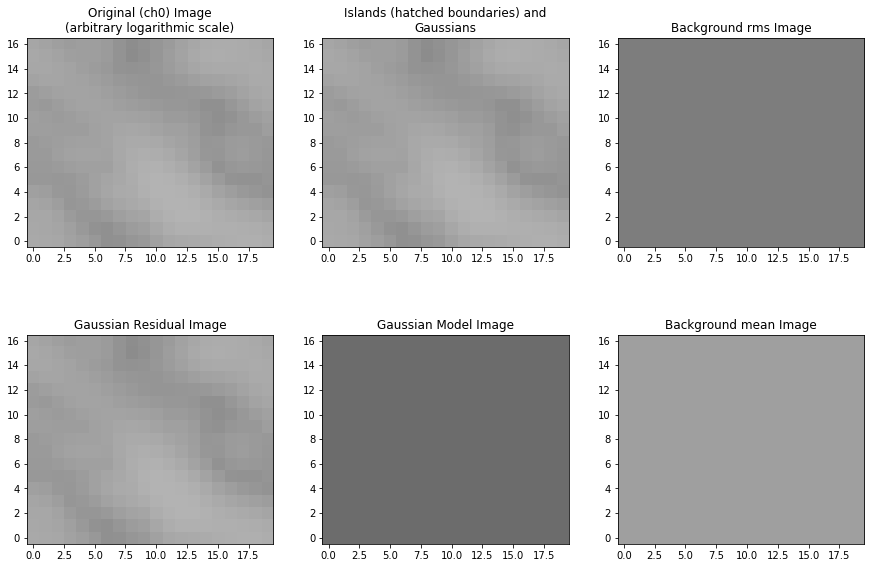

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_11.fits'
Image size .............................. : (19, 15) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.010 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.00211 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 0
--> Gro

11
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


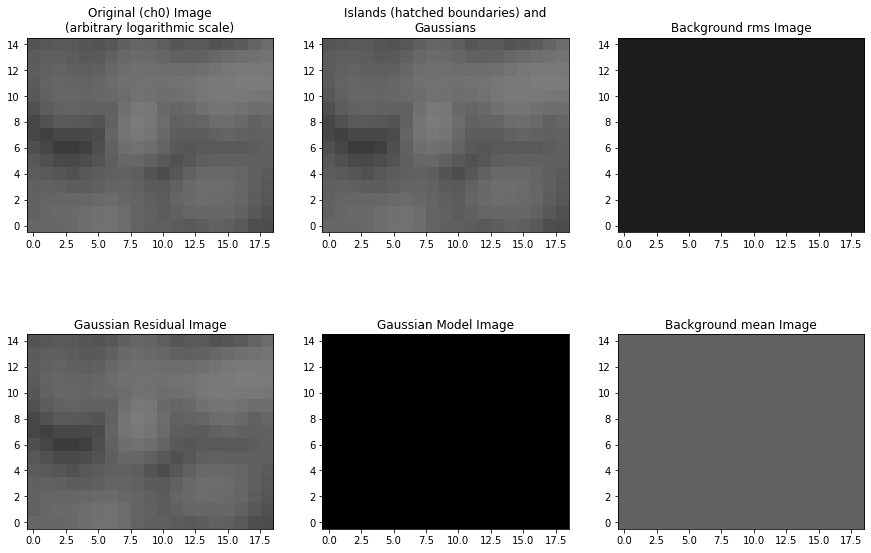

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_12.fits'
Image size .............................. : (44, 20) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.033 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.00217 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 0
--> Gro

12
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


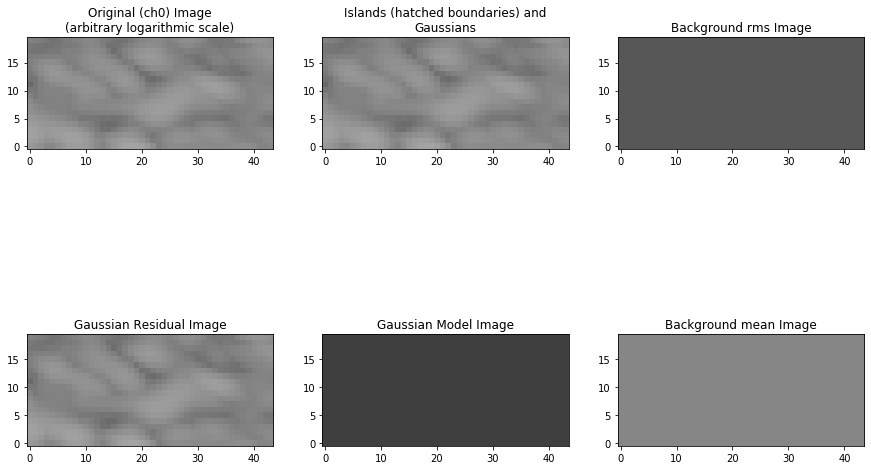

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_13.fits'
Image size .............................. : (20, 12) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.009 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.00212 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 0
--> Gro

13
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


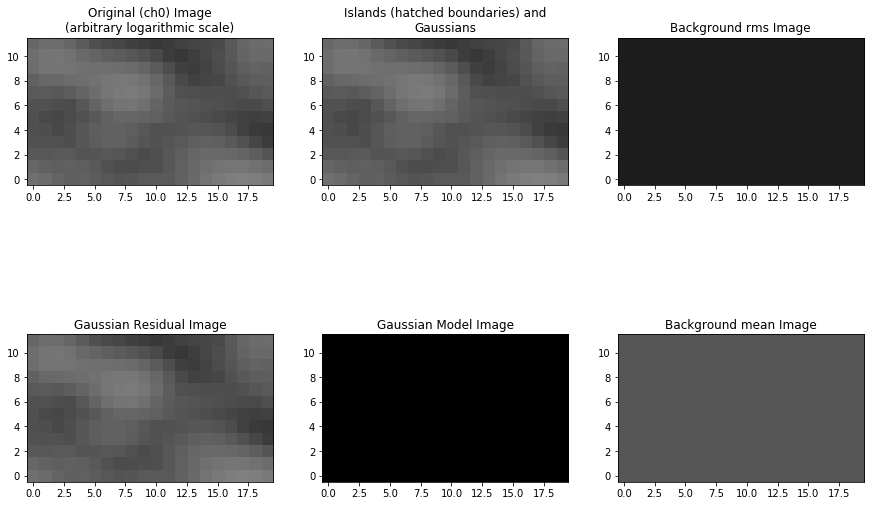

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_14.fits'
Image size .............................. : (13, 10) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.005 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.00235 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 0
--> Gro

14
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


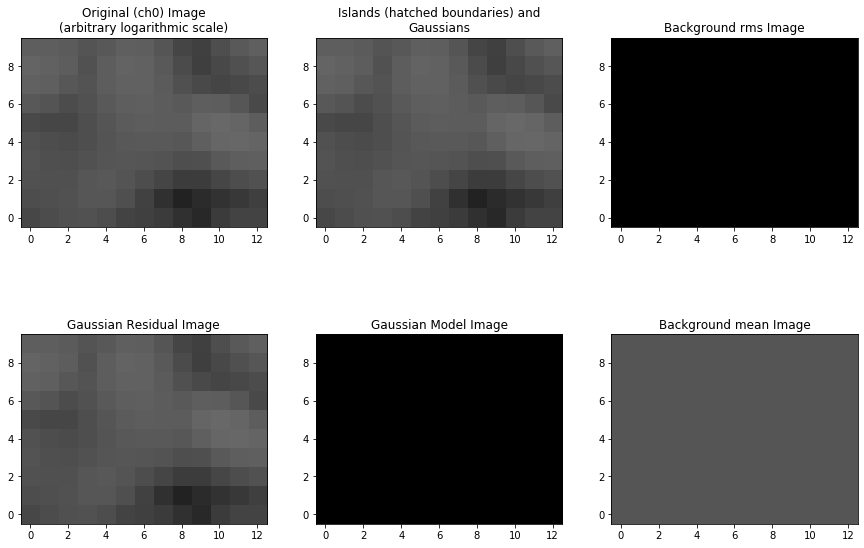

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_15.fits'
Image size .............................. : (18, 12) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.008 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.00225 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 0
--> Gro

15
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


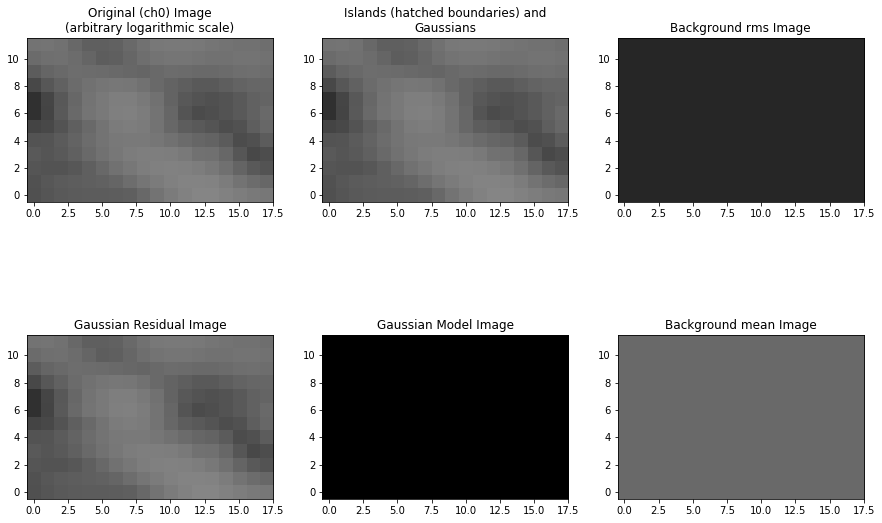

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_16.fits'
Image size .............................. : (12, 8) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.004 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.00256 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 0
--> Grou

16
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


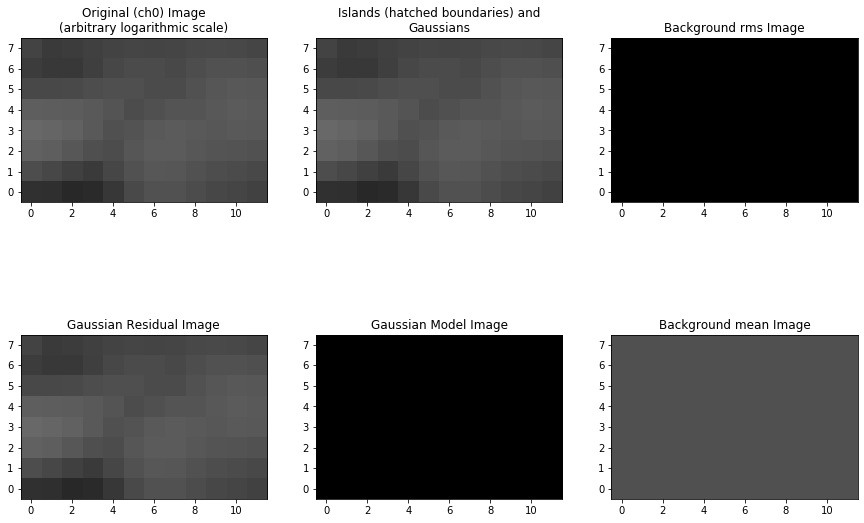

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_17.fits'
Image size .............................. : (29, 19) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.022 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.0023 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 0
--> Grou

17
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


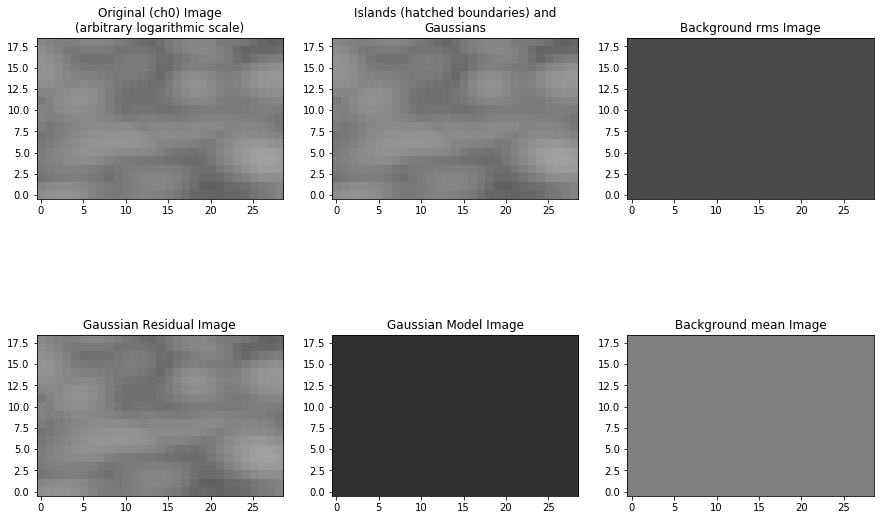

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_18.fits'
Image size .............................. : (42, 23) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.046 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.00212 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 1


Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 1
Total flux density in model ............. : 0.014 Jy
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 1


18
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


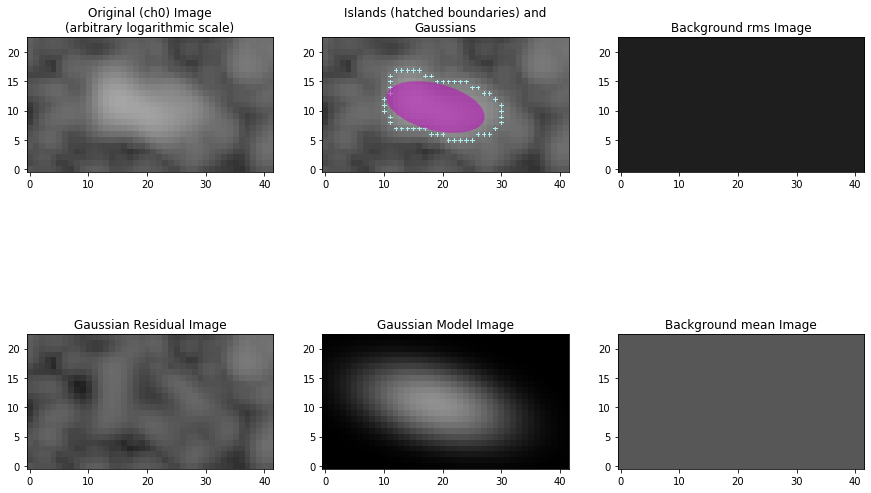

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_19.fits'
Image size .............................. : (21, 15) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.010 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.00197 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 0
--> Gro

19
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


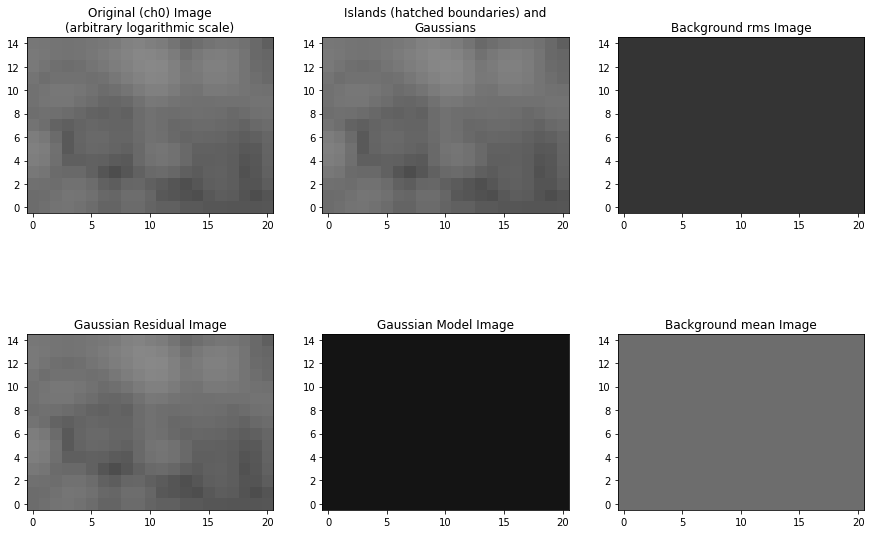

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_20.fits'
Image size .............................. : (17, 12) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.007 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.00195 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 0
--> Gro

20
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


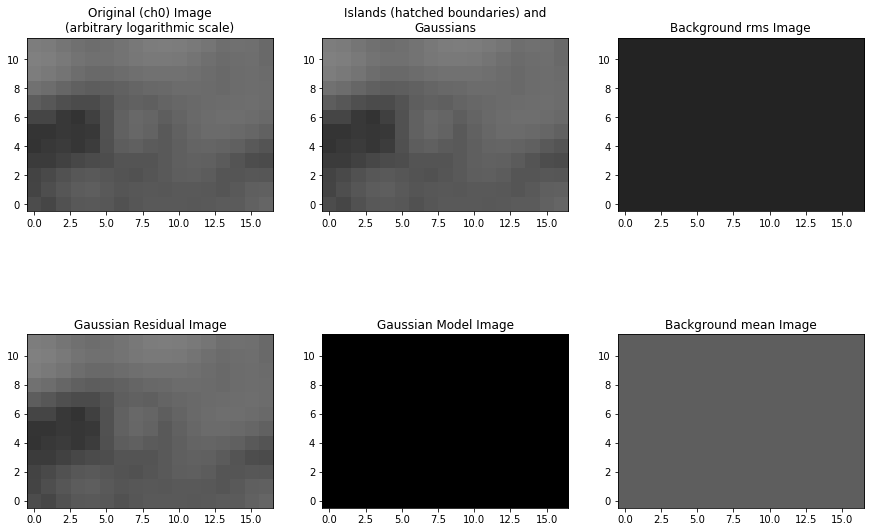

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_21.fits'
Image size .............................. : (21, 16) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.012 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.00223 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 0
--> Gro

21
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


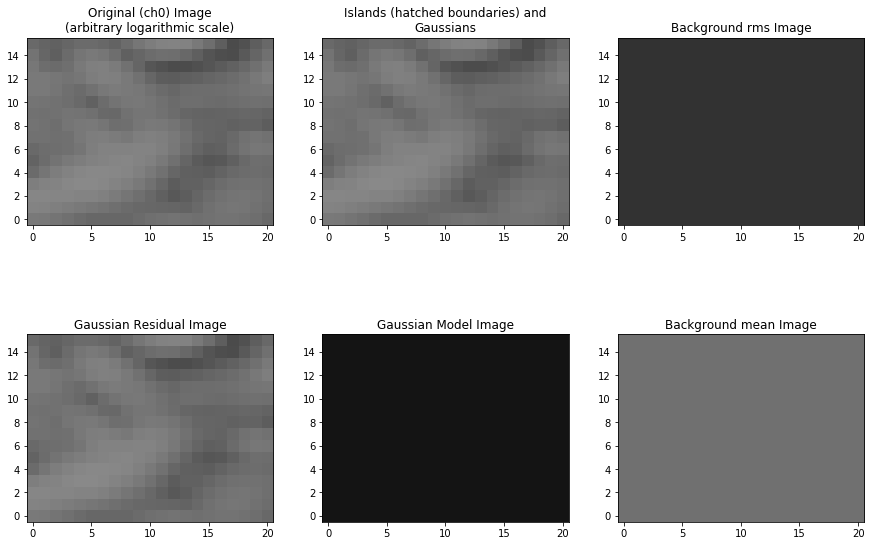

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_22.fits'
Image size .............................. : (28, 18) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.021 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.00241 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 0
--> Gro

22
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


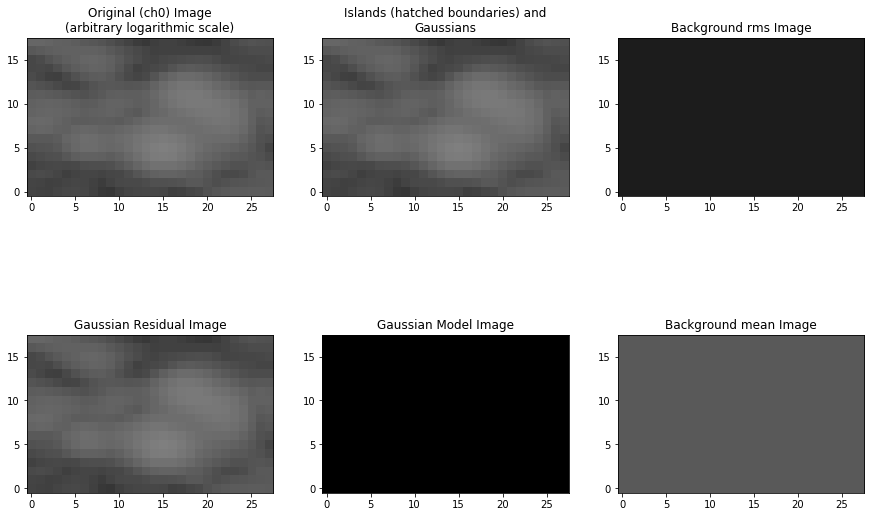

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_23.fits'
Image size .............................. : (16, 15) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.010 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.0027 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 0
--> Grou

23
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


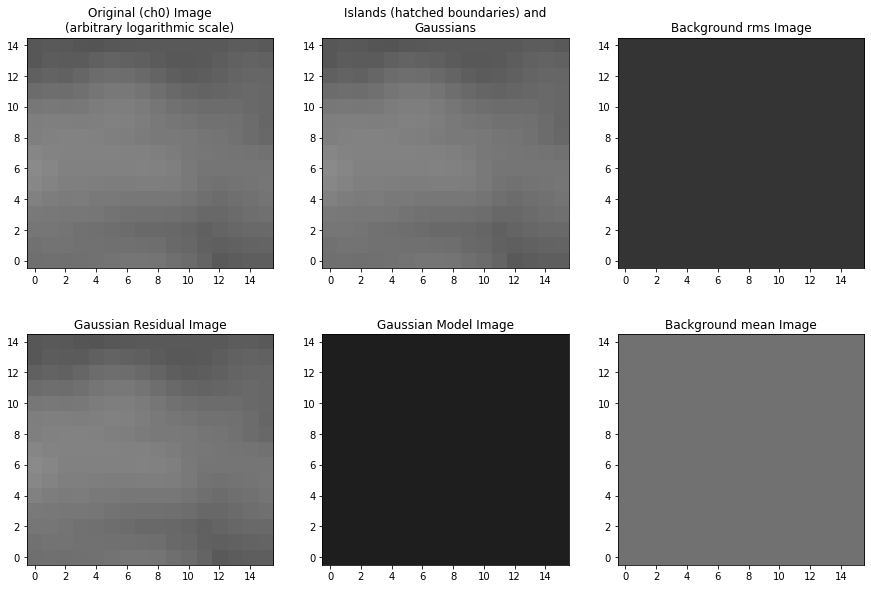

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_24.fits'
Image size .............................. : (48, 21) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.036 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.00209 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 0
--> Gro

24
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


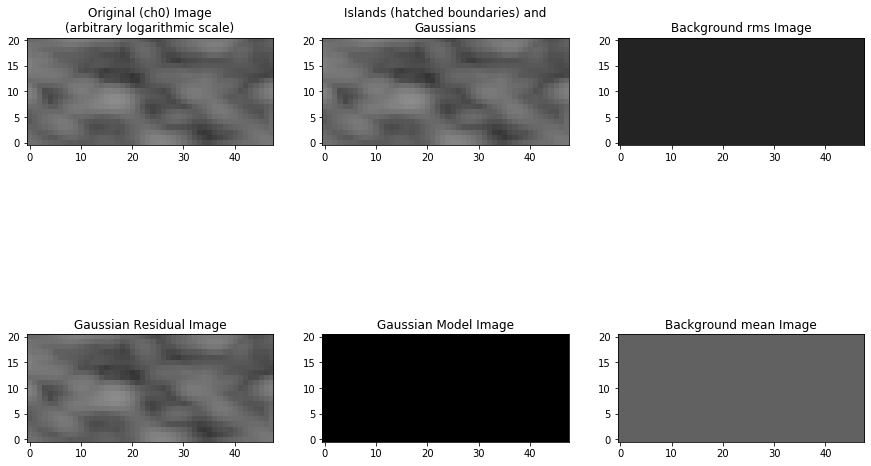

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_25.fits'
Image size .............................. : (39, 16) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.021 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.00203 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 0
--> Gro

25
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


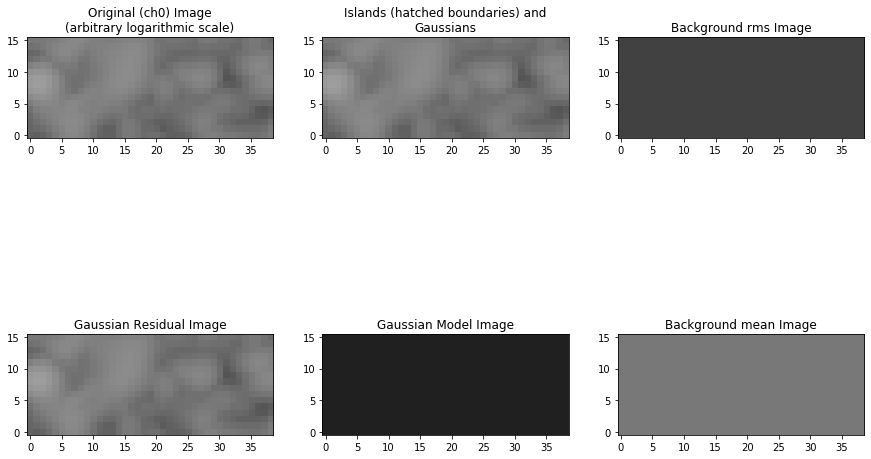

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_26.fits'
Image size .............................. : (19, 15) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.009 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.00193 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 0
--> Gro

26
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


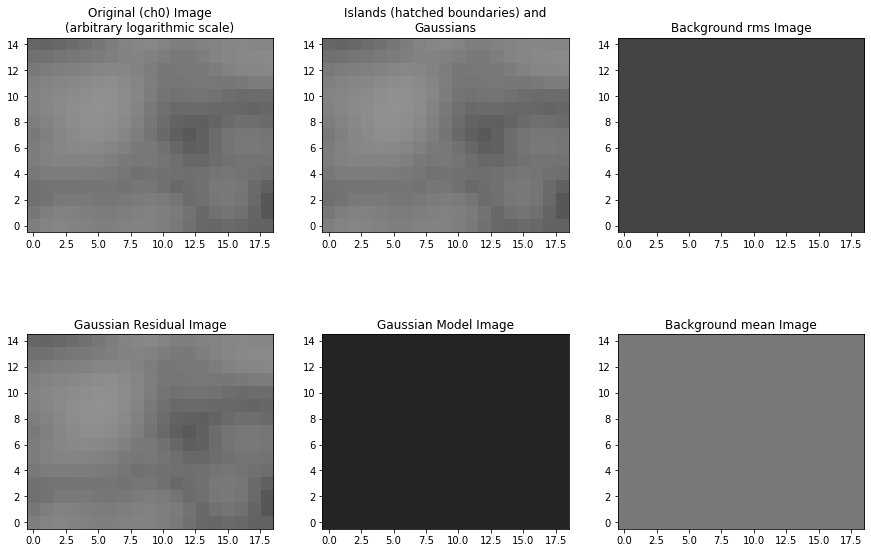

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_27.fits'
Image size .............................. : (16, 16) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.010 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.00247 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 0
--> Gro

27
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


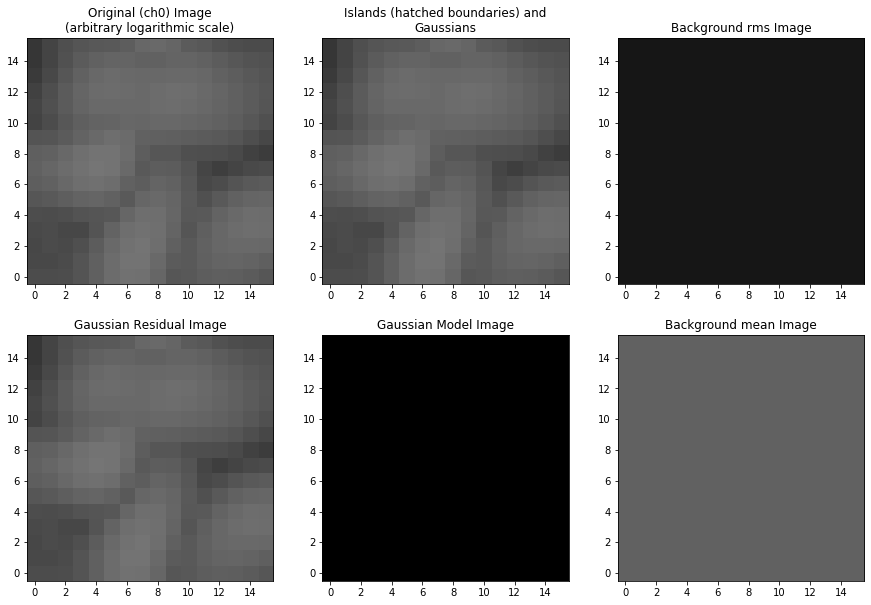

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_28.fits'
Image size .............................. : (45, 26) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.084 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (61, 3) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.00223 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 1


Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 2
Total flux density in model ............. : 0.043 Jy
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 2


28
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


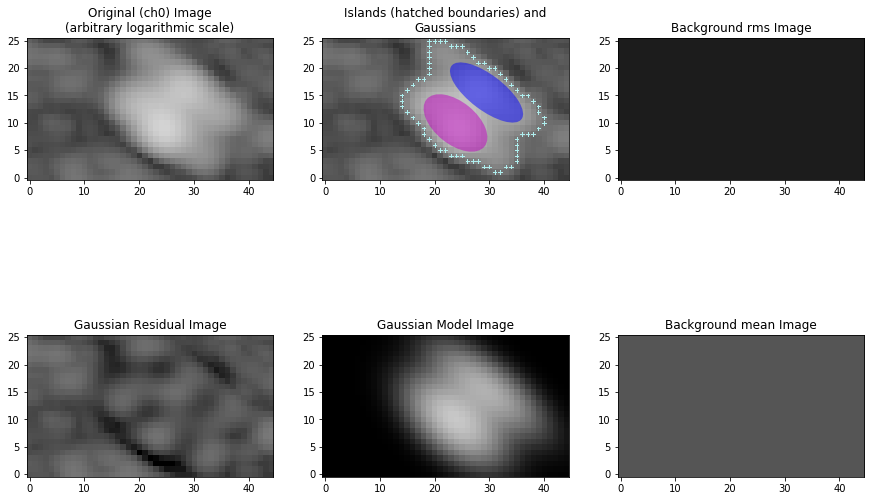

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_29.fits'
Image size .............................. : (16, 12) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.007 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.00197 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 0
--> Gro

29
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


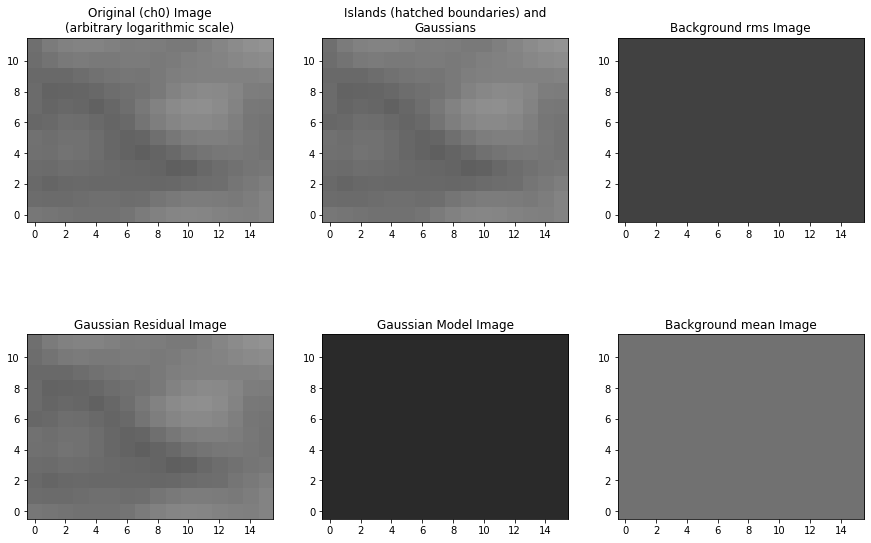

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_30.fits'
Image size .............................. : (23, 29) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.027 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.00241 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 0
--> Gro

30
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


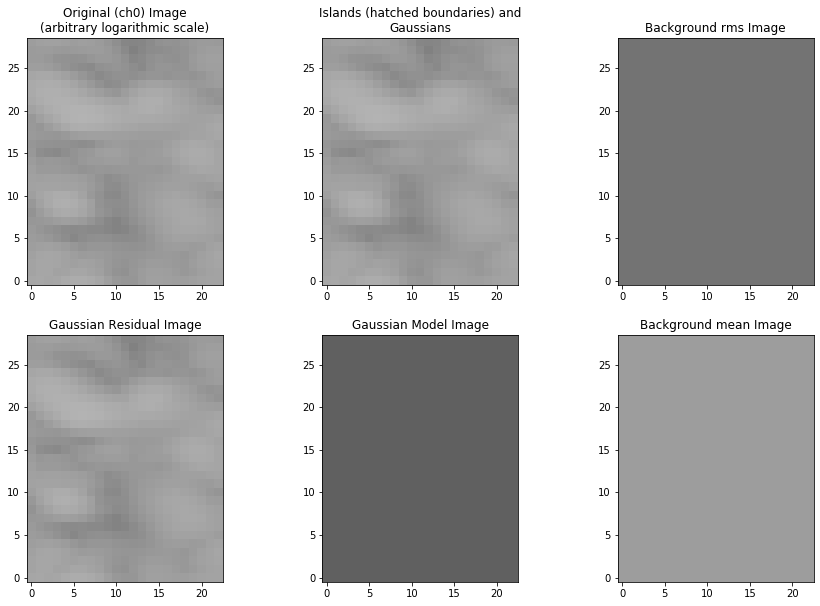

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_31.fits'
Image size .............................. : (28, 26) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.026 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 3) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.00206 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 0
--> Gro

31
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


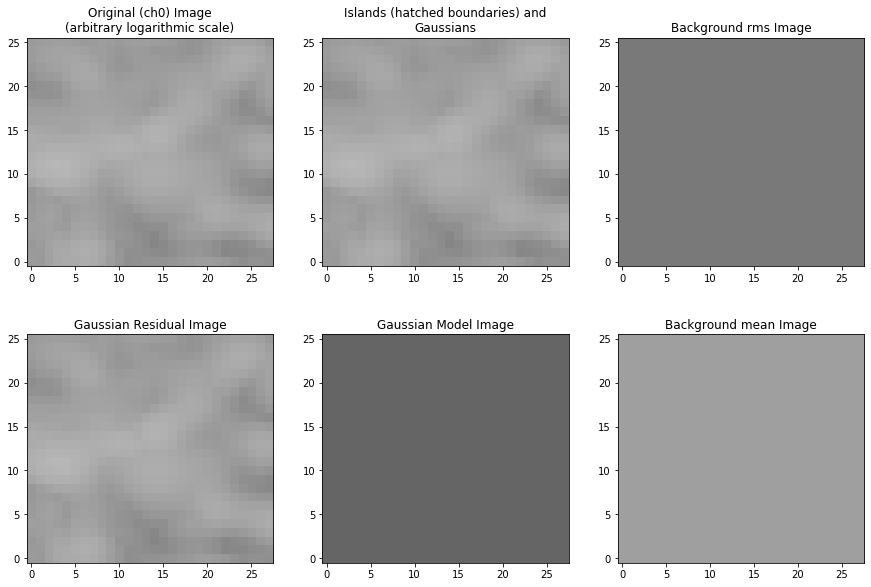

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_32.fits'
Image size .............................. : (21, 15) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.009 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.00182 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 0
--> Gro

32
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


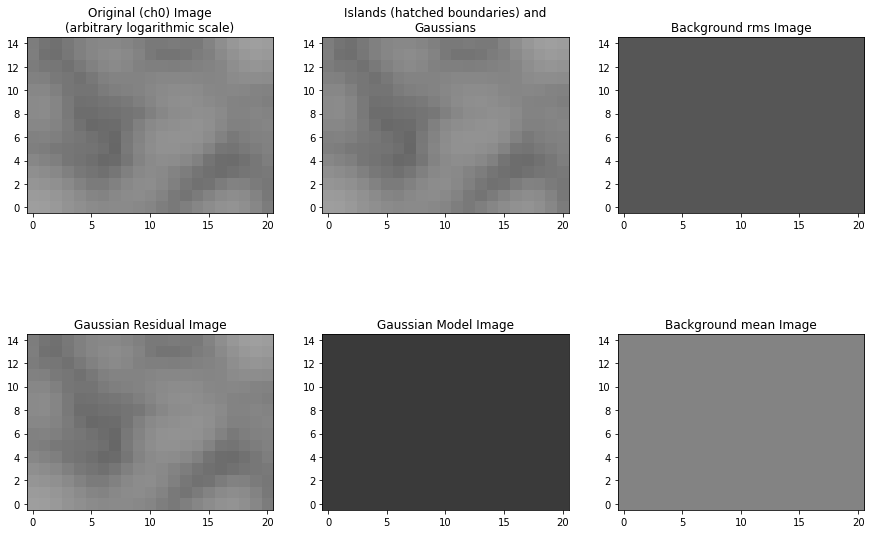

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_33.fits'
Image size .............................. : (15, 9) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.004 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.00191 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 0
--> Grou

33
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


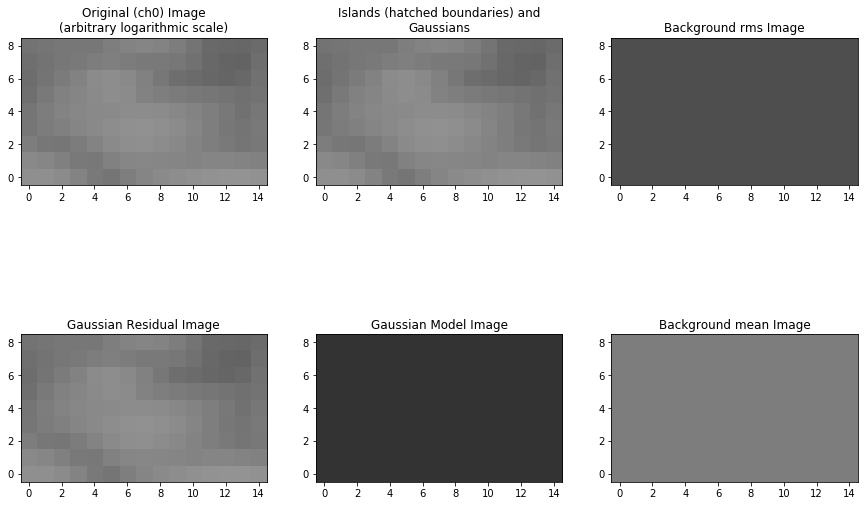

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_34.fits'
Image size .............................. : (42, 17) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.025 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.00206 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 0
--> Gro

34
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


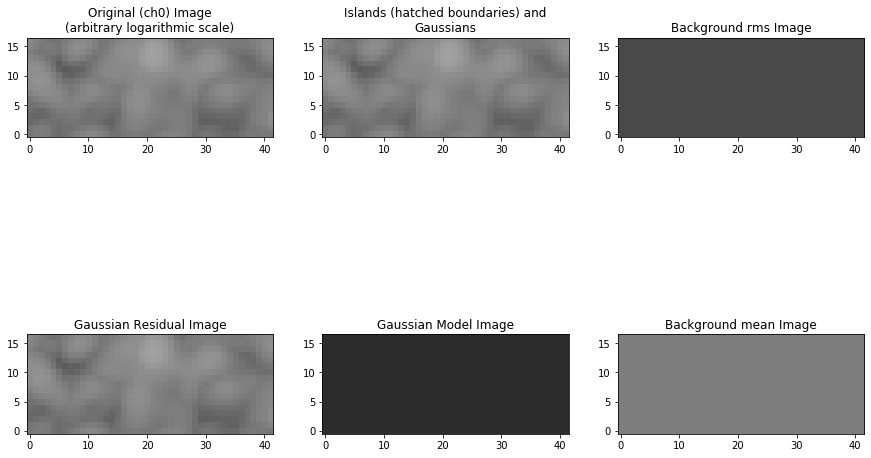

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_35.fits'
Image size .............................. : (24, 20) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.016 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.00199 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 0
--> Gro

35
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


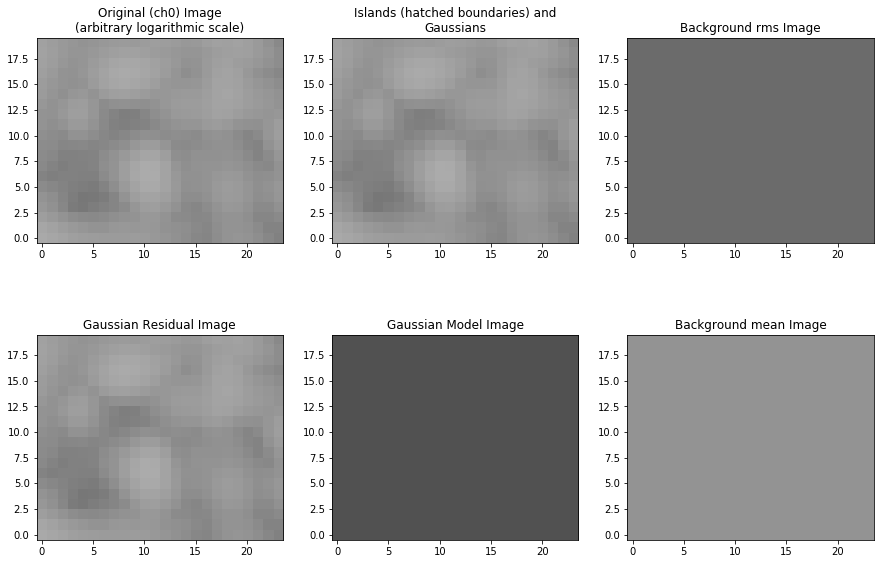

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_36.fits'
Image size .............................. : (21, 17) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.014 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.00228 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 0
--> Gro

36
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


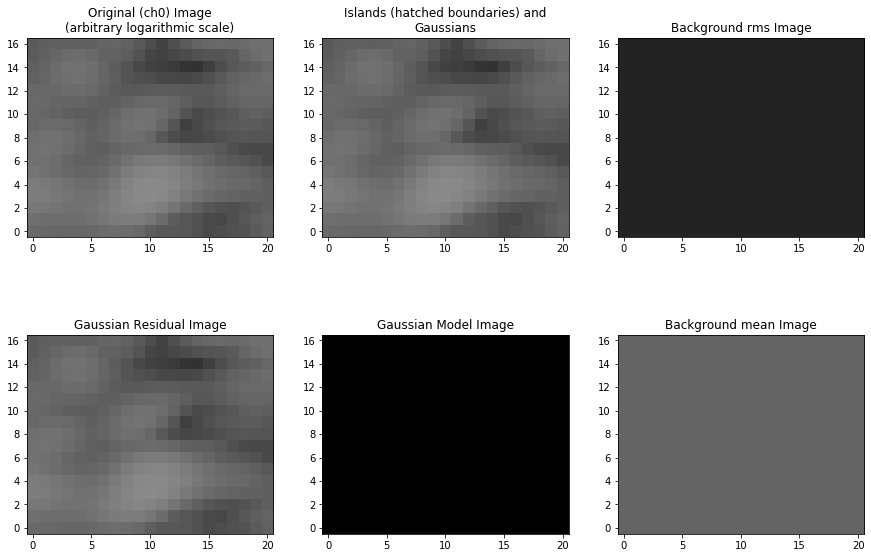

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_37.fits'
Image size .............................. : (13, 10) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.003 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.00146 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 0
--> Gro

37
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


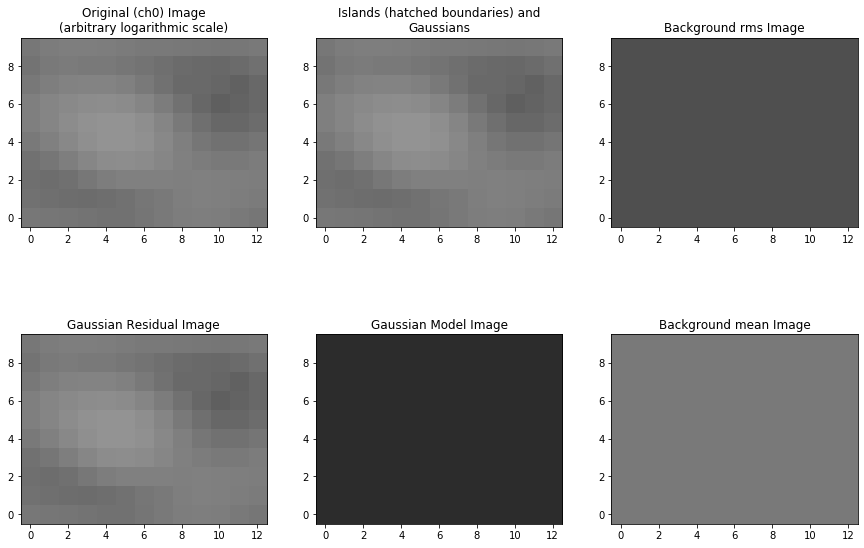

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_38.fits'
Image size .............................. : (25, 19) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.017 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.00229 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 0
--> Gro

38
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


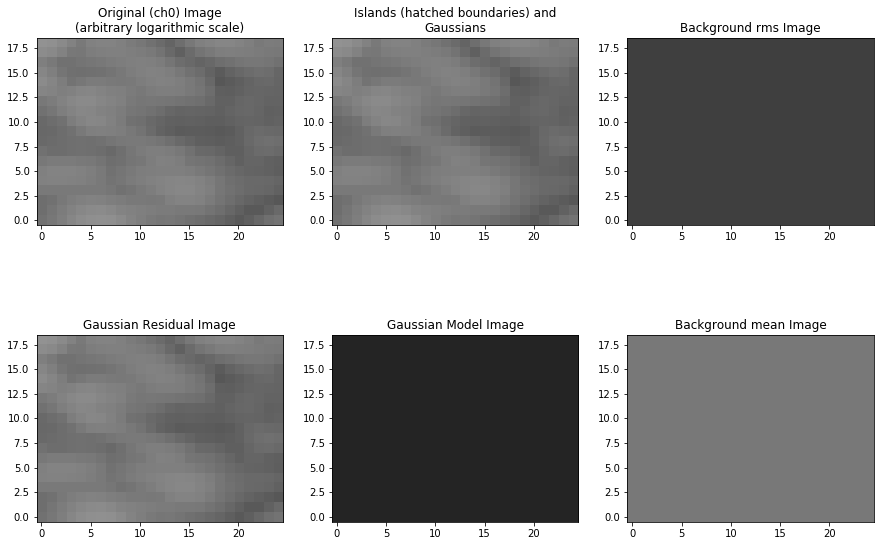

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_39.fits'
Image size .............................. : (30, 20) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.026 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.00216 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 1


Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 0
Total flux density in model ............. : 0.000 Jy
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 0
    Island #0 (x=16, y=10)
Please check this island. If it is a valid island and
should be fit, try adjusting the flagging options (use
show_fit with "ch0_flagged=True" to see the flagged Gaussians)
or enabling the wavelet module (with "atrous_do=True").
To include empty islands in output source catalogs, set
incl_empty=True in the write_catalog task.


39
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


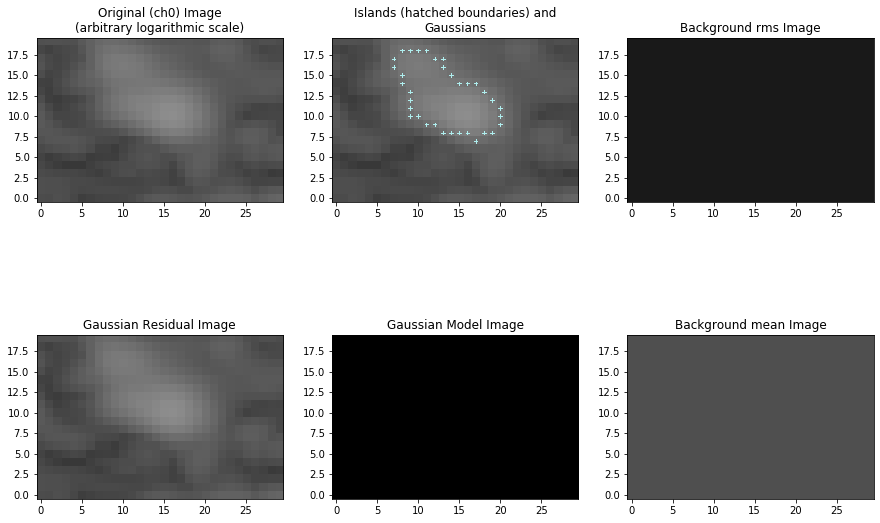

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_40.fits'
Image size .............................. : (27, 26) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.024 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 3) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.00216 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 0
--> Gro

40
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


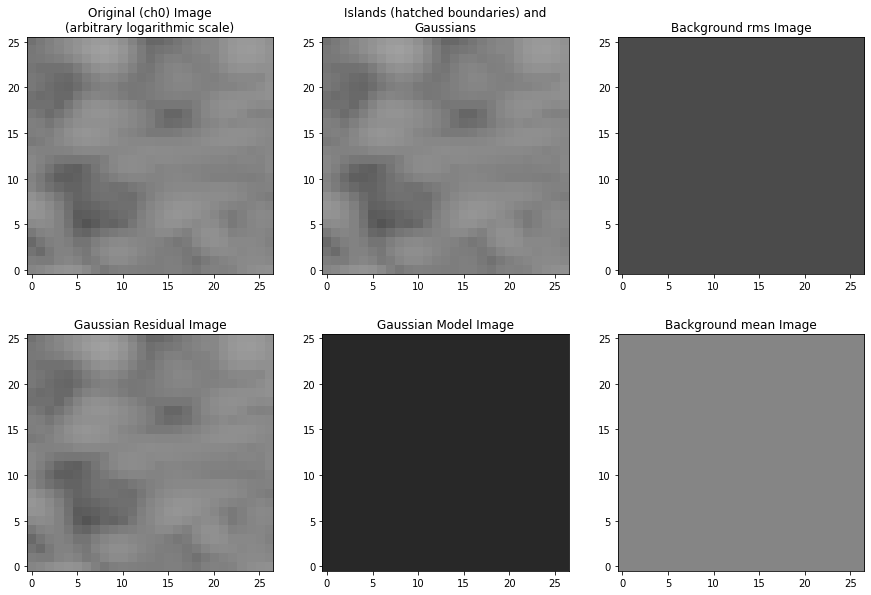

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_41.fits'
Image size .............................. : (21, 15) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.013 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.00248 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 0
--> Gro

41
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


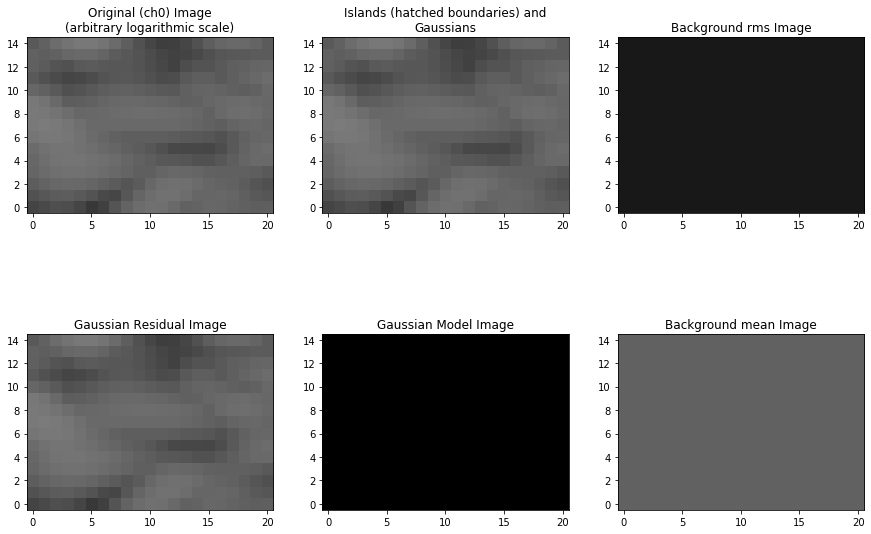

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_42.fits'
Image size .............................. : (32, 19) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.029 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.00226 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 1


Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 1
Total flux density in model ............. : 0.009 Jy
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 1


42
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


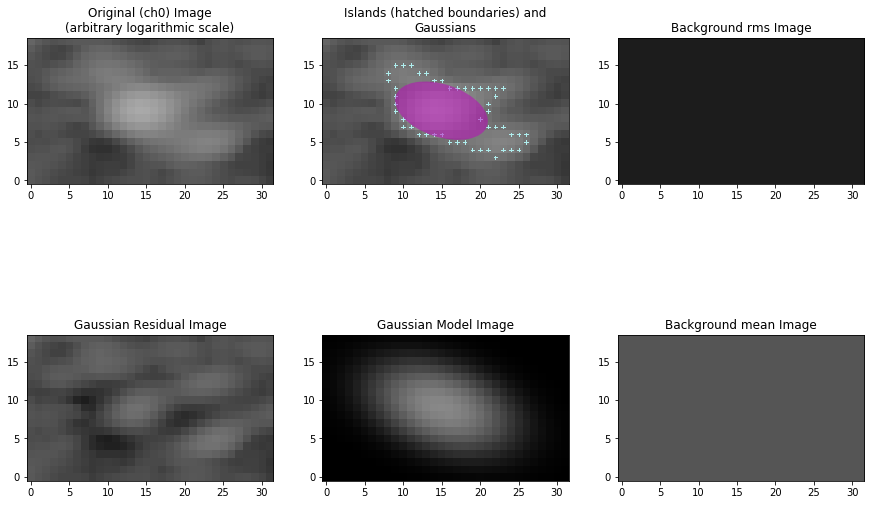

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_43.fits'
Image size .............................. : (28, 20) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.027 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.00224 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 1


Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 1
Total flux density in model ............. : 0.006 Jy
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 1


43
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


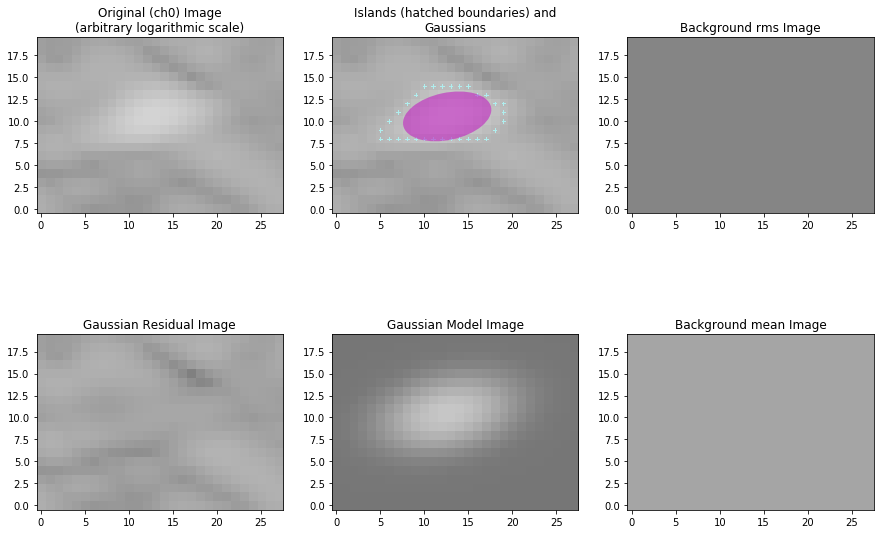

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_44.fits'
Image size .............................. : (40, 24) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.041 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.00199 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 1


Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 1
Total flux density in model ............. : 0.011 Jy


--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 1


44
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


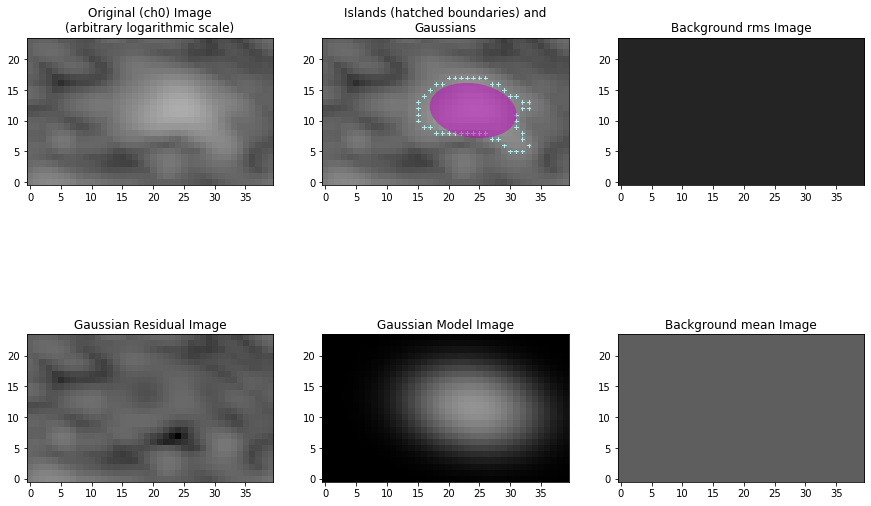

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_45.fits'
Image size .............................. : (21, 15) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.010 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.00184 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 0
--> Gro

45
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


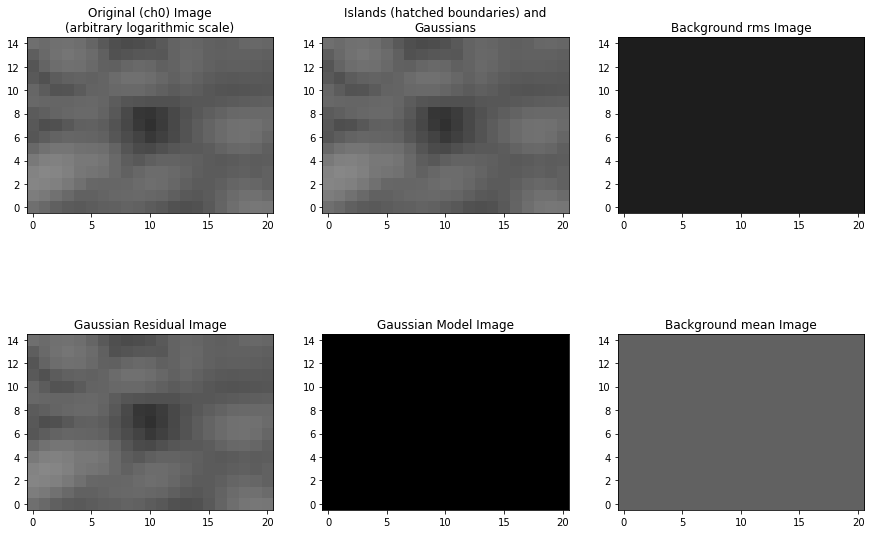

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_46.fits'
Image size .............................. : (42, 21) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.031 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.00191 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 1


Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 0
Total flux density in model ............. : 0.000 Jy
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 0
    Island #0 (x=16, y=10)
Please check this island. If it is a valid island and
should be fit, try adjusting the flagging options (use
show_fit with "ch0_flagged=True" to see the flagged Gaussians)
or enabling the wavelet module (with "atrous_do=True").
To include empty islands in output source catalogs, set
incl_empty=True in the write_catalog task.


46
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


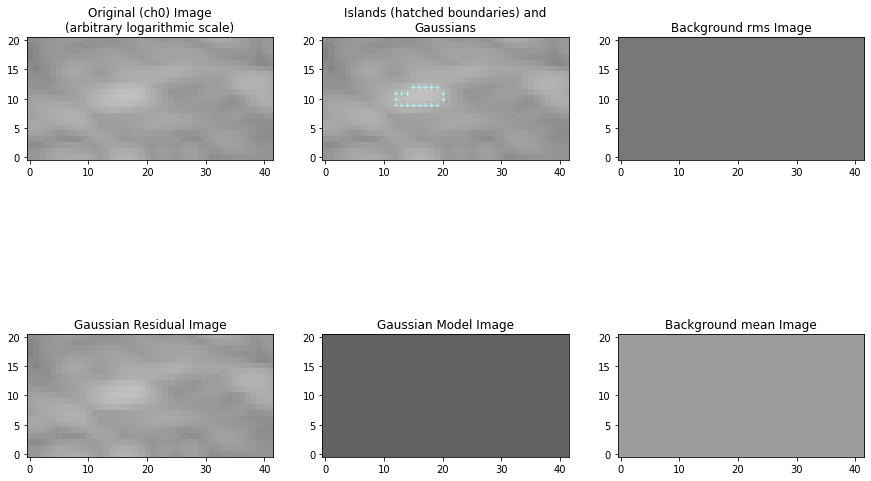

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_47.fits'
Image size .............................. : (25, 20) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.023 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.00292 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 0
--> Gro

47
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


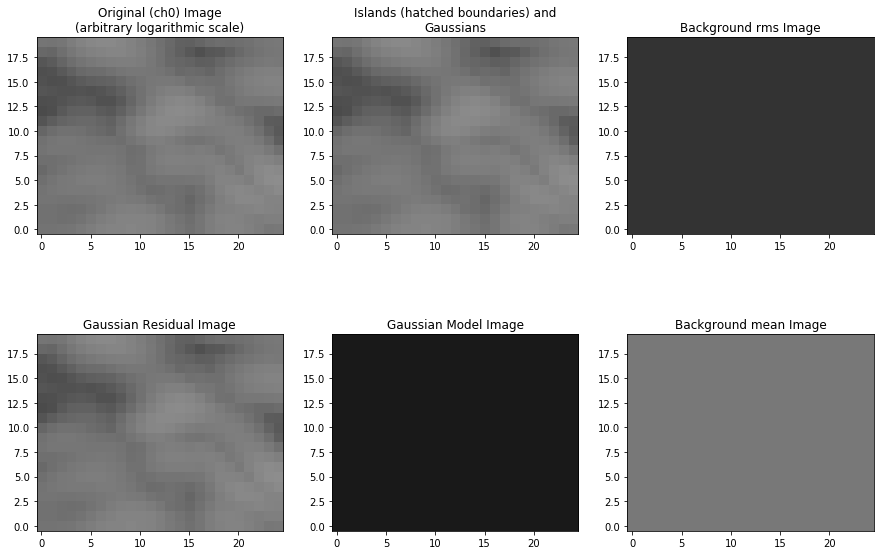

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_48.fits'
Image size .............................. : (41, 26) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.043 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 3) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.0022 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 1


Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 1
Total flux density in model ............. : 0.004 Jy
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 1


48
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


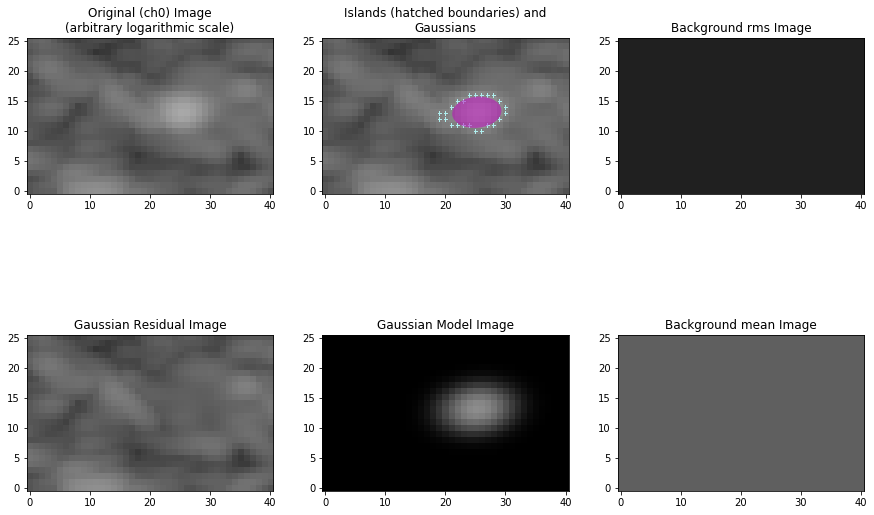

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_49.fits'
Image size .............................. : (18, 13) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.011 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.00286 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 0
--> Gro

49
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


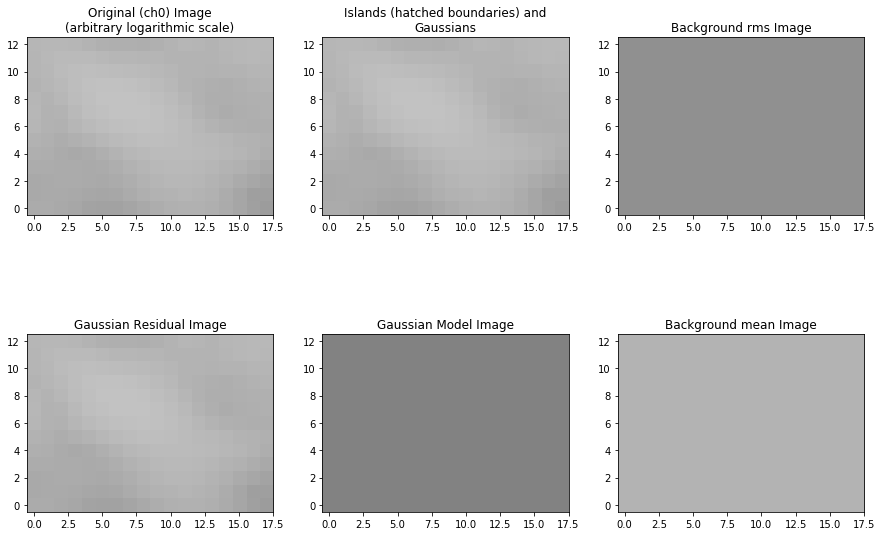

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_50.fits'
Image size .............................. : (25, 18) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.016 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.00212 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 0
--> Gro

50
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


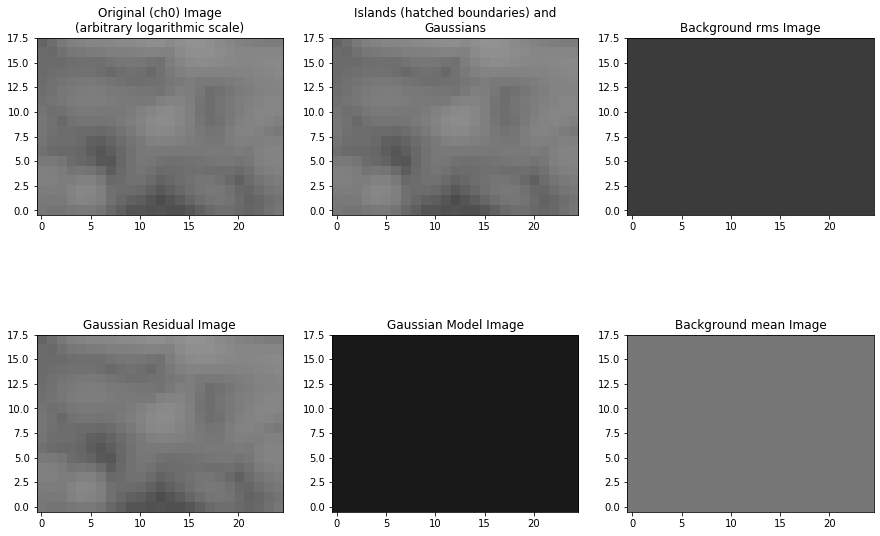

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_51.fits'
Image size .............................. : (11, 8) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.004 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.00239 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 0
--> Grou

51
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


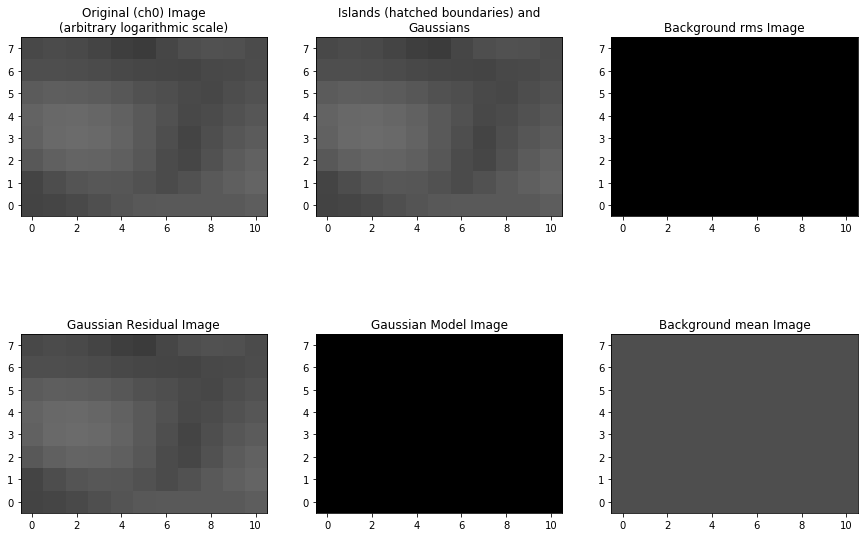

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_52.fits'
Image size .............................. : (24, 15) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.013 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.00219 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 0
--> Gro

52
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


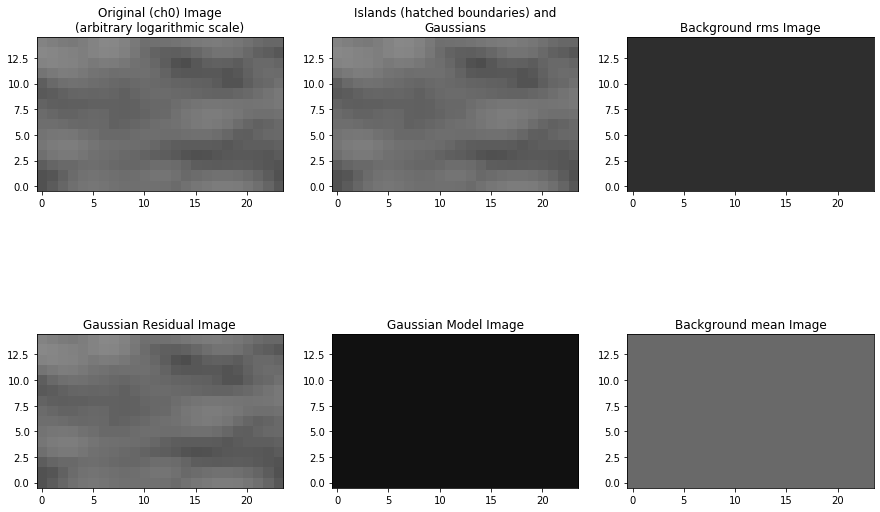

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_53.fits'
Image size .............................. : (20, 12) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.008 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.00206 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 0
--> Gro

53
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


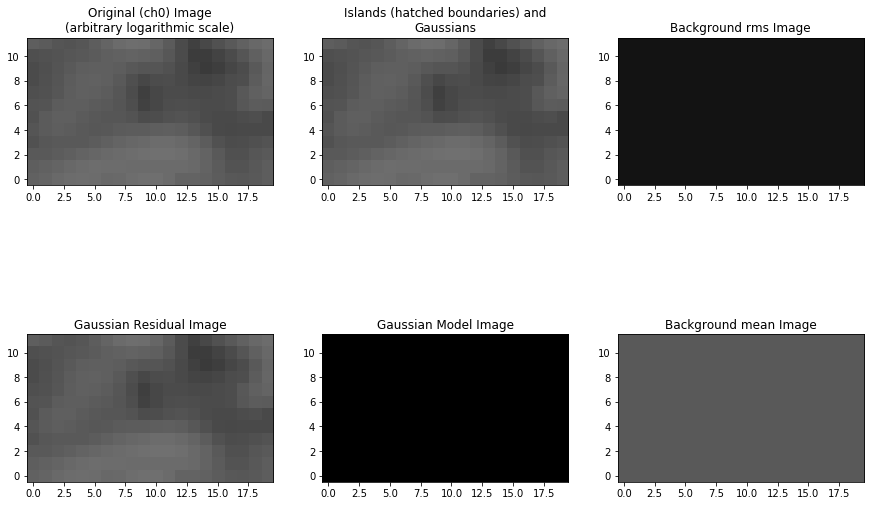

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_54.fits'
Image size .............................. : (23, 18) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.015 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.00183 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 0
--> Gro

54
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


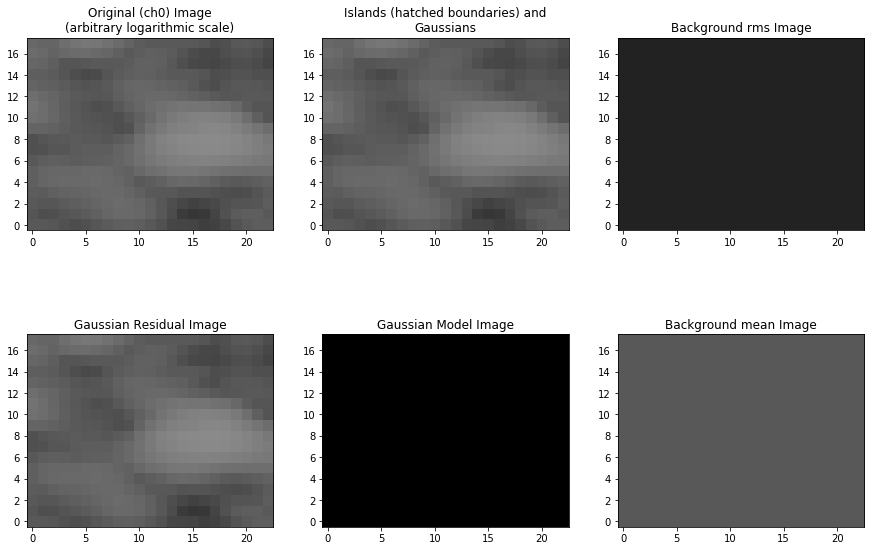

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_55.fits'
Image size .............................. : (28, 22) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.022 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.0019 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 0
--> Grou

55
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


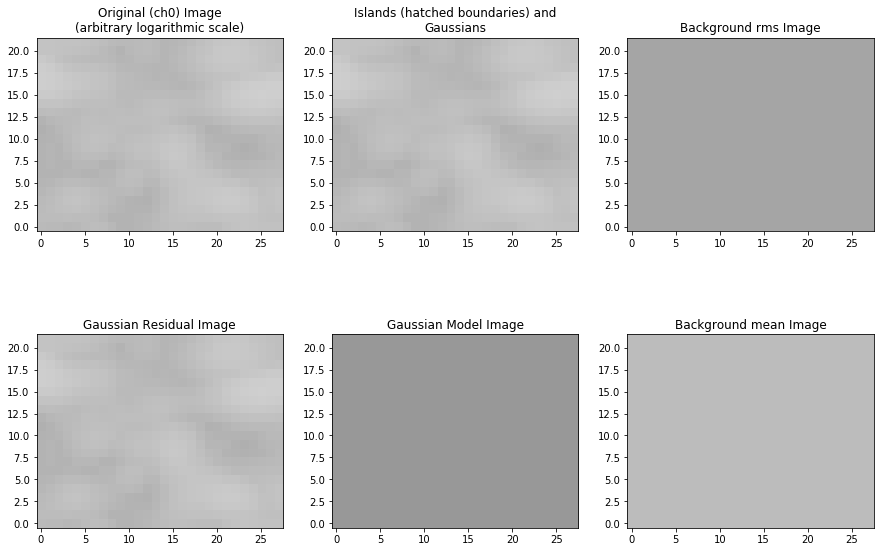

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_56.fits'
Image size .............................. : (11, 8) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.003 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.00223 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 0
--> Grou

56
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


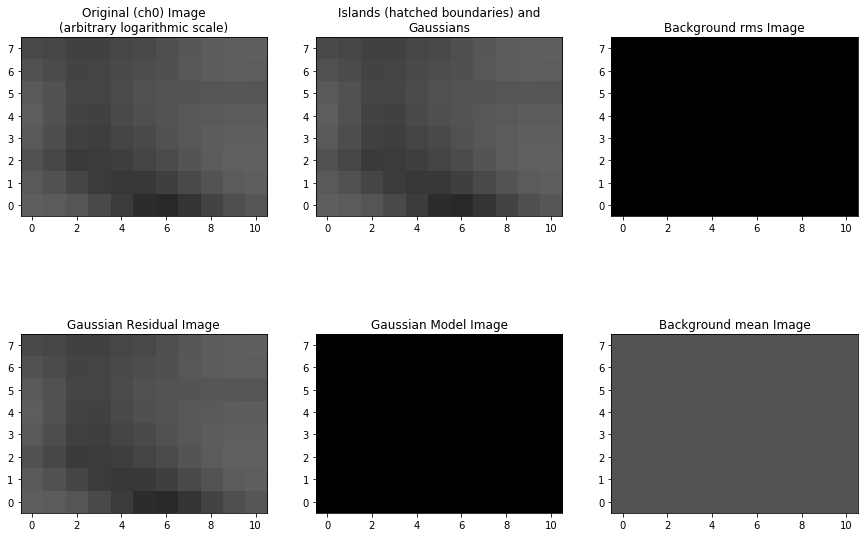

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_57.fits'
Image size .............................. : (41, 20) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.032 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.0023 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 0
--> Grou

57
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


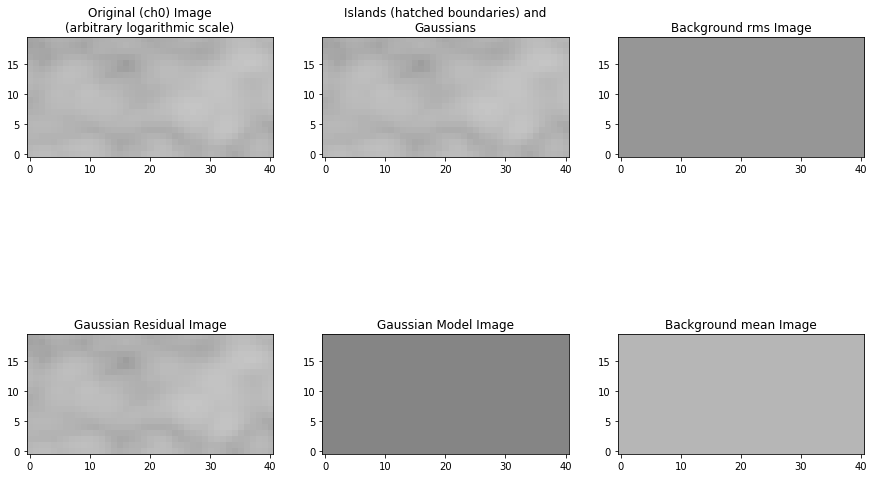

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_58.fits'
Image size .............................. : (29, 22) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.028 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.00251 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 0
--> Gro

58
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


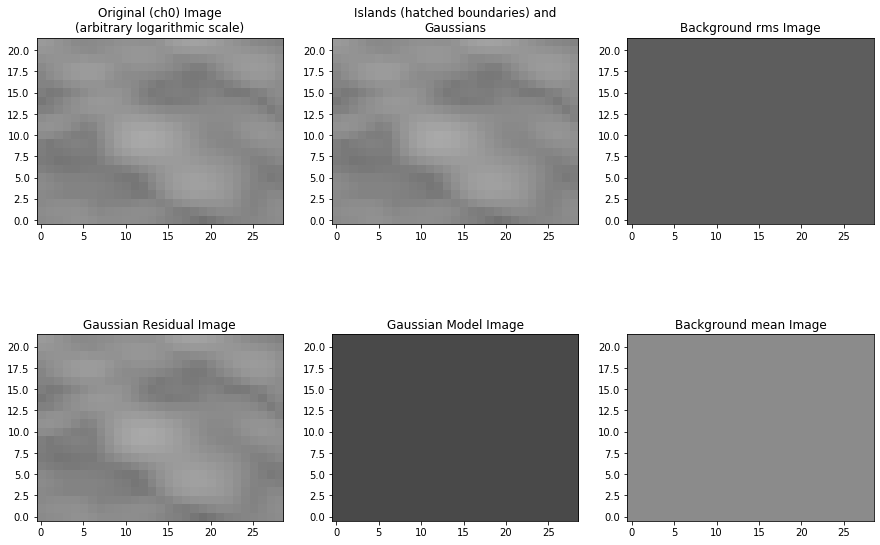

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_59.fits'
Image size .............................. : (42, 20) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.034 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.00232 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 0
--> Gro

59
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


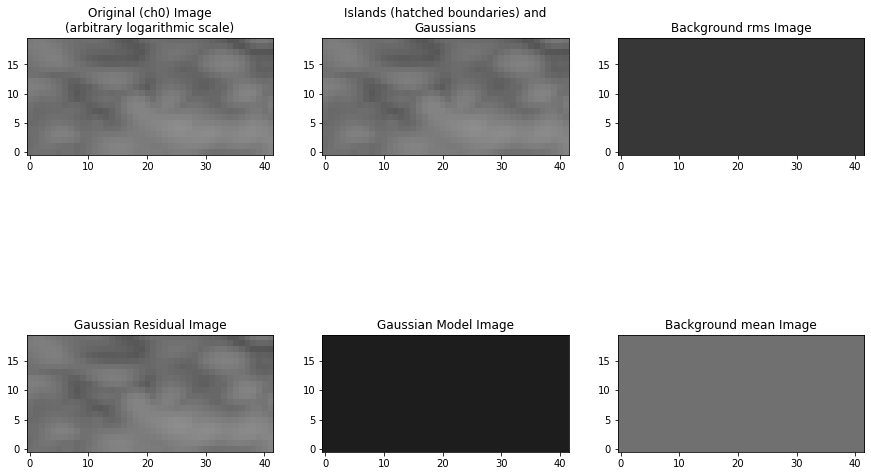

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_60.fits'
Image size .............................. : (15, 11) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.006 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.00231 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 0
--> Gro

60
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


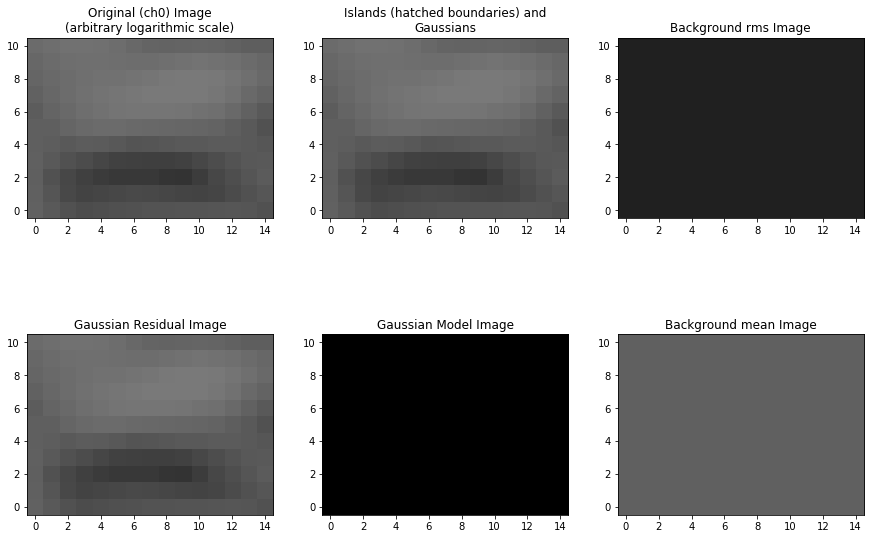

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_61.fits'
Image size .............................. : (20, 17) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.012 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.00202 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 0
--> Gro

61
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


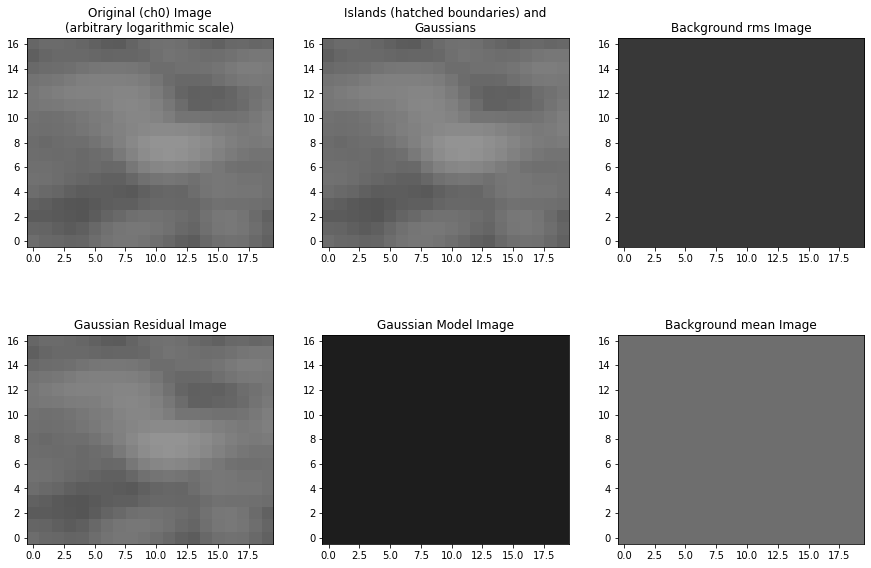

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_62.fits'
Image size .............................. : (30, 20) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.025 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.00213 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 1


Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 1
Total flux density in model ............. : 0.013 Jy
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 1


62
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


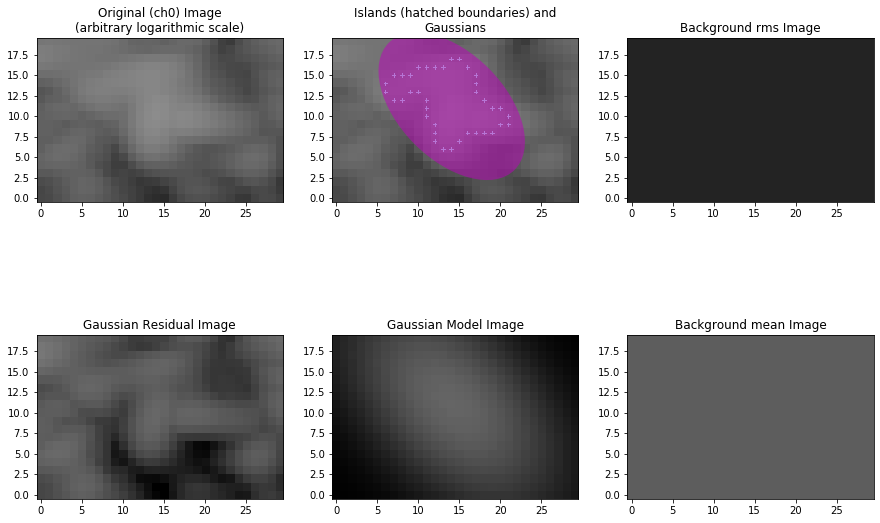

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_63.fits'
Image size .............................. : (14, 10) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.005 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.00248 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 0
--> Gro

63
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


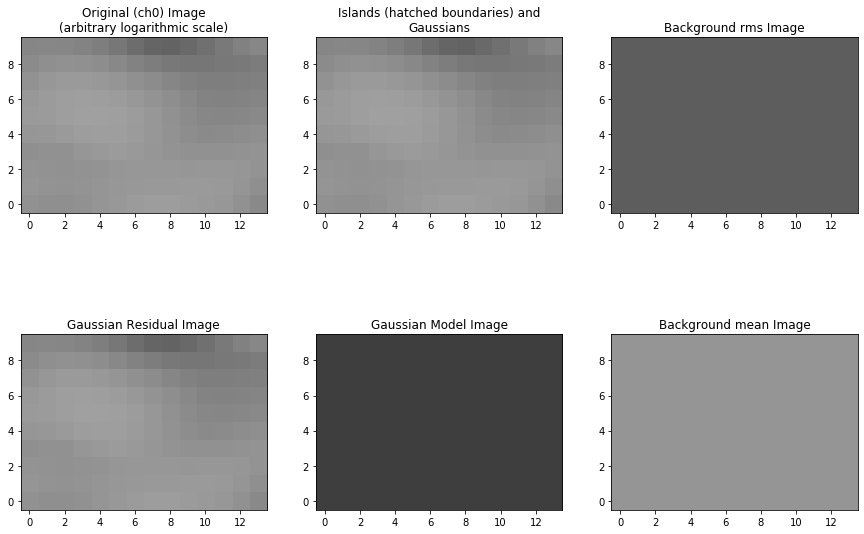

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_64.fits'
Image size .............................. : (20, 16) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.010 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.0019 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 0
--> Grou

64
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


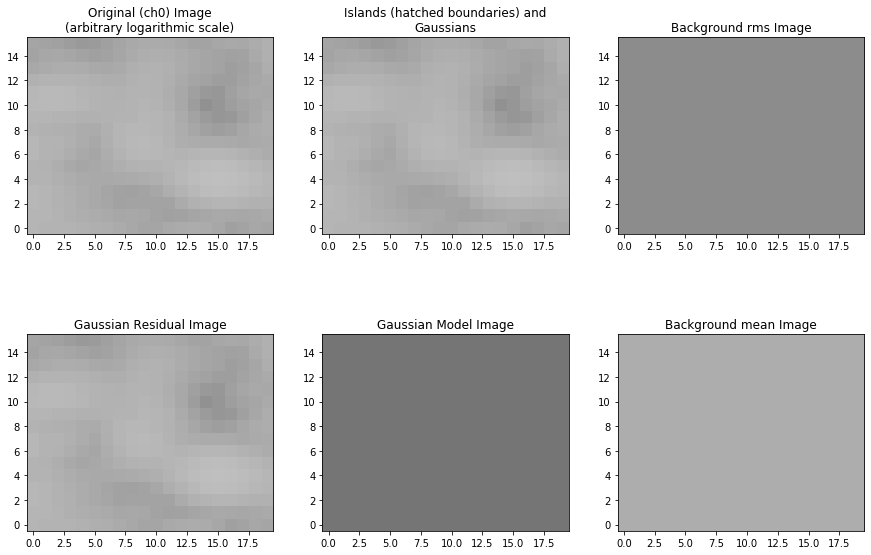

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_65.fits'
Image size .............................. : (46, 20) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.033 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.00202 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 0
--> Gro

65
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


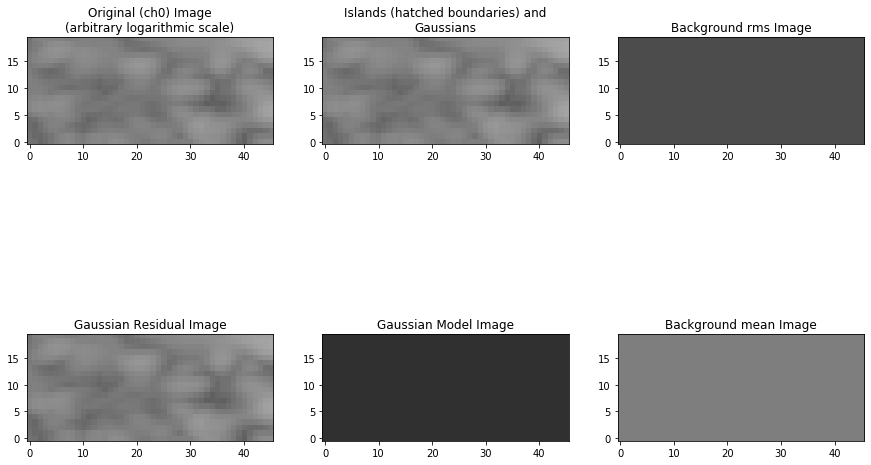

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_66.fits'
Image size .............................. : (36, 17) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.026 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.00243 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 0
--> Gro

66
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


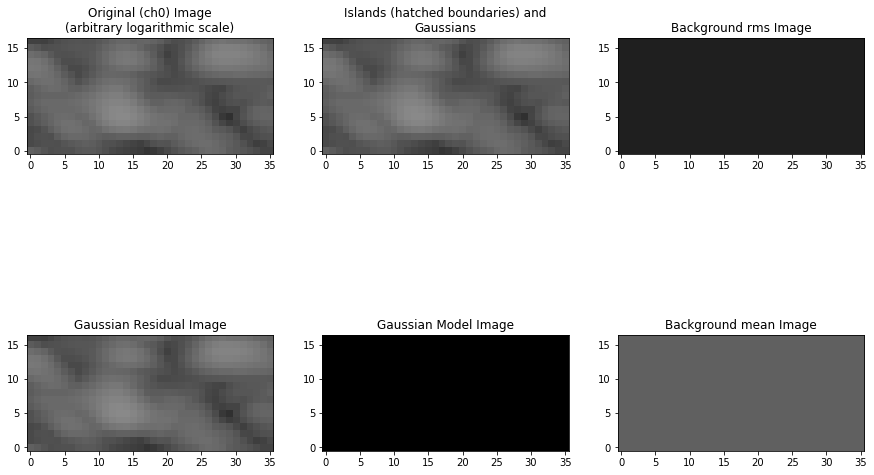

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_67.fits'
Image size .............................. : (22, 17) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.013 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.00221 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 0
--> Gro

67
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


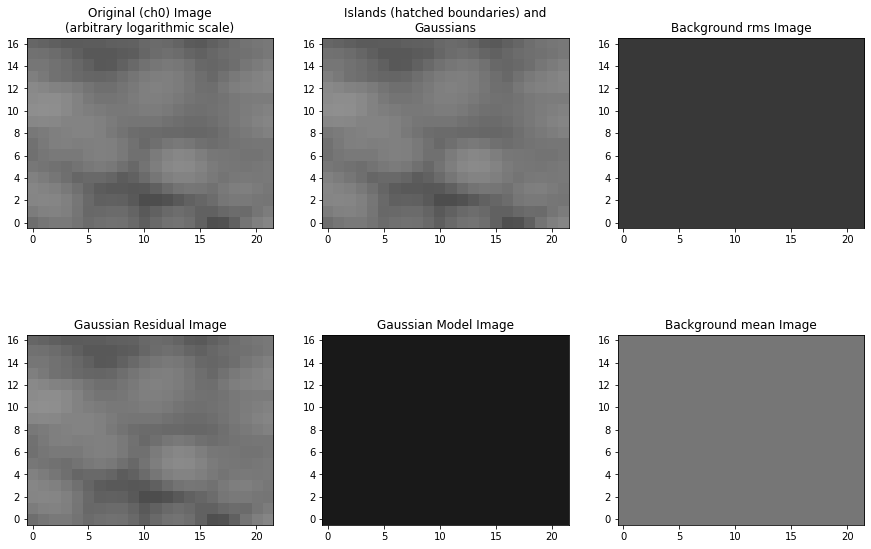

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_68.fits'
Image size .............................. : (16, 11) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.006 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.00225 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 0
--> Gro

68
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


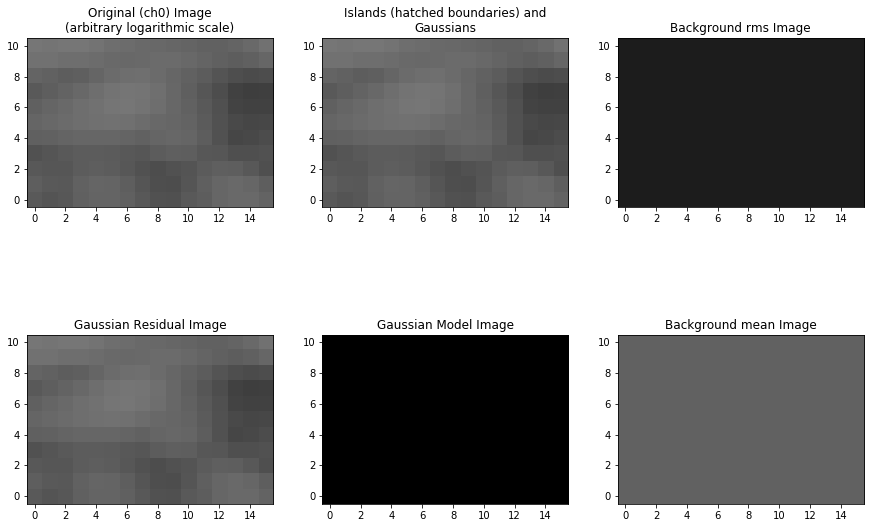

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_69.fits'
Image size .............................. : (24, 16) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.013 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.00188 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 0
--> Gro

69
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


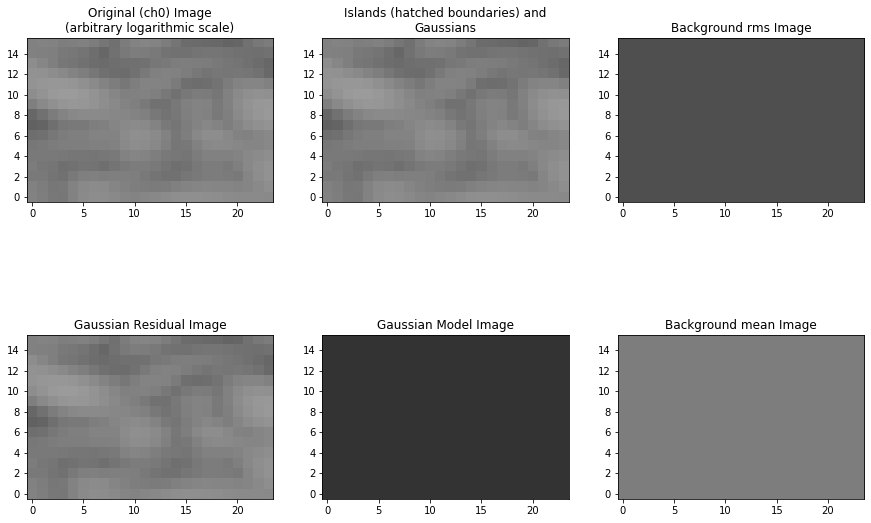

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_70.fits'
Image size .............................. : (29, 17) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.016 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.00185 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 0
--> Gro

70
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


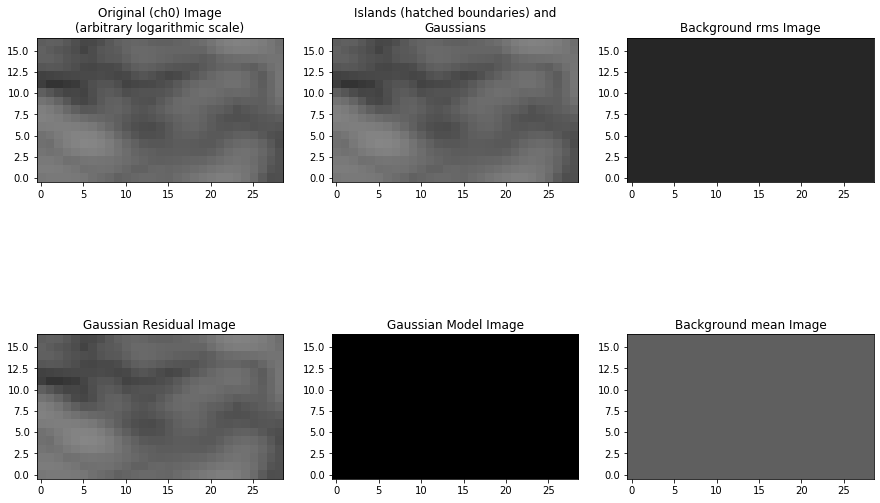

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_71.fits'
Image size .............................. : (21, 15) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.014 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.00255 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 0
--> Gro

71
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


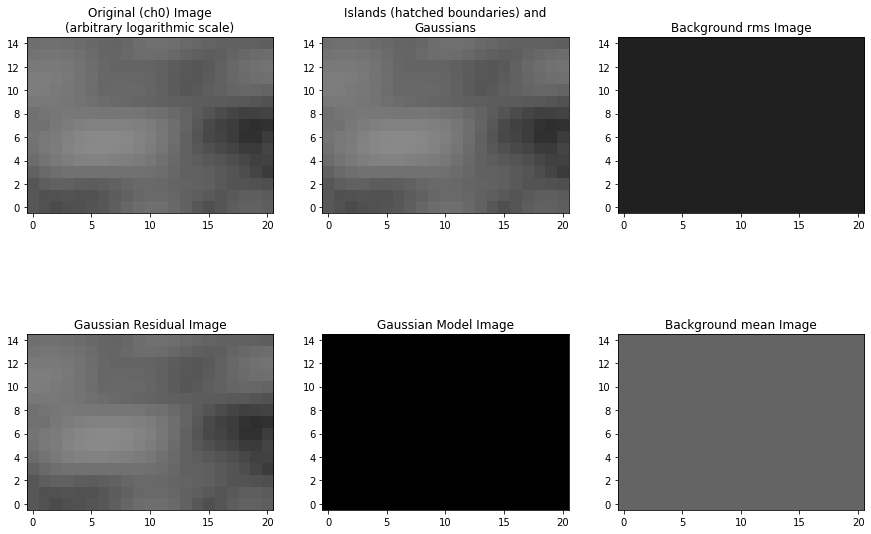

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_72.fits'
Image size .............................. : (44, 20) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.045 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.00234 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 1


Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 1
Total flux density in model ............. : 0.017 Jy


--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 1


72
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


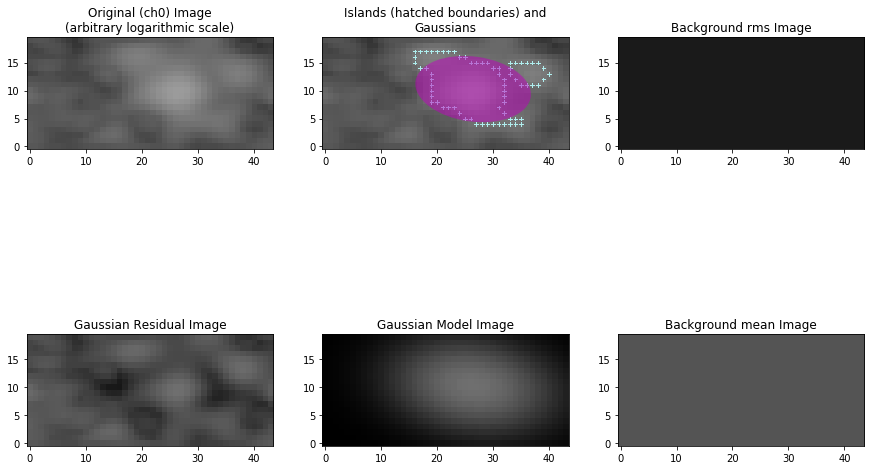

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_73.fits'
Image size .............................. : (18, 15) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.010 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.00232 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 0
--> Gro

73
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


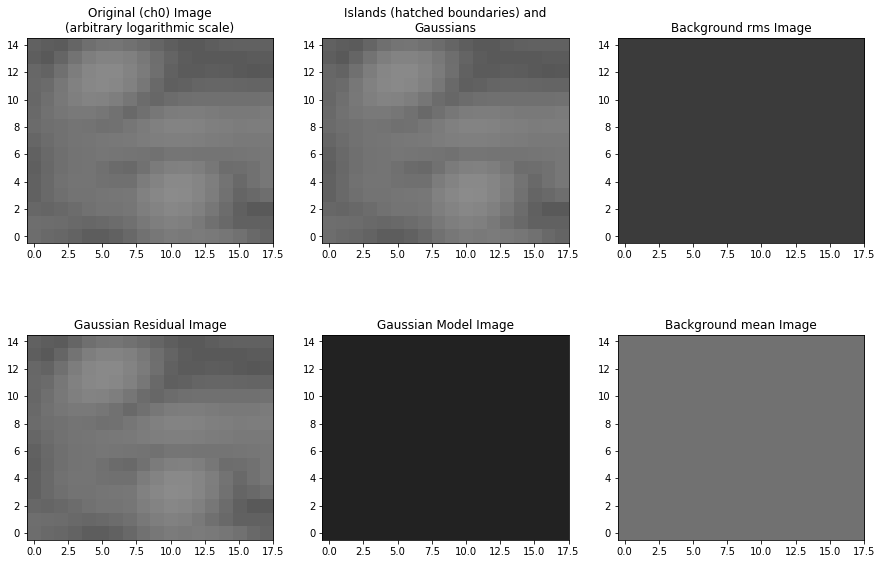

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_74.fits'
Image size .............................. : (25, 17) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.017 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.00226 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 0
--> Gro

74
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


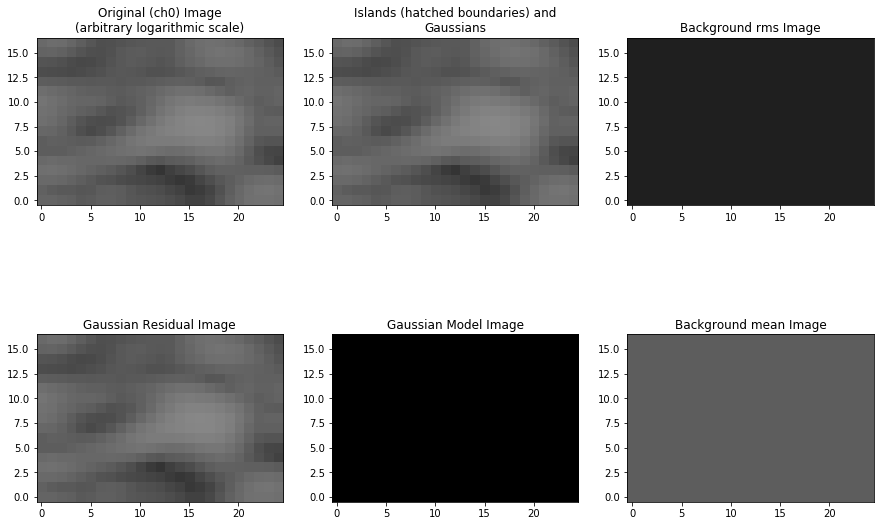

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_75.fits'
Image size .............................. : (24, 16) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.013 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.00193 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 0
--> Gro

75
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


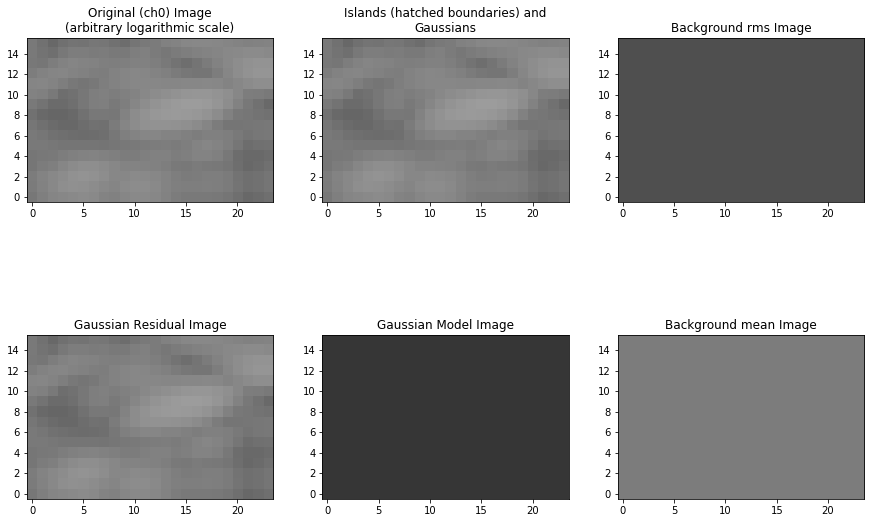

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_76.fits'
Image size .............................. : (16, 12) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.007 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.0023 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 0
--> Grou

76
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


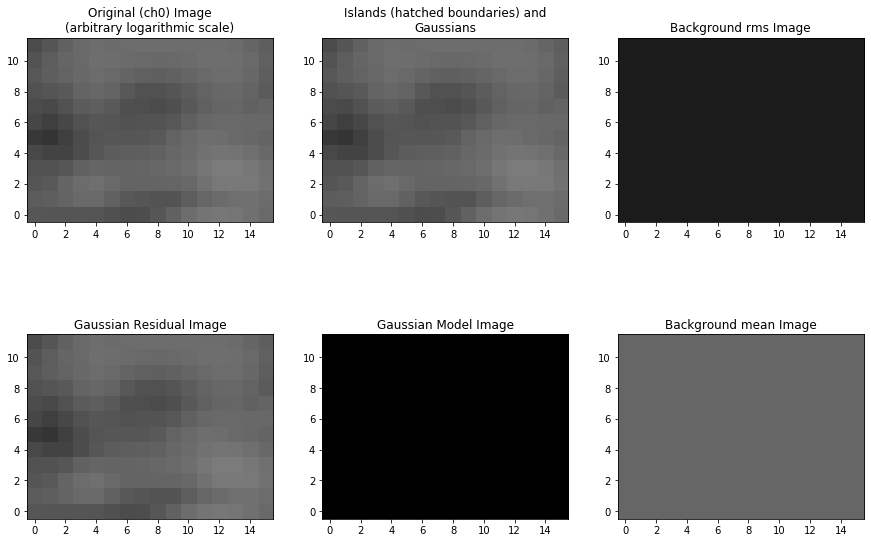

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_77.fits'
Image size .............................. : (19, 16) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.011 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.00213 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 0
--> Gro

77
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


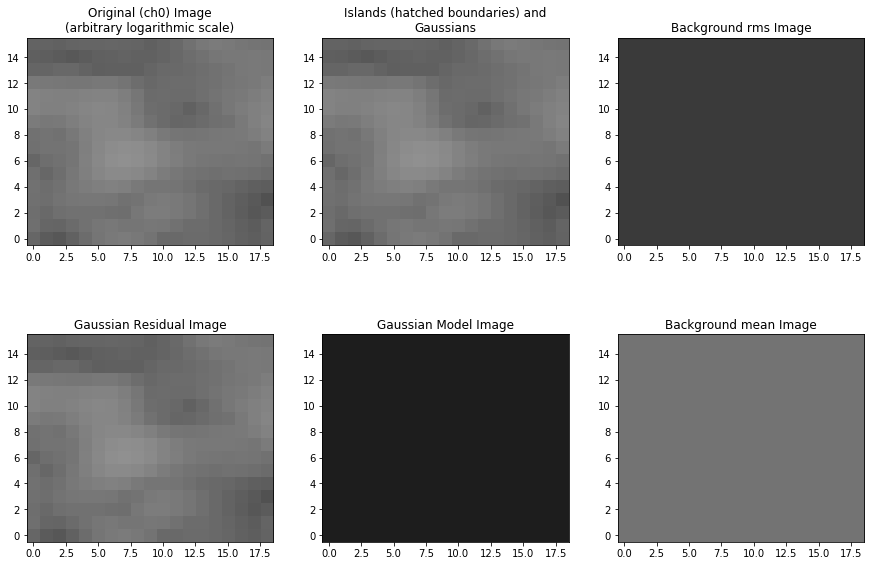

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_78.fits'
Image size .............................. : (37, 23) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.038 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.00227 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 1


Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 1
Total flux density in model ............. : 0.010 Jy
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 1


78
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


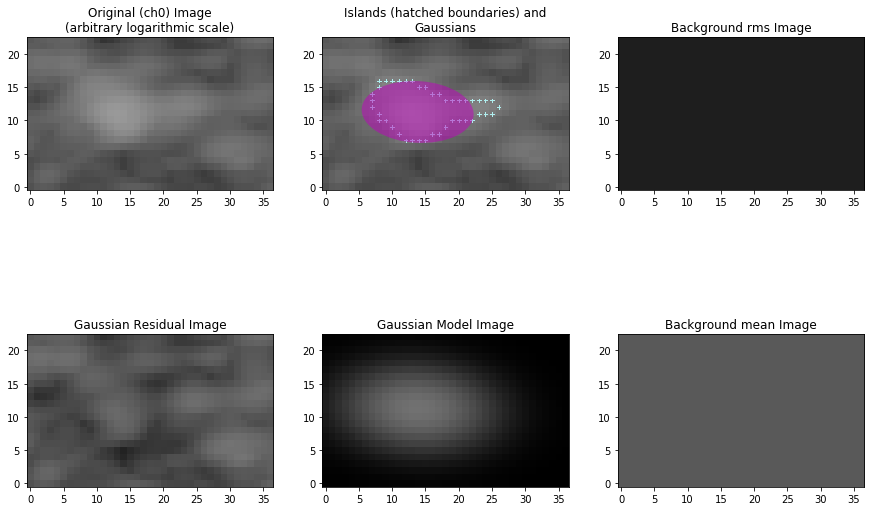

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_79.fits'
Image size .............................. : (27, 18) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.019 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.00238 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 0
--> Gro

79
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


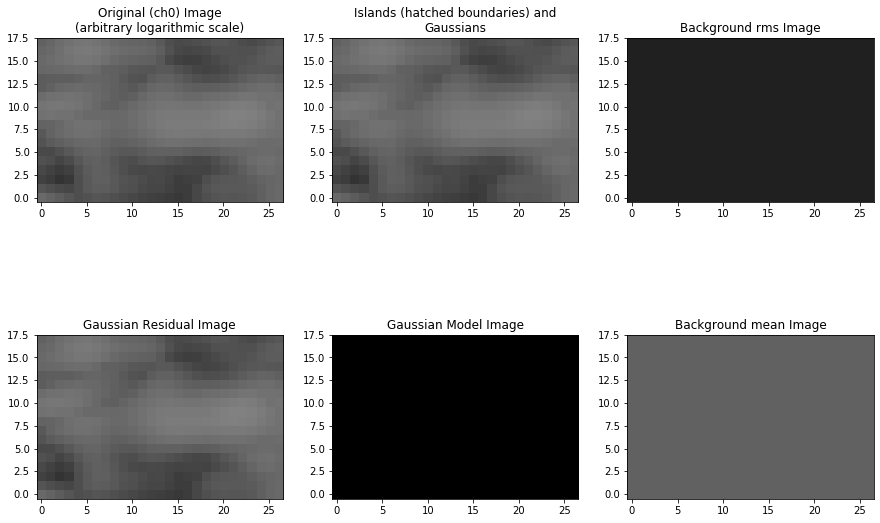

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_80.fits'
Image size .............................. : (41, 23) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.033 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.00204 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 0
--> Gro

80
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


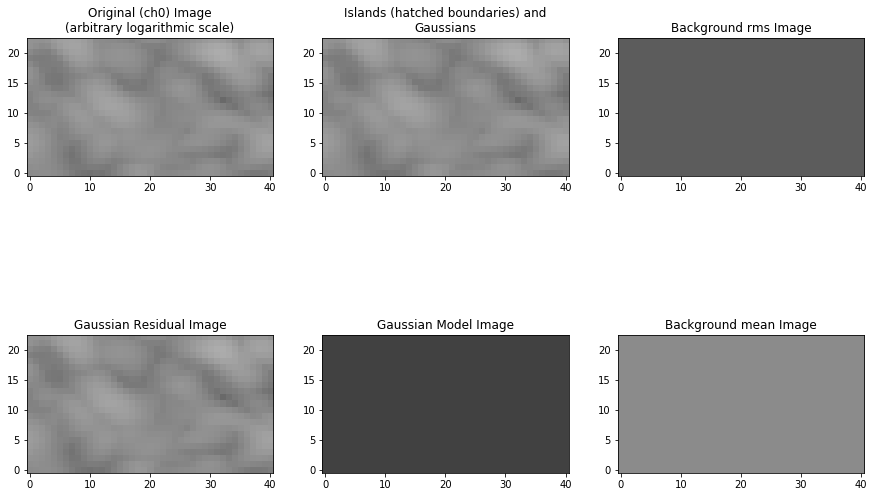

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_81.fits'
Image size .............................. : (30, 19) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.026 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.00228 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 1


Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 1
Total flux density in model ............. : 0.005 Jy
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 1


81
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


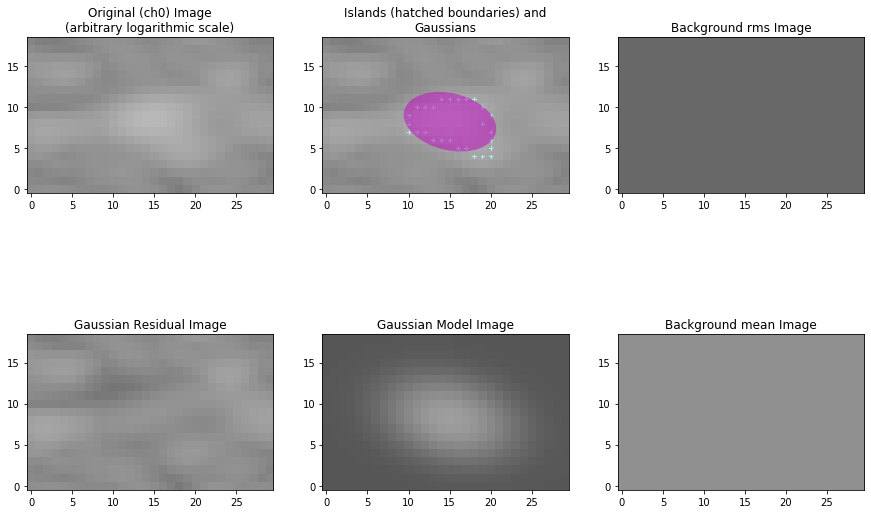

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_82.fits'
Image size .............................. : (38, 18) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.019 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.00167 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 0
--> Gro

82
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


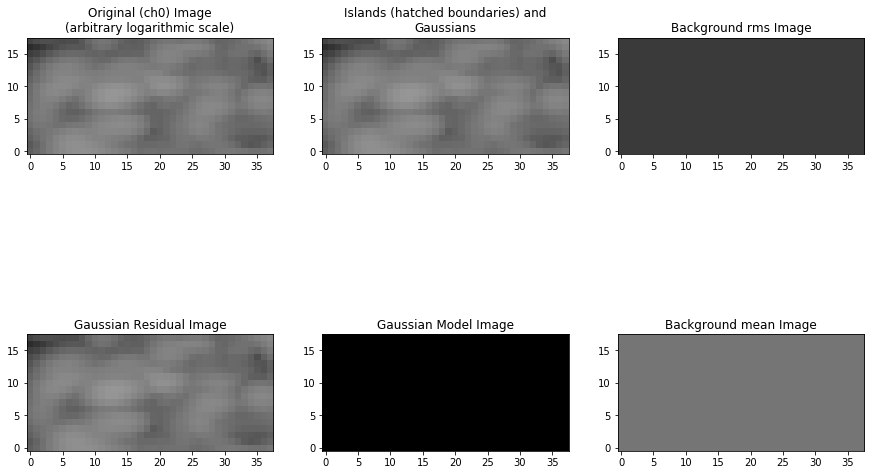

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_83.fits'
Image size .............................. : (64, 25) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.206 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (105, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.00234 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 2


Fitting islands with Gaussians .......... : [|-] 0/2/Fitting islands with Gaussians .......... : [=/] 1/2Fitting islands with Gaussians .......... : [==] 2/2Fitting islands with Gaussians .......... : [==] 2/2

Total number of Gaussians fit to image .. : 5
Total flux density in model ............. : 0.166 Jy
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 2


83
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


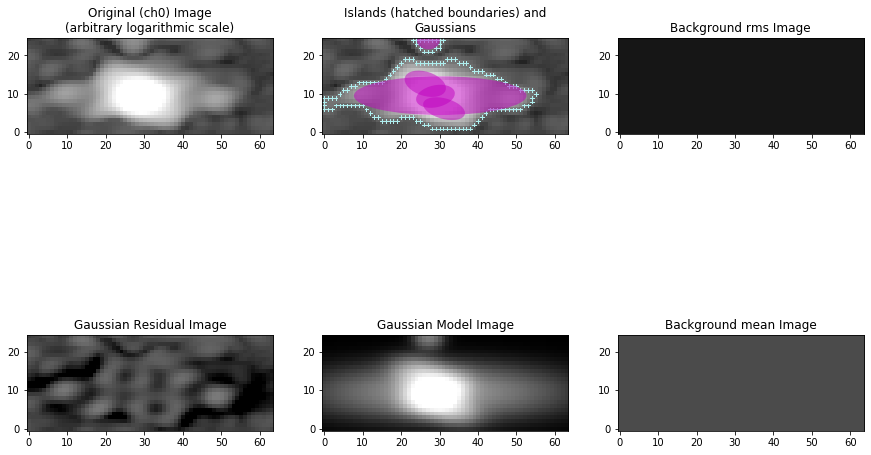

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_84.fits'
Image size .............................. : (18, 13) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.009 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.00249 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 0
--> Gro

84
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


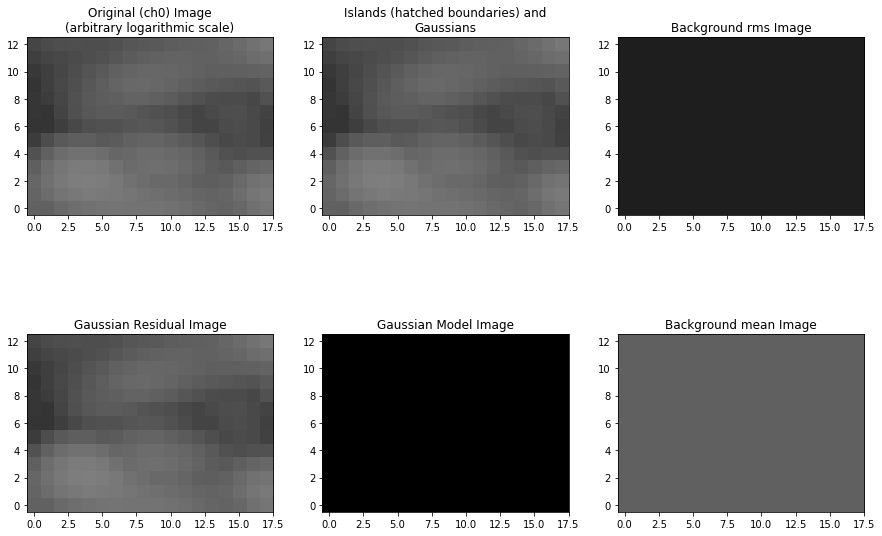

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_85.fits'
Image size .............................. : (22, 17) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.013 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.00212 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 0
--> Gro

85
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


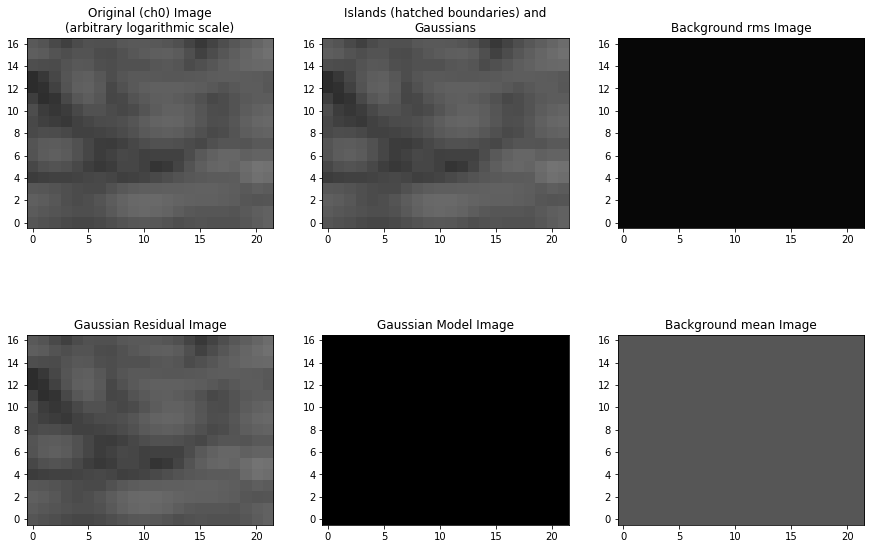

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_86.fits'
Image size .............................. : (28, 18) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.021 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.00214 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 1


Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 0
Total flux density in model ............. : 0.000 Jy
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 0
    Island #0 (x=20, y=5)
Please check this island. If it is a valid island and
should be fit, try adjusting the flagging options (use
show_fit with "ch0_flagged=True" to see the flagged Gaussians)
or enabling the wavelet module (with "atrous_do=True").
To include empty islands in output source catalogs, set
incl_empty=True in the write_catalog task.


86
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


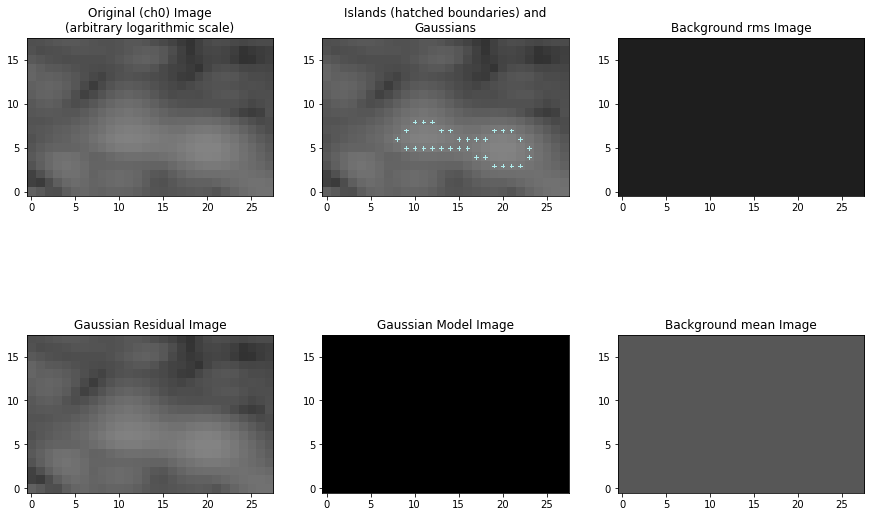

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_87.fits'
Image size .............................. : (20, 17) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.009 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.00164 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 0
--> Gro

87
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


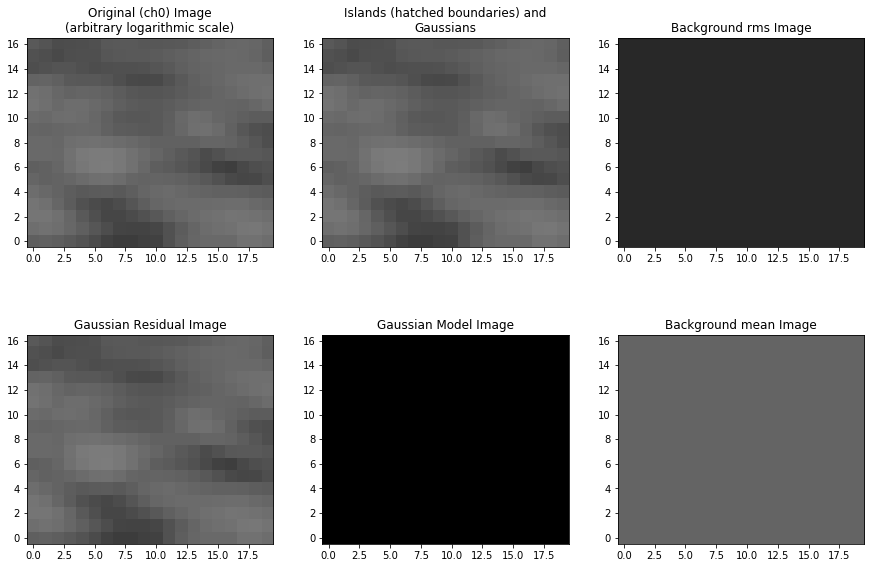

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_88.fits'
Image size .............................. : (40, 14) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.018 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.00193 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 0
--> Gro

88
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


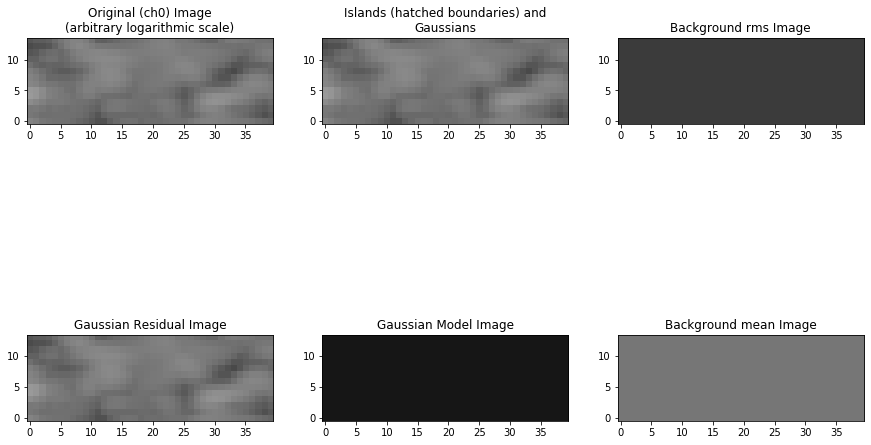

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_89.fits'
Image size .............................. : (52, 20) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.100 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (65, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.00253 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 1


Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 1
Total flux density in model ............. : 0.057 Jy


--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 1


89
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


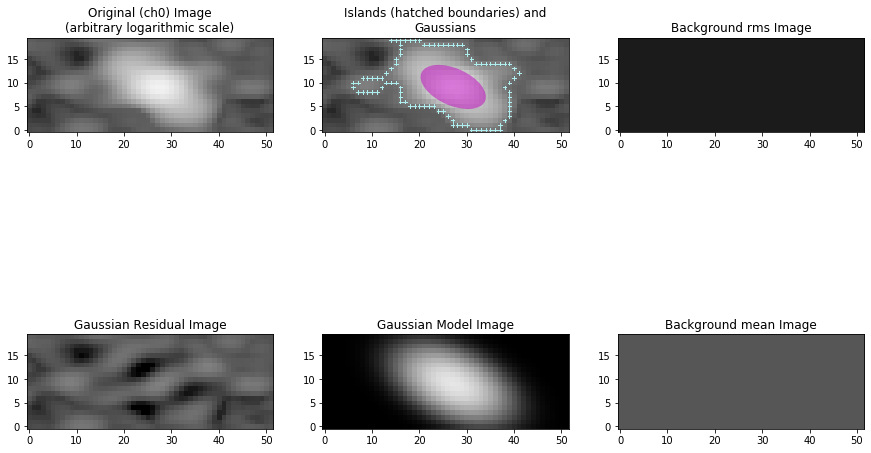

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_90.fits'
Image size .............................. : (23, 22) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.019 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.00214 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 0
--> Gro

90
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


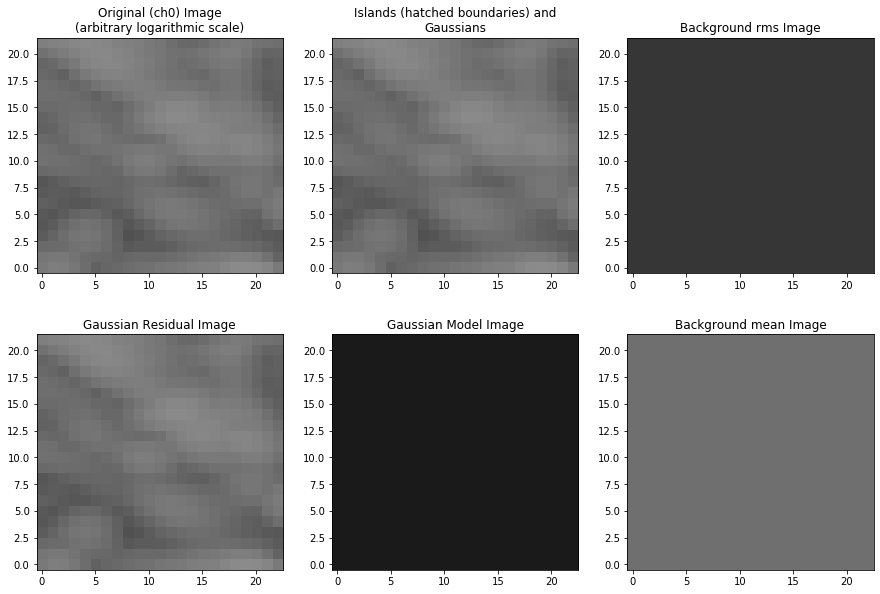

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_91.fits'
Image size .............................. : (17, 11) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.007 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.00224 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 0
--> Gro

91
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


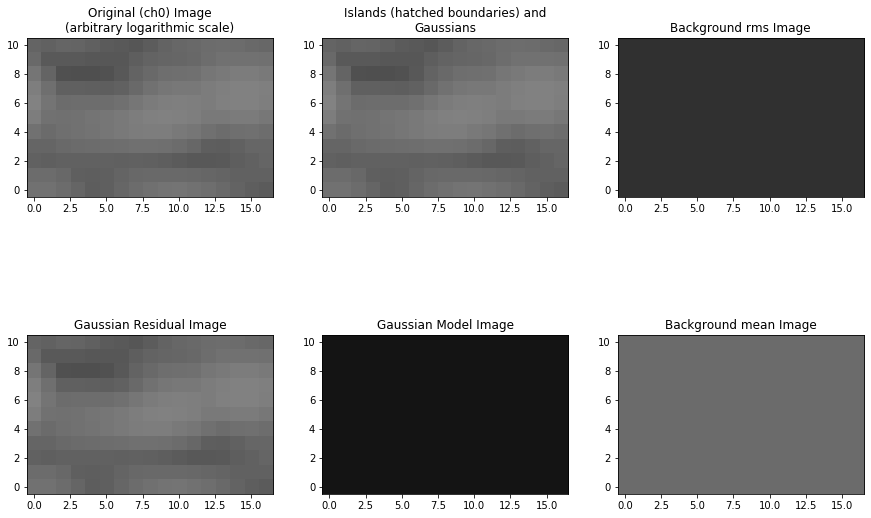

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_92.fits'
Image size .............................. : (20, 15) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.017 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.00335 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 0
--> Gro

92
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


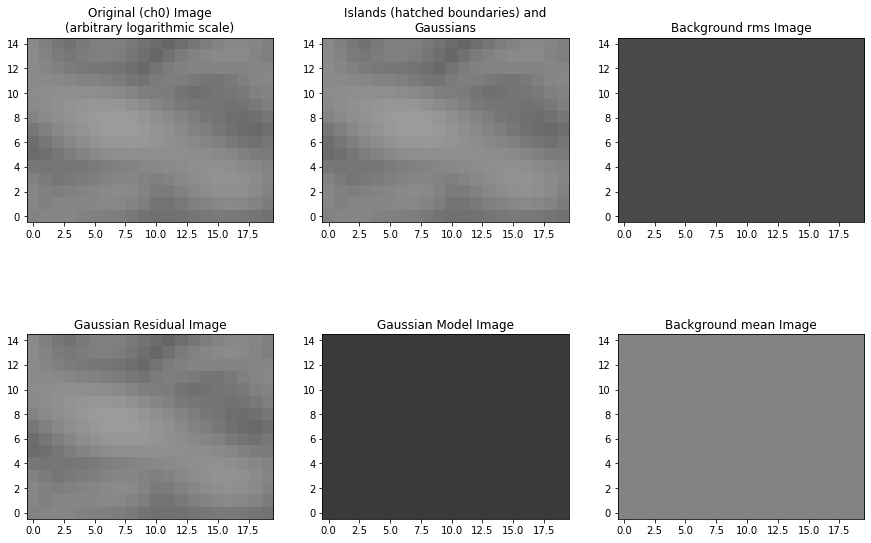

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_93.fits'
Image size .............................. : (11, 7) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.003 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.00242 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 0
--> Grou

93
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


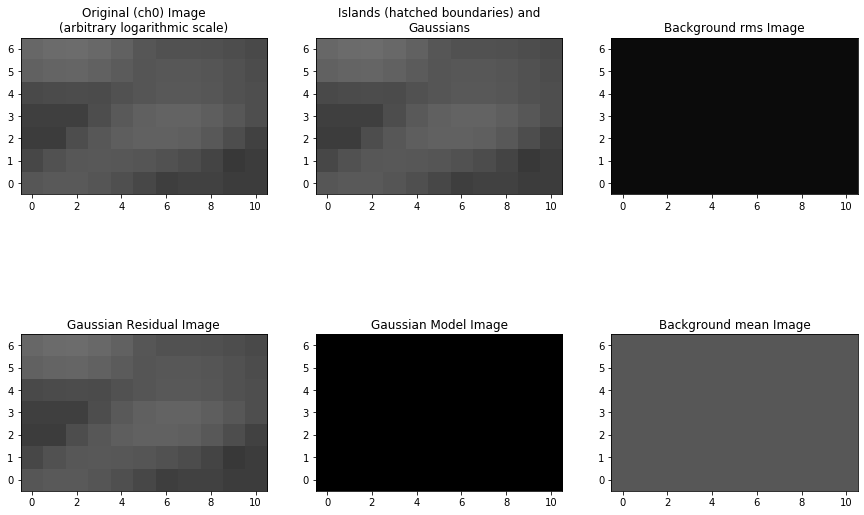

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_94.fits'
Image size .............................. : (40, 23) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.091 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (65, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.00244 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 1


Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 1
Total flux density in model ............. : 0.053 Jy


--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 1


94
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


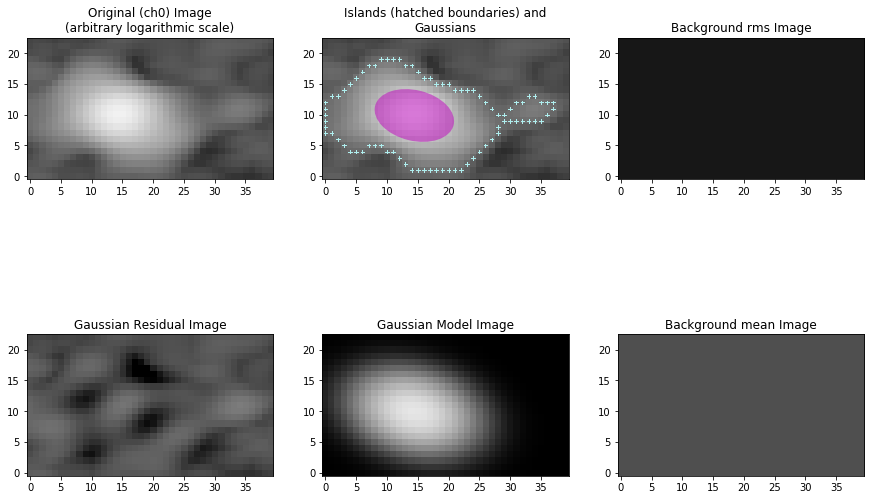

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_95.fits'
Image size .............................. : (36, 26) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.267 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (85, 3) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.0042 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 2


Fitting islands with Gaussians .......... : [|-] 0/2//Fitting islands with Gaussians .......... : [=/] 1/2Fitting islands with Gaussians .......... : [=/] 1/2Fitting islands with Gaussians .......... : [==] 2/2

Total number of Gaussians fit to image .. : 2
Total flux density in model ............. : 0.210 Jy
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 1
    Island #1 (x=33, y=22)
Please check this island. If it is a valid island and
should be fit, try adjusting the flagging options (use
show_fit with "ch0_flagged=True" to see the flagged Gaussians)
or enabling the wavelet module (with "atrous_do=True").
To include empty islands in output source catalogs, set
incl_empty=True in the write_catalog task.


95
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


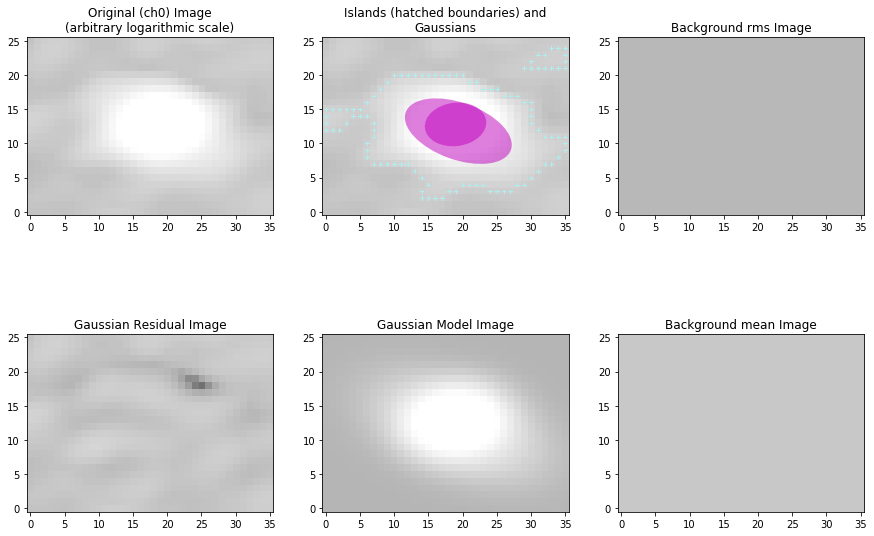

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_96.fits'
Image size .............................. : (12, 6) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.004 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.0033 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 0
--> Group

96
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


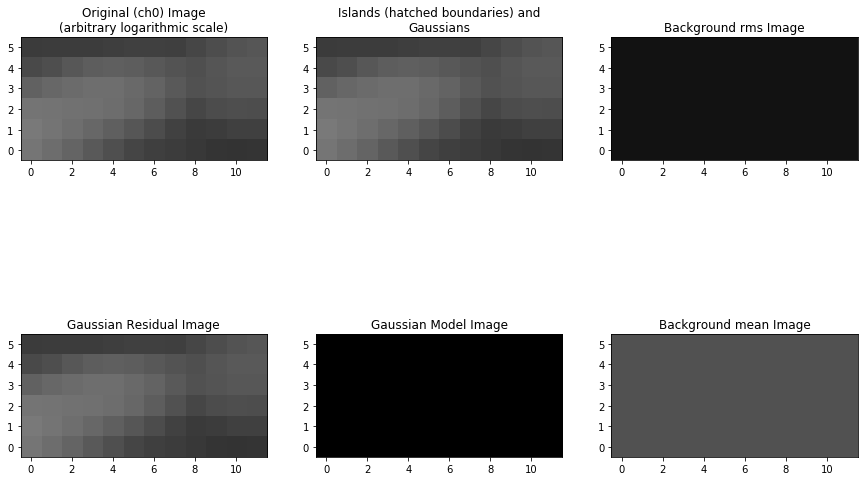

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_97.fits'
Image size .............................. : (22, 37) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.029 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.00212 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 0
--> Gro

97
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


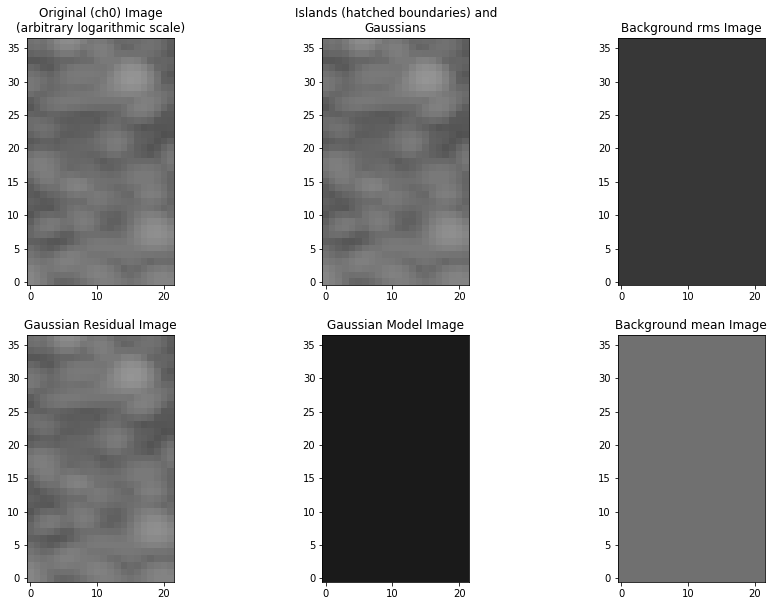

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_98.fits'
Image size .............................. : (20, 15) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.011 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.00211 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 0
--> Gro

98
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


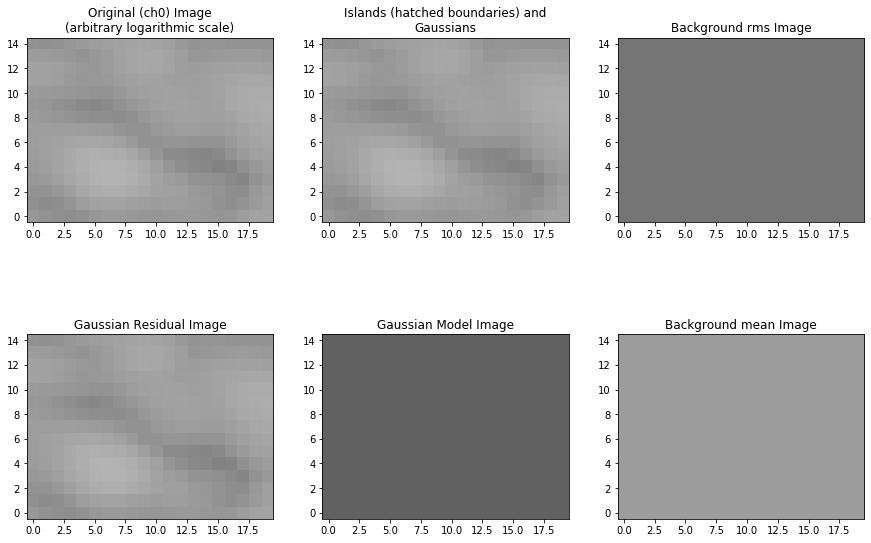

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_99.fits'
Image size .............................. : (26, 21) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.029 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.00279 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 1


Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 1
Total flux density in model ............. : 0.005 Jy
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 1


99
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


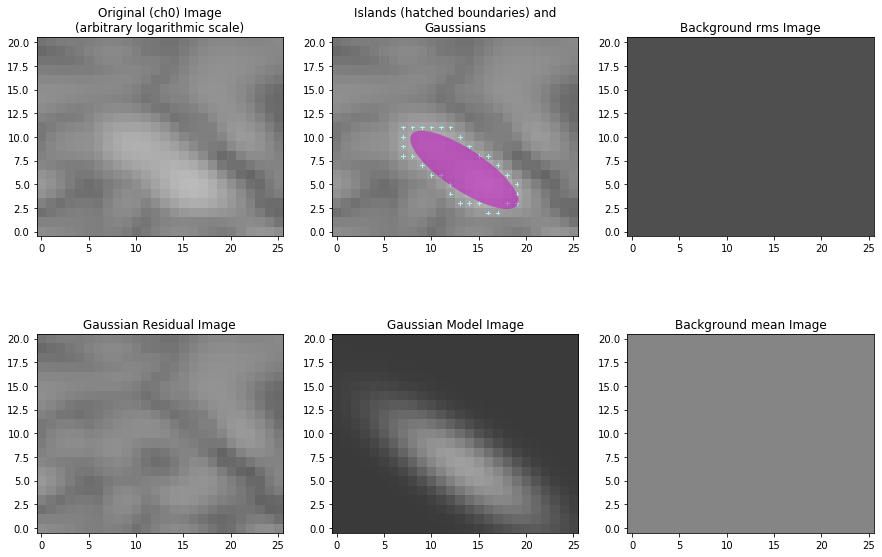

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_100.fits'
Image size .............................. : (17, 12) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.006 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.00193 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 0
--> Gr

100
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


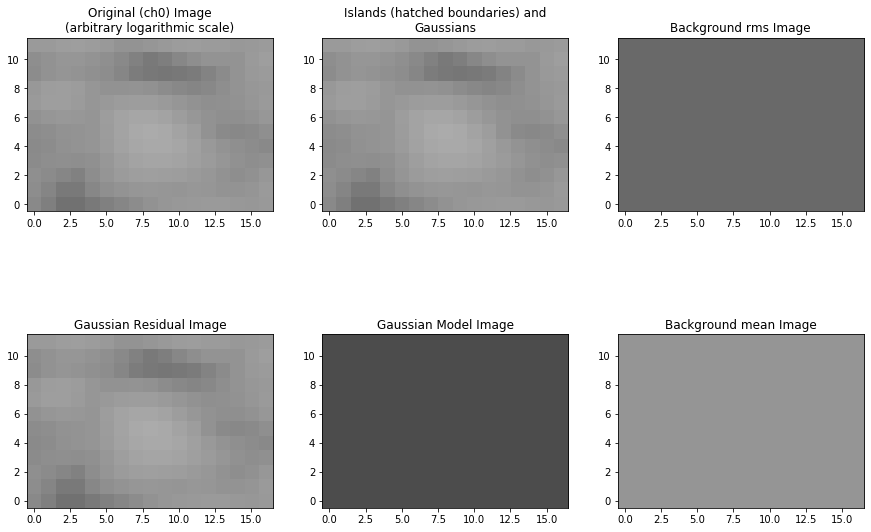

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_101.fits'
Image size .............................. : (41, 21) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.037 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.00196 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 1


Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 1
Total flux density in model ............. : 0.009 Jy


--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 1


101
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


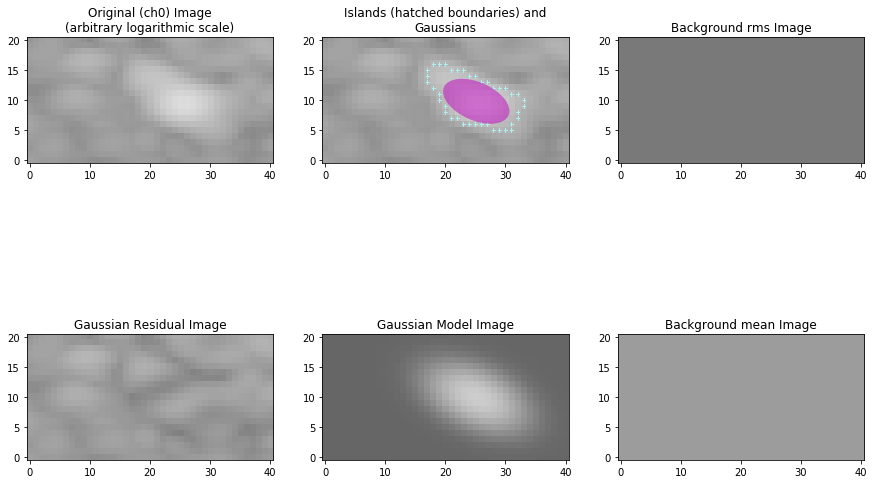

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_102.fits'
Image size .............................. : (17, 15) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.011 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.00273 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 0
--> Gr

102
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


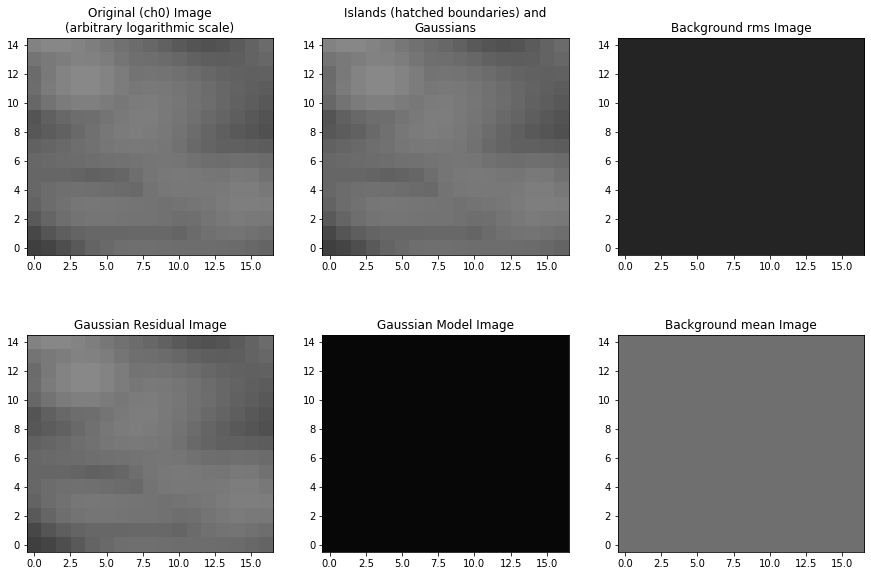

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_103.fits'
Image size .............................. : (14, 11) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.006 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.00218 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 0
--> Gr

103
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


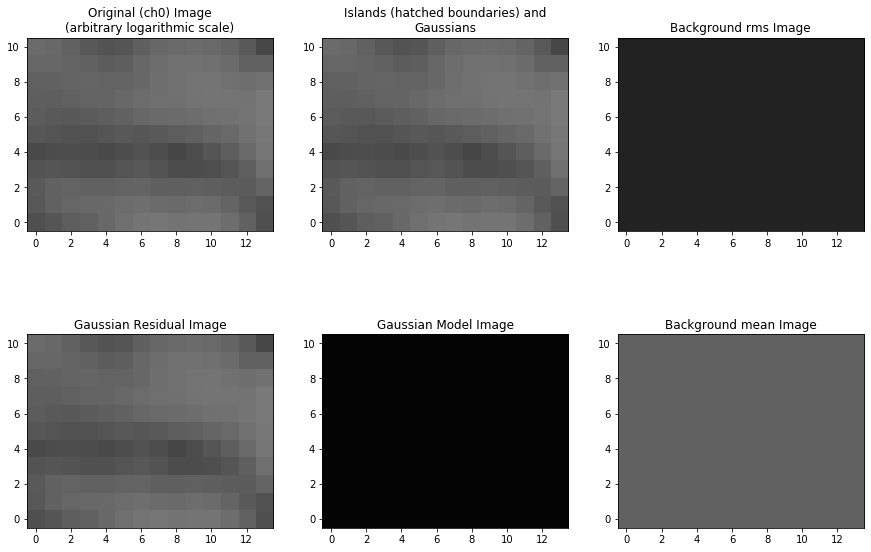

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_104.fits'
Image size .............................. : (50, 26) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.057 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 3) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.0023 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 1


Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 1
Total flux density in model ............. : 0.010 Jy


--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 1


104
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


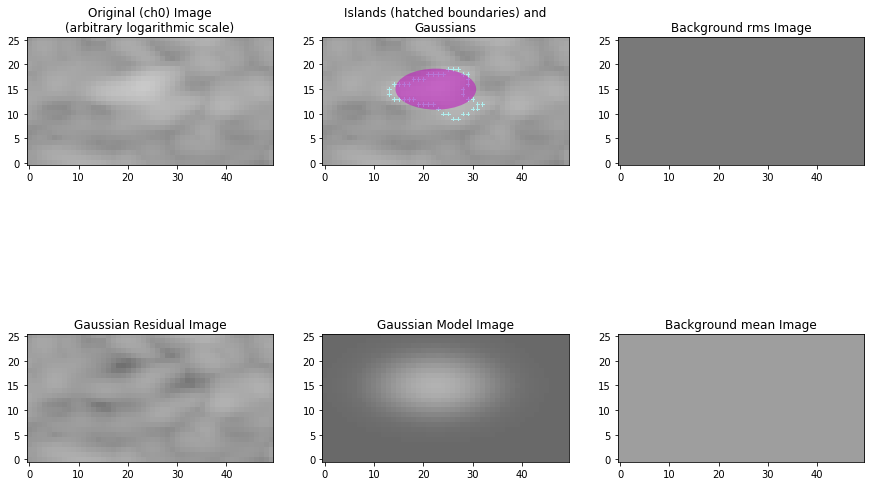

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_105.fits'
Image size .............................. : (19, 19) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.014 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.00257 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 0
--> Gr

105
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


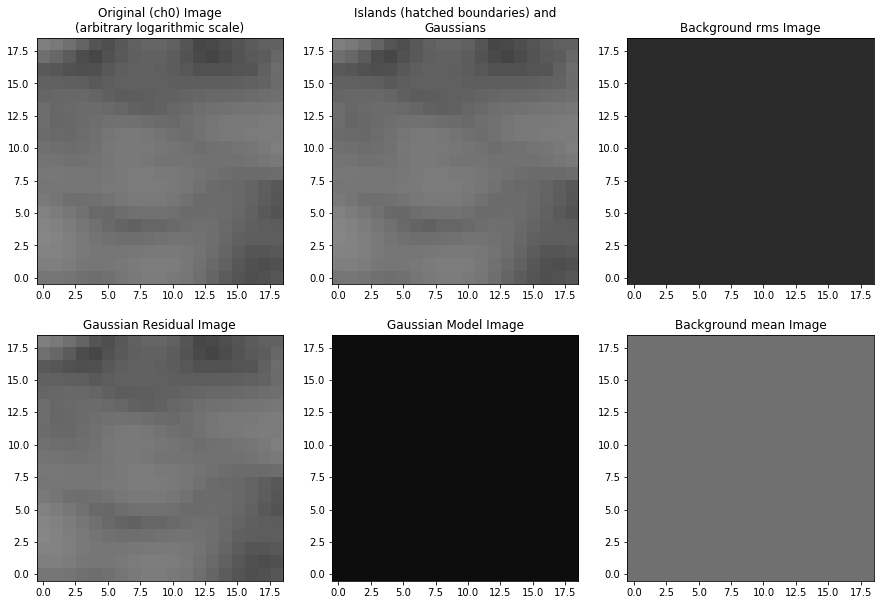

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_106.fits'
Image size .............................. : (20, 17) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.017 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.00292 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 0
--> Gr

106
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


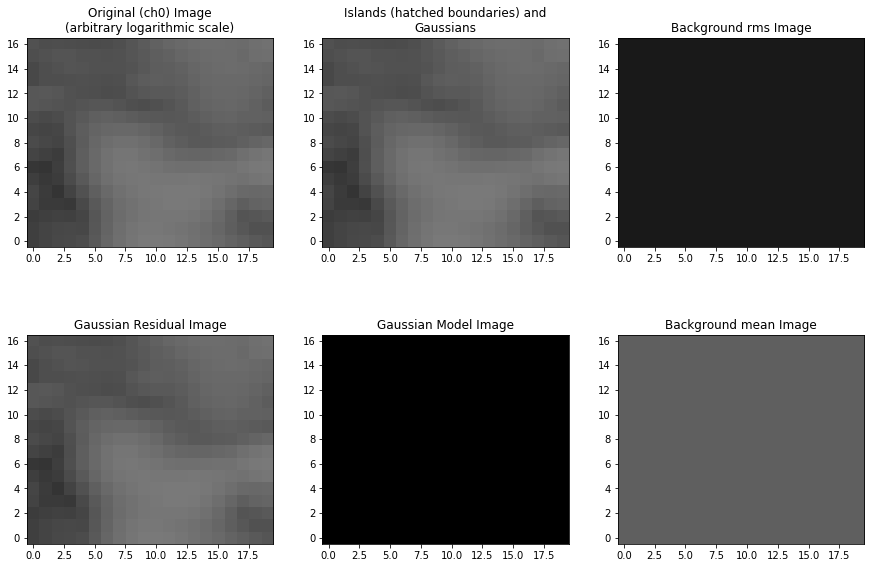

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_107.fits'
Image size .............................. : (18, 13) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.008 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.00206 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 0
--> Gr

107
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


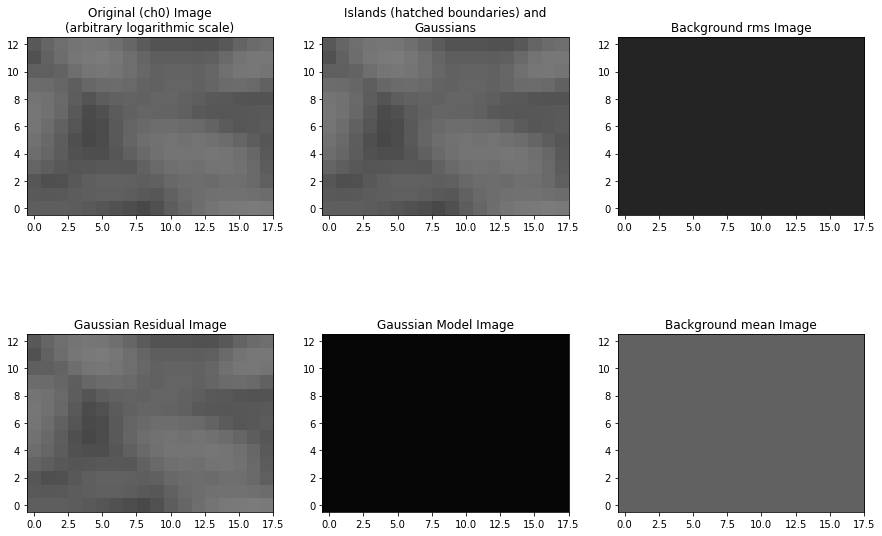

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_108.fits'
Image size .............................. : (29, 20) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.028 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.00258 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 1


Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 0
Total flux density in model ............. : 0.000 Jy


--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 0
    Island #0 (x=17, y=10)
Please check this island. If it is a valid island and
should be fit, try adjusting the flagging options (use
show_fit with "ch0_flagged=True" to see the flagged Gaussians)
or enabling the wavelet module (with "atrous_do=True").
To include empty islands in output source catalogs, set
incl_empty=True in the write_catalog task.


108
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


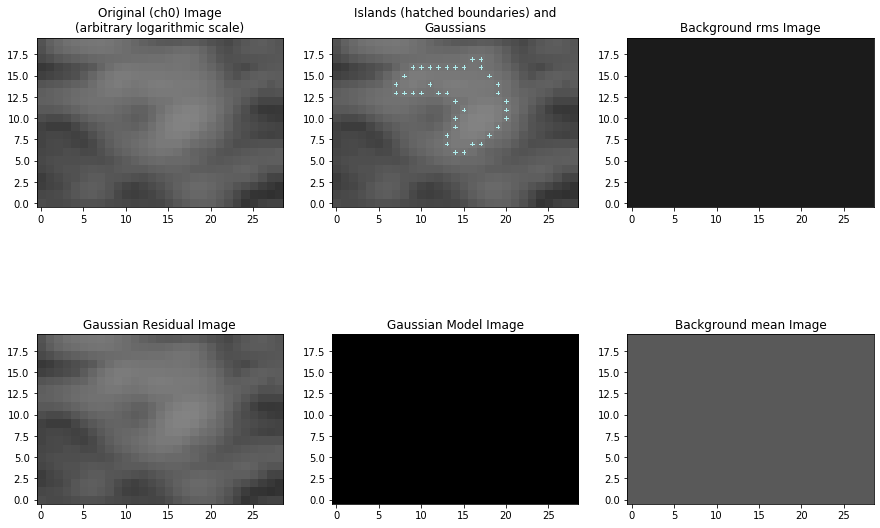

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_109.fits'
Image size .............................. : (17, 12) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.008 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.00225 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 0
--> Gr

109
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


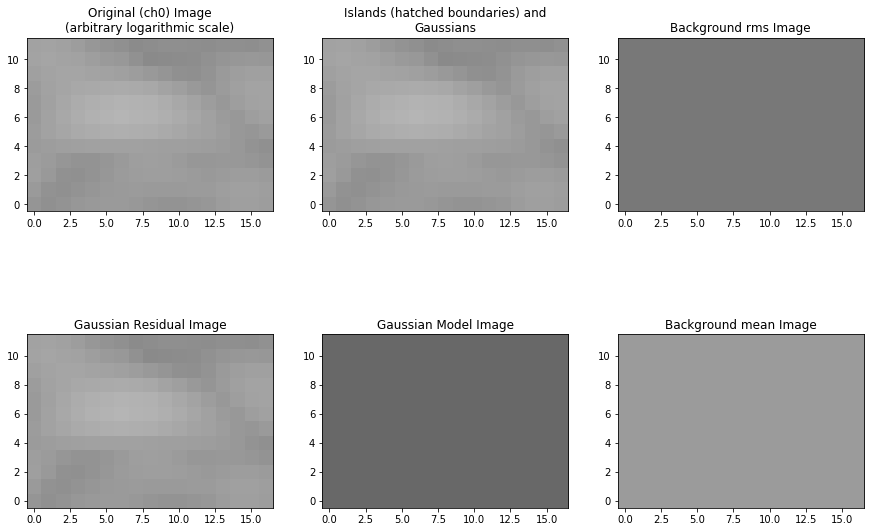

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_110.fits'
Image size .............................. : (17, 13) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.007 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.00183 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 0
--> Gr

110
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


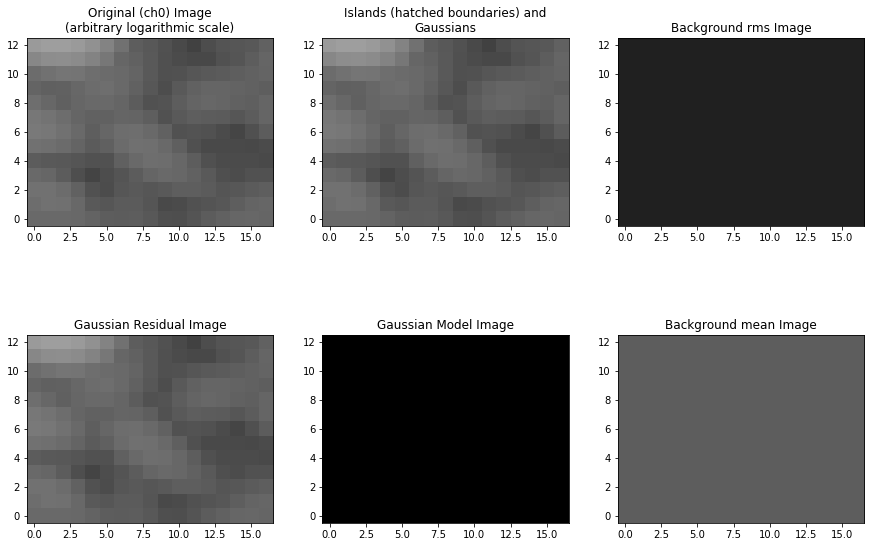

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_111.fits'
Image size .............................. : (40, 21) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.033 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.00234 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 0
--> Gr

111
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


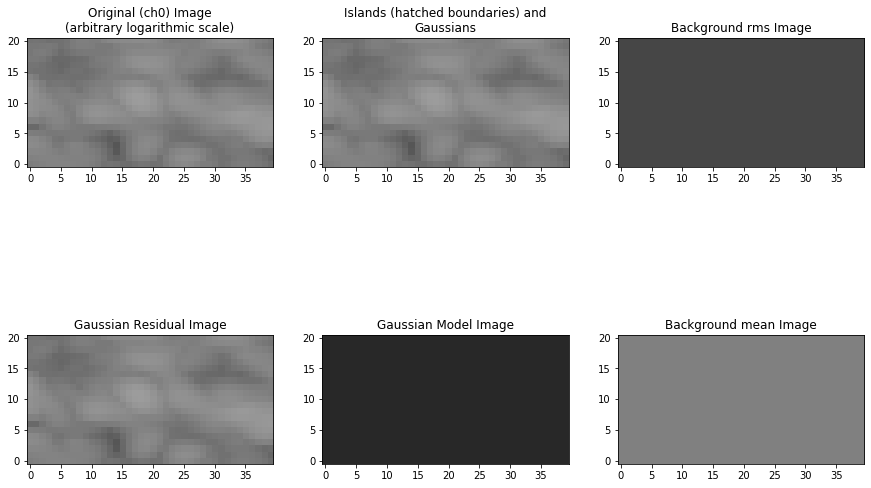

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_112.fits'
Image size .............................. : (30, 22) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.072 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (45, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.0024 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 2


Fitting islands with Gaussians .......... : [|-] 0/2/Fitting islands with Gaussians .......... : [=/] 1/2Fitting islands with Gaussians .......... : [==] 2/2Fitting islands with Gaussians .......... : [==] 2/2

Total number of Gaussians fit to image .. : 1
Total flux density in model ............. : 0.045 Jy


--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 1
    Island #1 (x=29, y=19)
Please check this island. If it is a valid island and
should be fit, try adjusting the flagging options (use
show_fit with "ch0_flagged=True" to see the flagged Gaussians)
or enabling the wavelet module (with "atrous_do=True").
To include empty islands in output source catalogs, set
incl_empty=True in the write_catalog task.


112
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


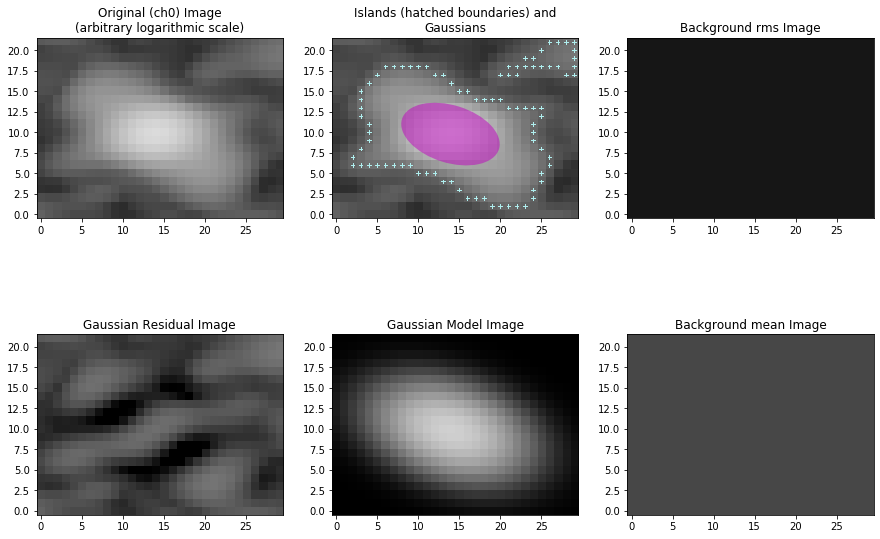

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_113.fits'
Image size .............................. : (14, 9) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.007 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.00357 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 0
--> Gro

113
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


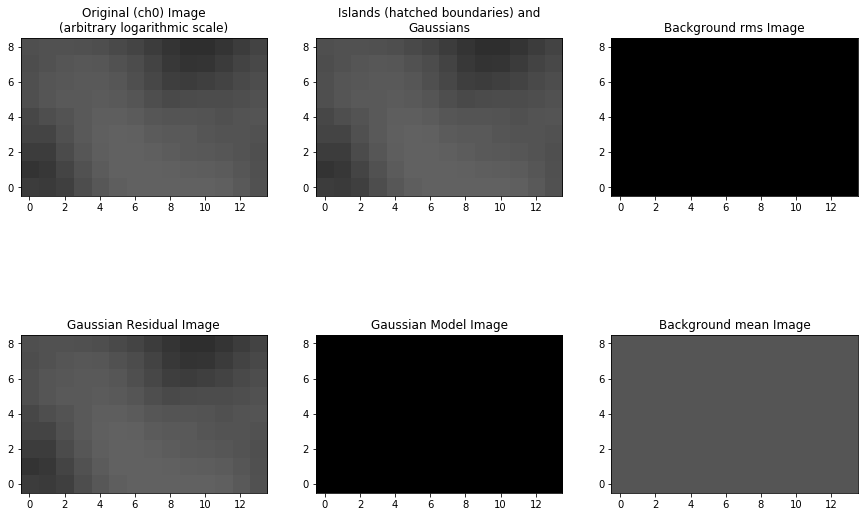

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_114.fits'
Image size .............................. : (16, 11) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.006 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.00214 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 0
--> Gr

114
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


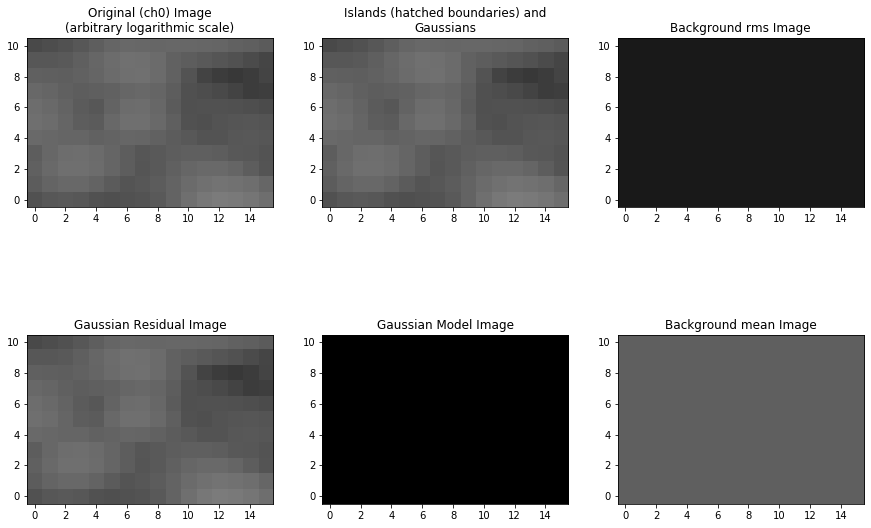

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_115.fits'
Image size .............................. : (26, 15) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.014 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.00179 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 0
--> Gr

115
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


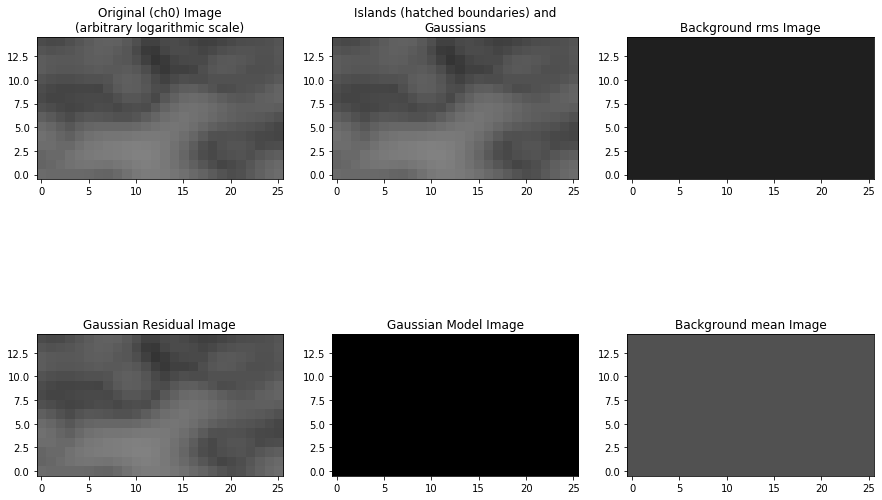

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_116.fits'
Image size .............................. : (43, 24) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.047 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.00248 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 1


Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 1
Total flux density in model ............. : 0.006 Jy
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 1


116
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


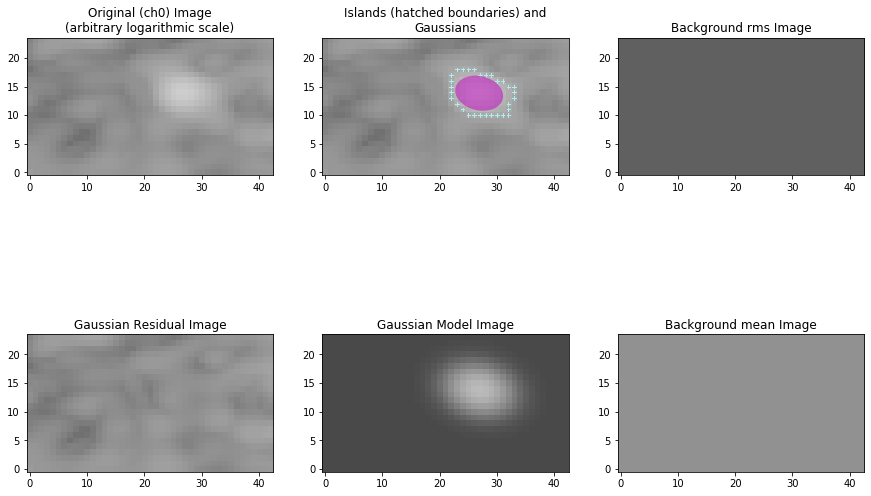

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_117.fits'
Image size .............................. : (29, 21) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.042 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (35, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.00211 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 1


Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 1
Total flux density in model ............. : 0.021 Jy


--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 1


117
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


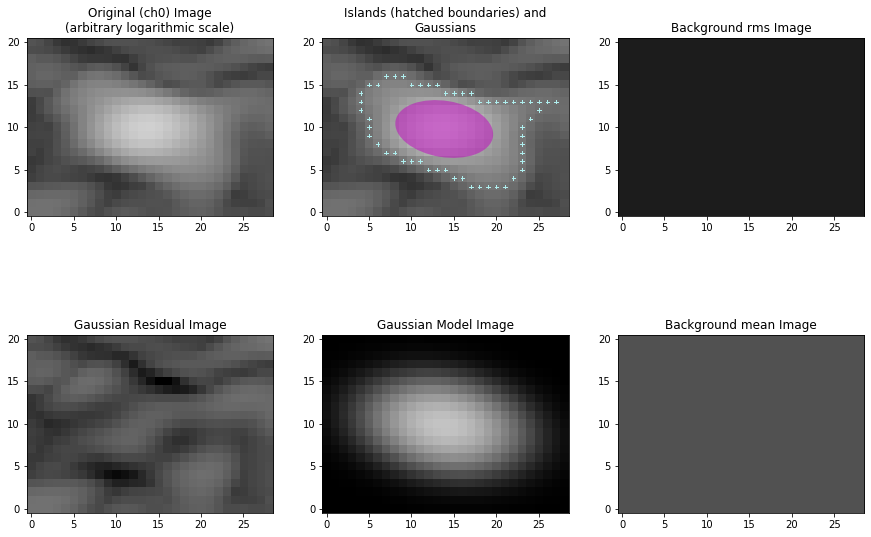

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_118.fits'
Image size .............................. : (43, 25) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.096 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (61, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.00282 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 2


Fitting islands with Gaussians .......... : [|-] 0/2/Fitting islands with Gaussians .......... : [=/] 1/2Fitting islands with Gaussians .......... : [==] 2/2Fitting islands with Gaussians .......... : [==] 2/2

Total number of Gaussians fit to image .. : 2
Total flux density in model ............. : 0.046 Jy
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 2


118
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


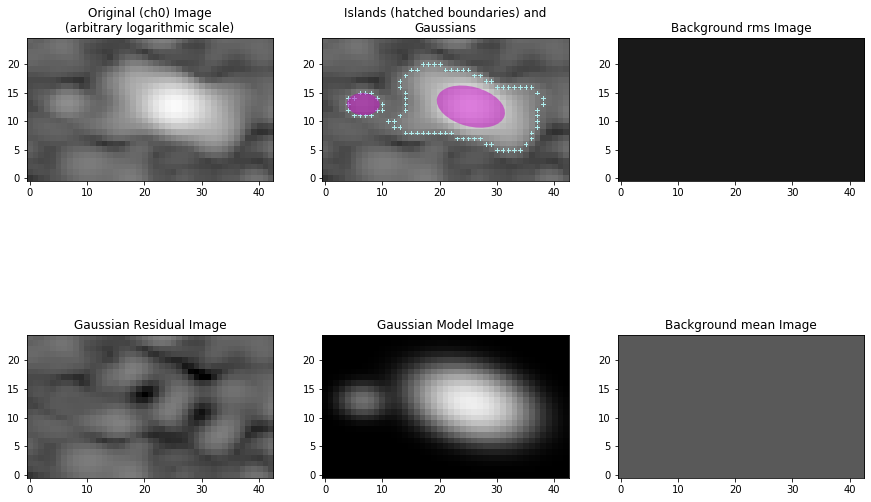

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_119.fits'
Image size .............................. : (20, 16) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.014 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.00263 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 0
--> Gr

119
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


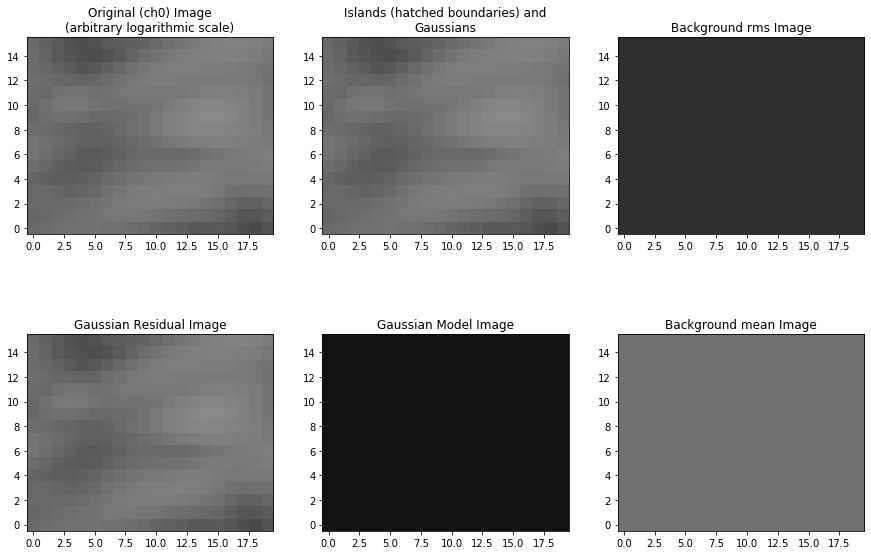

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_120.fits'
Image size .............................. : (48, 19) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.032 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.00219 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 0
--> Gr

120
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


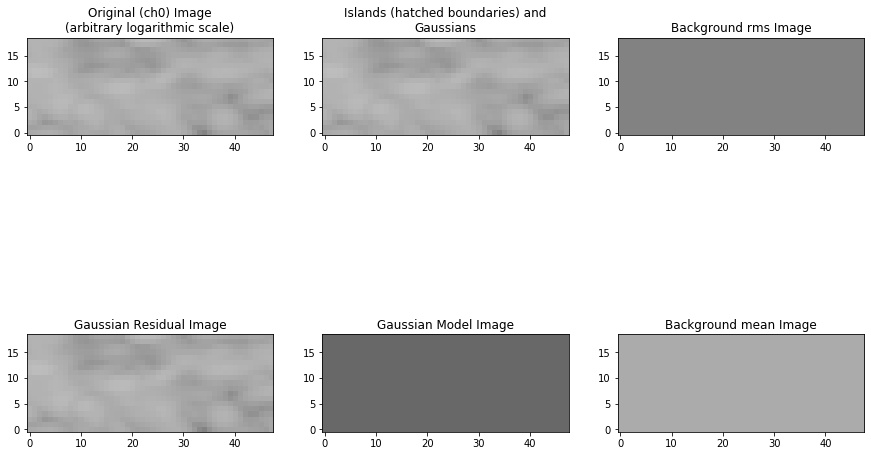

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_121.fits'
Image size .............................. : (30, 20) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.021 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.00192 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 1


Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 1
Total flux density in model ............. : 0.002 Jy
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 1


121
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


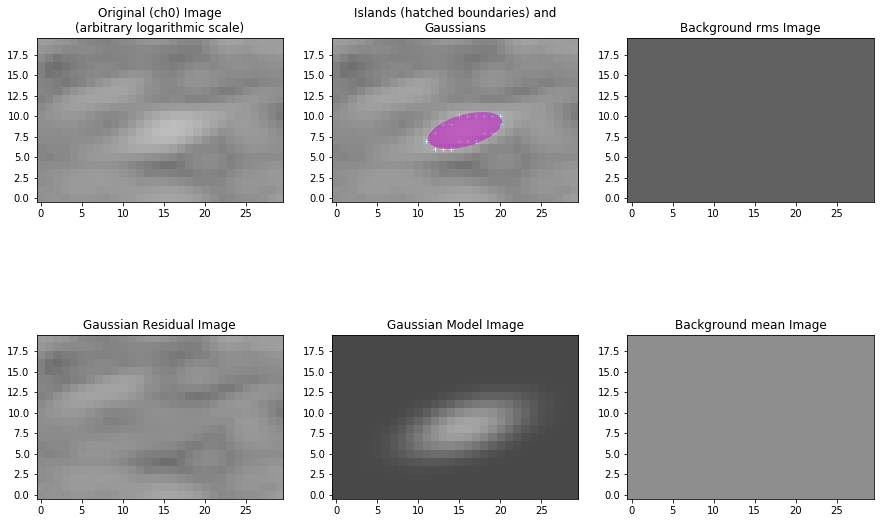

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_122.fits'
Image size .............................. : (25, 18) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.016 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.00225 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 0
--> Gr

122
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


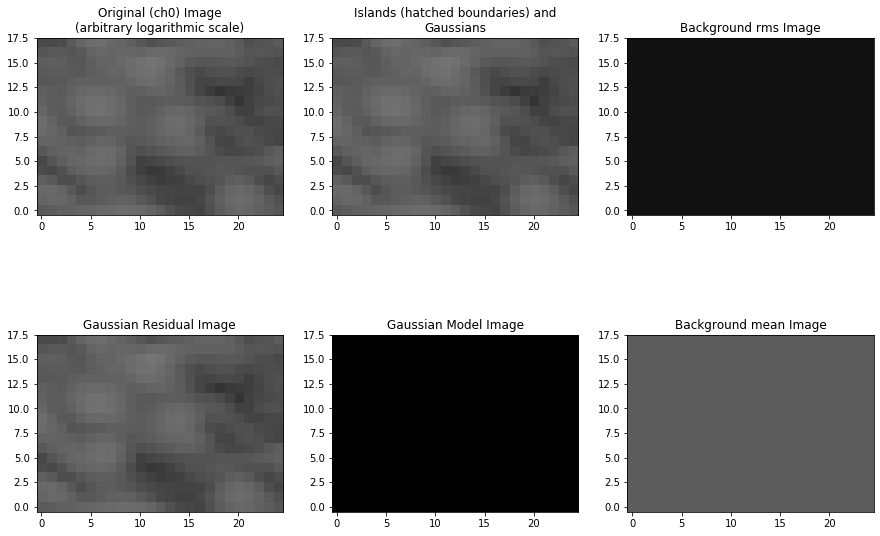

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_123.fits'
Image size .............................. : (44, 26) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.043 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 3) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.00226 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 0
--> Gr

123
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


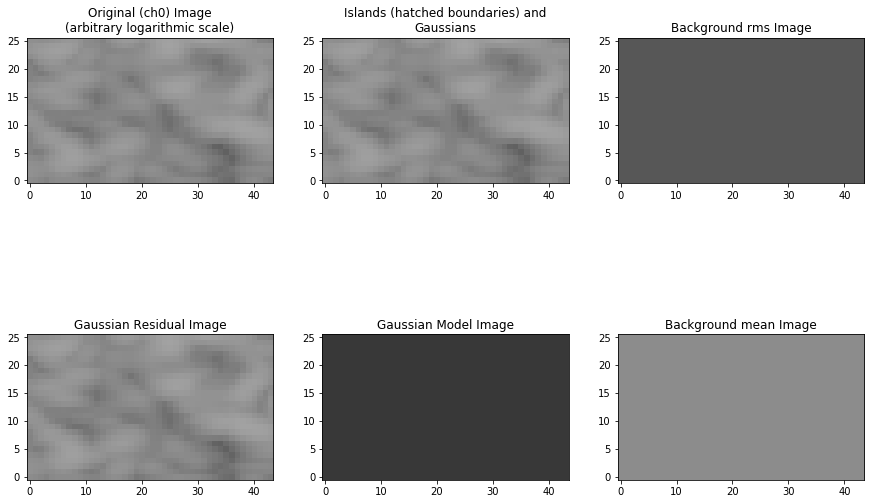

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_124.fits'
Image size .............................. : (21, 21) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.014 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.00196 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 0
--> Gr

124
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


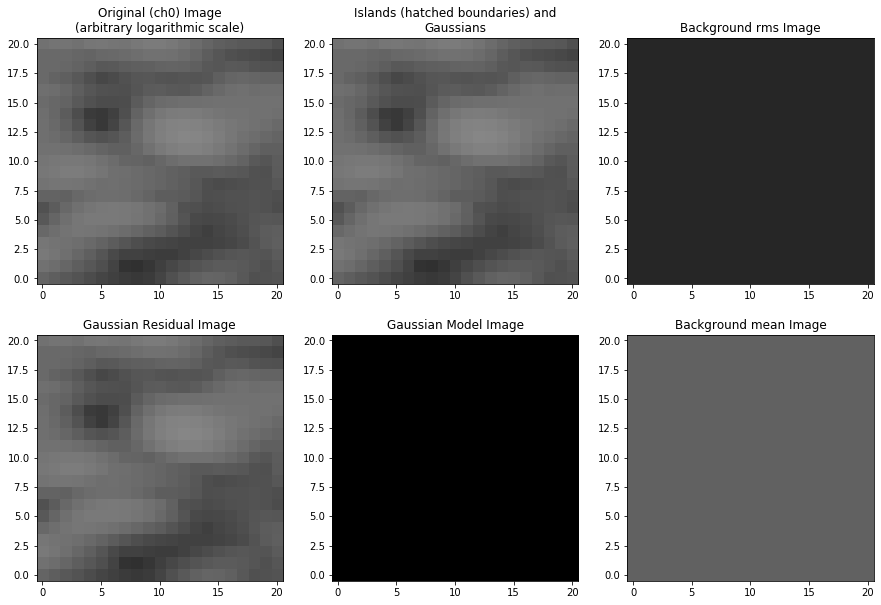

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_125.fits'
Image size .............................. : (33, 16) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.017 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.00205 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 0
--> Gr

125
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


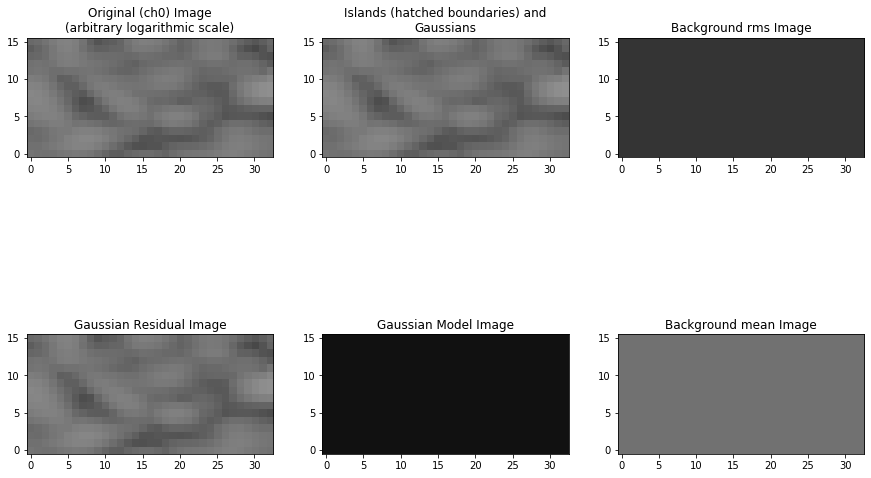

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_126.fits'
Image size .............................. : (22, 22) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.019 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.00218 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 0
--> Gr

126
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


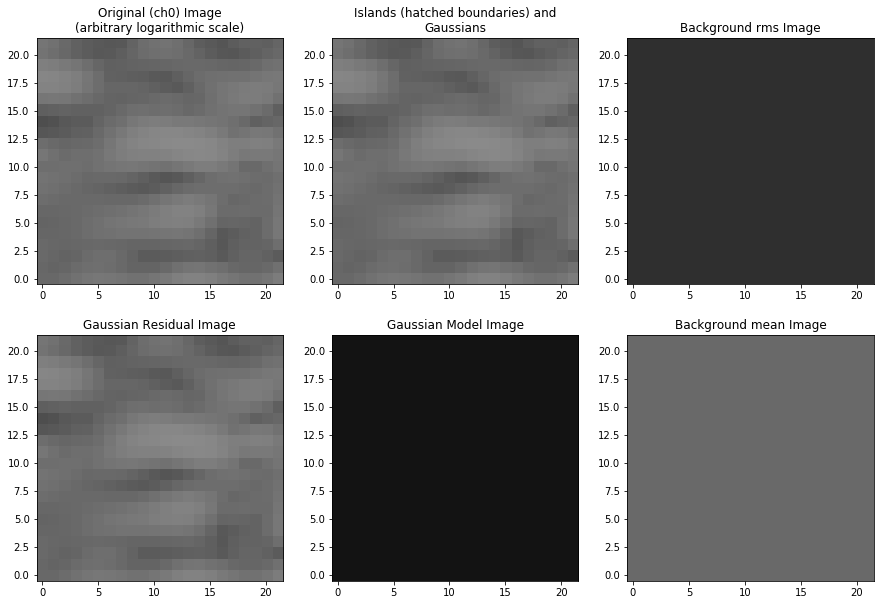

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_127.fits'
Image size .............................. : (13, 9) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.004 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.0019 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 0
--> Grou

127
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


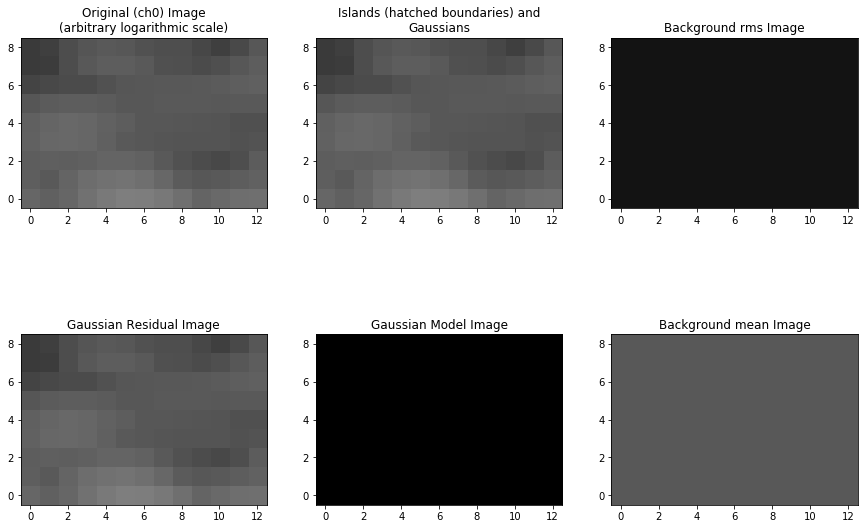

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_128.fits'
Image size .............................. : (21, 18) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.015 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.00216 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 0
--> Gr

128
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


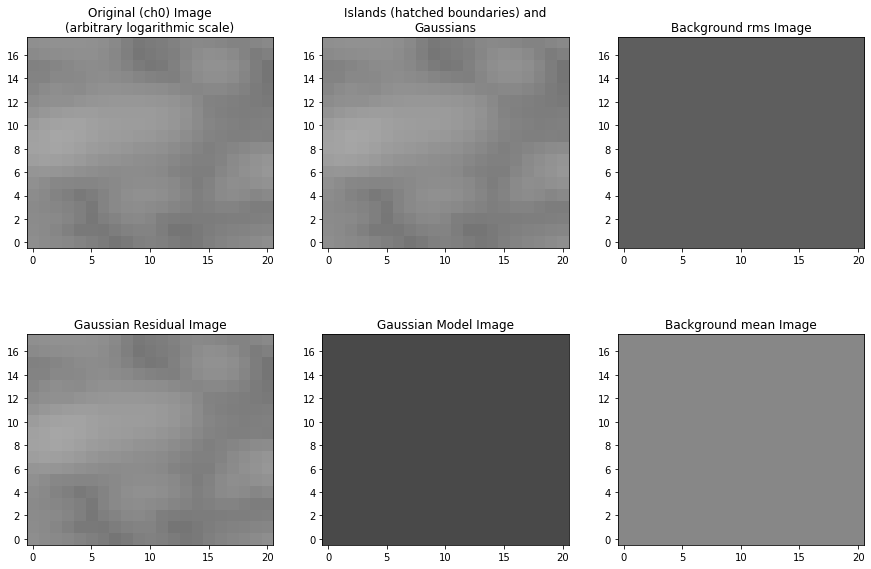

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_129.fits'
Image size .............................. : (24, 16) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.017 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.00265 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 0
--> Gr

129
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


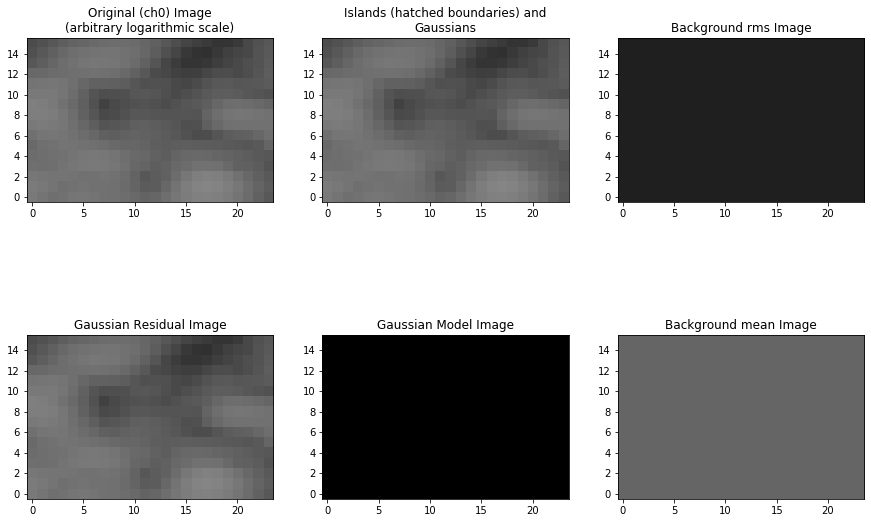

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_130.fits'
Image size .............................. : (16, 13) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.008 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.00223 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 0
--> Gr

130
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


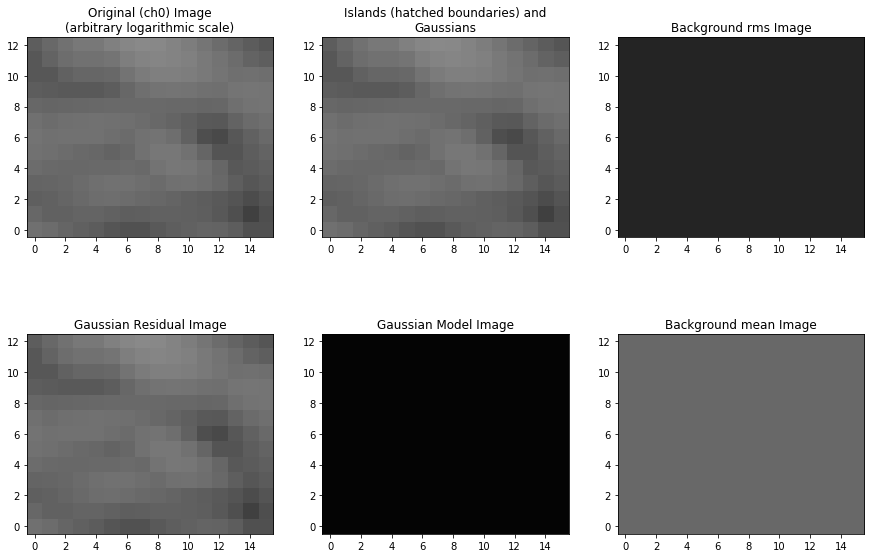

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_131.fits'
Image size .............................. : (20, 15) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.010 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.00197 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 0
--> Gr

131
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


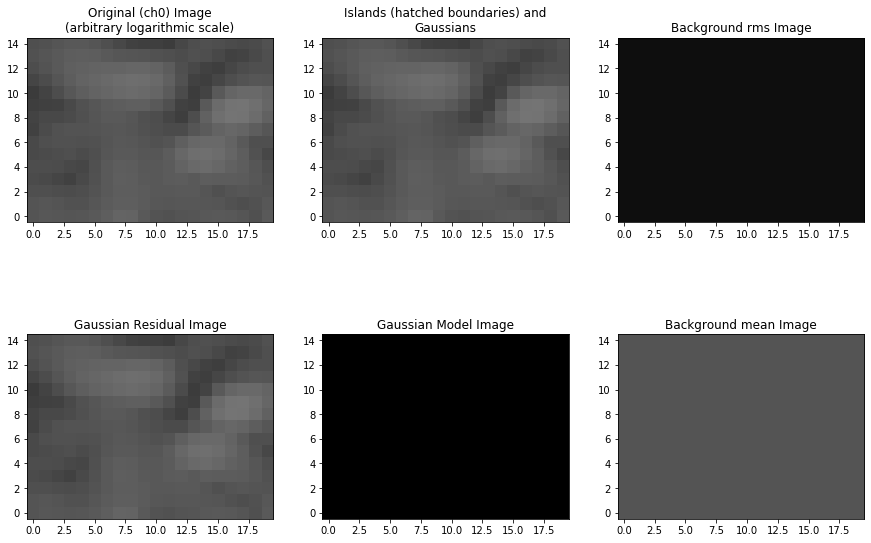

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_132.fits'
Image size .............................. : (12, 9) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.003 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.00155 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 0
--> Gro

132
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


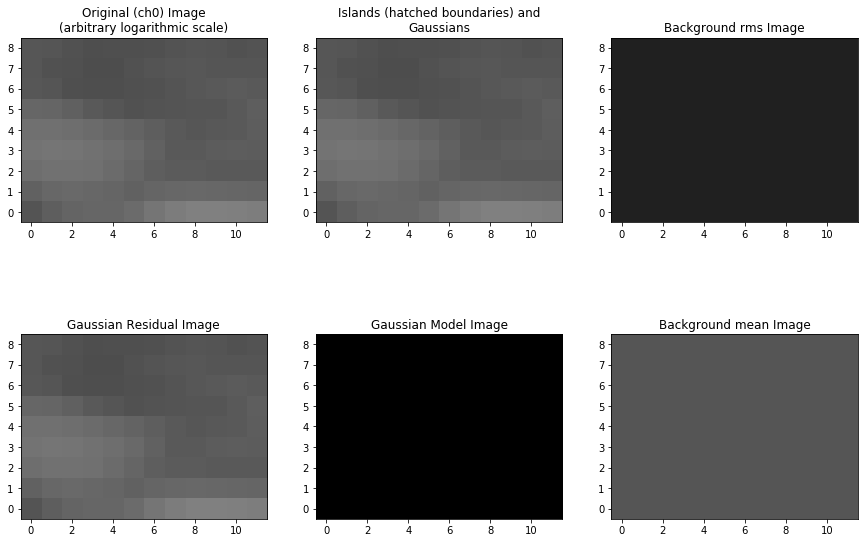

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_133.fits'
Image size .............................. : (39, 21) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.025 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.0018 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 0
--> Gro

133
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


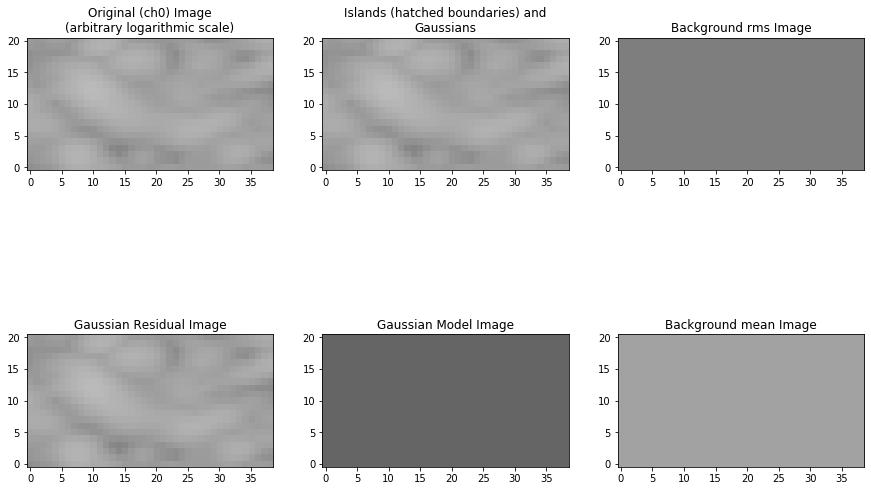

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_134.fits'
Image size .............................. : (39, 20) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.025 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.0019 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 0
--> Gro

134
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


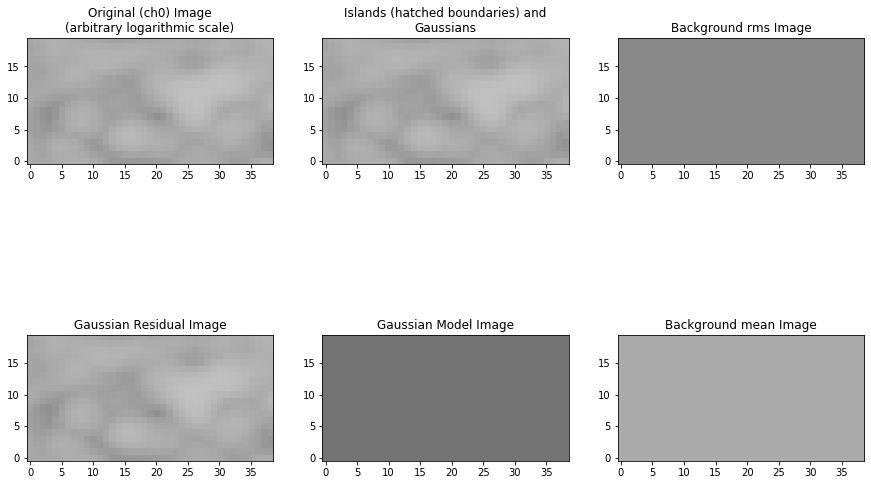

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_135.fits'
Image size .............................. : (21, 14) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.010 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.00211 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 0
--> Gr

135
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


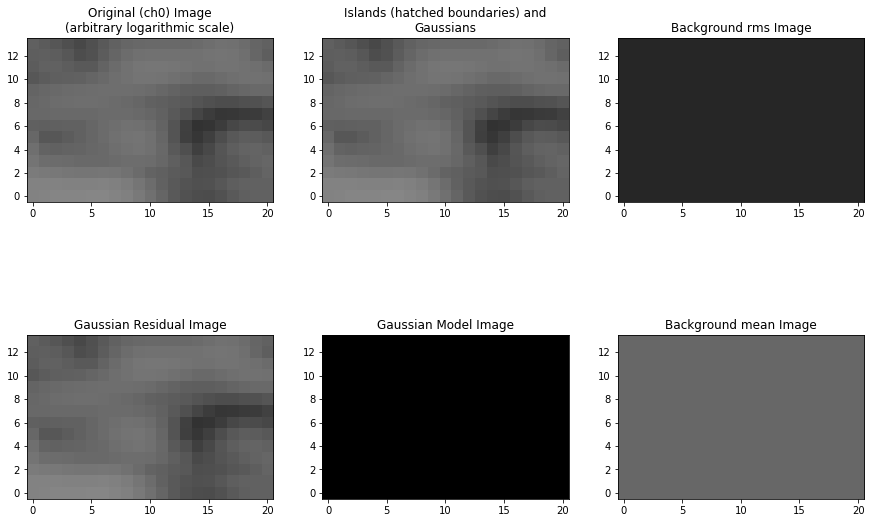

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_136.fits'
Image size .............................. : (26, 18) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.016 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.00199 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 0
--> Gr

136
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


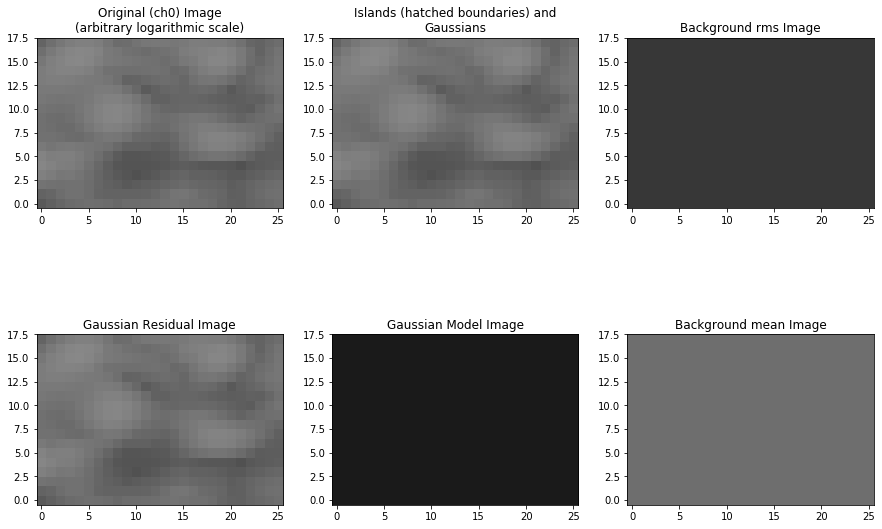

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_137.fits'
Image size .............................. : (26, 17) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.014 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.00195 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 0
--> Gr

137
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


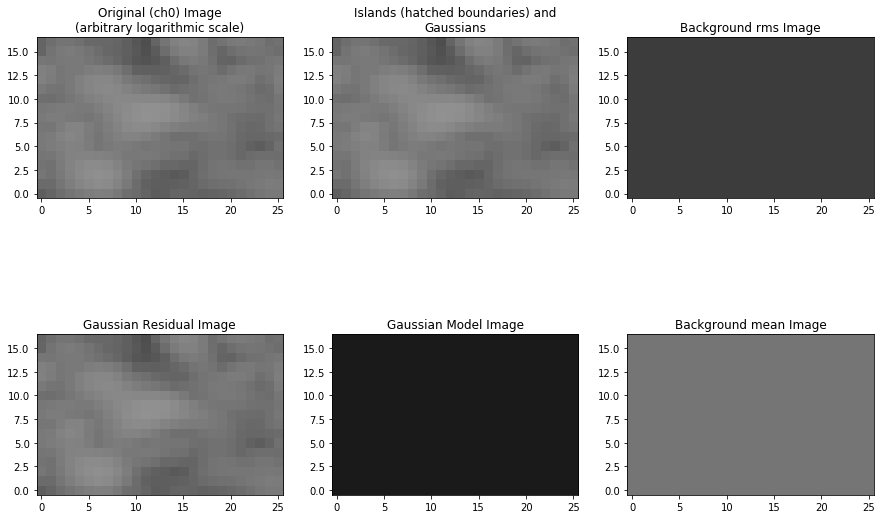

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_138.fits'
Image size .............................. : (41, 18) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.031 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.00223 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 1


Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 0
Total flux density in model ............. : 0.000 Jy
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 0
    Island #0 (x=34, y=1)
Please check this island. If it is a valid island and
should be fit, try adjusting the flagging options (use
show_fit with "ch0_flagged=True" to see the flagged Gaussians)
or enabling the wavelet module (with "atrous_do=True").
To include empty islands in output source catalogs, set
incl_empty=True in the write_catalog task.


138
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


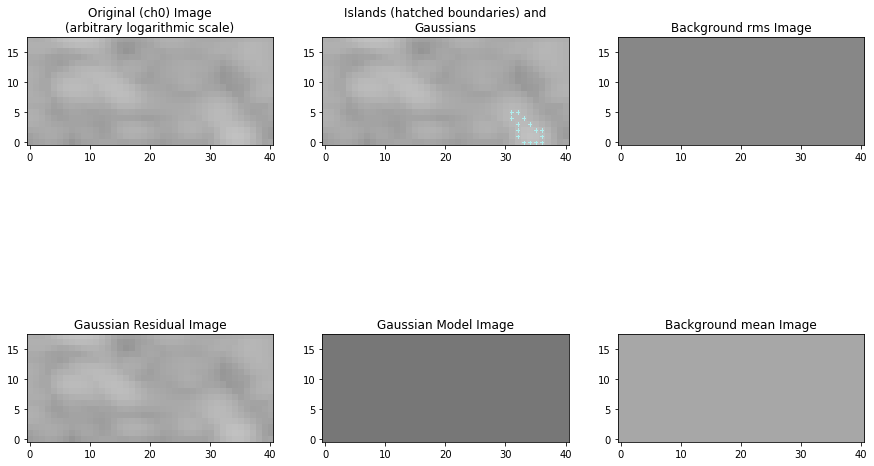

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_139.fits'
Image size .............................. : (31, 21) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.024 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.00198 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 1


Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 1
Total flux density in model ............. : 0.002 Jy
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 1


139
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


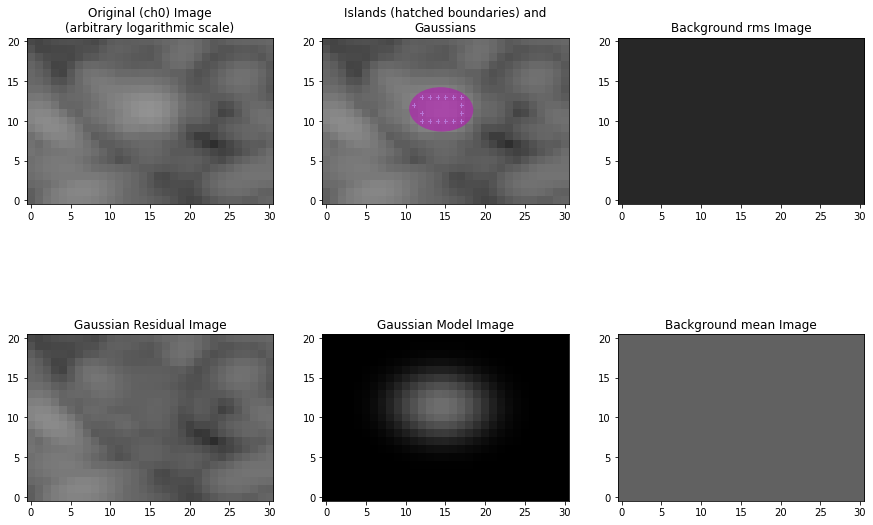

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_140.fits'
Image size .............................. : (42, 21) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.051 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (35, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.00238 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 1


Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 1
Total flux density in model ............. : 0.016 Jy


--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 1


140
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


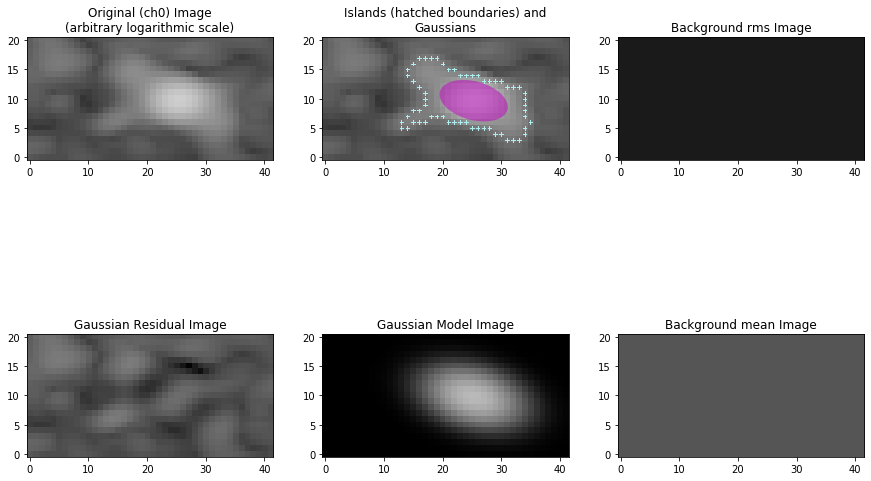

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_141.fits'
Image size .............................. : (27, 19) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.017 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.00189 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 0
--> Gr

141
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


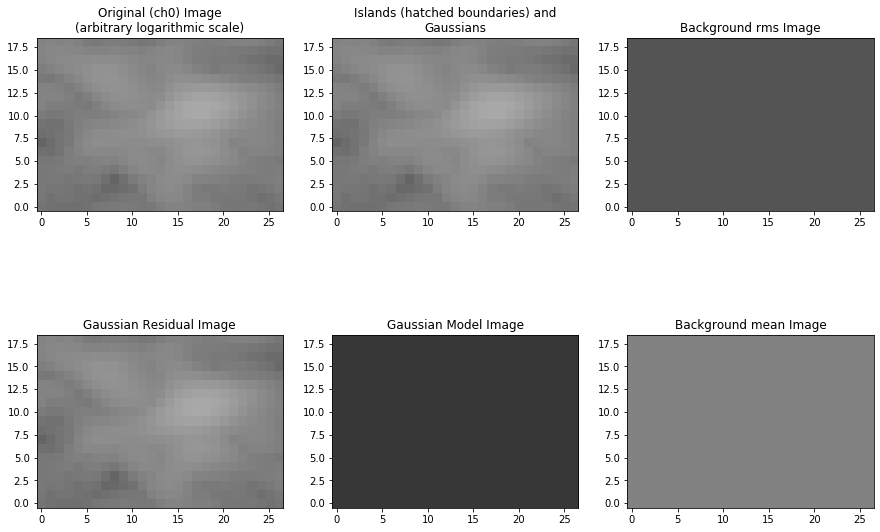

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_142.fits'
Image size .............................. : (17, 11) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.006 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.00183 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 0
--> Gr

142
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


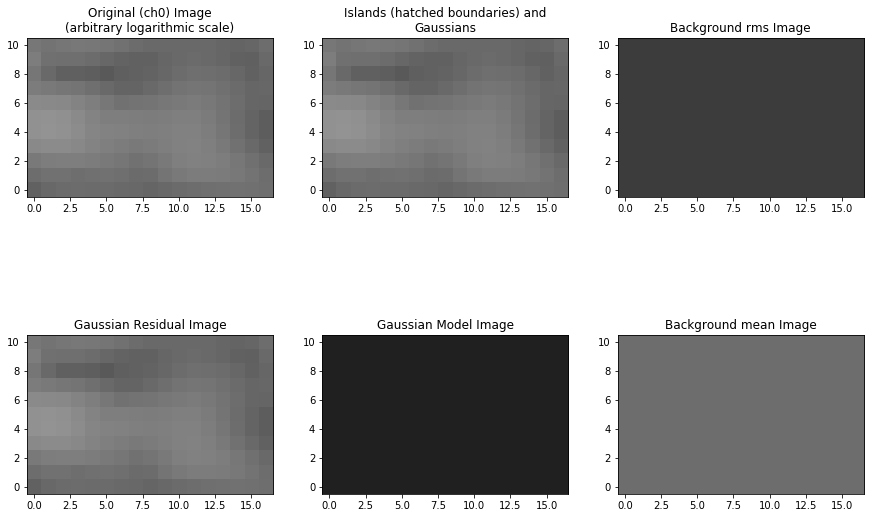

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_143.fits'
Image size .............................. : (32, 27) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.036 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 3) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.0021 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 1


Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 1
Total flux density in model ............. : 0.008 Jy


--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 1


143
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


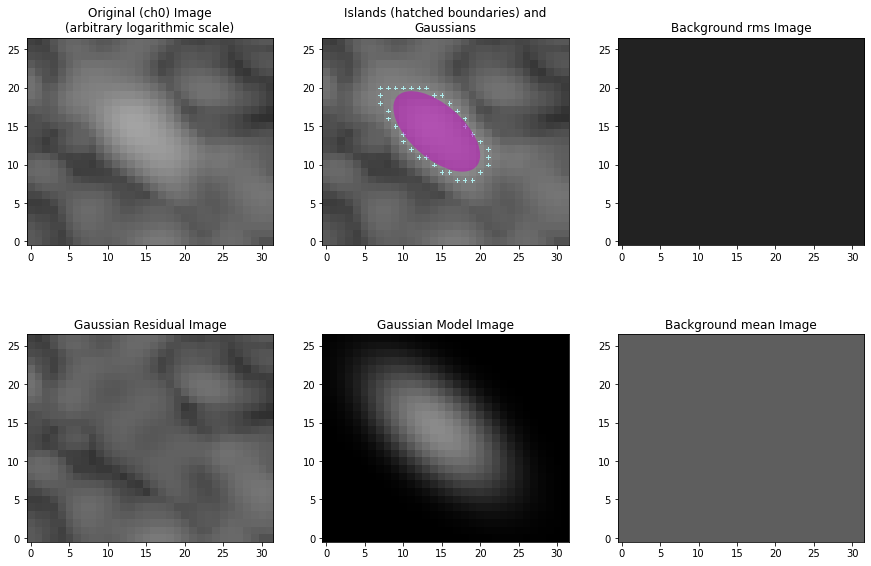

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_144.fits'
Image size .............................. : (28, 22) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.023 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.00221 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 0
--> Gr

144
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


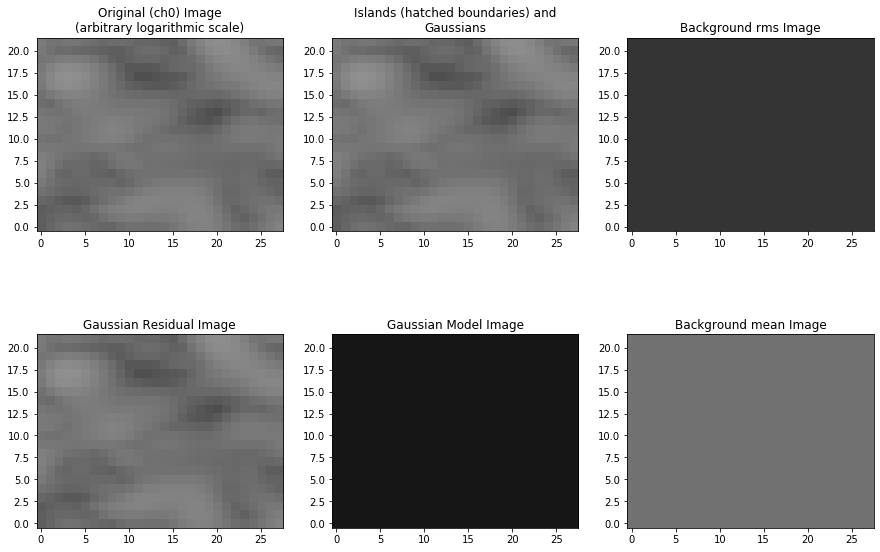

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_145.fits'
Image size .............................. : (24, 21) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.016 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.00173 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 0
--> Gr

145
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


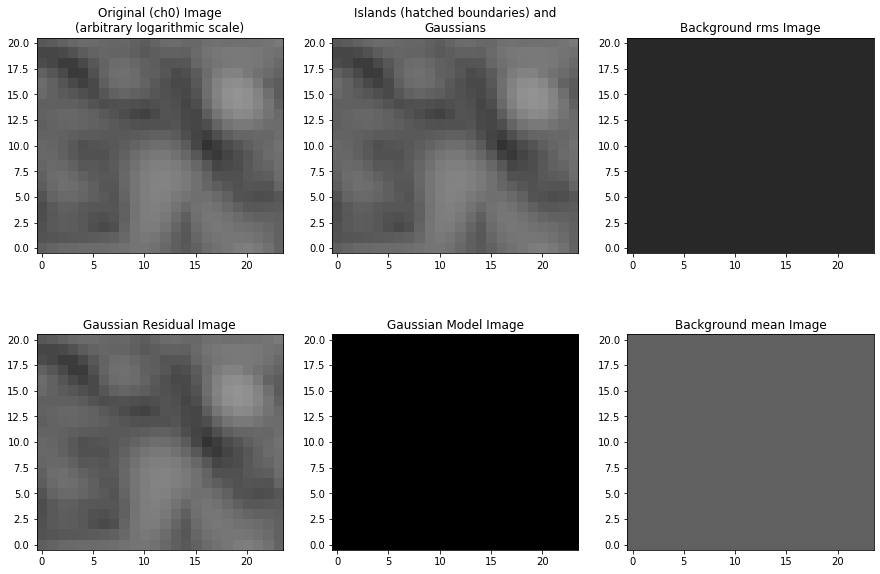

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_146.fits'
Image size .............................. : (28, 26) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.028 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 3) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.00226 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 0
--> Gr

146
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


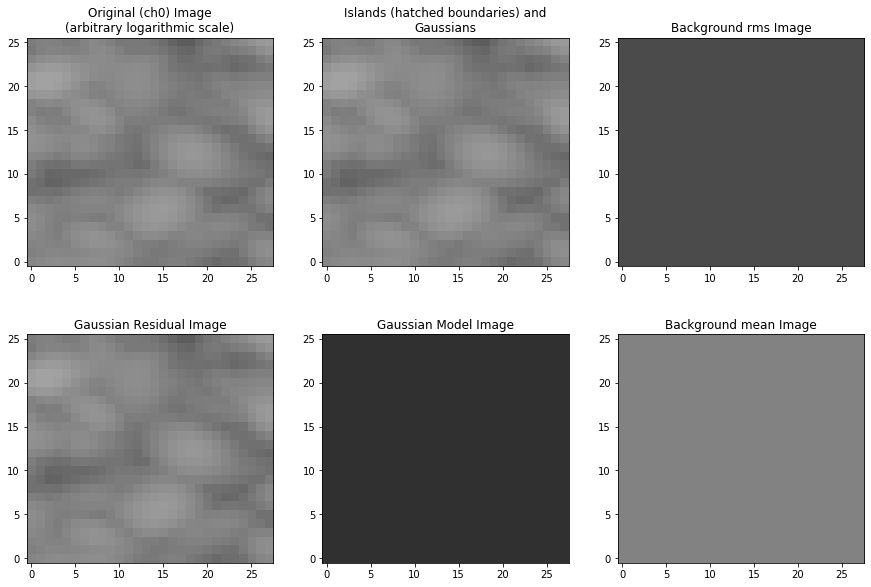

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_147.fits'
Image size .............................. : (25, 17) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.017 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.00219 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 0
--> Gr

147
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


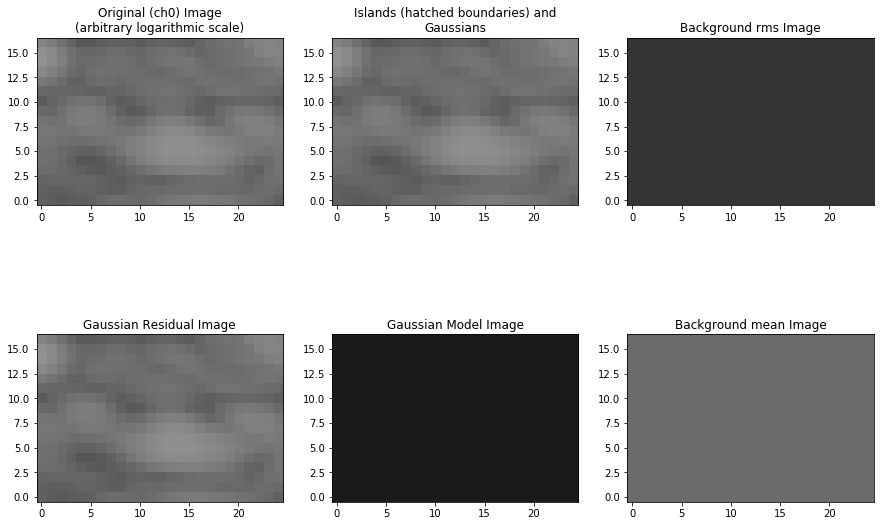

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_148.fits'
Image size .............................. : (15, 11) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.005 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.00185 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 0
--> Gr

148
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


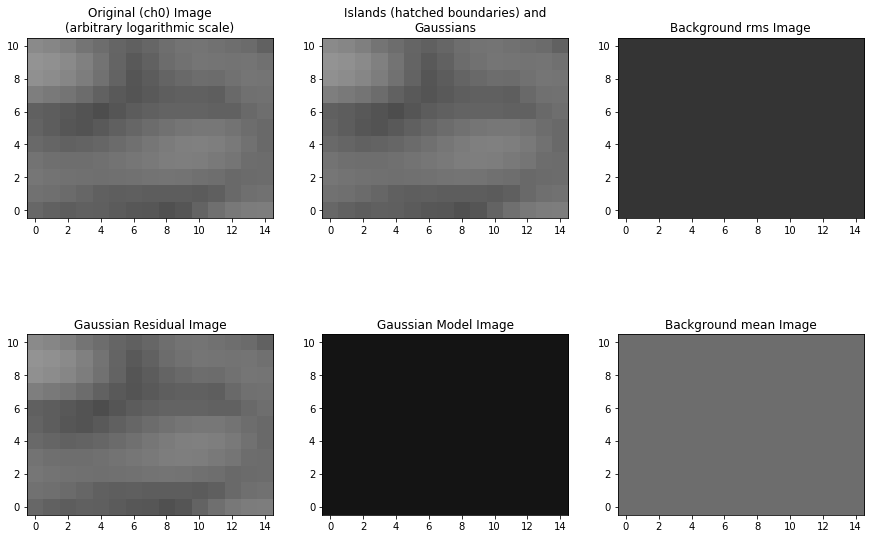

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_149.fits'
Image size .............................. : (43, 21) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.031 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.00208 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 0
--> Gr

149
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


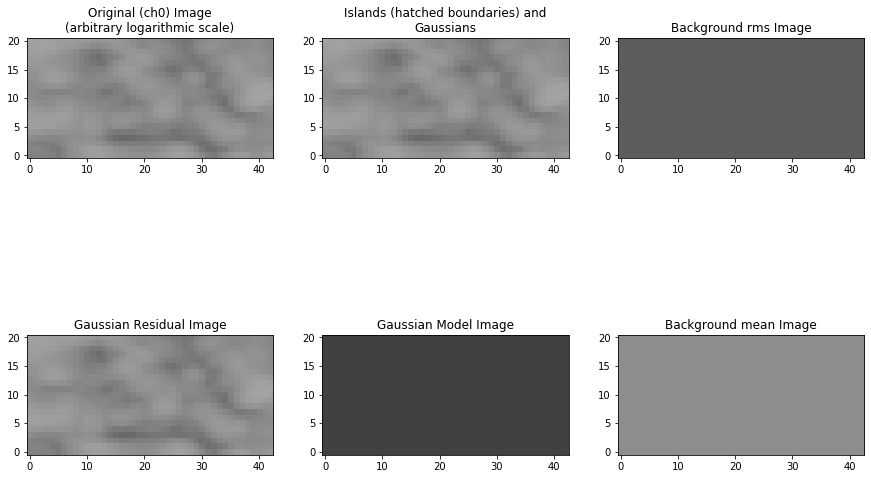

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_150.fits'
Image size .............................. : (15, 13) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.008 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.00253 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 0
--> Gr

150
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


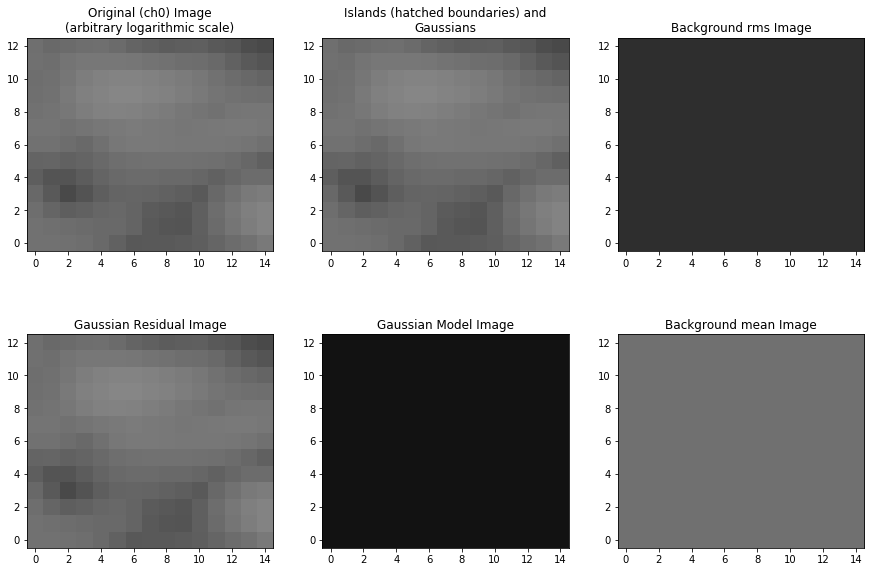

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_151.fits'
Image size .............................. : (27, 19) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.022 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.00237 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 1


Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 0
Total flux density in model ............. : 0.000 Jy


--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 0
    Island #0 (x=12, y=9)
Please check this island. If it is a valid island and
should be fit, try adjusting the flagging options (use
show_fit with "ch0_flagged=True" to see the flagged Gaussians)
or enabling the wavelet module (with "atrous_do=True").
To include empty islands in output source catalogs, set
incl_empty=True in the write_catalog task.


151
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


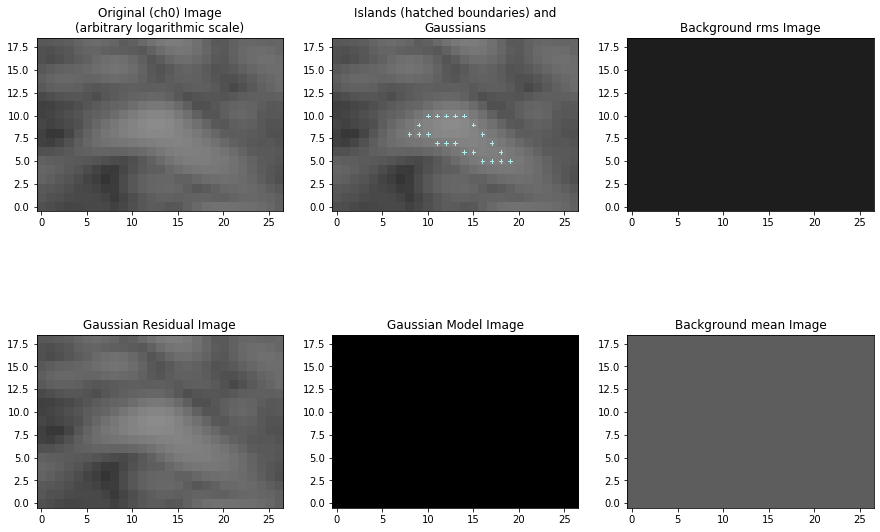

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_152.fits'
Image size .............................. : (17, 17) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.011 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.00221 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 0
--> Gr

152
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


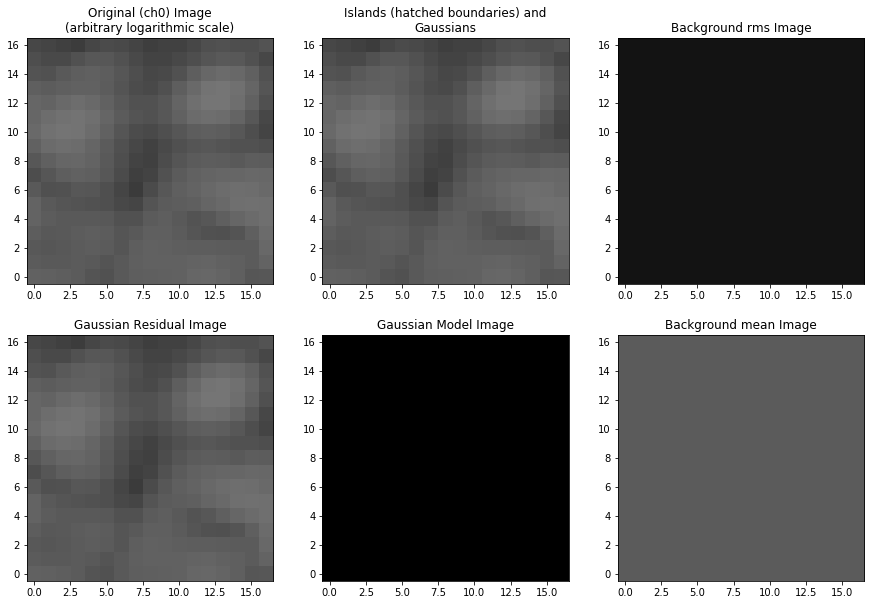

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_153.fits'
Image size .............................. : (25, 14) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.013 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.00223 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 0
--> Gr

153
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


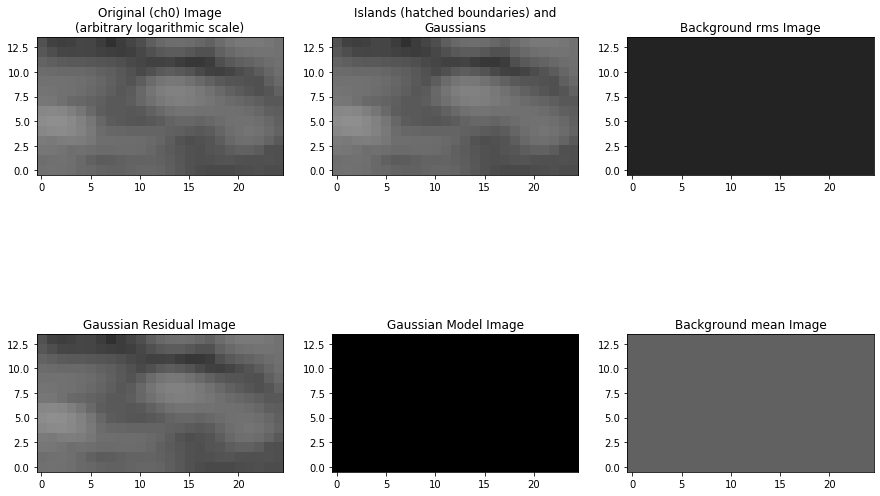

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_154.fits'
Image size .............................. : (17, 12) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.007 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.00201 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 0
--> Gr

154
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


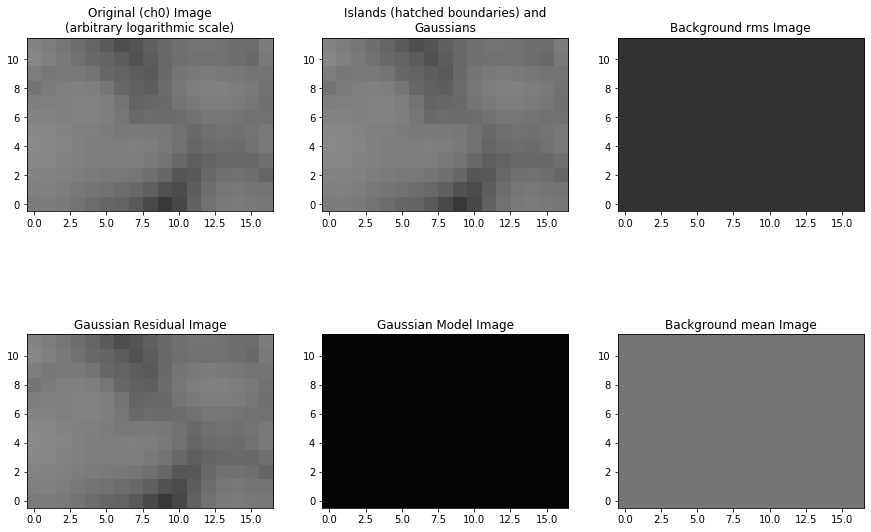

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_155.fits'
Image size .............................. : (49, 33) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.140 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (81, 3) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.00225 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 2


Fitting islands with Gaussians .......... : [|-] 0/2/Fitting islands with Gaussians .......... : [=/] 1/2Fitting islands with Gaussians .......... : [==] 2/2Fitting islands with Gaussians .......... : [==] 2/2

Total number of Gaussians fit to image .. : 1
Total flux density in model ............. : 0.062 Jy
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 1
    Island #0 (x=10, y=5)
Please check this island. If it is a valid island and
should be fit, try adjusting the flagging options (use
show_fit with "ch0_flagged=True" to see the flagged Gaussians)
or enabling the wavelet module (with "atrous_do=True").
To include empty islands in output source catalogs, set
incl_empty=True in the write_catalog task.


155
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


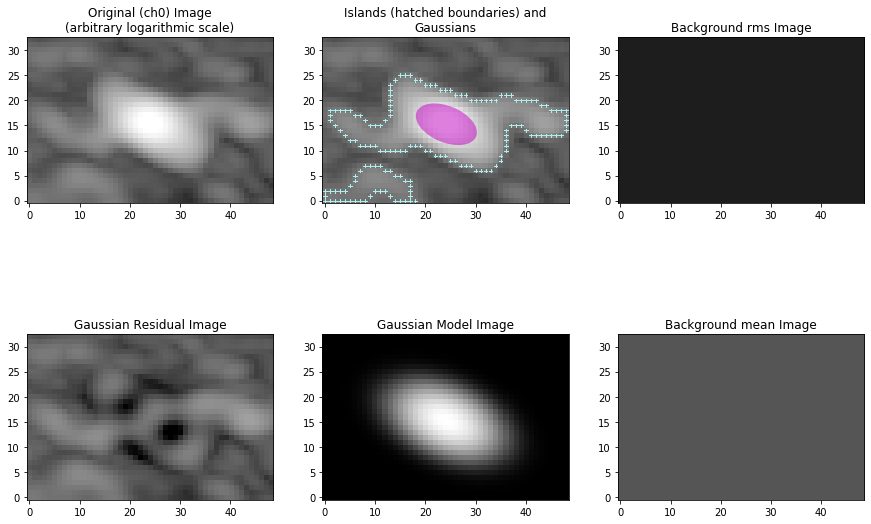

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_156.fits'
Image size .............................. : (27, 19) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.025 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.00276 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 1


Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 0
Total flux density in model ............. : 0.000 Jy
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 0
    Island #0 (x=23, y=14)
Please check this island. If it is a valid island and
should be fit, try adjusting the flagging options (use
show_fit with "ch0_flagged=True" to see the flagged Gaussians)
or enabling the wavelet module (with "atrous_do=True").
To include empty islands in output source catalogs, set
incl_empty=True in the write_catalog task.


156
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


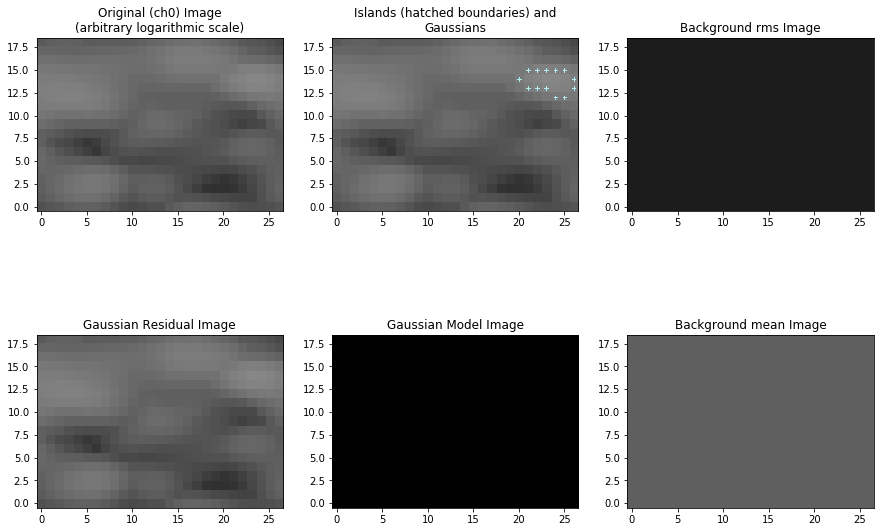

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_157.fits'
Image size .............................. : (23, 19) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.017 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.00217 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 0
--> Gr

157
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


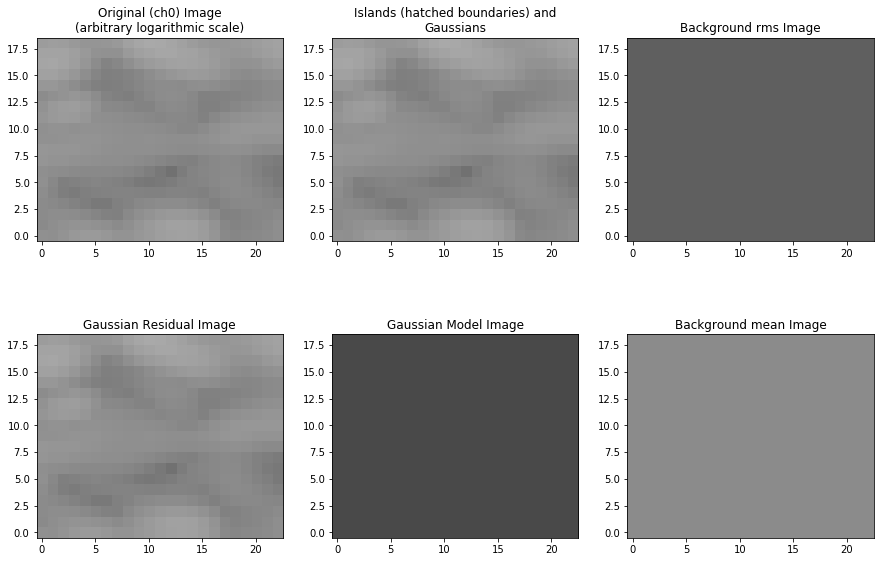

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_158.fits'
Image size .............................. : (15, 13) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.007 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.00242 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 0
--> Gr

158
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


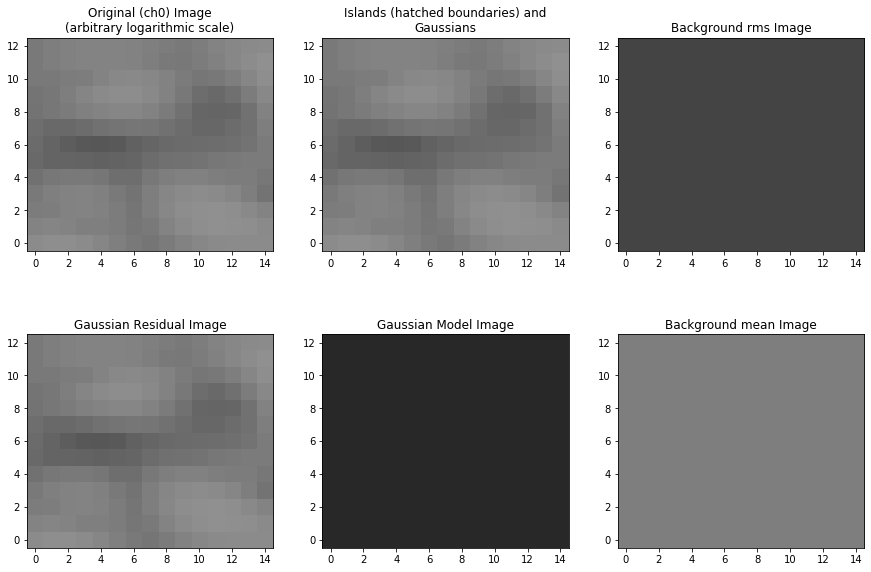

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_159.fits'
Image size .............................. : (22, 20) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.014 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.00182 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 0
--> Gr

159
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


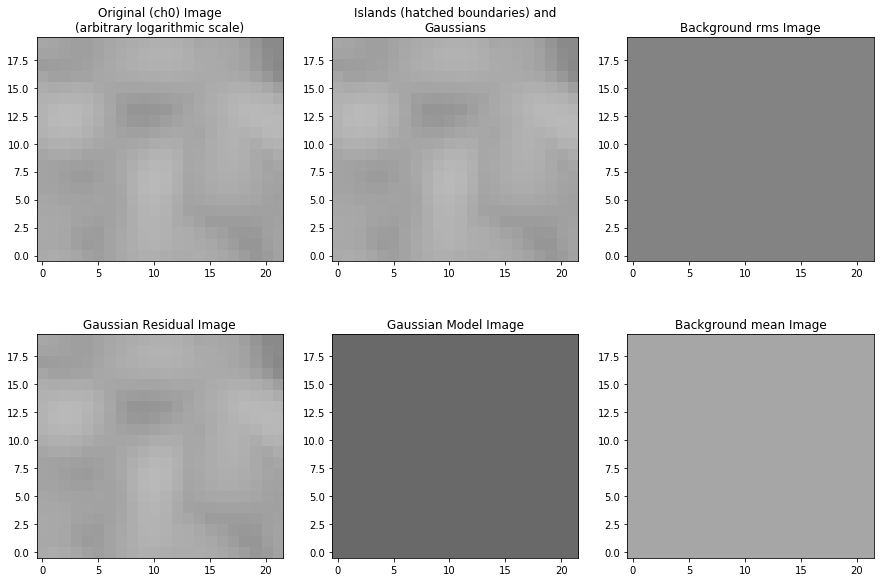

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_160.fits'
Image size .............................. : (16, 17) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.012 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.00286 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 0
--> Gr

160
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


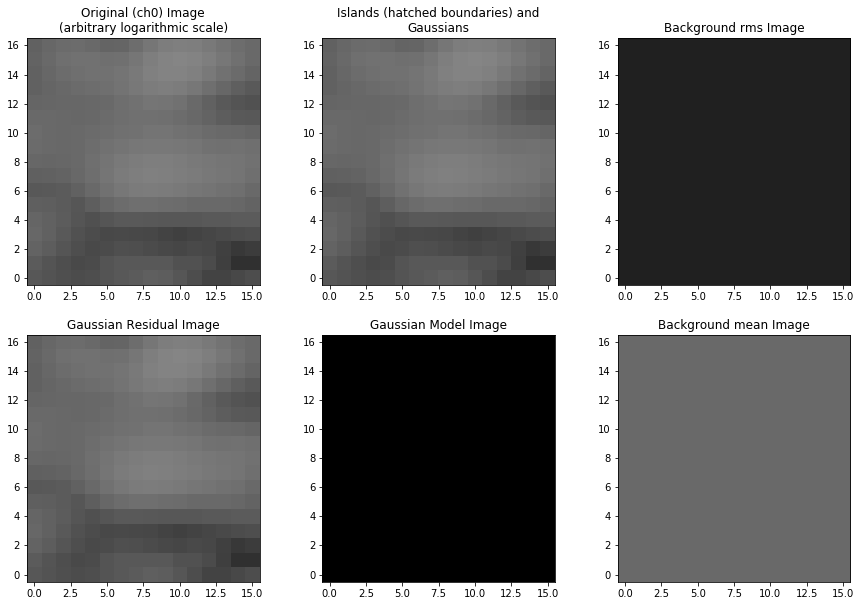

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_161.fits'
Image size .............................. : (15, 10) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.005 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.00173 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 0
--> Gr

161
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


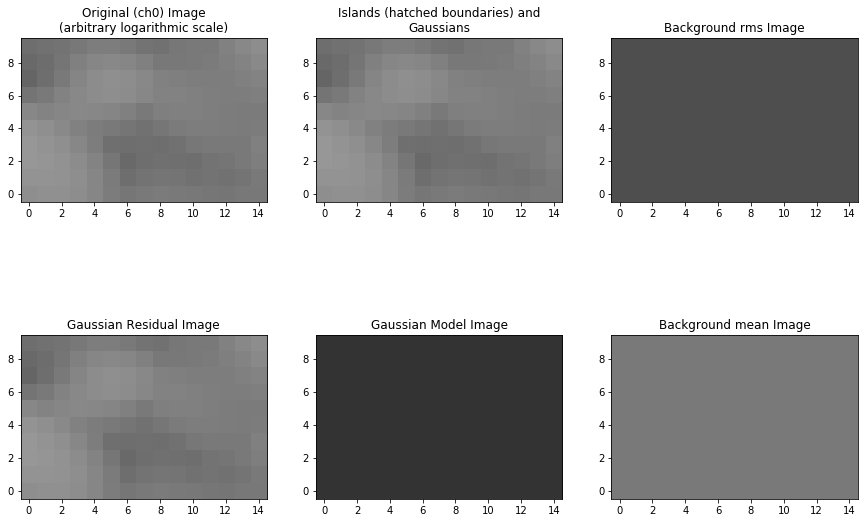

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_162.fits'
Image size .............................. : (23, 16) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.012 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.00187 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 0
--> Gr

162
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


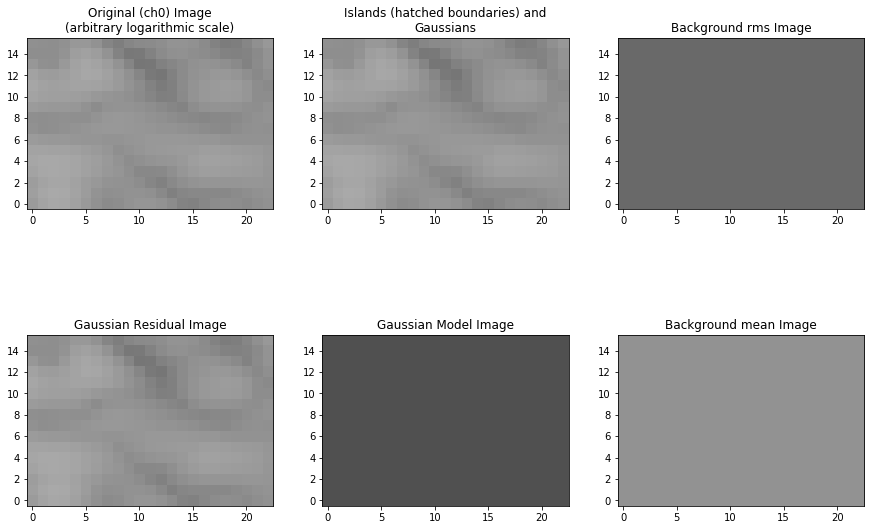

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_163.fits'
Image size .............................. : (21, 22) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.019 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.0023 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 0
--> Gro

163
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


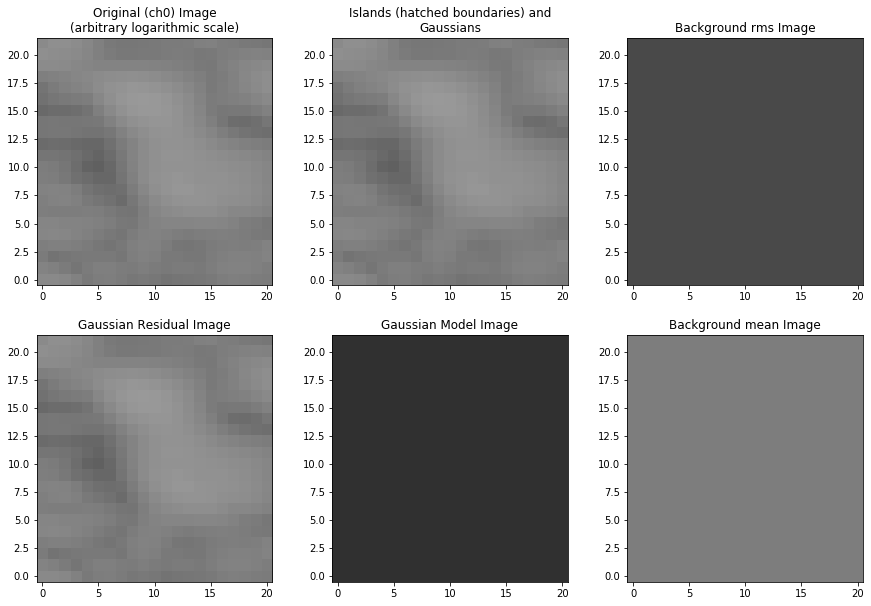

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_164.fits'
Image size .............................. : (23, 20) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.017 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.00232 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 0
--> Gr

164
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


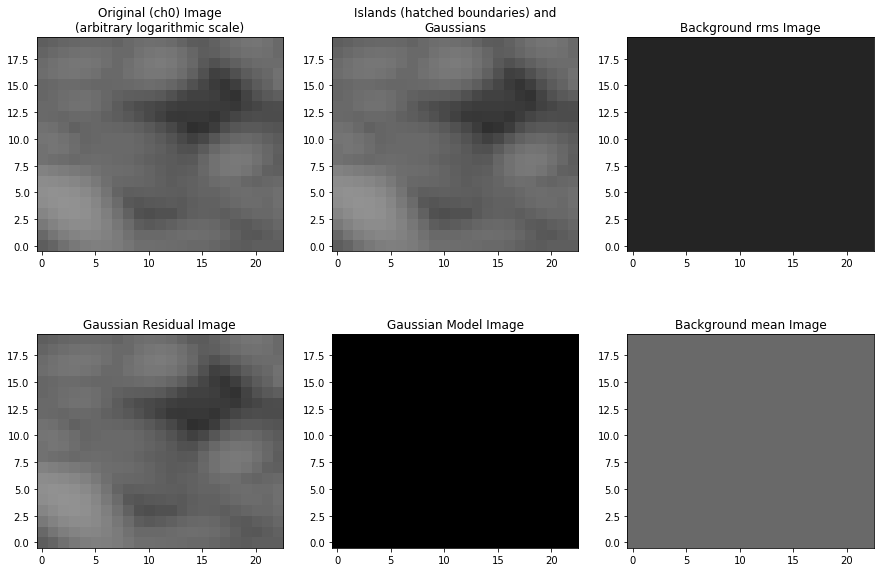

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_165.fits'
Image size .............................. : (33, 28) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.043 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 3) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.00194 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 1


Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 1
Total flux density in model ............. : 0.011 Jy
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 1


165
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


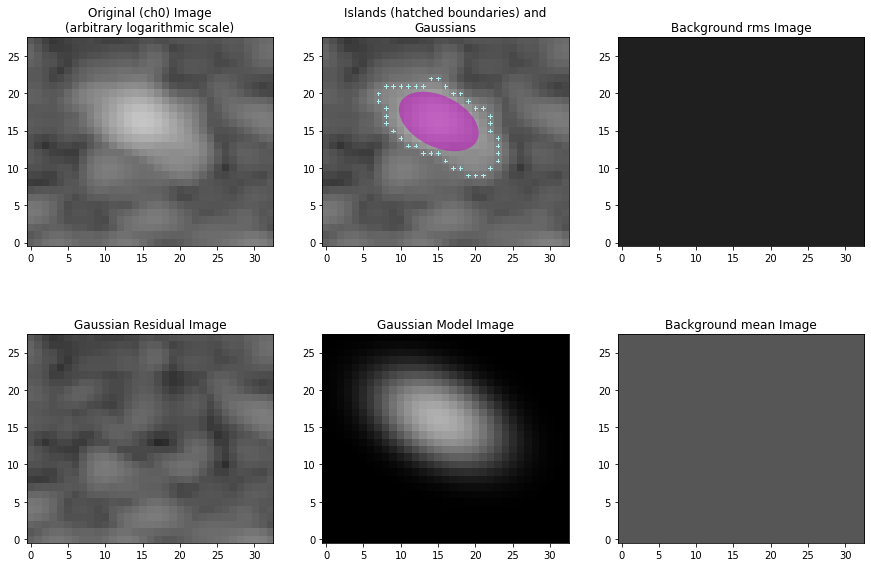

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_166.fits'
Image size .............................. : (22, 19) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.015 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.00212 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 0
--> Gr

166
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


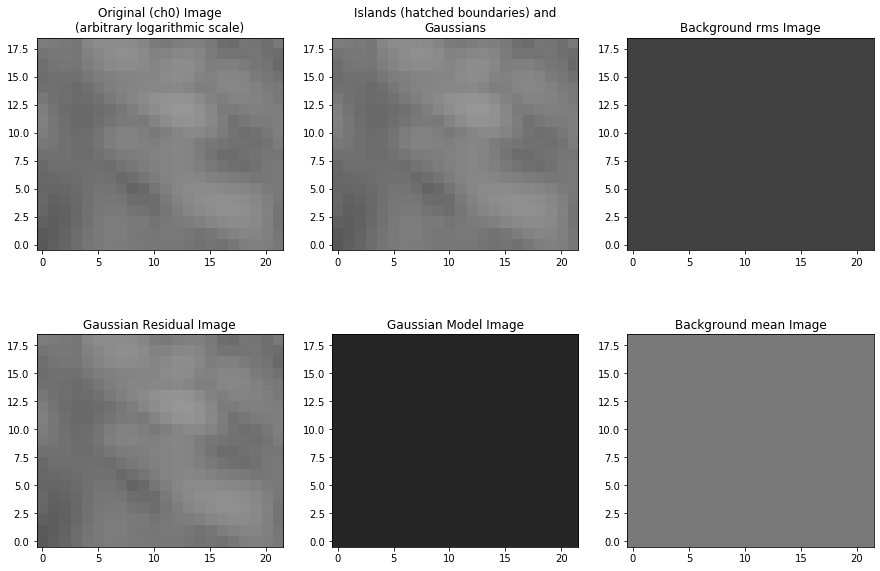

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_167.fits'
Image size .............................. : (12, 8) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.004 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.00247 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 0
--> Gro

167
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


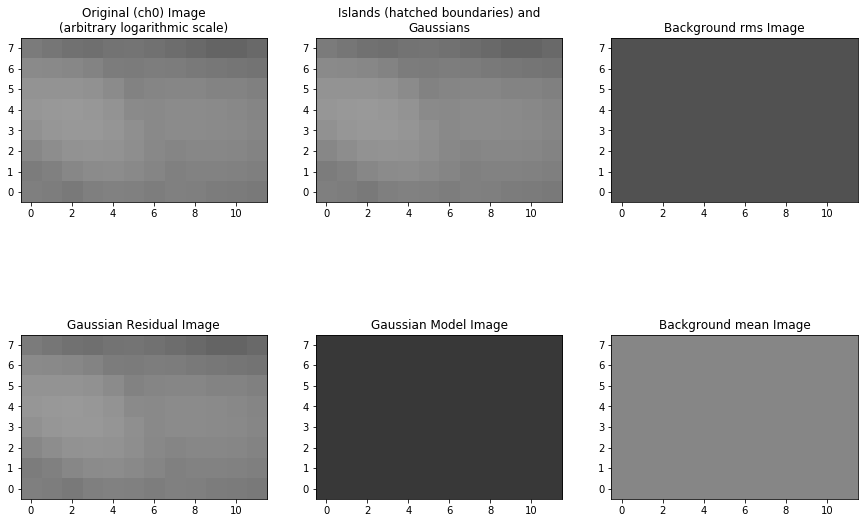

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_168.fits'
Image size .............................. : (44, 31) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.048 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 3) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.00182 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 1


Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 1
Total flux density in model ............. : 0.009 Jy
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 1


168
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


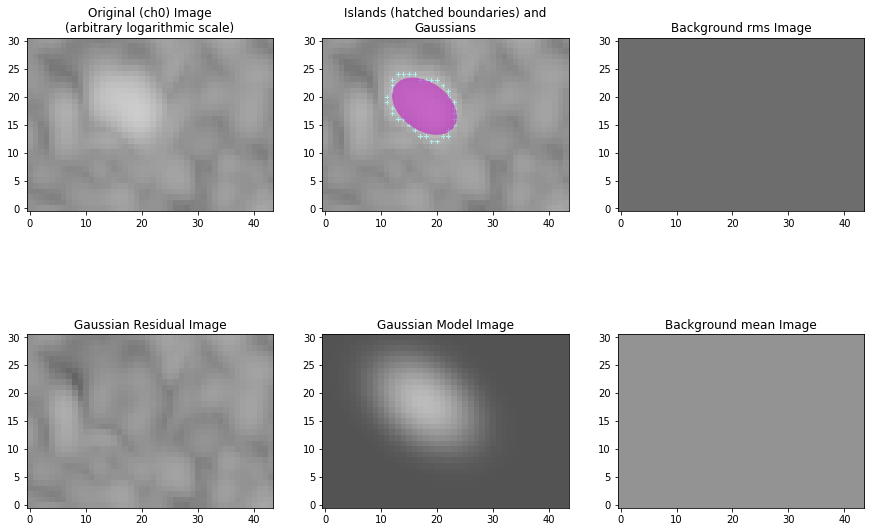

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_169.fits'
Image size .............................. : (18, 10) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.006 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.00234 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 0
--> Gr

169
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


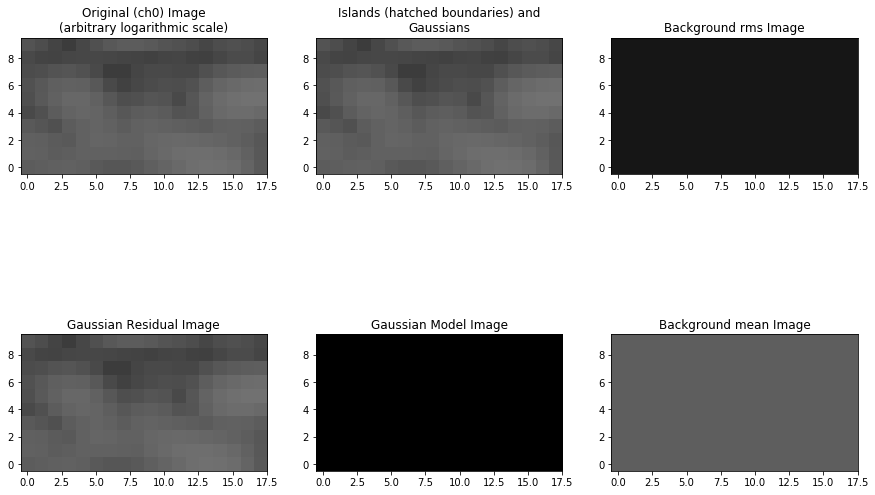

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_170.fits'
Image size .............................. : (23, 18) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.014 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.00175 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 0
--> Gr

170
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


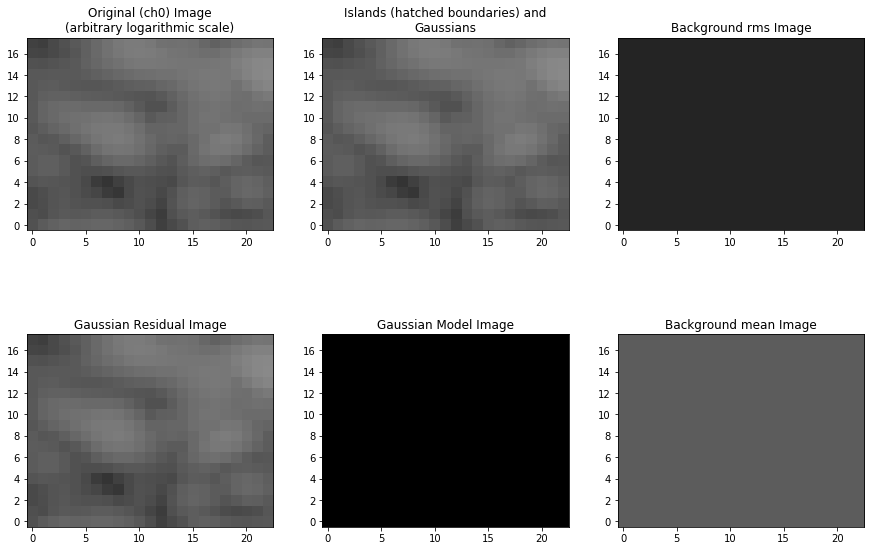

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_171.fits'
Image size .............................. : (37, 19) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.027 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.00221 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 0
--> Gr

171
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


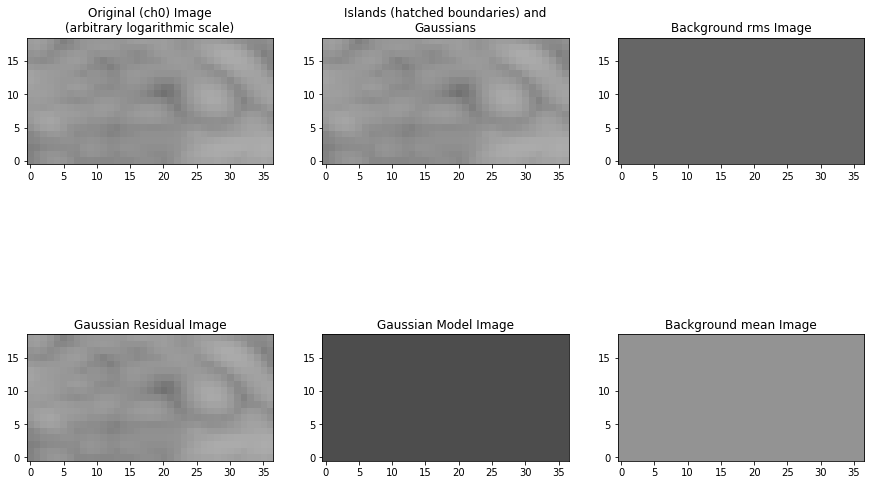

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_172.fits'
Image size .............................. : (15, 11) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.006 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.00199 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 0
--> Gr

172
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


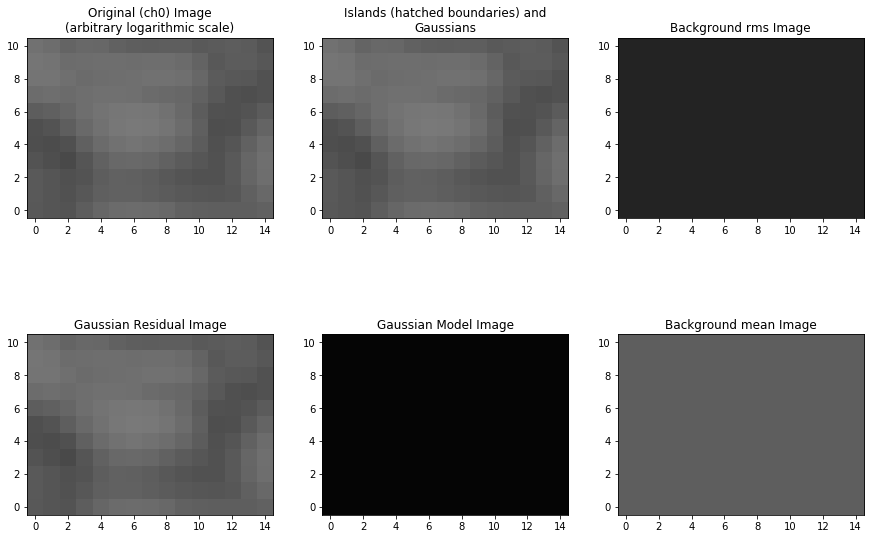

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_173.fits'
Image size .............................. : (32, 25) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.026 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.00192 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 0
--> Gr

173
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


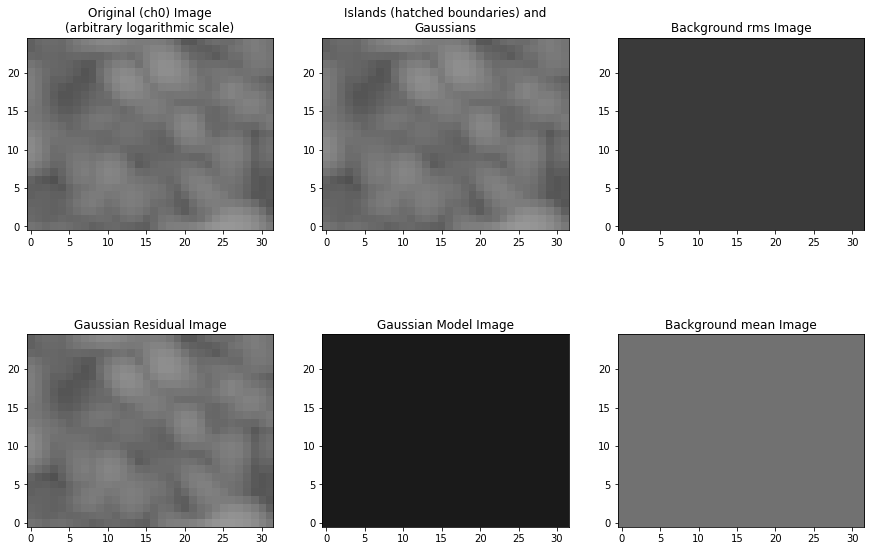

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_174.fits'
Image size .............................. : (20, 17) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.015 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.00232 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 0
--> Gr

174
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


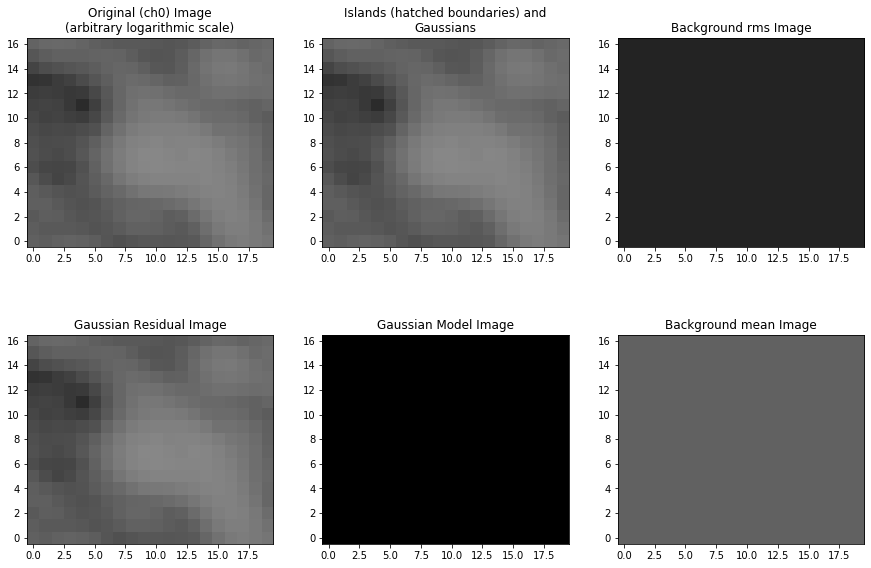

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_175.fits'
Image size .............................. : (21, 13) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.010 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.00241 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 0
--> Gr

175
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


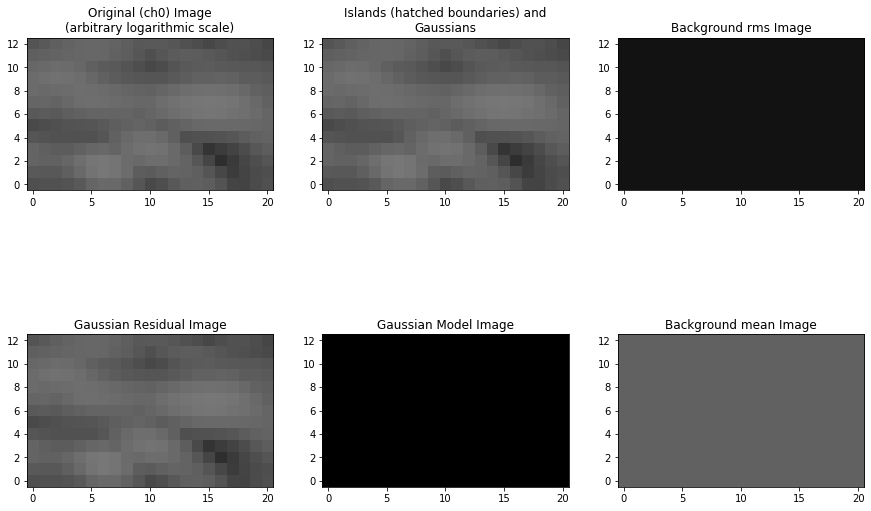

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_176.fits'
Image size .............................. : (24, 19) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.012 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.00148 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 0
--> Gr

176
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


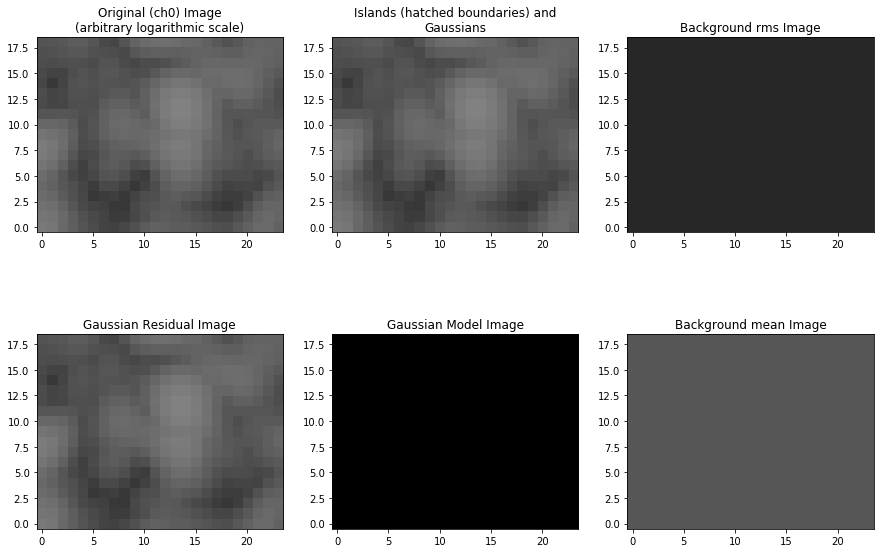

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_177.fits'
Image size .............................. : (12, 10) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.005 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.00242 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 0
--> Gr

177
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


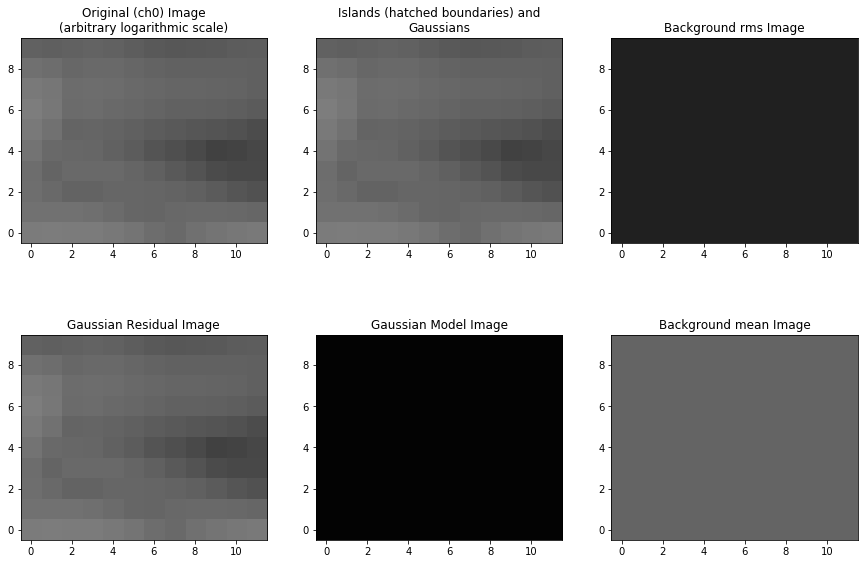

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_178.fits'
Image size .............................. : (50, 28) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.048 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 3) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.00185 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 1


Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 0
Total flux density in model ............. : 0.000 Jy
--> Grouping Gaussians into sources


Number of sources formed from Gaussians   : 0
    Island #0 (x=24, y=15)
Please check this island. If it is a valid island and
should be fit, try adjusting the flagging options (use
show_fit with "ch0_flagged=True" to see the flagged Gaussians)
or enabling the wavelet module (with "atrous_do=True").
To include empty islands in output source catalogs, set
incl_empty=True in the write_catalog task.


178
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


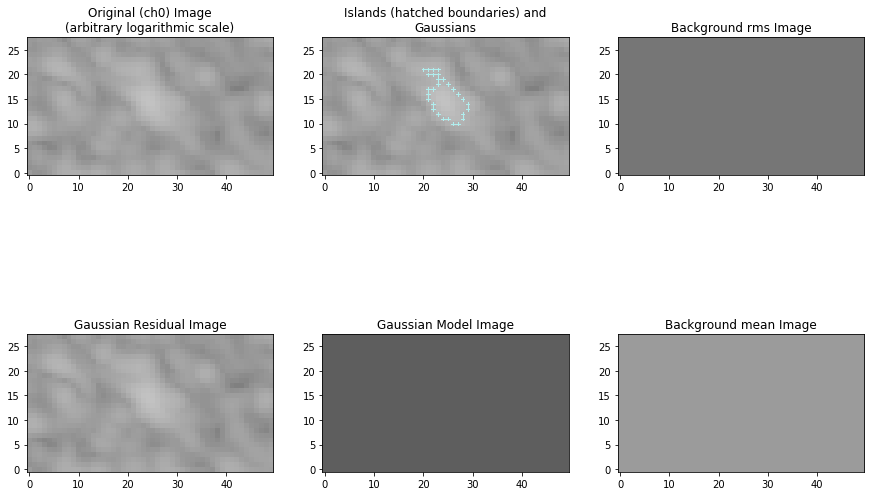

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_179.fits'
Image size .............................. : (23, 28) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.027 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.00256 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 0
--> Gr

179
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


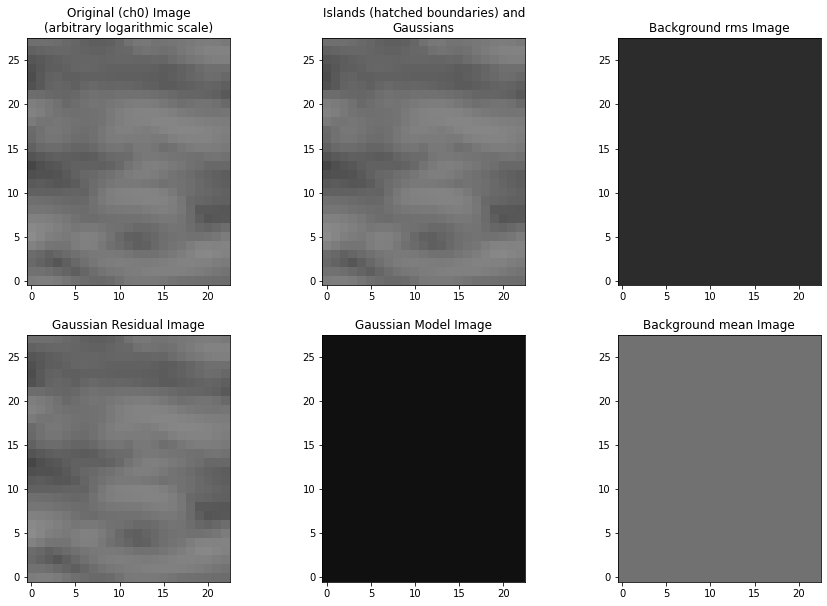

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_180.fits'
Image size .............................. : (25, 21) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.018 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.00209 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 0
--> Gr

180
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


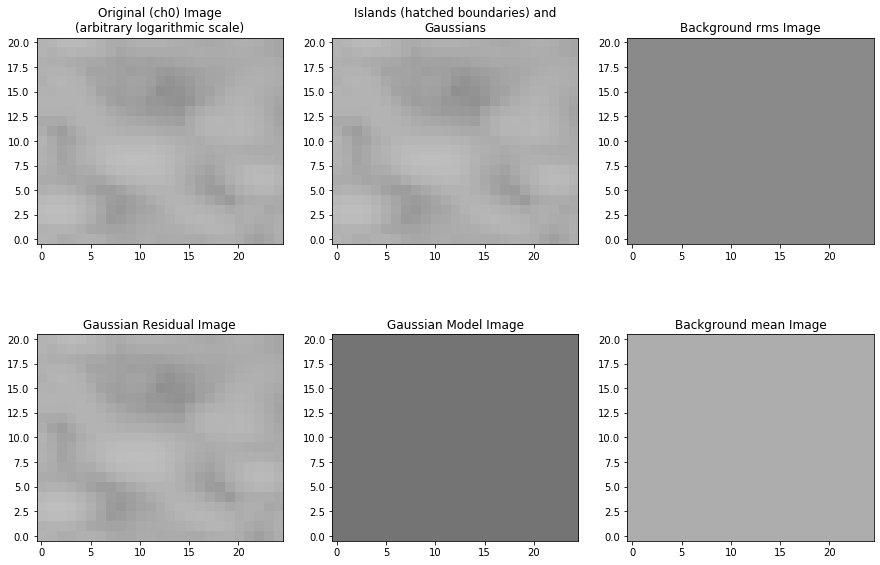

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_181.fits'
Image size .............................. : (16, 10) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.006 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.0023 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 0
--> Gro

181
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


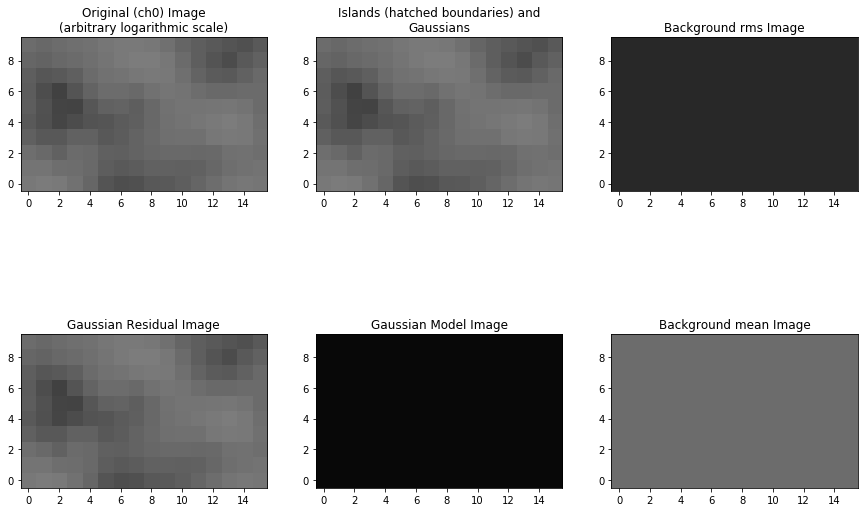

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_182.fits'
Image size .............................. : (16, 10) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.005 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.00198 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 0
--> Gr

182
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


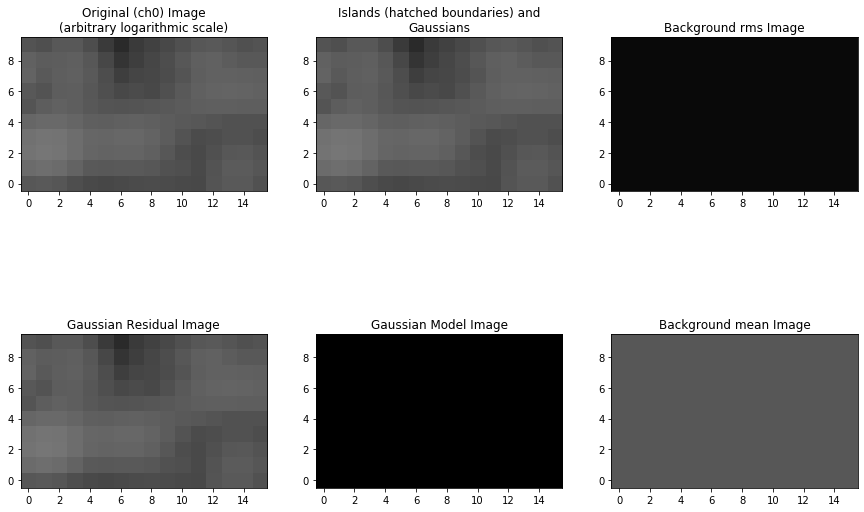

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_183.fits'
Image size .............................. : (26, 29) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.025 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 3) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.0021 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 0
--> Gro

183
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


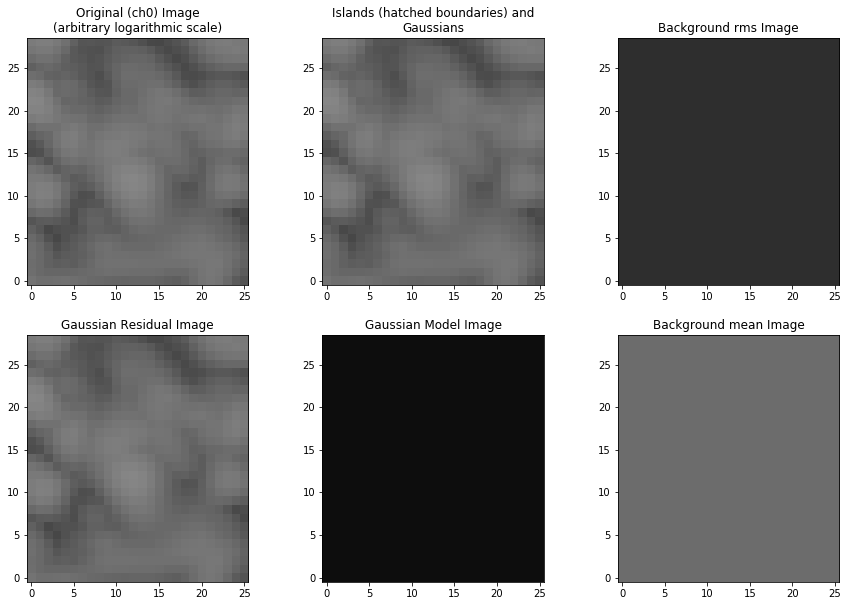

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_184.fits'
Image size .............................. : (31, 23) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.032 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.00248 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 1


Fitting islands with Gaussians .......... : [|] 0/1Fitting islands with Gaussians .......... : [=] 1/1

Total number of Gaussians fit to image .. : 1
Total flux density in model ............. : 0.003 Jy


--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 1


184
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


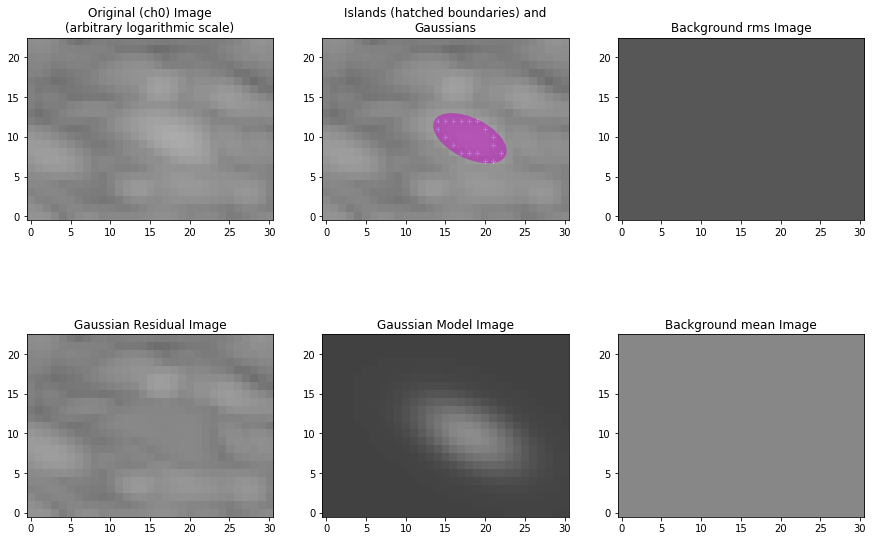

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_185.fits'
Image size .............................. : (14, 9) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.004 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.00174 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 0
--> Gro

185
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


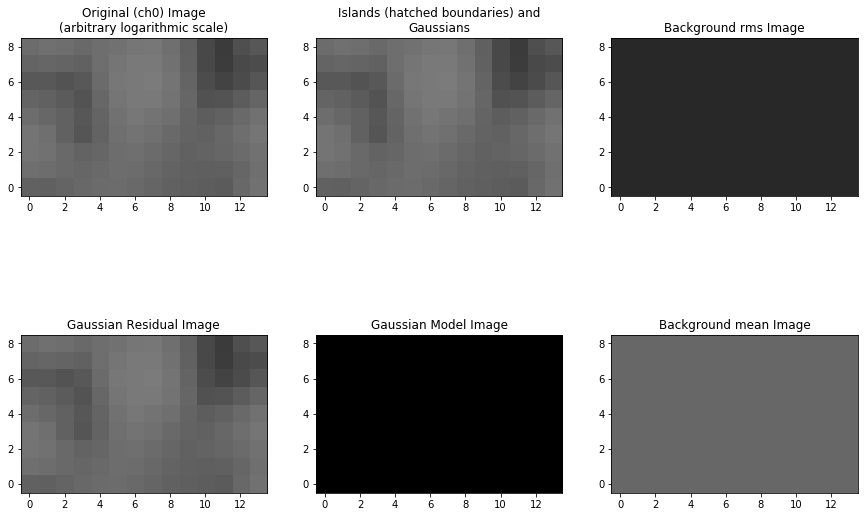

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_186.fits'
Image size .............................. : (30, 20) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.018 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.00176 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 0
--> Gr

186
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


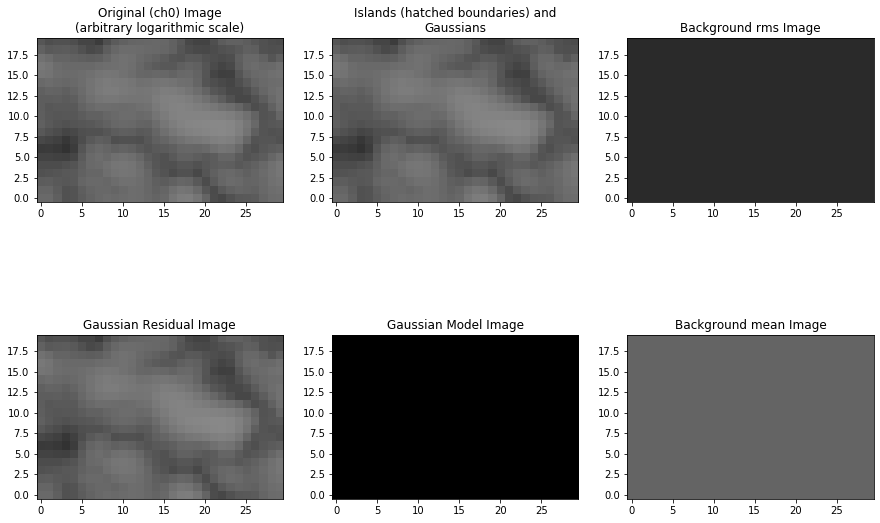

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_187.fits'
Image size .............................. : (22, 14) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.008 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 1) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.00142 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 0
--> Gr

187
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


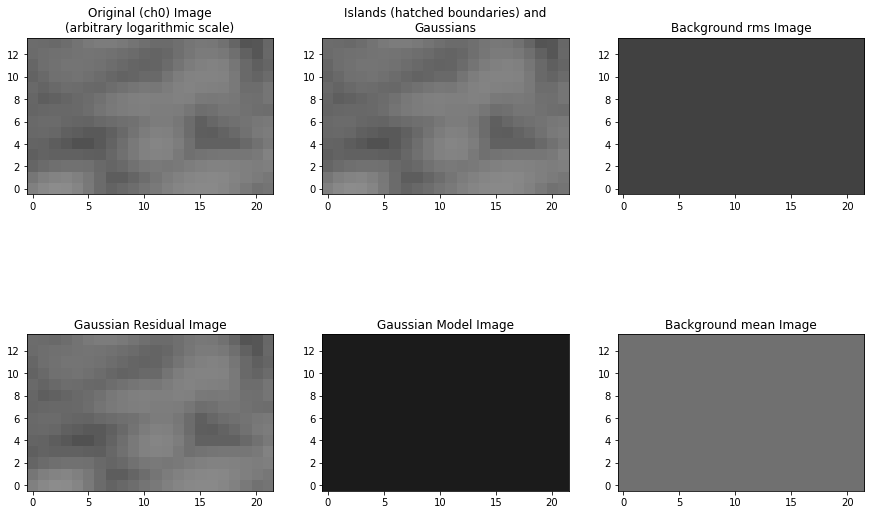

--> Opened '/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_188.fits'
Image size .............................. : (27, 23) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (5.91619e-03, 4.38077e-03, -0.7) degrees
Frequency of image ...................... : 743.991 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 0.018 Jy
--> Calculating background rms and mean images
Derived rms_box (box size, step size) ... : (32, 2) pixels
--> Size of rms_box larger than 1/4 of image size
--> Using constant background rms and mean
Value of background rms ................. : 4.92e-04 Jy/beam
Value of background mean ................ : 0.00177 Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of pixels per island ..... : 20
Number of islands found ................. : 0
--> Gr

188
NOTE -- With the mouse pointer in plot window:
  Press "i" ........ : Get integrated flux densities and mean rms
                       values for the visible portion of the image
  Press "m" ........ : Change min and max scaling values
  Press "n" ........ : Show / hide island IDs
  Press "0" ........ : Reset scaling to default
  Click Gaussian ... : Print Gaussian and source IDs (zoom_rect mode, 
                       toggled with the "zoom" button and indicated in 
                       the lower right corner, must be off)
________________________________________________________________________


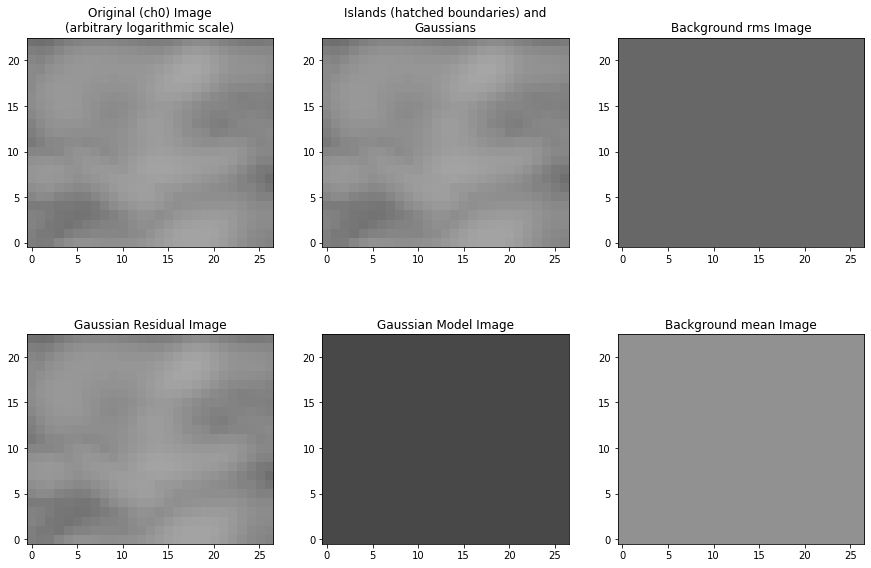

In [111]:
imgs_pi = []
for i in tqdm(range(len(peak_pi))):
    try:
        img = bdsf.process_image('/home/alger/possum/alger/hamburg/racs_04_rmsynthpi_{}.fits'.format(i),
                           rms_value=4.92e-04)  # A tiny RMS box so we don't accidentally encounter the source.
                                            # Need a better way to do this.
        print(i)
        img.show_fit()
        time.sleep(1)  # PyBDSF silences KeyboardInterrupts. :(
                       # Take a pause so we can interrupt if we have to.
    except IndexError:
        imgs_pi.append(None)
        continue
    imgs_pi.append(img)

We can now assemble a catalogue: islands and their polarisation properties.

In [121]:
total_flux_pm = []
total_flux_fit = []
peak_flux_pm = []
pas_fit = []
mean_pas_fit = []
for i, p in zip(imgs, imgs_pi):
    if p and p.islands:
        gaussians = [g for isl in p.islands for g in isl.gaul]
        tflux = sum(g.total_flux for g in gaussians)
        if not gaussians:
            continue
        total_flux_fit.append(tflux)
        peak_flux_fit.append(max(g.peak_flux for g in gaussians))
        pas = [1/2 * numpy.arctan2(g.total_flux_U, g.total_flux_Q)
               for isl in p.islands for g in isl.gaul if hasattr(g, 'total_flux_Q')]
        mean_pa = numpy.mean(pas)
        pas_fit.append(','.join(str(a) for a in pas))
        mean_pas_fit.append(mean_pa)
    else:
        total_flux_fit.append(0)
        peak_flux_fit.append(0)
    if i:
        total_flux_pm.append(sum(numpy.hypot(g.total_flux_Q, g.total_flux_U) for isl in i.islands for g in isl.gaul
                                 if hasattr(g, 'total_flux_Q')))
    else:
        total_flux_pm.append(0)

/home/alger/mimsy/conda/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3118: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)


ValueError: max() arg is an empty sequence

In [119]:
xs = []
ys = []
for i in imgs:
    if i:
        xs.append(sum(numpy.hypot(g.total_flux_Q, g.total_flux_U) for isl in i.islands for g in isl.gaul
                                 if hasattr(g, 'total_flux_Q')))
        ys.append(sum(g.tpol_fraction * g.total_flux for isl in i.islands for g in isl.gaul
                                 if hasattr(g, 'tpol_fraction')))

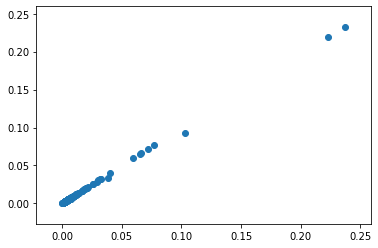

In [120]:
plt.scatter(xs, ys)

In [ ]:
plt.scatter(peak_flux_pm, peak_flux_fit)
plt.xscale('symlog', linthreshx=2e-3)
plt.yscale('symlog', linthreshy=2e-3)
xs = numpy.logspace(-3, 0)
plt.plot(xs, xs, color='grey', linestyle='--')

plt.xlim(0, 1e0)
plt.ylim(0, 1e0)
plt.xlabel('Polarisation module')
plt.ylabel('Source-finding on PI')

# plt.gca().set_aspect('equal')

In [103]:
((numpy.array(total_flux_pm) > 1e-1) & (numpy.array(total_flux_fit) < 1e-3)).nonzero()

(array([95]),)

For each of {fit to PPI, PM, fit to P}:
    stokes I + polarisation parameters:
    * peak flux
    * total flux
    * position at peak
    * PA
    * assumed RMS
    * 

In [118]:
dir(imgs[2].islands[0].gaul[0])

['__class__',
 '__delattr__',
 '__dict__',
 '__dir__',
 '__doc__',
 '__eq__',
 '__format__',
 '__ge__',
 '__getattribute__',
 '__gt__',
 '__hash__',
 '__init__',
 '__init_subclass__',
 '__le__',
 '__lt__',
 '__module__',
 '__ne__',
 '__new__',
 '__reduce__',
 '__reduce_ex__',
 '__repr__',
 '__setattr__',
 '__sizeof__',
 '__str__',
 '__subclasshook__',
 '__weakref__',
 'centre_pix',
 'centre_pixE',
 'centre_pixE_def',
 'centre_pix_def',
 'centre_sky',
 'centre_skyE',
 'centre_skyE_def',
 'centre_sky_def',
 'code',
 'code_def',
 'cpol_fraction',
 'cpol_fraction_def',
 'cpol_fraction_hierr',
 'cpol_fraction_hierr_def',
 'cpol_fraction_loerr',
 'cpol_fraction_loerr_def',
 'deconv_size_sky',
 'deconv_size_skyE',
 'deconv_size_skyE_def',
 'deconv_size_skyE_uncorr',
 'deconv_size_skyE_uncorr_def',
 'deconv_size_sky_def',
 'deconv_size_sky_uncorr',
 'deconv_size_sky_uncorr_def',
 'e_spec_indx_def',
 'flag',
 'flag_def',
 'gaus_num',
 'gaus_num_def',
 'gaussian_idx',
 'gresid_mean',
 'gresid_me